In [1]:
import pypsa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('bmh')
%matplotlib inline

In [2]:
def set_parameters_from_optimized(n,n_optim):
    links_i = n.links.index
    n.links.loc[links_i, 'p_nom'] = n_optim.links['p_nom_opt'].reindex(links_i, fill_value=0.)
    n.links.loc[links_i, 'p_nom_extendable'] = False

    gen_extend_i = n.generators.index[n.generators.p_nom_extendable]
    n.generators.loc[gen_extend_i, 'p_nom'] = n_optim.generators['p_nom_opt'].reindex(gen_extend_i, fill_value=0.)
    n.generators.loc[gen_extend_i, 'p_nom_extendable'] = False


    stores_extend_i = n.stores.index[n.stores.e_nom_extendable]
    n.stores.loc[stores_extend_i, 'e_nom'] = n_optim.stores['e_nom_opt'].reindex(stores_extend_i,fill_value=0.)
    n.stores.loc[stores_extend_i, 'e_nom_extendable'] = False
    
    return n

def prepare_network(n):
    n.add("Generator", "load_shedding",
                bus="elec",
                carrier='load',
                marginal_cost=1e6,  # Eur/kWh
                p_nom=1e9  # kW
                )
   # n.loads["p_set"]=n.loads["p_set"]+50
    return n

def get_storeage_bid_de(n, snapshots, bus, charger, discharger):
    charge_efficiency = n.links.efficiency[charger]
    discharge_efficiency = n.links.efficiency[discharger]
    #λ = n.stores_t.mu_state_of_charge.loc[snapshots,"DE H2 storage"]
    λ = n.buses_t.marginal_price.loc[snapshots, bus] 
    if "mu_lower_e" in n.stores_t:
        if bus + " storage" in n.stores_t.mu_lower_e.columns:
            mu_lower = n.stores_t.mu_lower_e.loc[snapshots, bus + " storage"]
        else: mu_lower =0
        if bus + " storage" in n.stores_t.mu_upper_e.columns:
            mu_upper = n.stores_t.mu_upper_e.loc[snapshots, bus + " storage"]
        else: mu_upper=0
    charging_bid = charge_efficiency*λ
    discharging_bid =  λ#/discharge_efficiency
    return charging_bid, discharging_bid  



def solve_network_de_rh_sp(n, opti_n, add_h2_bidding, add_battery_didding, rh_each_snapshot, rh_2w):
    solver_name = "gurobi"

    freq = 3


    length = len(n.snapshots)
    if rh_each_snapshot == True:
        loop_num = len(n.snapshots)-1
        kept = 1
        overlap = 0
        
    if rh_2w == True:
        window = 14 * 24 // freq
        overlap = 7 * 24 // freq
        kept = window - overlap
        loop_num = length // kept
        
        
    if add_h2_bidding == True:
        h2_charging_bid, h2_discharging_bid = get_storeage_bid_de(opti_n,n.snapshots, "DE H2", "DE H2 electrolysis", "DE H2 to power")
        n.links_t.marginal_cost["DE H2 electrolysis"] = 0
        n.links_t.marginal_cost.loc[n.snapshots, "DE H2 electrolysis"] = - h2_charging_bid
        n.links_t.marginal_cost["DE H2 to power"] = 0
        n.links_t.marginal_cost.loc[n.snapshots, "DE H2 to power"] = h2_discharging_bid
    if add_battery_didding == True:
        battery_charging_bid, battery_discharging_bid = get_storeage_bid_de(opti_n,n.snapshots, "DE battery", "DE battery charge", "DE battery discharge")
        n.links_t.marginal_cost["DE battery charge"] = 0
        n.links_t.marginal_cost.loc[n.snapshots, "DE battery charge"] = - battery_charging_bid
        n.links_t.marginal_cost["DE battery discharge"] = 0
        n.links_t.marginal_cost.loc[n.snapshots, "DE battery discharge"] = battery_discharging_bid

    for i in range(loop_num):
        # set initial state of charge
        snapshots = n.snapshots[i * kept:(i + 1) * kept + overlap]        
        if i == 0:
            n.stores.e_initial = opti_n.stores_t.e.iloc[0]
            n.storage_units.state_of_charge_initial = opti_n.storage_units_t.state_of_charge.iloc[-1]
        else:
            n.stores.e_initial = n.stores_t.e.iloc[i * kept - 1]

            n.storage_units.state_of_charge_initial = n.storage_units_t.state_of_charge.iloc[i * kept - 1]
        #n.lopf(pyomo=False, solver_name="gurobi", solver_logfile=None, snapshots=snapshots,  keep_shadowprices=True)
        pypsa.linopf.network_lopf(n,snapshots,solver_name="gurobi", solver_logfile=None,
                                     keep_shadowprices=True)
    
    return n

In [3]:
def drop_solved_components(n):
    for key in n_de.buses_t.keys(): #buses_t
        n.buses_t[key] = n.buses_t[key].drop(n.buses_t[key].columns, axis=1)
    
    for key in n_de.lines_t.keys(): #lines_t
        n.lines_t[key] = n.lines_t[key].drop(n.lines_t[key].columns, axis=1)

    for key in n_de.links_t.keys(): #lines_t
        n.links_t[key] = n.links_t[key].drop(n.links_t[key].columns, axis=1)
        
    for key in n_de.storage_units_t.keys(): #storage_units_t
        n.storage_units_t[key] = n.storage_units_t[key].drop(n.storage_units_t[key].columns, axis=1)
        
    for key in list(set(n_de.stores_t.keys())-set(['p', 'e'])): #stores_t #1
        n.stores_t[key] = n.stores_t[key].drop(n.stores_t[key].columns, axis=1)
        
    for key in ['e','p']: #stores_t #2
        n_de.stores_t[key]=pd.DataFrame(index=n_de.stores_t[key].index, columns=n_de.stores_t[key].columns, data=0)

    for key in list(set(n_de.generators_t.keys())-set(['p_max_pu'])): #generators_t
        n.generators_t[key] = n.generators_t[key].drop(n.generators_t[key].columns, axis=1)
        
    return n

In [4]:
# Perfect foresight:  sovled network
n_de = pypsa.Network("data/DE-2050-steel_tanks.nc")

Importing PyPSA from older version of PyPSA than current version 0.17.1.
Please read the release notes at https://pypsa.org/doc/release_notes.html
carefully to prepare your network for import.

INFO:pypsa.io:Imported network DE-2050-steel_tanks.nc has buses, generators, links, loads, stores


In [5]:
n_network = n_de.copy()
n_network.lopf(pyomo=False, solver_name="gurobi", solver_logfile=None, keep_shadowprices=True )

INFO:numexpr.utils:NumExpr defaulting to 8 threads.
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.4s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Using license file /Users/linyang/gurobi.lic
Academic license - for non-commercial use only - expires 2021-03-28
Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s_0maorj.lp
Reading time = 0.20 seconds
obj: 61336 rows, 29208 columns, 121243 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 61336 rows, 29208 columns and 121243 nonzeros
Model fingerprint: 0x95e94113
Coefficient statistics:
  Matrix range     [1e-03, 3e+00]
  Objective range  [9e+02, 9e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Presolve removed 33549 rows and 7254 columns
Presolve time: 0.17s
Presolved: 27787 rows, 21954 columns, 77521 nonzeros

Ordering time: 0.01s

Barrier statistics:
 Dense cols : 7
 AA' NZ     : 6.433e+04
 Factor NZ  : 4.520e+05 (roughly 2

INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+06


('ok', 'optimal')

In [6]:
n_operation = n_de.copy()
n_operation = set_parameters_from_optimized(n_operation,n_network)
n_operation = prepare_network(n_operation)
#operation_network.loads["p_set"]=operation_network.loads["p_set"]+50
n_operation.lopf(pyomo=False, solver_name="gurobi", solver_logfile=None, keep_shadowprices=True)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.35s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fvl6fi0e.lp
Reading time = 0.14 seconds
obj: 67160 rows, 32120 columns, 105120 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 67160 rows, 32120 columns and 105120 nonzeros
Model fingerprint: 0x99073a95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Presolve removed 58400 rows and 12150 columns
Presolve time: 0.10s
Presolved: 8760 rows, 19970 columns, 37490 nonzeros

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 1.168e+04
 Factor NZ  : 1.051e+05 (roughly 12 MBytes of memory)
 Factor Ops : 1.424e+06 (less than 1 second per iteration)
 Threads    : 3

                  Objective      

('warning', 'infeasible or unbounded')

In [7]:
window = 14 * 24 // 1
overlap = 7 * 24 // 1
kept = window - overlap

i=0

snapshots = n_de.snapshots[i * kept:(i + 1) * kept + overlap]
snapshots[-1]

Timestamp('2015-02-11 21:00:00')

In [8]:
#n_de_rh.stores_t.p.loc['2015-02-12 00:00:00']

In [9]:
n_de_rh = n_de.copy()
n_de_rh = drop_solved_components(n_de_rh)
n_de_rh = set_parameters_from_optimized(n_de_rh, n_operation)
n_de_rh = prepare_network(n_de_rh)
n_de_rh.stores.e_cyclic = False
n_de_rh = solve_network_de_rh_sp(n_de_rh, n_operation, add_h2_bidding = False, add_battery_didding = False, rh_each_snapshot = False, rh_2w = True)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yp6l42yk.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xd6f4d041
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2292 rows and 506 columns
Presolve time: 0.01s
Presolved: 284 rows, 726 columns, 1344 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.943860e+02   0.000000e+00      0s
     138    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 138 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xkcgi2q1.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x547af381
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2240 rows and 454 columns
Presolve time: 0.01s
Presolved: 336 rows, 778 columns, 1448 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.096550e+02   0.000000e+00      0s
     385    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 385 iterations and 0.02 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hss41je5.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xb5940df3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2259 rows and 467 columns
Presolve time: 0.01s
Presolved: 317 rows, 765 columns, 1416 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.485880e+02   0.000000e+00      0s

Solved in 250 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lfk9dsvt.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xbb8bdda7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 2016 rows and 224 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4to8asb3.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xd301f2d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2275 rows and 484 columns
Presolve time: 0.01s
Presolved: 301 rows, 748 columns, 1383 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.754780e+02   0.000000e+00      0s
     392    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 392 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-en0g74gx.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x16ecdfc7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2245 rows and 458 columns
Presolve time: 0.01s
Presolved: 331 rows, 774 columns, 1439 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.187251e+02   0.000000e+00      0s

Solved in 411 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mmp0v6ep.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x9b87b4af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2016 rows and 226 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gmvgsdcg.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xcc76300a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 462 columns
Presolve time: 0.01s
Presolved: 336 rows, 770 columns, 1440 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.785619e+01   0.000000e+00      0s
     285    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 285 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ogou864g.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x16734dad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 464 columns
Presolve time: 0.01s
Presolved: 336 rows, 768 columns, 1438 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.555016e+01   0.000000e+00      0s
     297    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 297 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-me0268q0.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xb12bf7df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2240 rows and 462 columns
Presolve time: 0.01s
Presolved: 336 rows, 770 columns, 1440 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.846516e+01   0.000000e+00      0s
     349    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 349 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h2t2kwaq.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x3a14f811
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2241 rows and 467 columns
Presolve time: 0.01s
Presolved: 335 rows, 765 columns, 1434 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.743912e+01   0.000000e+00      0s
     338    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 338 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jg2tkyaz.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xbfa3ecfe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2240 rows and 470 columns
Presolve time: 0.01s
Presolved: 336 rows, 762 columns, 1432 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.279242e+01   0.000000e+00      0s
     300    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 300 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6nbgveod.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x482d3454
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 2241 rows and 472 columns
Presolve time: 0.01s
Presolved: 335 rows, 760 columns, 1429 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.123379e+01   0.000000e+00      0s
     231    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 231 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0y648ri.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x7668b7d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2240 rows and 478 columns
Presolve time: 0.01s
Presolved: 336 rows, 754 columns, 1424 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.568002e+01   0.000000e+00      0s
     279    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 279 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-20ntab3v.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x4b402f3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2241 rows and 485 columns
Presolve time: 0.01s
Presolved: 335 rows, 747 columns, 1416 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.970326e+01   0.000000e+00      0s
     242    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 242 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rf_lv23f.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x101a7b77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 479 columns
Presolve time: 0.01s
Presolved: 336 rows, 753 columns, 1423 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.329273e+01   0.000000e+00      0s
     255    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 255 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2k2thssk.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe274bb7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 476 columns
Presolve time: 0.01s
Presolved: 336 rows, 756 columns, 1426 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.657599e+01   0.000000e+00      0s
     254    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 254 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_8lsls1_.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xb978ee0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 2240 rows and 482 columns
Presolve time: 0.01s
Presolved: 336 rows, 750 columns, 1420 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.960819e+01   0.000000e+00      0s
     216    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 216 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-blvthamf.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xd80ea10b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 2240 rows and 483 columns
Presolve time: 0.01s
Presolved: 336 rows, 749 columns, 1419 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.962231e+01   0.000000e+00      0s
     220    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 220 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hf3kn9n8.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xf30ba7d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 2240 rows and 474 columns
Presolve time: 0.01s
Presolved: 336 rows, 758 columns, 1428 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.980113e+01   0.000000e+00      0s
     286    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 286 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9lvnidr8.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x874266eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 2240 rows and 476 columns
Presolve time: 0.01s
Presolved: 336 rows, 756 columns, 1426 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.630292e+01   0.000000e+00      0s
     261    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 261 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7t6a7w5b.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x26181380
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2240 rows and 482 columns
Presolve time: 0.01s
Presolved: 336 rows, 750 columns, 1420 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.800719e+01   0.000000e+00      0s
     211    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 211 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k4wo2wlc.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xd54bb84e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2240 rows and 480 columns
Presolve time: 0.01s
Presolved: 336 rows, 752 columns, 1422 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.134100e+01   0.000000e+00      0s
     241    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 241 iterations and 0.02 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8udowiwy.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x4061e2cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 471 columns
Presolve time: 0.01s
Presolved: 336 rows, 761 columns, 1431 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.008550e+01   0.000000e+00      0s
     261    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 261 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y2eptasq.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa80e54e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 471 columns
Presolve time: 0.01s
Presolved: 336 rows, 761 columns, 1431 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.024200e+01   0.000000e+00      0s
     263    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 263 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wsfasq5p.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x55d3b05f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 483 columns
Presolve time: 0.01s
Presolved: 336 rows, 749 columns, 1419 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.911288e+01   0.000000e+00      0s
     226    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 226 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlxrndls.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x80be668f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2240 rows and 481 columns
Presolve time: 0.01s
Presolved: 336 rows, 751 columns, 1421 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.112340e+01   0.000000e+00      0s
     225    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 225 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1_zzbdlc.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x4fd576ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 2240 rows and 479 columns
Presolve time: 0.01s
Presolved: 336 rows, 753 columns, 1423 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.466856e+01   0.000000e+00      0s
     257    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 257 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f_w4mz2i.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x508967d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 2241 rows and 484 columns
Presolve time: 0.01s
Presolved: 335 rows, 748 columns, 1417 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.852835e+01   0.000000e+00      0s
     195    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 195 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hqiq1h90.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x12638c1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2240 rows and 485 columns
Presolve time: 0.01s
Presolved: 336 rows, 747 columns, 1417 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.612554e+01   0.000000e+00      0s
     181    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 181 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tyisccke.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa704aa8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2240 rows and 482 columns
Presolve time: 0.01s
Presolved: 336 rows, 750 columns, 1420 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.053544e+01   0.000000e+00      0s
     227    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 227 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9rp9m8wq.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x671d25f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2240 rows and 470 columns
Presolve time: 0.01s
Presolved: 336 rows, 762 columns, 1432 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.334393e+01   0.000000e+00      0s
     332    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 332 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-amxhsmgd.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe8190cdf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2240 rows and 471 columns
Presolve time: 0.01s
Presolved: 336 rows, 761 columns, 1431 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.252638e+01   0.000000e+00      0s

Solved in 361 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eru4yc0j.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x49e12eba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2016 rows and 242 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tzqk7co9.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xcd8f8802
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2294 rows and 527 columns
Presolve time: 0.01s
Presolved: 282 rows, 705 columns, 1321 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.739467e+02   0.000000e+00      0s
     260    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 260 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4fjwslby.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x5f735ad9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 2262 rows and 494 columns
Presolve time: 0.01s
Presolved: 314 rows, 738 columns, 1385 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.122137e+02   0.000000e+00      0s
     263    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 263 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4m7r9t_w.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x1678e965
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 2240 rows and 462 columns
Presolve time: 0.01s
Presolved: 336 rows, 770 columns, 1440 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.797497e+01   0.000000e+00      0s
     284    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 284 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g0nru1fo.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x049d4209
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 2240 rows and 466 columns
Presolve time: 0.01s
Presolved: 336 rows, 766 columns, 1436 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.589663e+01   0.000000e+00      0s
     332    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 332 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gs8r5arm.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa20459d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 2240 rows and 468 columns
Presolve time: 0.01s
Presolved: 336 rows, 764 columns, 1434 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.503243e+01   0.000000e+00      0s
     359    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 359 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lx9qti_t.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe38062c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 2240 rows and 461 columns
Presolve time: 0.01s
Presolved: 336 rows, 771 columns, 1441 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.034587e+02   0.000000e+00      0s

Solved in 393 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fu5citur.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x11e692f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2243 rows and 458 columns
Presolve time: 0.01s
Presolved: 333 rows, 774 columns, 1438 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.152392e+02   0.000000e+00      0s

Solved in 217 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4eaogvkr.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xed6b9965
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2283 rows and 494 columns
Presolve time: 0.01s
Presolved: 293 rows, 738 columns, 1365 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.688611e+02   0.000000e+00      0s
     398    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 398 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbpj6kin.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x07e216de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 2265 rows and 481 columns
Presolve time: 0.01s
Presolved: 311 rows, 751 columns, 1396 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.524640e+02   0.000000e+00      0s

Solved in 382 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wvadgngc.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x14c5c8aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 2016 rows and 230 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-06rvsh05.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x72343aaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2241 rows and 455 columns
Presolve time: 0.01s
Presolved: 335 rows, 777 columns, 1446 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.058570e+02   0.000000e+00      0s
     190    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 190 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vg3vhrhe.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xf66924b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 454 columns
Presolve time: 0.01s
Presolved: 336 rows, 778 columns, 1448 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.056080e+02   0.000000e+00      0s
     324    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 324 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yb4eyf5k.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xc4dde2fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2245 rows and 455 columns
Presolve time: 0.01s
Presolved: 331 rows, 777 columns, 1442 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.165571e+02   0.000000e+00      0s

Solved in 296 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-595dernm.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xae883068
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2243 rows and 457 columns
Presolve time: 0.01s
Presolved: 333 rows, 775 columns, 1439 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.073673e+02   0.000000e+00      0s

Solved in 173 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2a9qo05m.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xc2d69073
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2270 rows and 483 columns
Presolve time: 0.01s
Presolved: 306 rows, 749 columns, 1389 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.601946e+02   0.000000e+00      0s
     391    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 391 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-swz0482v.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x4be6e2e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2247 rows and 458 columns
Presolve time: 0.01s
Presolved: 329 rows, 774 columns, 1437 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.211449e+02   0.000000e+00      0s

Solved in 375 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-42qevurb.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xd2b97ecf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2240 rows and 453 columns
Presolve time: 0.00s
Presolved: 336 rows, 779 columns, 1449 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.063209e+02   0.000000e+00      0s

Solved in 135 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-udvfb9dz.lp
Reading time = 0.00 seconds
obj: 1472 rows, 704 columns, 2302 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 1472 rows, 704 columns and 2302 nonzeros
Model fingerprint: 0xed469bcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 1319 rows and 298 columns
Presolve time: 0.00s
Presolved: 153 rows, 406 columns, 749 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.285829e+02   0.000000e+00      0s
     129    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 129 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00


In [10]:
n_de_rh_sp_h2 = n_de.copy()
n_de_rh_sp_h2 = drop_solved_components(n_de_rh_sp_h2)
n_de_rh_sp_h2 = set_parameters_from_optimized(n_de_rh_sp_h2, n_operation)
n_de_rh_sp_h2 = prepare_network(n_de_rh_sp_h2)
n_de_rh_sp_h2.stores.e_cyclic = False
n_de_rh_sp_h2 = solve_network_de_rh_sp(n_de_rh_sp_h2, n_operation, add_h2_bidding = True, add_battery_didding = False, rh_each_snapshot = True, rh_2w = False)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-en74q_ab.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4dc0dfca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.106514e+00   0.000000e+00      0s
       2   -1.1890461e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.189046148e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lhxb6s6d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbff7577
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.053764e+00   0.000000e+00      0s
       2    4.5446966e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.544696556e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7gcf0w4p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf763858f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.790000e-01   0.000000e+00      0s
       2    3.8455772e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.845577208e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ydnpzjmd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83f1bab6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kk_jkk5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83f83dd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-967rvpsl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabfe46dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.744130e-01   0.000000e+00      0s
       2   -4.1895543e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.189554326e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.19e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2uldm2k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0dd1422c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.785930e-01   0.000000e+00      0s
       2   -1.2978911e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.297891074e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yck3c_7l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9bf0f85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-etsfam99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x277c10d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cvxkpf51.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe56b1d3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gujvxa79.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f812fd7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ifha2fhv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75456651
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gqyy37ss.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb35c13ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8u_oaj8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc940949b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hj0lctgv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x069bc867
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wkx_8tq6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bc903e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgguhlgf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x662dc6ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hlg901jo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49524244
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ndwsafnq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6615439
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.251700e-02   0.000000e+00      0s
       2   -2.2677455e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.267745521e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wf_yz431.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37f1d3b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-osy1mno_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5049dca8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y7v1shd3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c2420f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.691400e-01   0.000000e+00      0s
       2   -8.9147199e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.914719877e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.91e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9jvvr1pa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba20e20e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.598680e-01   0.000000e+00      0s
       2   -4.8424048e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.842404847e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.84e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nb85tov5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x435b1eb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.637270e-01   0.000000e+00      0s
       2   -9.1576817e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.157681711e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qtuziffr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90c18bc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.338530e-01   0.000000e+00      0s
       2   -1.9475548e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.947554770e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tadx8iqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x474dafd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.245700e-01   0.000000e+00      0s
       2   -1.9892214e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.989221400e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ua7m9inm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccaa51aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.397830e-01   0.000000e+00      0s
       2   -1.4720893e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.472089278e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ze33k1v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cc83f43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tsczmjgd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f77de50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kklldvmo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72023acf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.833430e-01   0.000000e+00      0s
       2   -1.2765708e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.276570758e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e7s73xp6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1c8effb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.659060e-01   0.000000e+00      0s
       2   -8.2902366e-02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.290236597e-02


INFO:pypsa.linopf:Optimization successful. Objective value: -8.29e-02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8efcr1mn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0aaa739f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.206030e-01   0.000000e+00      0s
       2    2.3644044e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.364404353e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-epk06ibd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf60ea3e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.661560e-01   0.000000e+00      0s
       2    2.7903712e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.790371178e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hblfb69s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01093977
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.421350e-01   0.000000e+00      0s
       2    1.6306488e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.630648843e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ayhjpssl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bfc96cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.177930e-01   0.000000e+00      0s
       2    4.6792483e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.679248323e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.68e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97ugecmc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb07a6f7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-59vhm_k0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82ecc403
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x3qy6mth.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf61e919e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.002341e+00   0.000000e+00      0s
       2    4.0638393e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.063839269e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rx34tj8w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecfa455e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-btqgksly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b063b67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-99latryu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d3596d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xwqalnxn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0ea7a9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y16w7bso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83da56c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zbrzdevu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8f8ffcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.611540e-01   0.000000e+00      0s
       2   -9.2731705e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.273170497e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.27e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wyuc5i8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa459cee3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-898n156g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7a1533a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.889300e-01   0.000000e+00      0s
       2    3.0033312e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.003331212e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-in9cr7f_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd58c8e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.616340e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gnqwabnc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00b024e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-loshurkp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b76c66f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36d538ap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47949f00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ur98tbj_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f08c47f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fe_wxrwv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c0c9844
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.309500e-01   0.000000e+00      0s
       2   -1.0628873e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.062887329e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-njqnz7zv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dc8b292
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d6uy5rwq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa944426e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.293460e-01   0.000000e+00      0s
       2    2.4461603e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.446160285e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xk2t__kw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9e99f1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.796450e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fr1_owvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x361dd1f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.109110e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mqh15sj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccaa01ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.418820e-01   0.000000e+00      0s
       2   -1.1612166e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.161216627e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5itc7ffh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e00b9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.638040e-01   0.000000e+00      0s
       2   -9.1542256e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.154225575e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.15e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4rx0i37z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x507e499c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.839690e-01   0.000000e+00      0s
       2   -1.2737610e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.273760965e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8_tjqa7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fe9e6cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87limi7x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x714a9690
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzep1w6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42b441d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.088250e-01   0.000000e+00      0s
       2   -1.1621951e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.162195117e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_mftigc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b65552b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.032360e-01   0.000000e+00      0s
       2   -1.6361300e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.636130034e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dc31ivym.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e0fb6d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4uxdgdhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc838a540
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6b3eylh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5d40e2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ay2zo9h8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x105c47a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-viwo26_e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e57ad95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5w13myyj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e27bfe4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwn9ue8v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d1d7ffd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2pbwz_wc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1c3cd7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bc3wjo8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8ab2b11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37p1lyyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00e97b74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l4y2c38y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa99bfc93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yci6wr0k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x843dd3ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fkp15ak_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fbf0b3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t667vuoi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd234fdc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ct64k4is.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41063751
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ppr3gfrh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fbdaa9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kuo4nwtt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0158e61e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-99ugctn3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33dfe8c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6m5ax99d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d7563f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4iae0770.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7da19893
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s4zzjyyc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfff8b17b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o926dz_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8614cde3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f6z5a9dm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99787712
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ouzq0ner.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5cfe89d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_w86qaw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee89e3ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e17kc4r3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35253185
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_cb5ejb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35498964
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fjthwv0q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0758739
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e5vkeb2r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0350f2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mcybn0oi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41b6a765
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16ixt2ms.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05cfcf54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1pc4a8mr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3b048b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kcen94yv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9db13bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ddnr6x2b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1e801c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1m5ubd4_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe28e3ffa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yhfpbu_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa73dad1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-69izl5fz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7dafbf7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5_h0pjny.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35f40bad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qb8w7wnc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfc0ce29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kvhvl1os.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffbe3c48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.984500e-02   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-38rujhs4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1189200e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.737850e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0k818deu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee535bdd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.998440e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qm8nhnd6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ac8a8a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.040510e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cj0bfpz4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c6d4547
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.790640e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oovgepg4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc007705d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q8ku4xvh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68c43c6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hs7558pm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5775f4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.169820e-01   0.000000e+00      0s
       2   -2.1501965e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.150196519e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s3ify1ad.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc69744fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.151660e-01   0.000000e+00      0s
       2   -2.3603610e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.360360974e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.36e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-24d3wral.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4676b104
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.854970e-01   0.000000e+00      0s
       2   -3.6920504e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.692050360e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.69e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6jht0j3c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b96608c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.892650e-01   0.000000e+00      0s
       2    2.0115905e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.011590526e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5noqxbzw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36659c61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.926420e-01   0.000000e+00      0s
       2   -1.2348323e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.234832312e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-erma0fa7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8ed49d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vjcvev1n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe763edaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwj9fwt9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e71b6c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ysgnqq6k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3b8f6ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-laxnz1fq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a7f252d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7inyv3zx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x365d12c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sx2ggnf2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82bfe4fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2rgc0cri.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33726546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.335700e-02   0.000000e+00      0s
       2   -2.3537449e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.353744943e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_g_hi6q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa23d691
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.541620e-01   0.000000e+00      0s
       2   -1.4075493e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.407549315e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7mwilho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf748b42f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ykep0yan.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79a648d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3y6we9a5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05b8fa88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.692070e-01   0.000000e+00      0s
       2    3.7540028e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.754002777e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vbvpdauk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9644987
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.167383e+00   0.000000e+00      0s
       2    5.6071497e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.607149724e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jitehpiu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0ae85e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ar88x37n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe698a99e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1e4w0pqa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x779b8bb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y7ho1dph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc153a650
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y3zsr90w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x824d47fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9vdb557b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6255864b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tl2tmqo8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab8effa5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.161940e-01   0.000000e+00      0s
       2    3.2582774e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.258277366e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o5rqbcux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeeea69da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.037951e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wsvnyyjk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b209d8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pw96kbb0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb127ec91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_jnt7iof.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5abbbb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f8jfn3fp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf113d403
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2m37j7bg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9242640
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ssj5va7m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cd9b6eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k56d78_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x418bb1c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.066420e-01   0.000000e+00      0s
       2    3.1689565e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.168956461e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ub2bkmbt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9897fa0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wg9lxgp5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdc0f6dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mi937avv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x011d160c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y88cpthm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b7b7f4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zzggf6yy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeffe621e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-upbonkl2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc1fa022
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.580690e-01   0.000000e+00      0s
       2   -4.9231528e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.923152849e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.92e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-frawj5f6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd95cdd5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.791000e-03   0.000000e+00      0s
       2   -2.5044056e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.504405574e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f3s9cju4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99d2d04e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hbwq90jc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3dddc900
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qwb5ym7a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff6095da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4grhpa3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaac3c14e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aleiokzz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x381586f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xq1z8vs7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa7ba567
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nup5ddf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50d3b927
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.427210e-01   0.000000e+00      0s

Solved in 1 iterations and 0.03 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r6we7sgl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x565b0d38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.516710e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ngh9vsz7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48aad2b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6_enowtk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0eacb71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x3mu5kzk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59f17e6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71t4yffp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x023f4822
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5sduyldv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd58a5990
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-986q7fzz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b36f9c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xs3pnl21.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47d7a6d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.216910e-01   0.000000e+00      0s
       2   -2.0674872e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.067487204e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pb2g30l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e7ddf61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.283290e-01   0.000000e+00      0s
       2   -1.9723492e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.972349219e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-va_4wj0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27b5ef85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2_fg4cj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00533943
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.03s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.03 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nhutll5b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd00000af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yqq1_igk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe35900f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lphptuee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc341ee2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-59a372ia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdcea89d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ydp91mr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99514348
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.734360e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uycmmpfy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd36c0d34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.645190e-01   0.000000e+00      0s
       2   -1.4515769e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.451576922e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.45e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i903s1qu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50355916
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bxlftmtm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x154be6b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bqro2uh1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0939c54e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z8mzcquw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf6d5fd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhjyrzha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6219b48a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sg058nu8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3a3532e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h7bn1k0z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88c63e4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.188920e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ne5rl659.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6b28750
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yo95vjy5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x333e93c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_ltjirn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8564a41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rt33kbqw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90ec5651
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zdc44th.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6269e14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-paz4lqjc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x905a3c4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uprdedo_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3db61b7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yb_pnjam.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f6ac3b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.303630e-01   0.000000e+00      0s
       2   -1.6782456e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.678245551e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.68e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5r517kw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bac8a23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.311350e-01   0.000000e+00      0s
       2   -1.6435944e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.643594426e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gd9jm9w7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe2256bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h5y1ush6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb717376f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wum2hkqk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3eb183f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-va5ru6fw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f02c18c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uvjupcju.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55c79cf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z5yxywdr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03b67be4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y9os1j7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55359feb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.665280e-01   0.000000e+00      0s
       2   -5.4983974e-02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.498397433e-02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.50e-02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b62328l6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0df6b7a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.743410e-01   0.000000e+00      0s
       2   -4.1927861e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.192786130e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.19e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j5w8qc9t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04179a47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4go4zozv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68947fd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jthbm5vk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79571b03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x_cu9an7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37fe59cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bw7_52lp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x325f7def
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ul4da1k3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad287a5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4gi85h3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa929facd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.899060e-01   0.000000e+00      0s
       2   -3.4941530e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.494153020e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.49e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xq0dx71i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf04c4a0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.336500e-02   0.000000e+00      0s
       2   -2.2190545e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.219054457e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hfpzdp18.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62b41478
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.694900e-01   0.000000e+00      0s
       2   -8.8990104e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.899010369e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.90e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_tf6qnc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b40f188
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.645250e-01   0.000000e+00      0s
       2   -4.6333761e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.633376083e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.63e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dpftbaet.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x075878a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.328650e-01   0.000000e+00      0s
       2   -1.5659436e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.565943589e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o9cwhudr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe627553a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.886230e-01   0.000000e+00      0s
       2   -8.0402280e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.040228017e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.04e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yqoihg7n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82a3008f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.726470e-01   0.000000e+00      0s
       2   -4.2688211e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.268821112e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.27e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m257_utc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a8415d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.299960e-01   0.000000e+00      0s
       2   -6.1832060e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.183206001e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vyhgi27d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12342870
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4v66wy6k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8e0bbe4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dv96uxj3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ca5f2d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.993060e-01   0.000000e+00      0s
       2   -7.5607229e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.560722876e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i7p8lvag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4015fc40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.285770e-01   0.000000e+00      0s
       2    3.3740710e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.374070997e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-krjmf7m_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba9834a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.177523e+00   0.000000e+00      0s
       2    5.7019690e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.701969026e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3w2z3_07.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa130601e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9pskvljl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd06a48c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axqfjues.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe17b731d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.681420e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s545uoub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0187e4c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ym57msqw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x427e5601
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-on1qsj5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d609f62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dixffz7h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2abb4d9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rem8yfs8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaeebce89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0tm3pwob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x952c9607
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4sdlz8y0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d911b8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-38nwq04l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecb33ffe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhaeevb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a8665f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-no9b6nnb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x937eabb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ebrmv9np.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2c8cf5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.443100e-02   0.000000e+00      0s
       2   -2.4835790e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.483578991e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmz613fx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36b4cda3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.540340e-01   0.000000e+00      0s
       2    8.0681501e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.068150115e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.07e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xk6eiems.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x983fd56f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.234780e-01   0.000000e+00      0s
       2    2.3912886e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.391288567e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lmsrk9oz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83ceabd2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.016764e+00   0.000000e+00      0s
       2    4.1987090e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.198709045e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdbu0ke_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58df13b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.140943e+00   0.000000e+00      0s
       2    5.3599089e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.359908861e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jegrximf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71e5c1cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.069496e+00   0.000000e+00      0s
       2    4.6918068e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.691806821e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqibhs5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea0599e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.191390e-01   0.000000e+00      0s
       2   -1.1159009e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.115900881e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6p908z3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6207330
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.074870e-01   0.000000e+00      0s
       2   -1.6170495e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.617049510e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-td9ucav3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21dbc4b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.970880e-01   0.000000e+00      0s
       2    4.0147185e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.014718454e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wmsv_dgo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x533c6320
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.205350e+00   0.000000e+00      0s
       2    5.9621797e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.962179749e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dsbrd9w8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f70c4c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rontciyj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x152fe91b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5gevrr85.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8264cff2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40exmjn6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87c86431
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mjyqydbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2aade67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.648660e-01   0.000000e+00      0s
       2   -1.8083533e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.808353344e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.81e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxvr5bry.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3822d160
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.024500e-02   0.000000e+00      0s
       2   -2.5023678e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.502367801e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwv2lmay.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7836e85e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.157340e-01   0.000000e+00      0s
       2    1.3837727e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.383772699e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51i3dzeb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2fb817f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.072934e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f99wjk2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0daecb37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0g9rzike.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e12fcf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0028jwe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x166e90d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aoe3213_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce71144e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cyqbipt_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd60deea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.938390e-01   0.000000e+00      0s
       2   -1.2294596e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.229459620e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-voh4a97w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa56d4644
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.109900e-02   0.000000e+00      0s
       2   -2.1394556e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.139455616e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.14e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lgd33285.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64cbb28c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.805220e-01   0.000000e+00      0s
       2    2.9247079e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.924707923e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t036qxr4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52714b05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovj2ivaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6b787ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w5vh8otj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7b35f48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v8132kl4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51ae89b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yprt8amn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad3c7b00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dxxzmuj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5654d346
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lebw9m8d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x040f4be0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4snaqpop.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb37b3ed4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.981300e-01   0.000000e+00      0s
       2    2.8405581e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.840558130e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.84e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w623zhtn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fa34a73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.308960e-01   0.000000e+00      0s
       2    3.3957560e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.395756003e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dtf77pqn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x646553af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.790470e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2cf4qmqx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc73309d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ey8x2w9d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bdde3d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-srbsapew.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94b0ff41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8f1jlon4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76543c23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.198820e-01   0.000000e+00      0s
       2   -1.5614147e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.561414705e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bnlpv79r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38ab7972
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2e_b8xvx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde7e8032
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.215150e-01   0.000000e+00      0s
       2    3.3080341e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.308034122e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mubkbbso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8608f44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m636p6cx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1c9b07a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rs5saf7f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77b78d55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dczfsmgc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38565876
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c8j0ca5p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf27dc79d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-17u03s25.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x760f387c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.313200e-01   0.000000e+00      0s
       2   -1.0612266e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.061226612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3fbfhq5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47583526
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.983200e-02   0.000000e+00      0s
       2   -2.1900274e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.190027407e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nfsxrp_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a1fbe93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.033669e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gg4r1kww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb18aaaa3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6a86i6k5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf19354fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t5j4u284.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ab15956
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d86hmpwq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc44c5d79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n76ncp5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd7b49c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lydtw_a3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x167e6277
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.352470e-01   0.000000e+00      0s
       2   -1.4924491e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.492449091e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kryogruc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7d103e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q1l1qu3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc832fdee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.235540e-01   0.000000e+00      0s
       2    1.4568976e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.456897644e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9uxia_5s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd403f079
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.368970e-01   0.000000e+00      0s
       2    2.5167699e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.516769850e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ryfeuy1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa74909ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7mem4m8a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8787933
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qulqrh44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41a1bcbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-am36sv_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3db65bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h084m6nh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3ee452e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7l7u7v3_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ddcaf70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qfwn99qe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5297e468
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.846630e-01   0.000000e+00      0s
       2   -3.7294843e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.729484347e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.73e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pm_t3mvn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f5a3185
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.174041e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bsd_rk07.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e667539
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xyhwthlp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x958716f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tlzwmvas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfe19904
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.03 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g9yp6t5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c1a46a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-21o4lh9z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1dc20cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v54yzdto.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f65bf49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0vzsjc_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1fbd7d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e3lqq_oo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70c8671f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4k9fn5ud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64db12ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-91g3je9v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf3e0b71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oe2wu1zm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8f96a04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2fewcb4l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x624898b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5vdptyah.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18d707c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-da5qdbpd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcb8203f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yegea7du.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5231110d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nhgssr1y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc23dcc7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.641300e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0l6spplb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc30a7122
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.927260e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9punxlwy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x550aab66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.817350e-01   0.000000e+00      0s
       2   -1.2299663e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.229966343e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yuwqoc7u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e7b1cfc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.004720e-01   0.000000e+00      0s
       2   -1.6485362e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.648536214e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6lvr0lv7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19922284
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.752080e-01   0.000000e+00      0s
       2   -1.7619334e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.761933365e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40yo065i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x635e8787
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tse5qj93.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26aacc7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2tsmnsxq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0d02097
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.355800e-01   0.000000e+00      0s
       2   -1.4909544e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.490954392e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rxyeioht.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf53ad822
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.628540e-01   0.000000e+00      0s
       2   -2.1989101e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.198910075e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.20e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q1u4phgp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1a8029d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.293470e-01   0.000000e+00      0s
       2    1.5110681e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.511068053e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.51e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vpjip6k0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd15bd8d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.330290e-01   0.000000e+00      0s
       2    2.4806001e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.480600076e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2359ueki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19556e1b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.275460e-01   0.000000e+00      0s
       2    2.4293285e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.429328456e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2jdqfm3q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbae6b60d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.333350e-01   0.000000e+00      0s
       2    3.4185631e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.418563070e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhmd_e34.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d3e8610
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.492250e-01   0.000000e+00      0s
       2   -5.3201146e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.320114583e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.32e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bixgxnrv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69e48ff7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.564590e-01   0.000000e+00      0s
       2   -9.4839050e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.483904990e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.48e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-li0v2p0t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x497e4dfe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.693650e-01   0.000000e+00      0s
       2    2.8203786e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.820378588e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h9txn19i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd47f71f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.135155e+00   0.000000e+00      0s
       2    5.3057851e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  5.305785086e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m9lkxxl8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2beb025
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-af90iynf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26bdf69f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2l9qlbd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x312961a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_x9azokj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6f75ff9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9e043ak2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d4877cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhs5ze2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7984b90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.356350e-01   0.000000e+00      0s
       2   -1.4416124e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.441612447e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.44e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x9y7ln3k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd289ef39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jl41yjy8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85dc6c60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6nn24dd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd667677
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxuxm0jg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e3e9879
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wt15gde1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbd8c17b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01swmst9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4d40ed3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kfg34t4x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61d63f14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.007630e-01   0.000000e+00      0s
       2   -1.1983813e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.198381304e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-io1kqm8o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x005167e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxxcga8j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5cf7ff5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.374980e-01   0.000000e+00      0s
       2    2.5223898e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.522389766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfuaaqvl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f10a283
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-08zt40oa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbf7a204
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyqdvmw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3acb8aa4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6w1sst9z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0bea4ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ey8or6u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55968862
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k4waxu_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29e87d66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352244e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7vu5_sa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7f2fc5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352244e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9lfbzlwg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d64e2fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352244e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1rg5bjfi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc18d04eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   8.625030e-01   0.000000e+00      0s
       1   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352244e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hfv_cb9w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd0fecaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.016163e+00   0.000000e+00      0s
       2   -1.5239268e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.523926788e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.52e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51bgfn96.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a0c99d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.149481e+00   0.000000e+00      0s
       2    5.4397475e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.439747545e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qyuqav2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b8754f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.216999e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-up6nzdxv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67b179a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b9x5p0ki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c0fc6a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352187e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kaq2czlv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde4588ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352187e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_bjdmrk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1f7feeb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352187e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-69b746sm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0532c49d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.069737e+00   0.000000e+00      0s
       1   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352187e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1mat7l36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb24cbe4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.187666e+00   0.000000e+00      0s
       2    3.2240908e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.224090814e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x7a9on2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f411682
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4qys20ip.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c6653a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0p1amx__.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8c222e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2i0pn3qy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a1661b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352187e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__069uxc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdd66411
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352187e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8s58hxp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fa174b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352187e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ucnk6hcr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdcbba81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   6.160520e-01   0.000000e+00      0s
       1   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352187e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4m799ne4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd325a4fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   9.179780e-01   0.000000e+00      0s
       2   -1.6992866e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.699286570e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4otrmup6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a441203
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   1.116351e+00   0.000000e+00      0s
       2    5.1299483e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.129948310e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t6oz8e12.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cb3e92a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   1.145044e+00   0.000000e+00      0s
       2    5.3982570e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.398256993e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l77t7043.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5b34b71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16g6uy9_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd382a930
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352130e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pvyilofs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57024ed5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352130e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uohbmfwk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4739b0a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352130e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97is8nj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x303ef728
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   8.851570e-01   0.000000e+00      0s
       1   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352130e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bxeygb_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x820f0454
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   1.163810e+00   0.000000e+00      0s
       2    1.2750016e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.275001590e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2847x8l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x896338e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmrv3a1s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9da2ebc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-09ypbyxm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0219b66f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l4oimnvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1932273
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352130e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t2nz225x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed2df388
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352130e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l_84os5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7362ed5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   8.115280e-01   0.000000e+00      0s
       2    2.2795437e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.279543722e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0xwqey1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4508aa22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xnpn6wy1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3df987d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pkx22_u7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02d20c06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_j9_abr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd4253a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oeuuf4fj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8d418e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7h4xslq9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe79e9bcb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.6518010e-06   9.800700e-02   0.000000e+00      0s
       2   -7.9856820e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.985682000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q46wizvl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe1ee68f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5162950e-06   0.000000e+00   0.000000e+00      0s
       0   -8.5162950e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.516295000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-78n2i4n_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf64a43bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5162950e-06   1.367850e-01   0.000000e+00      0s
       2   -6.4645200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.464520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-65g1cu46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c3af049
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9485420e-06   8.122660e-01   0.000000e+00      0s
       2    7.3353900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.335390000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqrbwbw6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda94242e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3807890e-06   7.664680e-01   0.000000e+00      0s
       2    5.6302583e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.630258333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0fkaa9p3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90bc6950
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3807890e-06   8.299060e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d388yk5q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc065a1f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-000qqg2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10451143
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-utj4qo_l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x641dbce0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8g_lvxnv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b3f7834
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eja0v3vz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x608cea61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-20z7h_tb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c55a5df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   6.201170e-01   0.000000e+00      0s
       1   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0b4ldv1j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f11739a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   7.175750e-01   0.000000e+00      0s
       1   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_q_5ulnt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33f35913
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   7.824880e-01   0.000000e+00      0s
       2    3.8053088e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.805308833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n46pb9pj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x731f2563
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   7.496090e-01   0.000000e+00      0s
       2    3.3340267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.334026667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_wzlsksl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70bd9805
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   5.926530e-01   0.000000e+00      0s
       2    4.5650000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.565000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hh66b1up.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f775173
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m81n74_t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf59492d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tttcep73.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18553b59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9gaxr0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80d5248f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   5.392660e-01   0.000000e+00      0s
       1   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5i3c6h7n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdabb8ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   5.796340e-01   0.000000e+00      0s
       1   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4c_1b696.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa940a1b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   5.025950e-01   0.000000e+00      0s
       2   -2.3289848e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.328984800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8hiegegh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c139333
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   5.351010e-01   0.000000e+00      0s
       2   -2.6121600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.612160000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_oqqayo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5746ead7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   5.415360e-01   0.000000e+00      0s
       2   -2.0973600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.097360000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkdfu42i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e75d1ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6vwz9z6t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a9c4f51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4j28g7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71a8028e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvre92b8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b61b452
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.068191e+00   0.000000e+00      0s
       2    8.3406333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.340633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3z3zm3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd2f23f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.155602e+00   0.000000e+00      0s
       2    9.7974833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.797483333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zg3ebmj6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x250a50a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fk53r5k6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b915f14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nztzwxm0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7816c75c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cpz35s_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x284bcd42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5nszmo7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ba7ec44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r61ixnc7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5248d5ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   2.237090e-01   0.000000e+00      0s
       2   -2.7523520e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.752352000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-155w_5tt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8321fc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   9.712140e-01   0.000000e+00      0s
       2    6.7243500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.724350000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56npiv4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e019767
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   5.939930e-01   0.000000e+00      0s
       2    4.3733333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.373333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.37e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q8ylkinb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb387256
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   3.349330e-01   0.000000e+00      0s
       2   -1.8625600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.862560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mjgahpe9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37745aa5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.108040e-01   0.000000e+00      0s
       2   -3.6555920e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.655592000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-niolfi6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e092a0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.211500e-01   0.000000e+00      0s
       2   -3.5728240e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.572824000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u1d2hpoq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84406779
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dbsuwj_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1669c18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p1vslz38.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f65b1fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   5.796400e-01   0.000000e+00      0s
       2    1.9811667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.981166667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1i5e4ibn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4320d090
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   8.104040e-01   0.000000e+00      0s
       2    4.0441833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.044183333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfjs7wa_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x996cdb53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   8.199400e-01   0.000000e+00      0s
       2    4.2031167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.203116667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hfcbhec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3d8d24a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   7.950940e-01   0.000000e+00      0s
       2    3.7890167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.789016667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2k1zylkg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a71aaf1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   7.270960e-01   0.000000e+00      0s
       2    2.6557167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.655716667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tpoxr9nu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa386eb23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   6.119170e-01   0.000000e+00      0s
       2    6.6246000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.624600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-95ydo8o7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ee3b8c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uza108p3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb2098bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nlgfqdhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05cba381
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y1235yaa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4f9c8dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.909430e-01   0.000000e+00      0s
       1   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p765p8b4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8652096
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   8.943340e-01   0.000000e+00      0s
       2   -2.2913870e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.291387000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-borq302v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd618b4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.153517e+00   0.000000e+00      0s
       2    8.7864600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.786460000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nqcg7shy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88a534b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0rcz1y3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95e00347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28degehb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a1b4991
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9ts5aye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0781e49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aacsit01.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef4b2342
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-et4jkwnt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40ddc7ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ywc7gv9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x999a56b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ui0ze0nz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x301edac6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x81d222u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ffb3c50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hpep20r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f027fc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lffnyh9y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe11639fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lg4pbiju.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf19722e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sj49n2wb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a68dc00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l2sshdku.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x306d07dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   5.013490e-01   0.000000e+00      0s
       1   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8at7mve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e500f36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.169860e-01   0.000000e+00      0s
       1   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svbs78bn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77f643a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   9.030180e-01   0.000000e+00      0s
       2    1.6310250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.631025000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5bec8qs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07115165
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.075862e+00   0.000000e+00      0s
       2    7.6216350e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.621635000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2qc13oie.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d3e6fef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.175631e+00   0.000000e+00      0s
       2    9.1181700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.118170000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xvfkcziw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc169725
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdk2o0a6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b11b8ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5m0smx4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe24015b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.401960e-01   0.000000e+00      0s
       2   -2.9928990e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.992899000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-caydi_oh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb619896
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.164154e+00   0.000000e+00      0s
       2    8.9460150e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.946015000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b_thkz4b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b09cfea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wsoocxdc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x823f6838
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofoxj30c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae9c9e26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nhtl7iuu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f0a8c43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l6_7q6az.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac397280
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_d4tmpv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06844e6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t8y7smnz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94f428c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w68w8_lz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0072e7b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.544370e-01   0.000000e+00      0s
       1   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qsw9i5w3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5495a8c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   3.601180e-01   0.000000e+00      0s
       1   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__y0jhgx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a7bebaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   3.365630e-01   0.000000e+00      0s
       2   -3.9304993e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.930499300e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5f6z7c54.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8efedbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.576740e-01   0.000000e+00      0s
       2   -2.8705530e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.870553000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpltl1af.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76158cc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-povdmwk8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfedb7c60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1tsen19.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa765a470
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8y1kmud4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6f95dca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-twzaq5ak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30f2a8bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.378580e-01   0.000000e+00      0s
       2   -7.7937000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.793700000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.79e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ur0yx6w4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b634939
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.856880e-01   0.000000e+00      0s
       2    2.3913333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.391333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-egrqy9x9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6beeabb0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.320490e-01   0.000000e+00      0s
       2   -2.1422400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.142240000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xoupxaw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91621186
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   2.606840e-01   0.000000e+00      0s
       2   -1.8424140e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.842414000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rszkrhd8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3f97214
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sze62dah.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb62a1f32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5yf2hu3j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc5090bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhqs3uc7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f621708
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bsrsdp17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5588c443
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.183400e-02   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-78_i0bqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfa05321
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   2.657400e-02   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-px0ylgjk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8c2646b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xv3gmtjr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2821101b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   3.492000e-02   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3d11gnku.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x473a0df3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   2.379630e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bgtuy4fm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4eb55b72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ph7pme43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x772aacf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2rployk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77474bb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1cwpexkw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4986d30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.285750e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hqp3nhzb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc013edb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.917510e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iy49th1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf528bd24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.558220e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9r88e0un.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81be41cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.386380e-01   0.000000e+00      0s
       2   -2.1684342e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.168434200e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vsnrj3wl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf58990bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.248390e-01   0.000000e+00      0s
       2    7.6114667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.611466667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ddzhki35.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x084302d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0kb3zuez.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40451b8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-400ox9vk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda92fc01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uxsstirq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc949d3e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.261900e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pdxi43b1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e87ac01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.301010e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-30y03h0s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55aa0a6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.647210e-01   0.000000e+00      0s
       2   -1.1496366e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.149636600e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qmgu73v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7faf0969
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.335230e-01   0.000000e+00      0s
       2    4.8769333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.876933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bi2p2zdl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf630ffdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.092028e+00   0.000000e+00      0s
       2    6.9903333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.990333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q957aww9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9de4453d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ycbp9n7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb70e8ed7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8ogpmi5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9da8cfa0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.343200e-02   0.000000e+00      0s
       2   -3.0859260e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.085926000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_og4vq0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b658b8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.187248e+00   0.000000e+00      0s
       2    8.2599333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.259933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hp7k_hc1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x238a17a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.190347e+00   0.000000e+00      0s
       2    8.3012533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.301253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6t_zvtj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf188c3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ipecygmw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03bb097d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c8zaq2oy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9294de3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_o3_3g52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e4c9381
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4ke_54r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41ae6694
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8amj13e4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc01ac0b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   3.966830e-01   0.000000e+00      0s
       2   -1.0264200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.026420000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_4vwn95j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51da8007
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.128912e+00   0.000000e+00      0s
       2    6.5468550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.546855000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbo2137d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90e99483
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrwbpcr9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b50a4bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6r3sn6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11e5c281
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e96bxsrj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb8eedda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.180370e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y9b6qfzm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x923aa755
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xg_iv6co.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34366ba8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e97n7u8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x153f2e90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ogrkmspw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae8dc2d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.609070e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qob0c41.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbad78a8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.268850e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wclvuo0c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50e26811
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.127440e-01   0.000000e+00      0s
       2   -1.8724914e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.872491400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1h2syxa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb92eabf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.411750e-01   0.000000e+00      0s
       2    2.0232567e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.023256667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i0o9pe94.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x708d8b97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.980810e-01   0.000000e+00      0s
       2    1.5204933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.520493333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_61shf3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0a9f3b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qhmy0r1_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f340d4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4le8duif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8e1e67d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-41j1bt0w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbaec0696
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.188910e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i5s100b1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06c6c841
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.035400e-01   0.000000e+00      0s
       2   -1.1411208e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.141120800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5j23sjap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5ba294e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.058725e+00   0.000000e+00      0s
       2    5.7280067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.728006667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o1hro_79.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe44e7f77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-psi9bep_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x766e0835
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dg9by5zx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f66d1f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9in9xsat.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0822eb8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1kpe6ei1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca6969e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87qiiy48.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b2e6d33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.221190e+00   0.000000e+00      0s
       2   -3.1931274e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.193127400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6d_cwzod.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf94bce0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.920470e-01   0.000000e+00      0s
       2    4.9500967e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.950096667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dsluolo2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1ee2c01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.980330e-01   0.000000e+00      0s
       2    5.0199333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.019933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ukfne4gp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7f82ad6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvda37x2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc17373d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h77id_x7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f1335f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xh17_r4q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15d6e2a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-msimo8o8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb5215db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0e6zeko0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x929bf652
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.466390e-01   0.000000e+00      0s
       2    4.4203367e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.420336667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hmd8wasu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x485707cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.903410e-01   0.000000e+00      0s
       2    4.9301933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.930193333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p8g8rfwv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb799473e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pa01gyec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbfeef74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z60qguc3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0707fd25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q7c62_b_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b9465b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlpj2b86.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c28354e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8vhq1ue.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52322ec6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ddvfh0k6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2128a3df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.221032e+00   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2nzymln1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65f05ea5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.2112717e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.211271667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sx6yzol.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x504509c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pim34weh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc93a9ca1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2gda_we.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe897e6bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u7a_k_qr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96c8df46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9c2po1wb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25ee80a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d55hiqgb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe53a050f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b64x4ayz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17aa59d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.017612e+00   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tv2wt5p7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f0229a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.079559e+00   0.000000e+00      0s
       2    2.1531195e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.153119500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j2lcl0cq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x505f10b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4a_95j9u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2cd7540
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7c6nhn0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x755eb1e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yiqwr5su.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc64d7609
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kkaqtkfv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f68fa15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l3ef4r5m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c91bf7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vwtamq43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe6dee78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.082340e+00   0.000000e+00      0s
       2    6.0035150e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  6.003515000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2v0j8df3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20e8ac3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jv2__b7z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39041bef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vur12tn2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa2d9158
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02sz3x3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a8980e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uitpa7zp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2018354
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56j5j6nt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac691ce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8t26r48.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc457a203
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.265290e-01   0.000000e+00      0s
       2   -7.0612000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.061200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.06e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wzo3vf8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72e9982d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.014024e+00   0.000000e+00      0s
       2    5.2064950e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.206495000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g9aadi4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86ab9077
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rmsdfkjg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6baf1cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kskpz_sn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2bf4963
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8jbj_3m3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83e8113a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qu6r_6gb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcba754ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ov6b748p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39e7bef1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3ke3oux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa22179b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_sbxm2n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5090a04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.626840e-01   0.000000e+00      0s
       2   -5.2534500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.253450000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ccsupnni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4cf8ffb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   5.439270e-01   0.000000e+00      0s
       2   -1.1913000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.191300000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ca5051rq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3861ce64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.919510e-01   0.000000e+00      0s
       2    1.4489767e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.448976667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9j5ywdp9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1808cee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.417690e-01   0.000000e+00      0s
       2    3.1968533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.196853333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3su9fhiy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaefa1e1b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.649780e-01   0.000000e+00      0s
       2   -5.1387500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.138750000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dn3dhi_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf85f3f64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2cmv4sit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a57184e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ligt_30j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a71b1fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_92lu9o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0fd7bb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.219330e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k_wkmmrh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3289888
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.378610e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6mdz4y0j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8692b349
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.562960e-01   0.000000e+00      0s
       2    4.0505500e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.050550000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mnlezvaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f82fb56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.093644e+00   0.000000e+00      0s
       2    6.1353950e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.135395000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3kdmt66o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2f8d188
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.138280e-01   0.000000e+00      0s
       2    2.8708750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.870875000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i6p7xv8h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7e93103
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ad9t6zth.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x408bd26c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n4d3xdcp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc3783ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-onqlos3e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf694689
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.124630e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_p7k0lf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf69ba10e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.853370e-01   0.000000e+00      0s
       2   -1.5740890e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.574089000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rlgfjpwl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba16de45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.060726e+00   0.000000e+00      0s
       2    4.9297300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.929730000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01gpx433.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd143c26b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.204069e+00   0.000000e+00      0s
       2    6.3631600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.363160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1glzvuqg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf76ad218
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.658100e-01   0.000000e+00      0s
       2    1.9805700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.980570000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27wi0opv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10763099
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1yxpxe_s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc78c5135
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2d01ukiz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x633faae2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rrmtiu1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2dd0d75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.444640e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qgfm7cgs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f8a1921
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.113160e+00   0.000000e+00      0s
       2    1.4500600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.450060000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mt02tvt4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6b92a19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rda3j04v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9518a20b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bciltx64.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x841aae9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-orvn2h74.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1a9f150
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_ehhhdp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7010c8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhknxjj4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb151722
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f5thukcw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5644f9da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221145e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4rf3yt1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x001d0fd2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.556960e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ma07zqmo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92e55bcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-18oegkyo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x518472c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fao80bp6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23a2d14e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ezwb8gk7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd714fbd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7fkt0kq_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb307ca0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wq3pxt8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x809f7a69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-15qevkb_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6de58994
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221240e+00   0.000000e+00      0s
       2   -2.4106545e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.410654500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s_alwh0h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2731b141
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjffx52a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x903191bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-152f9f1y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd54493dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.02 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1l42j9m5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa23094a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pixlz7jd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce1faceb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v_rwy2wt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda4fd60a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9rzerf87.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfd122fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.021590e-01   0.000000e+00      0s
       2   -1.8279700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.827970000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lkjyrqh3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42b72655
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.245480e-01   0.000000e+00      0s
       2    1.5679500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.567950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lplaqg9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56474077
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   5.175430e-01   0.000000e+00      0s
       2   -2.5105000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.510500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_bg7wg5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcec7dbf8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.510580e-01   0.000000e+00      0s
       2    8.3305000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.330500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.33e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9d0zy7bh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf253d35f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.668660e-01   0.000000e+00      0s
       2    2.9911300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.991130000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-62n5w0st.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cd01cf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.472940e-01   0.000000e+00      0s
       2    7.9541000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.954100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.95e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-djts21b2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52e653cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpkd4h1z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb15618e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-txkv045t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c940c80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_sh9m3ws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ec11657
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221190e+00   0.000000e+00      0s
       2   -2.6648595e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.664859500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_r9_metb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb515c233
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nr72tdk5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d800077
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6y6hecrt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92b1a0b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tegzvtaw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99ea38c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9ict87h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ae372f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-026tza4q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabc52dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-278baz0g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafe8d2f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.02s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mmnieord.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaed92bc3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221237e+00   0.000000e+00      0s
       2   -2.4263245e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.426324500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zrwabfwz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e7fb2d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l71t2_lw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4005d390
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0bnfr5tt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7a65ab3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8rr7bv9r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec56e1af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-amsu78dg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65ff2581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_tk6nvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c6dc2fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-up83tnrd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafa6a598
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2tz2_c53.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3147589a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221331e+00   0.000000e+00      0s
       2   -1.9576695e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.957669500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dzl1hbtz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9331a5d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ogynn66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57a6fc52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8v877728.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67ad4dcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6vv8o_o0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54decf58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.438510e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4tnvjncg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2794d951
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvg5rpwv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd97d096e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhyjsot7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf27b74bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5jsnh2w5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87855753
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.617900e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0x5iys7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4208cea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.050002e+00   0.000000e+00      0s
       2   -4.1300000e-09   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.130000000e-09


INFO:pypsa.linopf:Optimization successful. Objective value: -4.13e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tv730py.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x814b93d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.149024e+00   0.000000e+00      0s
       2    5.8127100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.812710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jakjqn1j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x517648c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.03 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hht77fwk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0906c27a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_eoqzjz5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2bda16d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   2.117900e-01   0.000000e+00      0s
       2   -1.4238520e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.423852000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0i6tznko.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd75d5dd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ek4gzxgn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe07c8cbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.720840e-01   0.000000e+00      0s
       2    4.3310000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.331000000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.33e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-be2gbf28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2427b2c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gx5srddx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25774530
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qtzh8rxe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadee6541
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzg2cpjt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae3c267f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yu43b82a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9cd58e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   7.336920e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jvr98_i4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabbb6b61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.03s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgmfoad9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38df2c4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ltn_o4_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc9f1018e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y1gik7t2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x800c5ab8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.814780e-01   0.000000e+00      0s
       2    2.6143750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.614375000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vrgmdeay.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51ab7710
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.714230e-01   0.000000e+00      0s
       2    3.3639167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.363916667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xi602dna.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96881a56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_0ks3r3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0a5252e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m_3bpmxp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x616f5053
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.329200e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9gr7zp3x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1795fa86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g9x9looj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54a035ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3pehxbci.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb26ff9c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7u0tmd7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c32ab83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.735250e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lapwgc69.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1070c0c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.117430e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84i9zsaw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75dda3b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.553970e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-70tppwg2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8fda47f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.400000e-04   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71cqkag6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x241126e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6js66u4z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e282ddb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q3saczug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a43570b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n4y8t5op.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0a4014e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0slzdgl4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5387864a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rlw9135k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bb758e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40x2r0u9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe913d62c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yf6kqx17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6149aae1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rxe2sbgl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17cb4544
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-19buspum.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdc25c5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4yedny78.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2987d3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51mqplp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ab400ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9s9ag3n1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x947bc665
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-suopjwop.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x075b690f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.050460e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dobgth1j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85faecdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   4.417500e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kkl8apvg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x000353e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ligo3osp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7124b9ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qgmxf6_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf50212ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-06df0r2d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb20f3070
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1xh47uni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8e4ba2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-icportb0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28e4dd26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z09n8vxp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaeb4ec6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1fvs9cn5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa46eeb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xykv1kjj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46f90bcb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qgk_oyvq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x146cd2c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j1c7qjme.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3246068e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_mkdf2ky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bb208fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-raa3ghql.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc799e42e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gdqhw56j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c27129e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   4.841800e-02   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ol2vqa5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0655327
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   4.069470e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0mfeu65j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2450e4c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.984040e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-px3coa4q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46df047b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.412110e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7u67cnju.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x482456f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.990170e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-42namw2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x061c5c40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ruoufbz1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1185bb25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ymujubqg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8213c96e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhttrufk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd197c23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.159320e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nlpspk30.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c98a5d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.580200e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-llq37khb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1ceec04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   7.890520e-01   0.000000e+00      0s
       2   -2.0104412e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.010441200e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ygi2ez66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b01d837
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.550990e-01   0.000000e+00      0s
       2    3.2278833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.227883333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lku7afjc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c02eb4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   2.678720e-01   0.000000e+00      0s
       2   -1.1995240e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.199524000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nq0tz1ve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcf082d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0j1dpyh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d1699b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vzjyow1d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b4e1d6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mww_peb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc476a5af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.221071e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6l2zf7k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfa8bd52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.0834000e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.083400000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oto2cqcs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23d1f250
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_pai26r7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd59324d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3wxu4oos.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc9e6a9fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0s0q_2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7402dd2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rygxmj8y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27775005
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jk99ij33.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe7e8048
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x3eiljs4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd6d4124
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.122216e+00   0.000000e+00      0s
       2    4.6205250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.620525000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m2ks1o1h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0535e0d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rhzp5tp_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7dcf158
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_iiv2n_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73d307f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-83o9yt9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x488ba04b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.816910e-01   0.000000e+00      0s
       2   -1.5442480e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.544248000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-25u3qg61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe510469
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vlmsw5t4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68611400
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i1f3ut7j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a11e6ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_5qeces4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a95af98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.210238e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qqlym4ky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde3a84f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.5826933e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.582693333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uyhr2um_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cfb1b9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbu6px3m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09597674
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ahn65wxz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe7840e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.210250e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xrge1qg5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x115a5e11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tfsi3x38.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x723b08ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eu9bmyrl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4a2837b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-glth3i6q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f5402bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.221085e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nhzvswlt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5056e407
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.490801e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0a0ukliz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2bad7b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kpgkspub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31968785
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m6h03ge2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2cbbb33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.857680e-01   0.000000e+00      0s
       2   -1.5279400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.527940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wscrzp14.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5777b48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0z45jpcm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cebf4f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z2nrjt32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d01a829
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0tshboz9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb338343
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.614710e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4hdyps8j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x277e620e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.042714e+00   0.000000e+00      0s
       2    6.1044667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.104466667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eofyfxoe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf2c01a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.141085e+00   0.000000e+00      0s
       2    3.8222133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.822213333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xhfeb6l6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64c49da5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.181986e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_zirjv44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb52ac51c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.434630e-01   0.000000e+00      0s
       2   -9.7160000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.716000000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -9.72e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-720s02v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7018a80c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40w9amqr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf64dc11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rt38h1d7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40cec7b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-303qtsih.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec5acf5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.221286e+00   0.000000e+00      0s
       2   -1.7467236e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.746723600e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iyrn7gp0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c31f157
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_0nalg11.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x215938a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9rn35kma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88b044f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lalc0jnh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbac1854
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.331040e-01   0.000000e+00      0s
       2   -9.3859600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.385960000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bep6xntl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04de5452
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o15b65yu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27e18e59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f41xm__c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3113efc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1pfsrf4u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf32102ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221344e+00   0.000000e+00      0s
       2   -1.1355387e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.135538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w4991jko.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0df47f47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7mdcf01z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11b4e228
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.02s

Solved in 0 iterations and 0.02 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mqnp3gow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x088becd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tegiooy7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6d86c32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.691400e-02   0.000000e+00      0s
       2   -1.4125170e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.412517000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jiagtbq_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe9d1a60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i17att6u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e8b3169
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0slv5wqg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e328f9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6eqv9a2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1ccd34f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221204e+00   0.000000e+00      0s
       2   -1.5546627e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.554662700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5nrhtnlv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f5bff93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.035694e+00   0.000000e+00      0s
       2    3.1196067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.119606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1_8vhdl_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcba9072
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.827560e-01   0.000000e+00      0s
       2    2.1000200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.100020000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m2iyb1ui.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09056645
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.454020e-01   0.000000e+00      0s
       2    1.8509933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.850993333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-heffh_0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfce4c388
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.525930e-01   0.000000e+00      0s
       2   -1.2454800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -1.245480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sb0ln45_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9679805c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bfodq9l2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac07ca18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-twu4glmx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x315cc103
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ir4sj02o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb38b0dba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.389260e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sil91fgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15896e86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.477660e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s3sya2gu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b9a798f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.009840e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ijfgx0j7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd0ee5c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.780600e-01   0.000000e+00      0s
       2    2.3541200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.354120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9o_l1iky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x023a6169
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.084380e-01   0.000000e+00      0s
       2   -1.0779450e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.077945000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01o4coqm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8058545
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k4yhuccc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbdbc4f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.02s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85huhykj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9afb7904
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eh3_vi1m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ee5b021
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.121170e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1r2jz7wb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3867ec9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.767700e-02   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g74s2pvr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa899e680
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pw1kxq8f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cc837d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gmqxy91b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d0c28c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1xqtlmlx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42cc0d97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3e5dgunl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f7b42c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o69et_8c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e8e6e37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xbfm9jd7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47d932d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.066810e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_0wubcai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebab478c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.200118e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c_9sofyz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf30cda4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.530934e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-olh3jvj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b1617d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_97ggnx2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6daee859
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tq681yck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d48eeb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s1qwey60.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ff7d6fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rbm9bcue.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5497d50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-68bxtgoy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd90071ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.413050e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4gcngap6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25f8ba56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.088810e-01   0.000000e+00      0s
       2   -1.6872957e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.687295700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wqhc27l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0ec5c02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.910340e-01   0.000000e+00      0s
       2    2.8218733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.821873333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vpbv58me.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68701631
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.473460e-01   0.000000e+00      0s
       2    2.5306200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.530620000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2w2thlmp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c0de019
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9wy7cew6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96d0a195
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kuuyifxr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56e7bd6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-89bb1ztz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5647dcb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zp4da9mr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x683b3489
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.681400e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1mtu3thp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f3c2668
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.297590e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vjoxa5cn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5685c72a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.973170e-01   0.000000e+00      0s
       2    1.8839880e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.883988000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12yv8g2d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce31f487
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.190135e+00   0.000000e+00      0s
       2    4.1492133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.149213333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qn679rus.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bea2355
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vd2ntfwb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4125031
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w5d9uq64.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7a6c7e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kw5xxbb0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5bfb16c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qy3x_lwn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07d0452a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.080034e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-un3chncj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x984d79ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.163300e+00   0.000000e+00      0s
       2    2.2047733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.204773333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ehyj6isa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccd3f835
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhulxqb5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x664c6f71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-285ohwcf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8654a53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.535900e-01   0.000000e+00      0s
       2   -9.4248900e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.424890000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-biasfi8u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88f330bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b8ub3gre.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf89f881c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7i691_1a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3e90bea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sj73d6ui.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e124714
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.452400e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8e4ru11.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x541e5c62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.956240e-01   0.000000e+00      0s
       2    1.8830733e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.883073333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9zi3tgbp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x581fa10b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.134739e+00   0.000000e+00      0s
       2    3.7799067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.779906667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9sgnok_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fc1a7f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1mlxlqs5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa175d75a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g3hhsgnk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd0ee00d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-el2fqqz5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf2a35d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ln44aoy5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f299602
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57y1jpra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad606f97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221104e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ck_xxk6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1414cfbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.511613e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nl72hwbk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4dac176
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kpjvup5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68c999ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjk6auhc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf71d1a02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dq_x6sk4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc79bdfc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-449eu99y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefd728f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-izrdlvql.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8310b4ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bz7o2_6t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25c7c040
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221095e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cydt7bt6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a928449
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.0952200e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective  4.095220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dl1sijws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5193adb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ajd7pl5s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3aeee14e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0mnuqf85.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc0a1b2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6u3hscz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1d50744
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m53dhs2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1de11633
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hyvaxg1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x024457e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pus6e0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f3508b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.899240e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_jsc6q6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0b2ba4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.219694e+00   0.000000e+00      0s
       2    1.9800013e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.980001333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-avf77b6s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b49a427
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8jpmdz4e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbba4dde
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1d0yam2y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56c26edc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ez0assa9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b281cd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pj2enojg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22d41b93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m0ytxjyb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63544926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i4gfzgmh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x897ec77a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.317610e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hv24bpao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7228450
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.274200e-01   0.000000e+00      0s
       2   -1.3603107e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.360310700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-atd127bk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xede0ac48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.817040e-01   0.000000e+00      0s
       2    2.7596733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.759673333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vph5kzyb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe29b2ef6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.097612e+00   0.000000e+00      0s
       2    3.5323933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.532393333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6yp7sj96.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4885715f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j4eycy80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6cea80c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hrsg3tw3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e270abb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gha8tiu8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5599d61f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8uzjmj58.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12662234
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221181e+00   0.000000e+00      0s
       2   -1.6237347e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.623734700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-65ojjxtq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb4f8010
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p7_0pmcg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ab01054
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ee5rgctt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47ef6408
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gi7pzpvx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ef69f61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ijtcyw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fd8092b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-82a1757y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x019b8783
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vz8av012.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc422010f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-920ic03f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3579527f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221176e+00   0.000000e+00      0s
       2   -1.6384017e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.638401700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikvya8pc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b731996
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b4ji5rp9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd6349b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7pkhgv8h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ca7c0db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i6cljofq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1813d5fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h6qsxv_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4862fca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6qv9r14n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0afebc2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-by2t4cjr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6d93606
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l929o8t6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e8a65d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221179e+00   0.000000e+00      0s
       2   -1.6306797e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.630679700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xaz3mzmv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0062543b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c6nvk4nq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc066dbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rz0sv83g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1036124
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vdxoswn9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcea6261a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.851840e-01   0.000000e+00      0s
       2   -5.4770700e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.477070000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.48e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g8pujzk5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a708a8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oyib_hs4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a1f8cfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ty_hsqm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdedea308
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.491900e-02   0.000000e+00      0s
       2   -1.5085020e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.508502000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pe4f2282.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x384000b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.150627e+00   0.000000e+00      0s
       2    3.8858267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.885826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_etjcd1m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41b44031
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.109522e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l27vfqnk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01ae1804
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aeb4taxu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee40b8fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h74ags6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0e20340
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.389040e-01   0.000000e+00      0s
       2   -6.8654700e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.865470000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.87e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xfdbf317.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa73a9aff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ly1apk0z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef43724a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8hrxkl1b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x132391fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mabcf0c8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c54c46e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221295e+00   0.000000e+00      0s
       2   -1.2813627e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.281362700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e7qf552a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd5848df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0s8r2dno.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e31d84b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h_8tjug5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9b58adf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ejw3vkp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10fca4ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.398940e-01   0.000000e+00      0s
       2   -3.8357700e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.835770000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oxpvmh76.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x954088e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qd5x0xpd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb19c3e62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jp9c7oja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54eef510
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5h1hb7_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa17737df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.028586e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdw0598n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49493beb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.097968e+00   0.000000e+00      0s
       2    1.4262407e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.426240667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_o0nkt4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0d48fe8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.160499e+00   0.000000e+00      0s
       2    3.9516400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.951640000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mk2umr3g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae0026ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfjusu41.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4849d92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.319770e-01   0.000000e+00      0s
       2   -7.0732800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.073280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.07e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-058ed_o0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd71a652a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sx290hsd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf652f443
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d379aq9d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb673fba8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-74ri__1g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebe86b76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.132674e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i8hypzpe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa153ffd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.114082e+00   0.000000e+00      0s
       2    2.2275873e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.227587333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p7flfnpa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb259bd0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.159541e+00   0.000000e+00      0s
       2    3.9452533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.945253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tvwrakf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf631db00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8k33c2hk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20bbdac2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-afpmtnfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83c754de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3qhbu3w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94727c6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-90w0oj1z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcee115ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zw_ezigh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64537d87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.152643e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ng7z5c9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabbfe1bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.383810e-01   0.000000e+00      0s
       2    1.1893733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.189373333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jr6ea2ms.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5daee804
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.937120e-01   0.000000e+00      0s
       2    2.8397267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.839726667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mrycoj_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99ec2336
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.133425e+00   0.000000e+00      0s
       2    3.7711467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.771146667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mad7wozp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce13d0c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.866700e-02   0.000000e+00      0s
       2   -1.5572580e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -1.557258000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n5apt6xd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13f706ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bjqlk9cn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc3f6152
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qqdewzjv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90f808c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwkarr59.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcef53199
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221180e+00   0.000000e+00      0s
       2   -1.6281447e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.628144700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f1fbmq7o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82866966
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0rdkmwx8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36fb84fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qgy582zi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ea52998
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.00 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6rhgo56q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefcbbe23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.242490e-01   0.000000e+00      0s
       2   -1.0305120e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.030512000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o68o0zai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65948e52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ok0kklhj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4656c7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ky8fjiqb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92b6d3e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ajq4_0i8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e1b5a51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221166e+00   0.000000e+00      0s
       2   -1.6706967e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.670696700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wkuq291r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ca127aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3nse9sz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68e96784
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ymiquk_o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a9a4f4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-polr47sw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdad790aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-phmvqn2_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x247aee60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nd8b8219.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e57016e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fzmv86ks.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4044d322
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dw72e6y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5ccd94e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221228e+00   0.000000e+00      0s
       2   -1.4843817e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.484381700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ure6zyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51d01bc7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bkkeufu0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0bbcf6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-spb8dk3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd339cce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-arktnhwq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2bdd7b08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.572250e-01   0.000000e+00      0s
       2   -1.2315840e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.231584000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1zzah3ch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fe57e97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i4c9xefr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccfdf6de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.02s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bfn0_vsb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3254bc6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jz9rs0oz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b4d685c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.075710e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x9iu6a3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cbdd8bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.481740e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ph_bc0sn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xceb89281
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.110760e-01   0.000000e+00      0s
       2    2.7101600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.710160000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.71e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7mp0hju8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x752147e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.317210e-01   0.000000e+00      0s
       2    1.3198400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.319840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k_rjj4u5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07e90b10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5xy_mo9y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d4123c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dl7c5cpf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfef778d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hpzql5xo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd78bc78a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2hdh4ar7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e8e2b4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221240e+00   0.000000e+00      0s
       2   -1.4466567e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.446656700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bnb0uvlj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa754a3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.222370e-01   0.000000e+00      0s
       2    1.7724200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.772420000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b89tlu2n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x599b4cd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.279770e-01   0.000000e+00      0s
       2   -1.1932800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.193280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-snun710f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d3e8612
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.506380e-01   0.000000e+00      0s
       2   -3.5134500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.513450000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-znirab0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa92aff3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pwf8mn6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe852528b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nce_aup5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80405150
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w6izsf0p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x302b1a72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xv8zmprs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b1ab4c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.618520e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f811uc6y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f3a4152
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.491820e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s0_r0jv2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0f6cc4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.055909e+00   0.000000e+00      0s
       2    2.7162550e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.716255000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0n3b1c9j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25f34091
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.032303e+00   0.000000e+00      0s
       2    2.3227500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.322750000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5slz9zzl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa76a545a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ynuzi9ro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabac3360
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o8bbwyl9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x130a32da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qhy83b0a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x200b5ad6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8syek411.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f92ee81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.227000e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-blkbcn97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb98f50ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.786650e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h2osalx6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7ad9af4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.673410e-01   0.000000e+00      0s
       2   -1.0317363e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.031736300e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1tz2vxgs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8855cbcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.974340e-01   0.000000e+00      0s
       2   -2.1095700e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -2.109570000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57cnb06z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2dd49fe9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ls40apo8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbc341e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ci_ao6a2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1eaa3c3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h1irj_iy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84a08278
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wybd1jow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e3d0a71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221063e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__xz3zg6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6b00577
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.465416e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-laa0agjf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fb8fa69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvygarre.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x668ebf7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lqccba8g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5955a096
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sgc220sy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd75728fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3l1rv6u1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83816509
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z5xab5sm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaec492c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72kcqmg3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64bf232f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.202452e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bo663n3m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2d397ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.102293e+00   0.000000e+00      0s
       2    1.9606350e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.960635000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-momplau2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41718359
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.165560e+00   0.000000e+00      0s
       2    2.9890350e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.989035000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qvapj8o0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7d1ff43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.124753e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_sh3s7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fde2722
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.757370e-01   0.000000e+00      0s
       2   -1.1760480e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.176048000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pe09k3z9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22d0052b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0em1u9_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6b59af0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xpkn7_wb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5de816c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dmeju8pf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7807d9bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.362770e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-apfswwzh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81cd5d55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.129440e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vokblag8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb865b20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.711180e-01   0.000000e+00      0s
       2   -5.7683670e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.768367000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.77e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ui9p5sq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb95a3a09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.952540e-01   0.000000e+00      0s
       2   -5.1749700e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.174970000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sanfggw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f47e674
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2opezpp7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a78c4ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rgzcda22.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05c76eab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8gggsjvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x828f93d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0i9sjrv7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d3ae26b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221065e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hizdo_w4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce0c9112
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.467663e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnyy8rj3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81062ee4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hiqwq3o1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f630e5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8dy347x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2998341c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rq58q0ye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6b0d3af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l2dlum8p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4c0ce1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-03ytmk98.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x845e7368
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h8yfli87.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46216c87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.137950e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qotsouk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60759c67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.325990e-01   0.000000e+00      0s
       2   -1.0986717e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.098671700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t05grakw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf909e4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.037096e+00   0.000000e+00      0s
       2    2.3467150e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.346715000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uwh4gw69.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x063fca42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.082375e+00   0.000000e+00      0s
       2    2.5731100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.573110000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-436ibcij.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bf5e746
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uf4n09kh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37cdd7a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-79s29tyo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96f65d76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-phdu6oqg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5ca3391
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qt9ge_ea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea6af66c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-atjg0kgg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcca783b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.627270e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3hmkz3g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc55006a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.407640e-01   0.000000e+00      0s
       2   -6.2738100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.273810000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.27e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vcntob7o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a50ad14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.402490e-01   0.000000e+00      0s
       2    1.3624800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.362480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8c236f2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1a11cda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1q1_co9l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bc5d40e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v3x7cig1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7337b1f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nuxc80a0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x900cefce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lq0i3wdi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab976d02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.936790e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-owdm873n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c7247bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.181874e+00   0.000000e+00      0s
       2    1.3146750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.314675000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8r0yp0n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe14b4494
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57z23add.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0df710e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vxc10fkf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe37cb920
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lwoybbk6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x362176e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16o4h28z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec98f9f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8k1y_vt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd63b195
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gardgl21.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8effb770
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221177e+00   0.000000e+00      0s
       2   -1.6352217e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.635221700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ke_vi5us.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7133f413
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1p2ouixq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2b288db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lgi189w_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5a827a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oua2uadw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x264facbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.757580e-01   0.000000e+00      0s
       2   -1.1759850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.175985000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8y9_1x_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe6f76a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m6ot9oeq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c0ecce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8qa505k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46aff7d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_y8jmn9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x501cb3ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.140026e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kyitwyq4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3034da11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.9863860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.986386000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u84kqt4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd623b431
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgljdgt8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf04fb19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27zlp6f8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a22372f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ew0_q5q3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x095a3f96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97qata5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8337657c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3dfj27t7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1b6a674
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tu5y0aqp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5f5841f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.323090e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v2ulr7yi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa46fc1fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.380310e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qe4f8jil.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd980834
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.922860e-01   0.000000e+00      0s
       2    1.2500395e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.250039500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47t6hh8y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47f0f06b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.930370e-01   0.000000e+00      0s
       2    2.1264200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.126420000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yy9holzz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa09d450a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrrf29ro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3061cfc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6p7kfg4x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f423a9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j5gfi_nu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6dcdf65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wv3bijed.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9e20282
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.814440e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fn4djnf7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6722014
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221116e+00   0.000000e+00      0s
       2    1.3753310e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.375331000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m6o0x4f6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f0dba65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmfjfnjp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20a33568
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72k_x8p6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7d80235
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wweyoph8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac88d12e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qrv9hvzv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d525d8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wou32oml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa79e2e4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p9je839s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c093e2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.968450e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ct8_j596.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa72448b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.920040e-01   0.000000e+00      0s
       2   -9.7130670e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.713067000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.71e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lbx6g5dd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70013bbf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.013888e+00   0.000000e+00      0s
       2    2.2306750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.230675000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jzozc_xt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45fff423
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.100726e+00   0.000000e+00      0s
       2    2.6648650e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.664865000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_tku09d8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd6de85b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h0vj825g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88ec57bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fev9dcdt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf12d3431
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sn0gkjwk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f9804cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sqp0l_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4c337a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.019164e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tkrsmh4_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19a6fcc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.8004750e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.800475000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c1ni19s7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09f2188c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzdchb62.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff29c965
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmkaq1fp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x685cfe2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.632400e-01   0.000000e+00      0s
       2   -9.1353900e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.135390000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v3qlqmiz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf31b1a63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w47ojk3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f77d1c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tdh02hpf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdeb58f90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-st1gnvzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b8a49ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.170252e+00   0.000000e+00      0s
       2    3.0124950e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.012495000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvhfh_8i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcaa3b4d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.196563e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m4rivtce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8b9f4fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jzfq674a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x447751d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qdnmi0wp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf72c79c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdfmms9f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfdeb511
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-it66kg_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89e363e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6m0hjwd_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bf4eb73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-61ofs0xe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73acddcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.150722e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywiur9vc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d0b699b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.352039e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rnn7v9g6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8daf7ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ch7r8lp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x058c09d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zbyxljgp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb71b313
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-787deeye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9265a7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dddpd4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x334aaebf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ocnglswh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0301fa16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ukzxojti.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95c688eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221106e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nbuhr12n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd19039a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.513356e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xlpovn2z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe747b0bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3zawc8v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2edacbaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m6khj2ky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdf0d54b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.825220e-01   0.000000e+00      0s
       2   -2.5569300e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.556930000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1fdd0oi9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79fde99e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m7bekj5k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7737f04c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8cfd85pc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ae34eac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8y10buek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf69b5cd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.072738e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40lbvqiw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6963cfdf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.9148450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.914845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5nweqsgv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2898447
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.00 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i7clsxm8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d556164
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rlpaton4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96176b8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.207600e-02   0.000000e+00      0s
       2   -1.4570310e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.457031000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26fnag2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b9aa2ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cairxagw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe484de3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u6f9u7dw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdf73e03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g8hsk9vt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x151e57ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221093e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6phk1aej.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12a0a5e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.498978e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2qkggpor.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fbd39b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovbsihtu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c16a095
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ubym6pmy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb07f0b3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.374310e-01   0.000000e+00      0s
       2   -6.9096600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.909660000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.91e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_xajcyg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc4aa834
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fk366txq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa2f0982
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgl1ie1v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5c30bc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7gg81xq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90198215
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.052406e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qp7icjhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88c8dae0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.215087e+00   0.000000e+00      0s
       2    1.7743755e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.774375500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mlvddbxg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe93cf290
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.218159e+00   0.000000e+00      0s
       2    3.2520300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.252030000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mb3gm9hm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe318b484
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yn_07tou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20e8590b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kc6iwccq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e4ea350
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9f0127xt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4d92b1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_addtie6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x086f7725
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-juphjzmp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77669ecd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.609310e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dwvfhcu7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8611bf6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.039321e+00   0.000000e+00      0s
       2   -3.7097700e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.709770000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -3.71e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yttx273a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49374ef8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.058808e+00   0.000000e+00      0s
       2    2.4552750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.455275000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c5akellt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7811343b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.173584e+00   0.000000e+00      0s
       2    3.0291550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.029155000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w0w433yt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbac239df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4xsrjva.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4ad2f95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-955l9g40.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd292afe8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s1bvpy3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5660351d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1g9eeie6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba0309d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.206141e+00   0.000000e+00      0s
       2    3.1919400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.191940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ga1ga3ei.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x600b837a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kttl8exu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d7add34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3qxcnby.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21e44e2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhb5li6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8e4f0c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lgf9ty7w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb317880
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-49udt5qr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x011cfa58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hra7_85v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe25c502b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ntj1a521.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13360f52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.040260e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_jwp5c1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x762805f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.221075e+00   0.000000e+00      0s
       2    1.2845855e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.284585500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pms9cx5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacaa9b04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-keqmilte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a18f0a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m3hldx68.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x621aee61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-am_phz1v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9448dd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q_8dys_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3bbbdf7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3hxsu5ok.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54299478
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wocufgtv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96ac0554
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.343510e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hrfhr71.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa73c61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.107170e-01   0.000000e+00      0s
       2   -7.3509980e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.350998000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.35e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j_o5_v4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9864baf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.172770e-01   0.000000e+00      0s
       2    7.4762000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.476200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z81bpmeb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1effb386
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.388970e-01   0.000000e+00      0s
       2    1.3557200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.355720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wzjyfi6j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f4a7b1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r0xvgl4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1618024
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ncehqn2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9eaec58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m0_6tdkx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96bb3523
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zsxg1ued.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x457ffef3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.000440e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vk0ijtj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9431f7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.114819e+00   0.000000e+00      0s
       2    1.1225000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.122500000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6lqsn41.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d2ce661
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.105044e+00   0.000000e+00      0s
       2    2.6864550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.686455000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ogw4n0p9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8d7b7ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.114598e+00   0.000000e+00      0s
       2    2.7342250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.734225000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oovzo1uz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf3e8cb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8f8u1rhm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ca837d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-irg160zd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x351fcea1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mqpmpwj6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c675a38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iw4hn_hk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c86cffe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   2.387280e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_3fe5wpw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9278c96c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   4.572250e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xl2in26v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa733afaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   6.081750e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lyfchs5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ee080b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.354470e-01   0.000000e+00      0s
       2    1.6347850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.634785000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_bgge2br.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4baf528f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6rfqrw48.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e3615c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26sj4ria.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf72017eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4n72vfq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa924fff9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9sk39lfn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe79a90ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.221066e+00   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ixdekf3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa138d7e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.218910e+00   0.000000e+00      0s
       2    2.8138760e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.813876000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n94zox_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2338af9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.207970e-01   0.000000e+00      0s
       2    1.7652200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.765220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vt36mohx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb1d3cc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.183910e-01   0.000000e+00      0s
       2    7.5319000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.531900000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mh1p7d74.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2d0a345
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z0sb2lsk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1a89c4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-92nf4fx1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x071b6ec8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6l23igyl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x148686eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ycylpr4x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53ab4a39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w62rjcnk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e0e5c4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-myp_hf2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1aa7fc83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   6.237000e-02   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j_j87tl0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8e25f4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   4.302140e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvx8by3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x769b9329
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdhctci5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc465acf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2yrpnqew.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98df14ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9bhfm6dy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b0df1d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-klq8g4ir.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe96b2b7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   6.556260e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-trhw8fn4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4295861b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.213166e+00   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o0lfa4kz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bc4d744
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.3204370e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.320437000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-65nv7hvg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75a820a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t8_jsuqz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07aafc34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wphls086.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a3ef738
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gaeg1g6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2c14b98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3eugyoqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95daac96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nldvxa0v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf29cb18d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.889300e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-setpuv5o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb1deab4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.046060e-01   0.000000e+00      0s
       2   -3.8164000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.816400000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -3.82e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_7vs4wod.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6754ed7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.077880e-01   0.000000e+00      0s
       2    1.7001750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.700175000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ys3mtqcm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb653eb51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.956150e-01   0.000000e+00      0s
       2    2.1393100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.139310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s23nv84b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9621b5c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3xxg81o1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17298773
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r1qgcx32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc431e55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-the1333x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9cec997f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axzztklf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cface19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.363990e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qd9steuf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee0b7c30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   5.799320e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iq0wl_bk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaa78df5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.385760e-01   0.000000e+00      0s
       2    7.1144550e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.114455000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-avyxel4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3253c4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.033555e+00   0.000000e+00      0s
       2    2.3290100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.329010000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rj7h26n0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a44588a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_5u2zzd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0487af8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-29lo3wt2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa82260a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnhh2fyg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35bd550c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yc8p0say.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7aa19b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.843170e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-si5kvown.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb620dbcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.114247e+00   0.000000e+00      0s
       2   -2.8107800e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.810780000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -2.81e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9dipih5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefab5ce7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oe4wyl0n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3e04edb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kltxm2qc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f2e4dbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n4rd0dly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9df012f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q9odslp7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacb3abb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-putt3ry9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf15d53eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wvrqfxvj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83dd6b70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.379530e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4jrbjmca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb73a13b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.004143e+00   0.000000e+00      0s
       2   -1.4104360e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.410436000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j023mqe0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc66a0317
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.199721e+00   0.000000e+00      0s
       2    3.1598400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.159840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8b_yrch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc435e5de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-toch07b6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb374e11c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uy5a041k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7787cc2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a5yilj5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e4e25f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1wopn21i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x193d50e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-73wr9ohk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07b12d29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.616860e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p02mb7vf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb21b02e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.019945e+00   0.000000e+00      0s
       2   -2.6197400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.619740000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gsj5ft38.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd0cbd64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.141689e+00   0.000000e+00      0s
       2    2.8696800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.869680000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cslrhei9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57e1b75b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9tyqf2he.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8353cd55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m274eql0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec661bd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4vovmvdh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d7b344f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cp1nyzwh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89fa2a4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f7ynr6x_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x807e3aed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.030563e+00   0.000000e+00      0s
       2    2.3140500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.314050000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pdzvg6nz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0c5216f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.186611e+00   0.000000e+00      0s
       2    3.0942900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.094290000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vxnvt4fb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcc014d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o9kcy7zx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0ce0b51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7u5vmnho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b120061
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-93mhe7e1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87c75b48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3rwcio9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae7faf58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dbveldd5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9b7416c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sc3qz4qi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x996fbc27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.322490e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vc0i33cs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc76f5fbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.139945e+00   0.000000e+00      0s
       2    7.9788100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.978810000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iwx_xrgt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0aae7433
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-65ez_wqf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bad9250
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ggzhet8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7179a525
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tkohpz9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x754395b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ux_9ka6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x552ea565
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-890pe7bc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0db5430
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j1nu6dae.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd72c392f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.042051e+00   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cgja13bb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59ba8ebd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.7523250e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.752325000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yh1ke0_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6a42ef5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oapwkfhf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4e98e25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbo1wctl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf52341e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2s9owz4o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x283bc208
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zm1ivtci.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30fa2561
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgqzwe9o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x861949c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j91j6q0z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0996863b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.138163e+00   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vb4coa2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3a91b35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.6389210e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.638921000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zegqam2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4e38dca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzn2visf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6954ed81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zo7ef6vr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x270af27f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9tbu41bx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf965ed6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_6uhskhm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa11dc81a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_r9_v5ll.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35165e52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_bf1fttj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d0461e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.764000e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xtzuqo9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5442f02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.080366e+00   0.000000e+00      0s
       2   -1.1170380e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.117038000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hyqr3hf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0b965af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.094442e+00   0.000000e+00      0s
       2    2.6334450e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.633445000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qrrp20j9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf31b9b7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.179397e+00   0.000000e+00      0s
       2    3.0582200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.058220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1314il0t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d434411
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jkieyhr0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13960afe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eayczp7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x991b43fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gc9p5w34.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52186244
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpp7xxzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6d99e56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.142710e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-afwmwt5v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26e93d6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.120667e+00   0.000000e+00      0s
       2    6.1160050e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.116005000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.12e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tngc52q0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1028ff0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.179703e+00   0.000000e+00      0s
       2    3.0597500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.059750000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nn2x5qf1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6a0c644
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8yphahom.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x453bd742
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   4.133500e-02   0.000000e+00      0s
       2   -1.0528360e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.052836000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wm25rtd8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4f55cad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fuv2hvbj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69a68edb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-za0h7l2g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda6144a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nxecfhs4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e62e72c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.492650e-01   0.000000e+00      0s
       1   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9qc8d8_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x616706fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.186941e+00   0.000000e+00      0s
       2    6.1794000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.179400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.18e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qxr9v7lv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd86af742
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d0pb_0n9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42749886
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f34t3_ur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf556e22b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02inipnk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5413f3d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z61whhd9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9cad0236
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cnm2le8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06b1bdb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63wfys9e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdec686c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.507710e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jos6csq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37aa3e22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221098e+00   0.000000e+00      0s
       2    1.6321010e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.632101000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zzljj6e3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x158b5118
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6k2_nqu6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd846093
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z51ob7oy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e6e4d40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8dr2q24.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9df6d29a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6ytgvak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2f2ebf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8wuix4f7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf6373d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nnthdos7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37c93660
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.553340e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_e7dnj4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa635411
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.091101e+00   0.000000e+00      0s
       2    6.6908600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.690860000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.69e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5cmxwak0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e0374f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.076669e+00   0.000000e+00      0s
       2    2.5445800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.544580000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zkzxlah.lp
Reading time = 0.02 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd51988f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.100708e+00   0.000000e+00      0s
       2    2.6647750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.664775000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d2hxoss4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x252355f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.136260e-01   0.000000e+00      0s
       2   -7.6238100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.623810000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-exnjewv5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x850a3fef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ihzr7oa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5023144
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8wx8cp3e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aa059e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-549ftwd3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d04761c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.796910e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bb4_71vm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb00e3c3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.000714e+00   0.000000e+00      0s
       2   -6.9663840e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.966384000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.97e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z0gi0cut.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce962555
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.859730e-01   0.000000e+00      0s
       2    2.0911000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.091100000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iidi5ke5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1fa8990
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.089737e+00   0.000000e+00      0s
       2    2.6099200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.609920000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8og_6b9f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31f69c42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.414000e-03   0.000000e+00      0s
       2   -1.6990170e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -1.699017000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8uv79t1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33f18458
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-15ur_wl7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4dd47b39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qgp25o8r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacfb25e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhtqj59e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb7a0b8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.233330e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9b8kac8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1eae982f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.159294e+00   0.000000e+00      0s
       2    8.5004600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.500460000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.50e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l3bhofwn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f205b8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.187174e+00   0.000000e+00      0s
       2    3.0971050e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.097105000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwgu01gx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf48e80d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.213578e+00   0.000000e+00      0s
       2    3.2291250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.229125000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-epu018_e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf535087
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.348090e-01   0.000000e+00      0s
       2   -6.9883200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.988320000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8wck0xoj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7f855a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tg_0sbt8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3315fa8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.02s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcx5o01w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe42f1b03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e22otms4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c346196
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.015164e+00   0.000000e+00      0s
       2    2.2370550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.237055000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aqitsp41.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4403e629
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oirj51y4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb190124
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fit6e3r8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f780d01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wocxh26x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cba169e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.432450e-01   0.000000e+00      0s
       2   -6.7352400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.735240000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-atmeebzw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23cc999f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9m301ln5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09b2476b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48ebxdkg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd21f4f1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7g1qn7cq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8c3369c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.060438e+00   0.000000e+00      0s
       2    2.4634250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  2.463425000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z2izyybv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b61faa8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.168070e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ed2k71b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c1c2c2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q3wn7608.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17bedc23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7hzy4jv2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bf86eb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.697880e-01   0.000000e+00      0s
       2   -8.9389500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.938950000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.94e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-luf_f9t6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddd41274
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dkh7wu5o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x464762b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ho6_ec4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69bb65b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.894400e-02   0.000000e+00      0s
       2   -1.4964270e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.496427000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97opuhy7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1c8fb2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.124062e+00   0.000000e+00      0s
       2    2.7815450e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.781545000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-acppgsw5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37cc6670
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57dfxzkb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6222428a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.03 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ln03_zpl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb4dfec1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xvs8sawm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23a5c5f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ws5fb_e2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefc5dea4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kn8km1o4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51011509
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27q21x7x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3c65817
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o2e2cauc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1ba2700
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.913460e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ihg7o40s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3e4dd90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.080940e-01   0.000000e+00      0s
       2   -6.3953370e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.395337000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.40e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-crqlgdwi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95ac92a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.795920e-01   0.000000e+00      0s
       2    1.5591950e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.559195000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mscolmtm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a924228
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.278700e-01   0.000000e+00      0s
       2    1.8005850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.800585000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7qp0nmxt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x580123ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2cbc5kky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbc4f3ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-com__gel.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc805a694
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzf1lyfg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x919ceabc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rcv07_pd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd2a1cb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.287270e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-992xmeoz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cdb17e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.185948e+00   0.000000e+00      0s
       2    1.0102860e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.010286000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4ah1nx1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c28267a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.126140e+00   0.000000e+00      0s
       2    2.7919350e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.791935000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pvktjrgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40a064ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kb1q7yfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1c32269
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sse9yiio.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb32d99de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eiwwyyas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86115805
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xbysbye0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9270f1e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bh0x37xy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef8e2c45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.180985e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxry8jpq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cea8803
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.385664e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qi67lvp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfff67b8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_sk4_u4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99cad61d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gh9usqqw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce2db13d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-drkkbhd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d8a554a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ofnqh4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x311efe64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n2p3zz6r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83f2ea19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dirtk7s2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b337280
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221122e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdjthen6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ae1d0ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.531894e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v1ip_ecn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x765a75ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sp5lnosc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28ea38ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2zgz1uzk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54e7916f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.083660e-01   0.000000e+00      0s
       2   -1.7816100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.781610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-msclwh8m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6a255f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8kbnf0ao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82decfc2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-inc5ucrj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa686f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2fdnbtb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8a7a042
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.246910e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wuys_x8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cb49094
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.015414e+00   0.000000e+00      0s
       2   -8.1753900e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective -8.175390000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.18e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-31qdnkek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53217b8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.106084e+00   0.000000e+00      0s
       2    2.6916550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.691655000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hbdhwhhv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a84c56e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56e3hc8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b31f21a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvnass6_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4de31113
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dw7gdkzb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xedaf7c9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g4beu2ta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde494cf4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_93rsupf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd739e754
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221083e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdc0xnik.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebd8b12f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.487913e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-switaffd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6f5759d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zsv2zp2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10626105
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lz7gdr56.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf218f187
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.555500e-02   0.000000e+00      0s
       2   -1.5665940e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.566594000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j3nnpvqd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dc8972d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-npj1aoh1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b40cea3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vf_8mptz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd9079a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hfe9crb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f8f3de8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.189090e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cl_qb8sj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e32a2e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221133e+00   0.000000e+00      0s
       2    1.6459955e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.645995500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-etu4m4xc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x760248f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o4d1wa8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe60cb255
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c7bqgw6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0bf2b485
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i082setr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe81c17c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5ci0hb2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca521755
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dqsuci6o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee7e7977
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v2byh66a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e124b6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.654980e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dfvn149h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b6554f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.089587e+00   0.000000e+00      0s
       2    2.1233500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.123350000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-myhz2rvl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c7c184a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.151484e+00   0.000000e+00      0s
       2    2.9186550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.918655000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rwpbnkj2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5a4b5c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rysichyg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66fbecfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-68kcj5x7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9639ae0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-78uzyma3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x510a1e2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-amtvtqi9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1df3329
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ohmhuw5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7afd6f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.099760e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jidvww3k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ac308ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.928260e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m7jo6w2_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb5ccb77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.483600e-01   0.000000e+00      0s
       2   -1.8436740e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.843674000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6si1ihrk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeea245a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.005850e-01   0.000000e+00      0s
       2    1.6641600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.664160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0y4si5_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3a9281b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2nlun6a9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10e84440
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhokvyf1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc10225f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0z2t1270.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x974428db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ascyad2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x205b1d3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.477620e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p9rk478c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3b3dd2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.991150e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ly1cpftg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b136dab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.002921e+00   0.000000e+00      0s
       2    1.1859000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.185900000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-10pd5kxk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcde207aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.203291e+00   0.000000e+00      0s
       2    3.1776900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.177690000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5mrxdwdk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85590e20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p79_lpe5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a39d8f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdofadl2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4051b31d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-daxveske.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f627300
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ripem0gd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c23fc3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.352860e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ti_ou_4i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9387879e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.193605e+00   0.000000e+00      0s
       2    1.0813655e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.081365500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k4qz3mda.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5b757a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zvhq6mkt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8a44317
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ug7xq1oj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc777b40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8e6v7qlu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8c3c54e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1jeady0o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f5bdcd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0m0y9smz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04b0200e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_o74wqfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74a1c431
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.939110e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87p6wkkb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5618410d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221034e+00   0.000000e+00      0s
       2    1.0279450e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.027945000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4_t3_u3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x799dd326
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwinoh53.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7361b90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kjur07du.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20b70aac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5o79fo1u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fdc74c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p822jqf4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa5fd20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ln0kc1x9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x101f8f5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mb22h1g0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc76d97aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.347450e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ekjrbj4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8c4abd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.636370e-01   0.000000e+00      0s
       2   -3.4270740e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.427074000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.43e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d58x8xbq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf0db78c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.569410e-01   0.000000e+00      0s
       2    1.4459400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.445940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-83csqppb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89740fad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.473230e-01   0.000000e+00      0s
       2    8.9785000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.978500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oypqsohk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8373342
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3e76mcwj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e99e4a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_c4rkfk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xedb9d2d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_91js26d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2c48d7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-otzgrnrm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2386e3d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.493630e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hahvwmfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe57fe5f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.7763150e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.776315000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t5n8sw4w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd64088c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9emlr2s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x104f4929
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.22s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wh6nggjr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51bbad25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-afc47gxr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ef2207a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zq_cp0ac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47c405df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_m_jgdf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f42ac94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5tly002d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f035587
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.068011e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-spi7fuat.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2dc795c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.039079e+00   0.000000e+00      0s
       2    9.7236100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.723610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.72e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oomvy_i4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6df122b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.125010e-01   0.000000e+00      0s
       2    1.7237400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.723740000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tsbs6ej1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2dc10ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.389180e-01   0.000000e+00      0s
       2    1.3558250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.355825000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45t_h8v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba02aed4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bi5mkaf4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf56d0503
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_0tqt8ow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6e3d5df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m22x0v6e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fadb51a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ghs5vxhy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe2d53cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.541500e-02   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c2vmng3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4104358
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.420730e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kxl886na.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3dcb6e5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.623330e-01   0.000000e+00      0s
       2   -1.5683907e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.568390700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nv8sk51.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4471675
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.066190e-01   0.000000e+00      0s
       2    6.9433000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.943300000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.94e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rr0iopyi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33b4e374
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i3xkhqp_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf0344ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-758cfm3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4cb90fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-694ne47g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c868917
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l_9724y9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cde8e39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7socunq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed734da7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.476500e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7r7ahr3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44178914
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.465810e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-szmf248p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0703ed3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.836020e-01   0.000000e+00      0s
       2   -1.0435470e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.043547000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.04e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-la7fhn8q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef44fa21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev_83z6w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cb5147c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-seu_jjc1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3a4aa55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dl578hzp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x258dd87f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qjfxz98u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd54a1115
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.926010e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fbevokbr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29af86fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221210e+00   0.000000e+00      0s
       2    1.4018150e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.401815000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rna5dc6k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x505129d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j926yf3s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddd4d8e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nv2rma6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3d9c892
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3in9uqyx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5d234bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w4fh9299.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d77d28f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5os5qrk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf4865a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-68l2p1gv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe98d9c36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.021041e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_8qslp23.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd996b027
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.0203305e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.020330500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r8exfli7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2c9d01e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-76pnhoud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0239c0e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pq7c7tn7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1f14af2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8kri40s7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4282e783
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j17ixu2k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb2a53c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-thj9ct0t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfef45a11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d6994lnx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc93a7931
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.166650e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oeuvnide.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94bb2661
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.197894e+00   0.000000e+00      0s
       2    2.2596300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.259630000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_3kxvdy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc273bd98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.157741e+00   0.000000e+00      0s
       2    2.9499400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.949940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-93cjko72.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2266f736
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7oe0hnxf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5134c9d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.904670e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h83jkydr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9961c73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tjk0klwh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf6cd9e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xedjjhkx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf12f5a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g5u2st80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fb611a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.218921e+00   0.000000e+00      0s
       2    3.2558400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.255840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bqru0w9b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37664ec6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ksur6h78.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0aeda68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-an5_tlcj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1b3bf8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6okrxpdv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f2859b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.274380e-01   0.000000e+00      0s
       2   -1.2094500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.209450000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikn_h3p7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8fc260d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q_bsjn7s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x482be785
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8424r6i5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5147794
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3e1fjdfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x393002c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.867690e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ee_nm93c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21b06e91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.8014105e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.801410500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p2xlzlm1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd550abdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xugftb7p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef6ce3ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_s16o06.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84aa9e0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7dnthpck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08e35289
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uy47tll3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c823072
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofrrv0a5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0888701f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-108b5jph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3743d12f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.196332e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-08_kv1ed.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9aa95cb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.402716e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u0g_9tif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06db5392
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oet2h7gm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e423d94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-edphz7fo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc1bc2e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6zyxb676.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55fbad3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ev951_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cbe7068
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oo7e5f63.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4c049c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l82vys6_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6cf78ef8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.066034e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovavoouy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b8e7fa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.7894747e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.789474667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3n8ykja7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14b8840d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hfbnywfy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4182434
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.00 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n58uxdgf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84bff0b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8pqc81kz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62f892ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t2rnjoha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4afc0e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0joimaqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0d88be4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcwcwz9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2109652
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.846310e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjybfcv_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc3d0aed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221067e+00   0.000000e+00      0s
       2    8.5795467e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.579546667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.58e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0e1o3am.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5b4846a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yj_fke7n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64d7be05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6dh3w239.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30b34403
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mginfdu2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73ce7090
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kjrldaqj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x038f4be2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iv6inwkj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a7296b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vlnraekd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc37b6eb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.432610e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7d9jdw9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e1fa057
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.6620467e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.662046667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ps4llrmx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50243bf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0745q_mu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8ebe427
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-muqgoy4w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21b0b75a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.170840e-01   0.000000e+00      0s
       2   -1.5200700e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.520070000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.52e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_6scavj5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba82194f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0zmesfk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafc1e1e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nemme9ex.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe844f6b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-54i3tmm9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98a85e66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.661860e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56896q62.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x220750b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.100260e+00   0.000000e+00      0s
       2    3.5885467e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.588546667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.59e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p05jllad.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32473fa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.749050e-01   0.000000e+00      0s
       2    2.7143467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.714346667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3crhc5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee58712a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.072857e+00   0.000000e+00      0s
       2    3.3673600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.367360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qu7kbvwy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2120df5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4c3aw9yw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7edae6cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p3v680wd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd105ec7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85i96rai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57f1805b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmztpy6v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b257de3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.208633e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-53jtiy8v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dc6aae1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.416384e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7gyaattf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4961fb39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6oybraof.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2741209b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvt4ubne.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ed98e4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ak_y1_7m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61bb2aef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-geepynk1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x908bf900
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j4maepic.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e60ed40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-694vdcfu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37c5a2a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.147310e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1kx_v45y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c703d89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.4301000e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  3.430100000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6gc4179t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08dbc43e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l802nmj8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeba6891a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ozu6p659.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07d23ce7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-65je6102.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d9853aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7edi0e1j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56525c98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0gn2ffkx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bbc49f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f9wn7o5l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6233c5ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.036806e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fc6invae.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe67ee05a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.8498607e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  2.849860667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z766383m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98ae739d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dmmxkuov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe35b50d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iwqaicxx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ce26dd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.144470e-01   0.000000e+00      0s
       2   -1.3599180e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.359918000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwkeax9n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x310d2da8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7l25a7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5175f30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hugoloe3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7050c9b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9019basc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa031afc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.090738e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85vuogzu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0c909a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.9789600e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective  3.978960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2ukl6zl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ba4429f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-07hecixz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a90193a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mw1jfajg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b1cd9f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u5u001ws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd12cba9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8778ekzy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10162cd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c5zfg77w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71669613
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dmvqle_3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bd52bc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.658750e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfm5_c6w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa66daef9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.525340e-01   0.000000e+00      0s
       2   -1.1826264e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.182626400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrxkpqwh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c3f940d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.385520e-01   0.000000e+00      0s
       2    1.8053267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.805326667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdnsb8_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f0b38cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.495230e-01   0.000000e+00      0s
       2    1.8784667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  1.878466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dc5gmxls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88a2a10a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-smadojd_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0a706f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jaszxql2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6e3ab31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzciion_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5923729
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7n5fxt2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x783a0e54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_50au_qc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65adf4c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w8l_zudi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5de8569
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-akr65_7x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x879537e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.990000e-02   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-onkrrs_p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73a54583
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tzwh02hy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d65d787
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zu80sox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3e228ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0u7hdsuy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3917343
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7iu7_9x7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c1b1888
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221132e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zgp5zaua.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c84a70e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221041e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8hmrva1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41bd4d30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.094604e+00   0.000000e+00      0s
       2    2.7969280e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.796928000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nnfezhvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fcc0c68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.050409e+00   0.000000e+00      0s
       2    3.2177067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.217706667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zc9z4b55.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebdc227f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.558310e-01   0.000000e+00      0s
       2   -1.2357660e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.235766000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-243zx1ty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74daa7d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k7e9y50c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a54d516
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-50jgedhi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cb6d869
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8zra1aik.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d91e121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.883970e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f159w76w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x691b6ca8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.960670e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4yc1xd72.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28170280
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.135750e-01   0.000000e+00      0s
       2   -1.5437361e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.543736100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p07uuop_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89187424
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.756930e-01   0.000000e+00      0s
       2    5.2933333e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.293333333e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 5.29e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77660_l4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74f9f178
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w91e67ju.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4693751
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ndukbvm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c71cffb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zwzef0da.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb420ca3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gqqq5a7k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc757231
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.620220e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqyka18c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47d2c7f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.303980e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n1bp0e5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4083d55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.136860e-01   0.000000e+00      0s
       2   -3.1953570e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.195357000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wq1j0rdw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74f88f2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.483860e-01   0.000000e+00      0s
       2    1.2042200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.204220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cokpsmqp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3eed750e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4dejzpj0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafbbc29e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cn5zb_th.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4242bfac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a25664x6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x052a8965
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tjp4q0lj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x843a0f0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.211800e-02   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mcppts5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef4b2e49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.490100e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tswogtme.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b332d9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.042610e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7diwl8y4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa58a0be4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.813590e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3v4itir.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7ae500b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfv76f8m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf87b8bf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6acx23p_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c9e05b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z04gyrfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c1c62a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mbrejaqp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x532f4bd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.427470e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lx0gsi3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fc39fdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.576510e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b8qbnvpp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa842793d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.281940e-01   0.000000e+00      0s
       2   -1.4164281e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.416428100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p2e6qra1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b24bd3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.043315e+00   0.000000e+00      0s
       2    3.1704133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.170413333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cd0ana78.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ca1e77d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y3eihsb_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b0c5d4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jkz7y2vb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc807f290
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m2onvhy1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x591479c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ulaslg3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9eb5d51a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.104651e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-70ns4jaw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x273ba733
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.0270273e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  3.027027333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f9f5pj3t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8267c32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a1rfdx02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc7480df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ogf2ejc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24ed14ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.103300e-02   0.000000e+00      0s
       2   -1.4901600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.490160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ghez96nc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9db661c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xk595lxe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75e89845
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.02s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9o4tno1r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa592a98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3phhckx7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f046634
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.196227e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kler8xxc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1679c8dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.8115800e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  3.811580000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g_fcgysy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2994b974
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2awnkuha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x209b348f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wdjk7b4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46e4673f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wfo9pztc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb136b301
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w36lu_90.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54c0bdf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vygjfuot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd61cadc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kjn_9x9f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a2abf08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.02s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.094661e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-844619m1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8bd87c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.113319e+00   0.000000e+00      0s
       2    1.9690807e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.969080667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9obobz17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d24a065
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.188859e+00   0.000000e+00      0s
       2    4.1407067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.140706667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ot4ff0zp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e711463
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.200599e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-by4vzaww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26a42128
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-931v3rec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e440073
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhvwnnbz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d1bea6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l1pxzvzu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11864171
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h63xg0we.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x286a0515
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.036568e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d7o3m1zg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96ba48e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.042994e+00   0.000000e+00      0s
       2    1.1129613e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.112961333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iupnd7wp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30ac0a0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.015028e+00   0.000000e+00      0s
       2    2.9818333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  2.981833333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m23p7n5c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f8f261a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.875750e-01   0.000000e+00      0s
       2    2.7988133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.798813333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-djy5bg2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7e2f546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dnnf_g8b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8380d0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rr9ap76q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59dccf00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b6pncsd9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb08c1684
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5c1p6kss.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9baf626f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.706300e-01   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z949urei.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04606bfc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.109993e+00   0.000000e+00      0s
       2    1.1200333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.120033333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sp0eqxme.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27336579
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.213098e+00   0.000000e+00      0s
       2    4.3023000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.302300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j1okfvfd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd93372ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ezvcg437.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ec7efae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mvrw_6l1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8851ffcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-azgtxzb2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa76ba37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nb1riw8p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf49d449
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rokffs9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67d7a7f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221082e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hgydax0h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8d11977
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.061530e+00   0.000000e+00      0s
       2    2.8097867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.809786667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y0fgvtxv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12004861
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.062694e+00   0.000000e+00      0s
       2    3.2996067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.299606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5864okqs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xedd03f7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.124199e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23nepd9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6542a5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7i0363n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc075b9d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kmce8ic8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa839b728
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l91iby_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff928f3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_8hhpu55.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa888004b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.221036e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_scnxomb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x206055b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.9631680e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  3.963168000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h9y0vu7s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2396f588
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2szaanv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5798c180
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mm4f7bb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65b93077
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fa9c_v2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x612fb98b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v28l8q1t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc9f57b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o8mzz04f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b3d34d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1u0v8mzq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ed286e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.100457e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-289eymax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x923c47df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.216474e+00   0.000000e+00      0s
       2    2.6954207e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.695420667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3p3abp9j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb118ed0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0_0j7rd6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac08f089
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fuxr9ucd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d00875e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.665100e-02   0.000000e+00      0s
       2   -1.8844080e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.884408000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dkpy0rly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74d608d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4t2e0p53.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d8a04b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2n5ce8vr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5b8a99e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-udfa736i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90f07959
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.068490e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3d651wiv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x438d82e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.147648e+00   0.000000e+00      0s
       2    2.7919467e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.791946667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47jjn5u0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55a75a90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6dvn84js.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79c7ea15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5i1fu_p8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57ca4ec7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tq5d5u4u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2746777
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i53xp_zx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cb9c810
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n8kh05l4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ceb3b37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ym95l67.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd722f7c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.047752e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jvmbocux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f4894a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.152276e+00   0.000000e+00      0s
       2    2.3950850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.395085000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxjnjhuv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8973733c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5g79mwqw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55055185
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ym4d7si4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7108ab1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   2.144140e-01   0.000000e+00      0s
       2   -1.4133560e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.413356000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c7w7lkev.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a809147
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-acrlauis.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x509eaf93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0i5qds__.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa24a4121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v0xt2bmv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a3b9ee0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.010927e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1212t6ps.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfef3cbe2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.200746e+00   0.000000e+00      0s
       2    2.4921267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.492126667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2etvwn6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd75c6176
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2_xhpd9p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97acb6ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7vwthzvz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4b75115
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.703800e-01   0.000000e+00      0s
       2   -1.5894920e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.589492000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p3sqx_z5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9abc2074
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_n3lq7h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e970061
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgyi7ci_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xedde45f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ai5nn08.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b92dd87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.027446e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mwuqeb5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55588f32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.221038e+00   0.000000e+00      0s
       2    2.8592425e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.859242500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wp7y2736.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b9d731a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jiuhh8rz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0c056be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e147nmpv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcca0c860
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   2.780600e-01   0.000000e+00      0s
       2   -1.1587720e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.158772000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iibsy7_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43b96792
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ty8_7zyn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde4768a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ctosqou4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbfe20f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ep0qwo8d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1551d194
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.116407e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0jywk9l_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4dc1c40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.212966e+00   0.000000e+00      0s
       2    3.4729600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.472960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6t80aang.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd670b72e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wjs955s8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x122adc57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t43573j0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a3df9b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i4qt4s36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x661609dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a8b5ipi3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d6b4bd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wpswb62a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd5fd315
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kek3_r83.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x399b6a0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.371150e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgqtgxfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaeda7e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.043260e-01   0.000000e+00      0s
       2   -1.8847072e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.884707200e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2pgnewig.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x105929cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.375950e-01   0.000000e+00      0s
       2    2.2486833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.248683333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vt_uq0o5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a6b55dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.495290e-01   0.000000e+00      0s
       2    2.3481333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.348133333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e4ymwu06.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x560d4100
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-09u0hz29.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b64b823
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h0vsmupg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39c6e5f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h7bcp_4u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x525febe5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lek7wxeu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b825671
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.090582e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1u2k0uif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4212fecd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.192356e+00   0.000000e+00      0s
       2    3.0860000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.086000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f1p75yjd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cf90e47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8gngs2pr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25eda3e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-90itde8t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2b185e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   4.159650e-01   0.000000e+00      0s
       2   -6.0715200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.071520000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.07e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hzmffu4i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3b3dcff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m506dtq0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65c30767
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u0zm18rr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf2d841a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g68fu5o9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bffa622
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.221183e+00   0.000000e+00      0s
       2   -2.1594156e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.159415600e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h8jvmadw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcec94343
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tnp37e8o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f931560
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7a700dnc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2093e00b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-899l_41z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa012ce94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4975zaw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0894d187
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6syu2zrf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2692149f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i2kbibu7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb265ed0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   2.637250e-01   0.000000e+00      0s
       2   -1.2161120e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.216112000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_fxucvg_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0e147e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.210611e+00   0.000000e+00      0s
       2    5.3571500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.357150000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vcxe0c4i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x161fbd40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fh7k342k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48b2416e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3qvo0dfu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81e83b76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n9uy09pc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x179e91f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8whzyl1z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4738cdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2haj_q9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x048dae6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6krl0pkc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7574a686
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   4.297440e-01   0.000000e+00      0s
       2   -5.5203600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -5.520360000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.52e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6t97cep6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50c81c3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.146733e+00   0.000000e+00      0s
       2    4.8248333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.824833333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xct07dma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0df47ed5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97db0781.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6286a4a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-775275d7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafc1b091
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eku7fowt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd10e7866
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.776670e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r4qeef0k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x099f6f4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-quoe5cxi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1911a1d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0i02h9s7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x275fdf30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.903870e-01   0.000000e+00      0s
       2   -1.5094640e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.509464000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h00eqy8g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xead4f8b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ath_zac.lp
Reading time = 0.02 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41e53d7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bp0r4w29.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cb4639b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iouq__1h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x974043ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v3pr_pbh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e108ca1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.002350e-01   0.000000e+00      0s
       2   -2.7007200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.700720000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.70e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-78m6f6_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa49168c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-po929f_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19927c77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oaq27doi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde391689
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9lophsmk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09b8cdf4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eu2okdq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7261a99
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jed85993.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3a704e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5y_owzvy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48666ad7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_lh7248.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x223d28e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.895710e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ocokgw6s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6216697
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02fiqpan.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa558a76f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00h1dhy0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf977437a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhcne3hl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf571237f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.221255e+00   0.000000e+00      0s
       2   -1.8714236e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.871423600e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m3ium20g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85a3d8f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r9k_wciq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcaf78167
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qtkqqkui.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x661a1a27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_bv3olr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d5b1bfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   7.945000e-03   0.000000e+00      0s
       2   -2.2392320e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.239232000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yrhth1t4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90299a11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f138x75e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe242fbb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jlv3ve6n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x051cd278
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_9tcrlf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdafdba8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.221175e+00   0.000000e+00      0s
       2   -2.1919156e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.191915600e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-331sv13d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1d512aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2vbq9nbw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80c93d3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dxgw0bbl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e3d860d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p8rv4z9u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe812926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vkw3xkp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd42ee027
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p80d_s_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31d8431c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fbovbun1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6588b0b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-shqufuvu.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9ddb20c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.333900e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_t0_y2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2827334
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.487870e-01   0.000000e+00      0s
       2   -5.2176360e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.217636000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.22e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fexxfb7x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f58ab64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.665650e-01   0.000000e+00      0s
       2    3.3234333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.323433333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hg0nwqom.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39ca803e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.994360e-01   0.000000e+00      0s
       2    3.5973583e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.597358333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgqh88fy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2403983
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0rydi43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee4a7d7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5iltx_h8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bee2da6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yr3dh2af.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5cba78b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8pkykkqs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf534f90c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.091420e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7f3cdc78.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2715aeed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.314890e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfax8olu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bc3360b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.172470e-01   0.000000e+00      0s
       2    1.2105000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.210500000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kta5vrn7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42f1ff76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.122054e+00   0.000000e+00      0s
       2    4.6191750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.619175000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gmdqzn04.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd301d4a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.980990e-01   0.000000e+00      0s
       2   -6.7861600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.786160000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.79e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yellpo9v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75e4705d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   2.196310e-01   0.000000e+00      0s
       2   -1.3924880e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.392488000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjcj18id.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc91617de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.042680e-01   0.000000e+00      0s
       2   -1.0539400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.053940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q7vbaks6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83d12bc2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.024915e+00   0.000000e+00      0s
       2    3.8096833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.809683333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igosgatd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3feb258f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   7.171920e-01   0.000000e+00      0s
       2    1.2453250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.245325000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwrdsc8b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c7c6b76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.061890e-01   0.000000e+00      0s
       2    3.2030000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.203000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nvglheif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40ce7a3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   4.541850e-01   0.000000e+00      0s
       2   -4.5427200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -4.542720000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l26am2om.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c425077
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   4.815910e-01   0.000000e+00      0s
       2   -3.4464800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.446480000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dh0b8zi7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23e95022
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r6xqab62.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdca2f8b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q765_b3_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf1f1a5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlpffaz8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6dfcd91b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c0ezpzo3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79629f8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.008596e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-glo8qy2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0090e8d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.052840e-01   0.000000e+00      0s
       2    1.0518333e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.051833333e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l6ex0g7z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0eba0dae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   7.765700e-01   0.000000e+00      0s
       2    1.7401417e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.740141667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-opgtbg_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5f512f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.060150e-01   0.000000e+00      0s
       2    1.9855167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.985516667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e2r_fsh3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34218e81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rlyux8x7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f3a92d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oid6mihc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3dd7d50f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hlufn1va.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b509aa8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-459z48t5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22b50fa0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.680780e-01   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-76xl_ez0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69ef49d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.138930e-01   0.000000e+00      0s
       2   -2.1225880e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.122588000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h9ghaknq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2393dfc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.891320e-01   0.000000e+00      0s
       2    1.2137900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.213790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_ff6mot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdec3b6d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.349550e-01   0.000000e+00      0s
       2    2.6720200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.672020000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84if9rp4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ce936e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.319230e-01   0.000000e+00      0s
       2   -9.4332000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.433200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.43e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c4ko2nk9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0b983ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wjlbsjne.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x842de204
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhkjwfxh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc4bcdae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u6nvqwye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd145a482
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.221091e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-af8xtwn_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68c08457
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.3060610e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.306061000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7oqebza9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b73ae96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2bhn9xbo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71e7bab9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mbqgzeli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x702ee9ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   7.425520e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qo3rtn4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x830d8b10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wvljlv2m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5b8f086
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gni3w62w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56002ad2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h0bb0l_7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb93cf234
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-35gg7e6w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33559c7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eo56bptg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd382583a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jyvds6gx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee7003c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z9r4s93l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7719b9fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.966960e-01   0.000000e+00      0s
       2   -1.8552850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.855285000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1b1rx8uh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba9c8357
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qreor5_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x351e4dc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-csxfixm7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04b1278e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nw7op50r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb479b62d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221320e+00   0.000000e+00      0s
       2   -2.0142295e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.014229500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gr386gk0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb83ec71e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yg9q2bh5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29b79290
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ra9lbyoz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02348085
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_d3nh6yt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x515e6e63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.867800e-01   0.000000e+00      0s
       2   -1.9048650e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.904865000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w296d2fh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33613d00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ptttug1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f9f80fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-66234eoy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0457f6fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0we7btt5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x185221c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221188e+00   0.000000e+00      0s
       2   -2.6719395e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.671939500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5bmm2erf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6e28f1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgb8k2e2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x727b8f67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dp037n1z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e4a50e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__7c044z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x489c79cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.462480e-01   0.000000e+00      0s
       2   -1.6075250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.607525000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-enjh0jgr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x001c6bd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n7lx_otz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x815cebcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i4wrwabf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6164b75b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k2e_hl57.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61aa8695
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.207366e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mdbmiyzp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80f8491b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.072892e+00   0.000000e+00      0s
       2    3.6764000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.676400000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5qjv519u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabb86be4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.018911e+00   0.000000e+00      0s
       2    4.5115800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.511580000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tdgsayh3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c9d46ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.042199e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9wnz2qw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2f86943
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.620520e-01   0.000000e+00      0s
       2   -2.0285050e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.028505000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vp63imc4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde4f229b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-whcp3fv4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd99aec05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-et5sa0hd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x999334a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bo3l_ygs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd861a7e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.127370e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-840b24ea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f24e780
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.403790e-01   0.000000e+00      0s
       2   -1.2975100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.297510000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hmci11jl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x457bf161
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.601250e-01   0.000000e+00      0s
       2    3.9237200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.923720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q8jznt52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50910a40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.044128e+00   0.000000e+00      0s
       2    4.7637500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.763750000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xq3w6ocx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf835906a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kmlonfop.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x388ce86e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eh0nyu53.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e6c5e26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ff7up479.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a547d2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jt9u_qqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0461663c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221163e+00   0.000000e+00      0s
       2   -2.7990145e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.799014500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dk8v3h39.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa27b8b61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wlvoo241.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf122fc80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ua2f0qv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ec44ca4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v9wdmx8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x919ff760
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.398380e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-15nqs_5k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x736ec9af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aag3287i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdf72661
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nxyhnt34.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x702cd195
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o9fpop50.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a3eb267
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljk888w1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacf4512c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ed9ffyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdac2b181
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d0lowdf1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff095964
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.03 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dny3f91q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bc350c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.205720e-01   0.000000e+00      0s
       2   -1.7359050e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.735905000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12kgy3hb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6bd6c50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9jdedgx5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40455c18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wvrpiwfh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa53ca1a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ehadzsx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a5abc71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.619020e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_2mjmt6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x695d1e35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.913170e-01   0.000000e+00      0s
       2   -1.2969940e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.296994000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71ib922g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d2dc98e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.957190e-01   0.000000e+00      0s
       2    1.2796600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.279660000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o3cqq9f4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cfc56e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.378170e-01   0.000000e+00      0s
       2    7.0064000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.006400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.01e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hvcejb6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09e9dde9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p43kqxp3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae785b9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-07rq1h_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ca09f60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tqtk607w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8270d745
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6pgt8gjh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc145406
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.502030e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dm39kkg1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf726c76d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.571430e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g4o9qsc7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f26c1d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.334580e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ygaorisy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee5dbbcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   3.499600e-02   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k7ufla1m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0f79551
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgo8oiqd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0e43857
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97tqdmal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x956d63a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xz0zz57f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62153d48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-08ejltc3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15f62a4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.972790e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-huw46gbz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75b9d74e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.710320e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4h3m8pvw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb46711eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.365900e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4dds90q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3213524
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.028942e+00   0.000000e+00      0s
       2    3.5216000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.521600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0vktvsm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x786fdaa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.040430e-01   0.000000e+00      0s
       2   -8.1855000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.185500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2q6_qayr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94356926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wqh3oq5c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fe053d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xemswlbq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1aaed84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2i6bfki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d0f8e8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.165457e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhdjral9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccff4700
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.4812320e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.481232000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u1b6_ld0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4d84d5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3pty8_y5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6292778d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a3zkws1d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccc984d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.280180e-01   0.000000e+00      0s
       2   -6.9867500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.986750000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rzpv0jw1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe990a3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ote5z6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa3739b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c4bnhkkc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x638878c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o5st57su.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x875c99ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.221124e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2rhy0r26.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x556f3b25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.533965e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l82eb7rj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1789f20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bfdmww6j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d20b86c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zwfgw23a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe074088
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.284130e-01   0.000000e+00      0s
       2   -1.6967000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.696700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_tb_8zfw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc593d51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ogfn_9p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x261b2e7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yyvu2fe_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdece2924
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ayainjn2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd84efcc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.045743e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_byyv8y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7072d388
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.069219e+00   0.000000e+00      0s
       2    2.0234410e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.023441000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7698r1p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcd613ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.211457e+00   0.000000e+00      0s
       2    7.5098800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.509880000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ylnup4th.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bd83bf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hnjmu2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd95eadbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.241630e-01   0.000000e+00      0s
       2   -1.7179500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.717950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pjody4kj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a80af76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-19whoi6d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd4fc264
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-glhgjwj2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda911308
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ly438033.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9233972
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.345220e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-429bjeyd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8211db0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.855070e-01   0.000000e+00      0s
       2    8.6461667e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.646166667e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 8.65e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-idod_r9y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0557fae4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.076793e+00   0.000000e+00      0s
       2    5.9388000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.00 seconds
Optimal objective  5.938800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x9xucmf2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33be3d9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.161217e+00   0.000000e+00      0s
       2    6.9237467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.923746667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9p2rtiu0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x410d35f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   3.152360e-01   0.000000e+00      0s
       2   -1.2625850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.262585000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kg3w08ul.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb443c0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ejzl42uk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfca1086f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3q5u536.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd582efb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z6lkzyhk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde7914fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.108400e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4d0c7x3p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6f37352
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.077479e+00   0.000000e+00      0s
       2    3.1880473e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.188047333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gy6bfrnv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fa64c71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.192650e+00   0.000000e+00      0s
       2    7.2904650e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.290465000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v1nens0k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3516eeb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3soxudst.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa56cd416
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.236950e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwj4xx12.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d5fe8d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-419js_gf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9431be8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ky6wk9bk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46b190f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cbqyceej.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa35e2eb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.038640e-01   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pkb0gnge.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d571f58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.346550e-01   0.000000e+00      0s
       2   -8.7049400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.704940000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.70e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4hnt04r2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc71918f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.166052e+00   0.000000e+00      0s
       2    6.9801550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.980155000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fi9s6441.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf51b6661
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wavf2pwl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa39050ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.920790e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-04559l8g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38a39bda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2zr03tt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4de0557
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mjw4_ycf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54ad67f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.809400e-02   0.000000e+00      0s
       2   -2.9979540e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.997954000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bzondze9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x318c5e23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.100350e-01   0.000000e+00      0s
       2    3.9932900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.993290000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71xb16ob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa860094a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.606320e-01   0.000000e+00      0s
       2    3.4169217e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.416921667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sa1784f1.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd678245c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.604970e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fuusp0kf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4682167a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-anty4h3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x445243c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.220780e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h3tywedi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8f80e0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kwnfdrbc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x162c541d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qjccuch0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfcc379d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-azp3xx0g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b94c934
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.956390e-01   0.000000e+00      0s
       2    1.4920033e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.492003333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c0sacuuq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a209807
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.800440e-01   0.000000e+00      0s
       2    1.4339500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.433950000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z21ifnwz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebdc5c94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.772980e-01   0.000000e+00      0s
       2    1.2780250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.278025000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9a1su40v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95ad3099
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.412390e-01   0.000000e+00      0s
       2    2.0240033e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.024003333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v459uzw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fd18b8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.985570e-01   0.000000e+00      0s
       2   -2.2151760e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.215176000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5wwlkut9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e9603d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ku9wl3in.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1fc6598
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-62qrbqbb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c8f62ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hsze97wt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9640d7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.694830e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q77d2wyc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4c8188a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.768170e-01   0.000000e+00      0s
       2   -3.3979068e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.397906800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a0kgxdi0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x558d4816
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.015167e+00   0.000000e+00      0s
       2    5.2198300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.219830000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-05jzzqa8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x642812b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.099606e+00   0.000000e+00      0s
       2    6.2049517e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.204951667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u61n2gx9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ae6ada0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.441320e-01   0.000000e+00      0s
       2    2.0577550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.057755000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1tt2l2nx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19076a18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fza8errr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49572711
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cndfcon_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x907bcc8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2hfukej.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x446fa80f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.177940e-01   0.000000e+00      0s
       2   -8.9975400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.997540000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.00e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e9kdgal8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11f4367f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.049320e-01   0.000000e+00      0s
       2   -9.7692600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.769260000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.77e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5auhvxza.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55405d5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   3.275600e-01   0.000000e+00      0s
       2   -1.4411580e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.441158000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mu02ynnr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x023f81a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.568830e-01   0.000000e+00      0s
       2   -6.6522000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.652200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9q437d4p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d1b6804
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y3vke81c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58ed06dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i51osbg1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef6d8d3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3s0wzq1g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21d0dcd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxl8u2g4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c932177
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.514390e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ml37528z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f71f883
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.365060e-01   0.000000e+00      0s
       1   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9frog7a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf675d733
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.276180e-01   0.000000e+00      0s
       2   -2.3823288e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.382328800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dpr9qv8c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45e66689
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.806760e-01   0.000000e+00      0s
       2    4.1723067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.172306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z72tctes.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdde97622
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   2.948160e-01   0.000000e+00      0s
       2   -1.6376220e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.637622000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zomg8ydr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x271c462b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-viq5wgi5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9165dc93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77rdqudk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5ec0768
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hg17qeqk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69547dee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.221118e+00   0.000000e+00      0s
       1   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mr2d00rn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf418060
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.187086e+00   0.000000e+00      0s
       2    7.7635493e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.763549333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jakyimnx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6dd00053
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.168370e+00   0.000000e+00      0s
       2    9.0092550e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.009255000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6534nnbb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11fb6c0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9f6ymbtk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ba6300e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.853680e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oazst0rj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fda9f86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t3g9rl4z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ce9d49f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rdthb7m2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f3208cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   2.133000e-02   0.000000e+00      0s
       2   -3.8249610e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.824961000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2yzaq4ns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaad9e49b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rovklgi4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb165664b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xu2ajedb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa75a7f85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bn52q848.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec6113e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gmtfw8lq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ddbeb36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   6.885840e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lfwnbcca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13e27f2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9gaxxfyl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8832420
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ceby3ho6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecd2793a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ezht56y9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4174de04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.053096e+00   0.000000e+00      0s
       1   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7tkoug8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16c1c5d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.133608e+00   0.000000e+00      0s
       2    4.5681017e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.568101667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6s27sylq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x468599f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pp843kzo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02c5bdda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-164s7gvo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20de41c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   6.062880e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rgy7p5q7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00584e07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ear8f197.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbeb4b0f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mot2rsec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdd40ca8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-036w3wlz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe96dde09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   1.221208e+00   0.000000e+00      0s
       2   -4.6263411e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.626341100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5__iux5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fe46b82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   1.071363e+00   0.000000e+00      0s
       2    9.2328500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.232850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o5la7deg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7d3671b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   1.090135e+00   0.000000e+00      0s
       2    9.5770033e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.577003333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qmudi8yu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03b9512b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_0owsvf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd80cc683
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   6.565190e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4sclid2_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe097da6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gxnuyl5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x217dbb65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yrpus10u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87b8b651
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   5.433510e-01   0.000000e+00      0s
       2   -2.1961800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.196180000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dq5fit5m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5abe6a77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   1.167510e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ybmos251.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd12e749b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j7915nzx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x772122b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tcnsaxh4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40970dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ejpu066.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb29ccf15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d10beli5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafe74cc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-els38my5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb99eb03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o0z57b4o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88f8f8eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   4.264740e-01   0.000000e+00      0s
       2   -1.4127900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.412790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8xdi3zly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x185f1075
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzq06hwv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b4b2575
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mu2dlo8u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78d4d275
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwltvhy2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ec8ad7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a2u1dma4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb61c78b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   6.022250e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vxu3wwvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x028e7375
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s090w6hx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80f194d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u48a_ev7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a75df3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a_p8fved.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28efaf87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.019880e+00   0.000000e+00      0s
       1   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q2xc18y2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35d8ed39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.078643e+00   0.000000e+00      0s
       2    4.0279438e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.027943833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kwstz4fj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b428e29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.173599e+00   0.000000e+00      0s
       2    1.3126663e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.312666333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.31e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c05hldrf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e0332b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rhsdk55w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x647ff12b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   8.095700e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2urtzizo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b4e9b16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w71i4qwm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9205140
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0oy01r42.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46b9848c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   2.308950e-01   0.000000e+00      0s
       1   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ox6gwsdz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96cfdd75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.221177e+00   0.000000e+00      0s
       2   -3.4637999e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.463799900e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9cd748sn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x544c2c6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b9c1lqyg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45692cff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1rgziznc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaddfd675
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfuaip5x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77eadeb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6_1k75d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb21e43c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-btp72739.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x709ceda7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwv8t6n1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5093450
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   2.732660e-01   0.000000e+00      0s
       1   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6fwra7mk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1c3d61c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.178984e+00   0.000000e+00      0s
       2   -5.0640458e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.064045800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r0yakhpu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33a85826
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.192839e+00   0.000000e+00      0s
       2    1.4585340e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.458534000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.46e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00qyu4m8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4040a485
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2hj13wzm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2916684
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9l0_n_8w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80e35a1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   6.330220e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s5gsnrj5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44a747e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xctdlitt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x952ba0a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.02s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1n1tw7r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6243269
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a55jw5av.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecd468a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.188909e+00   0.000000e+00      0s
       1   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g3opwam5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92bb0d2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2735569e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.273556900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j86nsaqu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41889f86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lf374z5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4facd0ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-osjtazdn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdc5545e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   6.902800e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ct0u12x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd939abe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqblux13.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2904ca0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hojd1qbn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02ec3849
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oxe1nnyw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4668cf0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.02s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   9.867800e-01   0.000000e+00      0s
       1   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cqwh8vis.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10ebda56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.125203e+00   0.000000e+00      0s
       2    4.6518547e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.651854667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gsa74sm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f036bc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xrxgr6cj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9808354f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7x5y_a0h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc86402be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   5.683760e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5d5dvq1w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed01ece8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.813036000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wtmotf2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x293e6ed0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.813036000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-df8yqre2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56be058f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.813036000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-if4p_rjb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82c6b882
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   7.701070e-01   0.000000e+00      0s
       1   -6.8130360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.813036000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qfn5wotn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f43f981
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   9.085240e-01   0.000000e+00      0s
       2   -2.8078440e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.807844000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zsxz8g7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacd6cc0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   1.086626e+00   0.000000e+00      0s
       2    1.2971825e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  1.297182500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cgw0apt6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb396c4c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x7bey601.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33bffbb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   6.024520e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2l6k8pss.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca7125c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.813036000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u79wqol2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6150d0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.813036000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1k13wl7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6072589
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s
       0   -6.8130360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.813036000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zwljxvhp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf26ed51c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   1.042420e+00   0.000000e+00      0s
       1   -6.8130360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.813036000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dz5203a8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59b68f4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   1.177950e+00   0.000000e+00      0s
       2    7.6938000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.693800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-503dsmah.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98312301
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b82kv67z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x660bfa04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w5qd161z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61b8d05d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3807890e-06   4.621880e-01   0.000000e+00      0s
       2   -1.3723450e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -1.372345000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6h59rosl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebeb6d6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3807890e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.380789000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdljfi1t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6c4bca8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3807890e-06   0.000000e+00   0.000000e+00      0s
       0   -7.3807890e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.380789000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ejb07u2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b7477c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3807890e-06   0.000000e+00   0.000000e+00      0s
       0   -7.3807890e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.380789000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ob4s_p1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95d2f34f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3807890e-06   1.221136e+00   0.000000e+00      0s
       1   -7.3807890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.380789000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_1gssire.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0198cf1b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9485420e-06   1.547320e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0yqk4div.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f68346d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zv1uredi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f07babc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_wh9cy_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3954c6e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9485420e-06   6.570620e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-haimenuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc9b8ec24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9485420e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.948542000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gc_0kbj6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94e0455a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9485420e-06   0.000000e+00   0.000000e+00      0s
       0   -7.9485420e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -7.948542000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7whdv16u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea3c8a07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9485420e-06   0.000000e+00   0.000000e+00      0s
       0   -7.9485420e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.948542000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hd3kl91.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10c8bb28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5162950e-06   1.217417e+00   0.000000e+00      0s
       1   -8.5162950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.516295000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-07xx1o35.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf12bcf2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5162950e-06   1.195944e+00   0.000000e+00      0s
       2    1.5856868e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.585686800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6j4ucw2n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x363c862a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5162950e-06   1.567753e+01   3.600000e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mne7wze3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b669da6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zfdsuei8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a1bdac0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5162950e-06   6.957500e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0i_u_n0j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdca62ef3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0840480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -9.084048000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6drv1l3q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12bf95ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0840480e-06   0.000000e+00   0.000000e+00      0s
       0   -9.0840480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -9.084048000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4xr_uanz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb204a919
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0840480e-06   0.000000e+00   0.000000e+00      0s
       0   -9.0840480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -9.084048000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w9ajlxkb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63bc9d1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.221280e+00   0.000000e+00      0s
       2   -9.0860845e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -9.086084518e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -9.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f74np8a1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac48447e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5x0oz8dz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff119db3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lyurut4_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90e86d78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aihtsewn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14488b1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zb1z4aa0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x498f0723
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784095e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vs95alwv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf92a7d76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784095e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9dtw7syc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1b74bf4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.233050e-01   0.000000e+00      0s
       2   -5.0193234e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.019323378e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hczwl1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21f131ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88hn4kdv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20d8732c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-keluwo7h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x336c4ea5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6e82cosj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cfa85a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gk1196nl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a0b4033
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7z7isvez.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32e0bf00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784096e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b4fsd74t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3622638a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784096e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdukz9x9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe19846a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.050160e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784096e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2u35agev.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac87b09d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.887130e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784096e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xblzn7u4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa760532b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.854780e-01   0.000000e+00      0s
       2   -6.8603593e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.860359324e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ft6apcjq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd95cb196
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.902650e-01   0.000000e+00      0s
       2    1.3796322e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.379632224e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n310txps.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42e494cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.649920e-01   0.000000e+00      0s
       2    1.2715201e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.271520138e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0u692lj5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea4e4975
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.177450e-01   0.000000e+00      0s
       2    2.1385429e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.138542882e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.14e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-39rqimqs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x825b64ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784097e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o88ditt9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f787e37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784097e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-neenq8gx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x094909ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.913200e-01   0.000000e+00      0s
       2   -3.6227512e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.622751190e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -3.62e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k_ktb2i_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa923a94a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.313440e-01   0.000000e+00      0s
       2    6.9980471e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.998047072e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o87t2lfd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0ef762e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.640640e-01   0.000000e+00      0s
       2    1.2675504e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.267550370e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-obt8ztl0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6d95628
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.628000e-01   0.000000e+00      0s
       2    1.6899203e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.689920291e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.69e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ffui4rfu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1d274db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.930990e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zdf90sry.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7166588e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.130200e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1235hjnm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48c01e1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784100e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ua_dhdi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f17867a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5rvmkwc2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x542f4f4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.396950e-01   0.000000e+00      0s
       2    7.3552837e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.355283675e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.36e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_u_qf2xw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b2c4654
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.097871e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jcgqxjii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9b57cc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ylky7mw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e985e93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l3avvn1p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90130b74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3e6fmj3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x134cb5d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-59_huk4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2e3cce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   2.041880e-01   0.000000e+00      0s
       2   -7.4651881e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.465188149e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -7.47e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fp_q3vf7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa574bc9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   4.949670e-01   0.000000e+00      0s
       2   -1.4945366e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.494536561e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pujp4wf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cb5b910
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.037035e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1h9xt7f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf845fdbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16af_3kb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee517b8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_xv5wmj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bf16a4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_e9kqir.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81551a15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ndkoogn1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x847ab0a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ze0mfi1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75b18a91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wz_mhm0j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3716c773
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oo53virk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c074315
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.694380e-01   0.000000e+00      0s
       2    4.3498507e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.349850652e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 4.35e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_1g2s38.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8009e31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.218469e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-icjt9x3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x705b231f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yt97h5uv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94c3de70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2roqw2l6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84a6572f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6t06mmfy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f883499
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_pcoxxgr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff77b83c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fcs_s0qb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x687d1a7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czq1vdhl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2aa84d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p4l6ig02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72653bd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.860830e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0jthxn3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8622ac60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.428830e-01   0.000000e+00      0s
       2   -7.8776405e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.877640487e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -7.88e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ryslm38p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56905781
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.347810e-01   0.000000e+00      0s
       2    1.5700614e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.570061450e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ny07sk0b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5adb8121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.889540e-01   0.000000e+00      0s
       2    1.8018011e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.801801096e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.80e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-65b_4sxc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb80047df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.026420e-01   0.000000e+00      0s
       2    1.4924713e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.492471253e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wmqzs4jz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x166e8275
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eat1nfvd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9d95529
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grfoyt_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbeee4d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a_74b66w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x493659ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.366710e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9fui7yuv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb43f2a69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.607940e-01   0.000000e+00      0s
       2   -8.5244558e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.524455776e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -8.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-49b1vk43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6dfc54a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.011343e+00   0.000000e+00      0s
       2    1.8975761e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.897576093e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.90e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6aqkxir3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc19928ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.104844e+00   0.000000e+00      0s
       2    2.2975519e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.297551887e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.30e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nz7cyia2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc436823b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.159940e-01   0.000000e+00      0s
       2    6.3414094e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.341409357e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.34e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3incpk46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31a1a6fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ae9ugi21.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70983f2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-896on22a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24e5f8e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.590400e-02   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vpc7o5_2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x576dbb6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.109780e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tzegs_x8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03fef35c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.110465e+00   0.000000e+00      0s
       2    5.3356157e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.335615748e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 5.34e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7oon07hw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50f046e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qjmg_7xu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9641bb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ga1prdl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cf9a3a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bfbwvaei.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ce5ba54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_iu1hp5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd18ce7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.066690e-01   0.000000e+00      0s
       2   -5.3609153e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.360915337e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.36e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qlkqs3oh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6af813c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.832920e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m0iz411r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00b8260b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qpwr0ks7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3a6014c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qvh3cwul.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8a3051f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nxkrwvw2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa55ee83c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tidajhl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x607635bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bx3qr0y4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d771ae9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   4.389000e-01   0.000000e+00      0s
       2   -2.6457769e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.645776930e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.65e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sy_79f09.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc295e448
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.367820e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ky3dbzk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa876a967
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uowmsv1m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x716c8810
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ojeah0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cd6e3bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-09xv4cbc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe54afca0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ulm1zte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x677ba310
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u54otigl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6df407f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-arukv57t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72429af3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.184850e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oceqhmag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bb067d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.068650e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ap_z3ax8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72dd38a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4dzkdbgg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38c10d7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5pnxrw8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd97fb90d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hr1iaa_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65996efe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9pwf02qc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20f30ff1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1vqbg9nq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06646921
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ldbam4y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13c9dd71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ujfb0sya.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafebf495
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyfg6ynv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad1d205a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ee6xce7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd534ac58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhjwu7ye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f964040
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1g4evegz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fedcb4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5am_t9o4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a0e2d57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rqxbuyzf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6d1a101
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pdhgbi_u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65819df7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.169890e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rkuae7ch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6564654e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7r_ipi6c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8689dead
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9g_h8dr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x714c72a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dnnn9qec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb59792ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjblzwba.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22bd82df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7nang_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed323436
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nawkehp6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4cef17f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77w9vw3g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8722fa90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   5.138060e-01   0.000000e+00      0s
       2   -1.1077098e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.107709778e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0q4oi46f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69a9a37b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.837440e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qi99klm6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb6fec76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qe0re_q3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7b4bb48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uazv3m_e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f77782f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0pyb7mcn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52a0322a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u41a1ec6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c568802
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnlj99pe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3c8dbb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3w7ygi09.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3634b67e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.591390e-01   0.000000e+00      0s
       2   -4.2835332e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.283533239e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -4.28e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l_ioks5k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27f7e556
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   5.080940e-01   0.000000e+00      0s
       2   -1.2249960e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.224995971e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bdvehk86.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ba32223
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ypw8rt88.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd767b83c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eo3wpwo3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c0ecfb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ek2ptfh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa973ad05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96jbg9ak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e50f118
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u62rufuo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4203f463
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z376pahr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27e962e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   4.621170e-01   0.000000e+00      0s
       2   -2.1690554e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.169055371e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fnpr929y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b216805
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.298600e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iwclarep.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5526021
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jr9hb_qk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x788b558e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-srr04981.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bb07f16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tfh5vew3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd15be80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-reh26u3m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8926b807
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4jux7sd2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bcc8ec3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x480rbc6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e6b1fab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.610210e-01   0.000000e+00      0s
       2   -8.3515490e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.351548992e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -8.35e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8l3acdm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64f7a0c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wsf_apho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbac3e47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.202240e-01   0.000000e+00      0s
       2    1.0800129e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.080012927e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r9f75r9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0aa10caf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-udatfpxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x509ba546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eu73nm4x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x049069ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d2j9_jxd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7d2a612
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gly1ymok.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d12ece2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1z0nnubg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x905c2f60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_leloc8a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaf5c4d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rbub55l_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa814f108
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   5.307660e-01   0.000000e+00      0s
       2   -7.5946506e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.594650595e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z4hoc1q6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b0634bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.664450e-01   0.000000e+00      0s
       2    4.2218170e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.221816994e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 4.22e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxgnan4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5bfa7f34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.677760e-01   0.000000e+00      0s
       2    8.5565243e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.556524344e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 8.56e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6vv2gznm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91f3ffcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.071280e-01   0.000000e+00      0s
       2    1.0239912e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.023991248e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.02e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4gya25b0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4c466ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.452160e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5fptwxrm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x828accb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.081570e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pqpke9wb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaffa8a1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cl1hurq2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb701ac5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ke7n0rpp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf44b10cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.405820e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e5sd4am0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x235f0944
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.221178e+00   0.000000e+00      0s
       2    1.2678716e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.267871635e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_dzosuzq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ed0145d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_bzc3nk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36361385
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7y3vrhcg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x287c6eb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kluea6_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf58eec8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vyk4hlim.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd10ce6c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-31i1qp_s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43039ffe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dgg11910.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe735bdd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.547590e-01   0.000000e+00      0s
       2    1.2277457e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.227745722e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vher82b7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x337df9e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m1nk3jfk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e5e339a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pnf285u3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa1b248f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kmrpzl69.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b980a38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmwp4mfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd58da0d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jnr97tap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x410cd2f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   2.853900e-02   0.000000e+00      0s
       2   -1.1071841e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.107184126e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s9ygahkh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d43a216
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qez54qf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62e19f7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.020547e+00   0.000000e+00      0s
       2    1.9369487e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.936948692e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yp1hfs79.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8466140
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4oozy964.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13973349
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-by15ri81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55a5148e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xgfzc3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e92037b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-st3ik61y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56c15379
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52ybfd4y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4da55ed8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_eapwwa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25e0b8bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2mh_q3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x904ea6c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   5.759870e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o07rq5lp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83e1f11c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.430660e-01   0.000000e+00      0s
       2   -1.0134513e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.013451267e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_3s900zp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a808098
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.903860e-01   0.000000e+00      0s
       2    1.8079269e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.807926864e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0qn95fn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5788b8bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.132839e+00   0.000000e+00      0s
       2    2.4173081e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.417308066e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.42e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5qwgnvjo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a28436b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e2fvwyxo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71519217
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ichzf3fw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74293004
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-866nlo3s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3109d017
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dsg3wl_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04355c9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.139890e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k_dxjfgh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4098eb85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.594070e-01   0.000000e+00      0s
       2   -6.9653461e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.965346105e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -6.97e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmugwn76.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fa9fc50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.087613e+00   0.000000e+00      0s
       2    2.2238416e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.223841630e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-usqv2yin.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3678ed5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u05frthx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14b1a33f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dimo0bg9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a42a23c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bahg2e0w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a6c6c09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3o7ytmt7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaff1f59a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8vh_q1x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7a84487
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.246560e-01   0.000000e+00      0s
       2    1.0989720e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.098972005e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.10e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7z7p6ote.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86c44959
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.096295e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8kk7wz37.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcc356f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7rmmw0hc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53b2512f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x7bckh6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b6827e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_lgw78mc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe32fbcd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_rm49hk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf9f8d2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   2.013170e-01   0.000000e+00      0s
       2   -7.5241393e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.524139252e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -7.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q3gfv5r4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13ddac3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.506780e-01   0.000000e+00      0s
       2   -8.5639249e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.563924884e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -8.56e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jhzft929.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d25b945
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_kqf9ur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6819db6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cd5a7t66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48806b1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ojesn7p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85fdc086
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-umuj5u7o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa448e379
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-abgprd5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c810474
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q64nz967.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd438e6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   5.581280e-01   0.000000e+00      0s
       2   -1.9763298e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.976329845e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wn23ykxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe8b41b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-okc54aen.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6812a9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwi7_w3g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd515a8f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5eqgk757.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9c53c6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-anuvqioq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf15b5628
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4pni1k_0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8226098
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pqhcpc6r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a9cb3eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qwlp04l1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c60203b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-11jdpbg6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb8a1542
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6jl49f0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf42322c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.617710e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0__70zbe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ab03448
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.962310e-01   0.000000e+00      0s
       2   -9.3347654e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.334765390e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -9.33e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pcbjsve6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f0ae0e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.769730e-01   0.000000e+00      0s
       2    1.7505491e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.750549132e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-low6qxla.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16ad2491
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.124013e+00   0.000000e+00      0s
       2    2.3795525e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.379552466e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.38e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ydxpjdrw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17f7f0e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0c7olze5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf159d55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jpsh_mnc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88140fe2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8m1crbx1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4300fec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ts11ck96.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e244a0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.379230e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0o86r260.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7b08469
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.0627284e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.062728398e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0pfxwrrg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ffb4e56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h_p9g0u8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x293a06e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c5eeiwbj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c78877e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qsk2fvzw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb082f485
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ya3ztvbb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf86cc6f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9if5cbwq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bb8a995
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1gdg8s65.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8027abe9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.029953e+00   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0bn4v2_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4df92e12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.7184753e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.718475266e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-twcieppv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe564eb8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xtlf48w6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99edc491
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ygo7dj0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacab3fd5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8p57kjqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e0d2f92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7y4xe5dc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2285242
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ij387u3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb73102c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wdzbdqb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9a619b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.047167e+00   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l2062y1h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc972dab0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.6762680e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.676268019e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.68e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_5yu51ka.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99e22993
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_gqpn53d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x175e63e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qg58_a_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd584a0a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k_939x5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07fce486
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxbzdbal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f908ef5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1mxlpveq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb611aa2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-alg7hrjo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02202659
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.083786e+00   0.000000e+00      0s
       2    2.2074706e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.207470602e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.21e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6b8d7cra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x568fb850
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qf1rp46n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3641f8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lts6nrve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x577f8118
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5r6b4sv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5234efb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iap14ckb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7476510
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.567753e+01   3.599538e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3babyahp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5eb232d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483532e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483532e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548353152e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rdyx42is.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfa6bf7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483530e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548353038e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovxe4m9c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaae8948b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   9.892290e-01   0.000000e+00      0s
       2    3.9412299e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.941229873e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.94e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4nqcr550.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13ba5a0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hh8ia82p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7f386f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g4ig8w6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x706252ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p559ctmb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32320e80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w_sagm8i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa12b58a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lm10u29v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9aa6f2b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483528e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352755e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwfc8jg4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf162e22d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352698e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-smez5kqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea16b70a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   8.345530e-01   0.000000e+00      0s
       2    2.4948514e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.494851380e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-54bt3s90.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x698be6ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   8.321740e-01   0.000000e+00      0s
       2    2.4726053e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.472605310e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3wrx_7zk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x217d2717
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   7.403060e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2e3zztm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6cc85d9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   6.392190e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jvi5fjrf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9774ee7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   6.643530e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-htpx28sd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31e80a78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4q7x4yo8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf16e48f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   3.666370e-01   0.000000e+00      0s
       2   -9.0270673e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.027067325e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.03e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sala9ppq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9add0fd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352471e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x65l6pe2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd75edc62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   5.490040e-01   0.000000e+00      0s
       2   -8.4154660e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.415465964e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.42e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ry5hs762.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbeee2df3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.073870e-01   0.000000e+00      0s
       2   -2.0663472e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.066347175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2b7gn20i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x723a5f37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vai_grbw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66c11d7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k0z_7bl_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x000bdca2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.973300e-02   0.000000e+00      0s
       2   -2.1007021e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.100702060e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ivvkdeb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ee9694b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.780740e-01   0.000000e+00      0s
       2    9.6511840e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.651183958e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.65e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b_p3mfvl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8eddcd63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mnci4_81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc55b6575
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ltfwkp_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde819452
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.063195e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xployj8a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x820abaf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.980600e-01   0.000000e+00      0s
       2    4.5480537e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.548053733e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.55e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sn03_714.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdaa04808
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.015580e-01   0.000000e+00      0s
       2    3.1611110e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.161111015e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0gzoacw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd323d669
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.748360e-01   0.000000e+00      0s
       2   -8.6590560e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.659056009e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxt0b3kv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa6403af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.944500e-01   0.000000e+00      0s
       2   -1.2267172e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.226717181e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ie_ouio.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc389bfdd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.747600e-01   0.000000e+00      0s
       2   -1.3150955e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.315095506e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77vfkqhp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ecef7d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-phvuhpia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfde41530
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oyz9xxe6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6c05eef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2gs3jxy_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b5cb7b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9h5z7iqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x679a79ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wko7_51t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8191993b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-605y968g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79f7897d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2g62ww1a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03e1829a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fw4xfusf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60c86f89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nnn19ljd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0d7ac83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbi881uy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53bfe053
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vb9am0pu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bbf2481
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.926270e-01   0.000000e+00      0s
       2   -1.6837484e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.683748437e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-chn81wz9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29bf5a5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.166600e-01   0.000000e+00      0s
       2   -1.5758766e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.575876612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6x92h94.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb50986d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.455620e-01   0.000000e+00      0s
       2   -9.9730157e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.973015706e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y89dj_zc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce43ae9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.861480e-01   0.000000e+00      0s
       2   -3.6628304e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.662830388e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qc1ev4dl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72452023
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.503520e-01   0.000000e+00      0s
       2   -7.8104174e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.810417447e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.81e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cpkw68ak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ff15a19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v6d77psp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa92532d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jfumu__9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32b895b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.083760e-01   0.000000e+00      0s
       2   -2.6651293e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.665129342e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dyl4bkqs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13484767
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.649990e-01   0.000000e+00      0s
       2    9.0934892e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.093489181e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.09e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5epgtugl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90779b33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.775480e-01   0.000000e+00      0s
       2    1.0266948e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.026694820e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4c2_epo3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda05ebf8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.671110e-01   0.000000e+00      0s
       2    9.2909826e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.290982643e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.29e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7pcz9672.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53d2581c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.412340e-01   0.000000e+00      0s
       2    6.8712202e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.871220189e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.87e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-octg29tn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d74a43c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.154330e-01   0.000000e+00      0s
       2    4.4585645e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.458564508e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yn2ys1vn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x585b317a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nfz3omo6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8b21b2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fk4fvqzq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03adab21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.668240e-01   0.000000e+00      0s
       2    3.7317194e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.731719373e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-odrxbicv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3d062ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.208803e+00   0.000000e+00      0s
       2    5.9944689e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.994468914e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-enq6sz5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x554eeba0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.032866e+00   0.000000e+00      0s
       2    4.3492792e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.349279182e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vusk5vk8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8583cac0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.364400e-01   0.000000e+00      0s
       2    3.4475980e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.447598036e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fueu_boz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6afee0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.557120e-01   0.000000e+00      0s
       2    2.6927092e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.692709216e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dcwnls3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82ad88e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.509850e-01   0.000000e+00      0s
       2   -7.5262962e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.526296175e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.53e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uqwmynpo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18ce0fab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3lvcxxn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c7d4307
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0uk8m4dx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bb82531
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.058430e-01   0.000000e+00      0s
       2   -2.0732774e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.073277354e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6m7deot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e5cedcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.233200e-02   0.000000e+00      0s
       2   -2.3583457e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.358345696e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4dl8frs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2358c1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-octt_05z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6407265d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pat1at_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21ff66ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-847m7onh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4b06c6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ltmmesag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36f884e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5qgdguxc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93a20b72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ldr8wf48.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6162a83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ok8v_9el.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02c3819b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.645370e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-japwks8y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf56cd70f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.309620e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_bt_if_9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe44c54bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.902190e-01   0.000000e+00      0s
       2   -2.3649846e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.364984618e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vj1pb63v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68c0fe9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.807340e-01   0.000000e+00      0s
       2   -1.2882813e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.288281251e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1me5m6wr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bbcebf7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qxhldco.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9711da1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-245yu1tf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6894038e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ndwrfeja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a4c12d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13xghxrr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4852b909
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.453750e-01   0.000000e+00      0s
       2   -1.8958385e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.895838458e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4ewx3e9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf94d8282
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.017970e-01   0.000000e+00      0s
       2   -2.9604269e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.960426947e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcczm934.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96648f55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.467990e-01   0.000000e+00      0s
       2    7.3916041e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.391604107e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.39e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zum6yp73.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16911f51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.943170e-01   0.000000e+00      0s
       2    2.4840039e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.484003890e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vwbhwvbn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71b438fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.378200e-01   0.000000e+00      0s
       2   -1.0320514e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.032051442e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lpcoveaz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ae48654
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bsl5cilm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc2b549c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cvsft6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x811609ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.226090e-01   0.000000e+00      0s
       2   -1.1003258e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.100325829e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0t5ewz8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3d5cefd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.872240e-01   0.000000e+00      0s
       2   -8.1030220e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.103021960e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ga3n0get.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1c0a3a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.720040e-01   0.000000e+00      0s
       2    3.9751169e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.975116902e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.98e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-th6reo06.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5239f4fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.836050e-01   0.000000e+00      0s
       2    1.0833339e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.083333906e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h3v2db1k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff557172
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.700160e-01   0.000000e+00      0s
       2    9.5626295e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.562629492e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pe0_y6r_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc7a3cb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.830430e-01   0.000000e+00      0s
       2    1.4297703e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.429770346e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6q_y7htm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6ed37f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jf6vgxi2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce086803
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uh0i91mm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x085d3649
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.289480e-01   0.000000e+00      0s
       2   -1.0718733e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.071873305e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c7h0lm1y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd933e54e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1laodtsx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74b27a57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_em_budi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3ab13fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1k3k_lk8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a98bddd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ktdspph4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98f5dc4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pu8cws33.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x910ba943
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_d87tth9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bac771d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9jwdss90.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa6a5b7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xweb2b5c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1778ce95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7sscjck5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20ba58d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qi2zg251.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x773c88ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nkq7voj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4f8bb67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ts6l2xa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0e4b91f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wd0t3brs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49f2b989
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jut5nl5w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf85f2195
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5yir0wjf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4d64b95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-awu9uz4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffab934a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eu0vk7r4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa258a2c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.017150e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axz5fkb9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e3c7ee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.793250e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2huy6sgq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20ae4597
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.192720e-01   0.000000e+00      0s
       2   -2.2994787e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.299478731e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xytdh1nu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef913a61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.890620e-01   0.000000e+00      0s
       2   -3.5320359e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.532035856e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8e4bs4mu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75ec43ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wct69djh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3adcd932
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.024500e-02   0.000000e+00      0s
       2   -2.3228283e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.322828293e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hf512gn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x384b7bd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.055133e+00   0.000000e+00      0s
       2    4.5574982e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.557498178e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhf6m9zd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4e55c61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.083842e+00   0.000000e+00      0s
       2    4.8259565e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.825956496e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ht31ot2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9536e9a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.059453e+00   0.000000e+00      0s
       2    4.5978946e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.597894567e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p6ba7n1s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1dc6eaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.044022e+00   0.000000e+00      0s
       2    4.4535990e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.453599039e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ui8n9vvb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8383520
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.071776e+00   0.000000e+00      0s
       2    4.7131271e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.713127137e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cwu_79_7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x157b1bce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.161783e+00   0.000000e+00      0s
       2    5.5547840e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.554784034e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97ltatgb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bf0abc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c8t86v9l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4a8559f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.195260e-01   0.000000e+00      0s
       2   -1.5630126e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.563012606e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vdzlxksh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66b6ee93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.202074e+00   0.000000e+00      0s
       2    5.9315458e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.931545820e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6ccbtq3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1753ef2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.136398e+00   0.000000e+00      0s
       2    5.3174085e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.317408493e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfgkyv37.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c0eb89c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.134884e+00   0.000000e+00      0s
       2    5.3032511e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.303251055e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jymasi9p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac814cb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.099323e+00   0.000000e+00      0s
       2    4.9707196e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.970719575e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8s7qe29p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb7b8438
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.015538e+00   0.000000e+00      0s
       2    4.1872447e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.187244700e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oxwfgcyz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9810ed74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.589500e-01   0.000000e+00      0s
       2    3.6580894e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.658089406e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c4ugqmf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcca821d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d2ftco68.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a995b77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4xyk9qaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e0b430b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.335200e-01   0.000000e+00      0s
       2    6.1498827e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.149882693e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.15e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-83pthyfz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b3646c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.854900e-01   0.000000e+00      0s
       2    2.0360622e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.036062171e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.04e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01bd31at.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20a4775a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.406940e-01   0.000000e+00      0s
       2    3.4873773e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.487377258e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oz28_3tc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x815c8914
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.126237e+00   0.000000e+00      0s
       2    5.2223928e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.222392820e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-szdw_8lz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e6e2d3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.200902e+00   0.000000e+00      0s
       2    5.9205864e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.920586429e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gg7geehf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3f39341
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dy1etmkj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b7783ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.391220e-01   0.000000e+00      0s
       2   -1.4750562e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.475056201e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o4xy7556.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9163306b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q2t9_bfl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cc92044
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.163518e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c8zqpa1m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfff4bcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u8vxawrf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe811c63e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5123zz9u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53439df2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ebb7vgr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78f754b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0m_fcvjm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04883b61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.748760e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7kpxwvoq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1930bbd7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4lzzl5e9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81e0bd4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vq0eu4kp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x792cd62b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.324020e-01   0.000000e+00      0s
       2   -1.9540676e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.954067609e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wj2s6_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33008b93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.966830e-01   0.000000e+00      0s
       2   -1.2166944e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.216694361e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u660jb4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41d9bf5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.715740e-01   0.000000e+00      0s
       2    3.5730232e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.573023214e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.57e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-91uh8_6g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e7fbbd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.193740e-01   0.000000e+00      0s
       2    2.3529120e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.352911997e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_5gkmpj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x960f3577
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.021294e+00   0.000000e+00      0s
       2    4.2410691e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.241069148e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.24e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gfmx0hnx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9367972a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7s2pzu5k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc05e3b3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.574150e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-glndjodz.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd29a11f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.842280e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3ftqnxm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58b87b1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ku91eoav.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28ddfed7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gi_hhrtb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d940fd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgv1v2jj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb8090a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_d3q9_mm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4199a4f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pjxwif8c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd3d0f75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cwzejhm1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07600597
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.103760e-01   0.000000e+00      0s
       2   -7.0638473e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.063847288e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.06e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-58yqxkax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0abce2a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.838000e-02   0.000000e+00      0s
       2   -2.1516598e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.151659814e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_tvirvp_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa84e7109
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-be_uq4h8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe70f3c6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pkqtai6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3265bda0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wh9yk3or.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a126752
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-723a6uc9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e765b8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f9y9h1za.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f5613b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ik3on0bc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54eee61d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cl68dz9p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x519d33be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h9uqisq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97be8b08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.341700e-01   0.000000e+00      0s
       2    3.4263712e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.426371230e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.43e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pe05k929.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53fc4c3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.014900e-01   0.000000e+00      0s
       2    1.2505768e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.250576827e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ow44rax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc886e859
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.105400e-01   0.000000e+00      0s
       2    4.0010192e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.001019216e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ngzah9q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7a7bf83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.581320e-01   0.000000e+00      0s
       2   -4.3183740e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -4.318374016e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.32e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1rcntp6q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1843c6a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.433490e-01   0.000000e+00      0s
       2   -1.0953705e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.095370538e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ar72hjn6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bf738a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.113300e-01   0.000000e+00      0s
       2   -2.5325394e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.532539415e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fo_vizdz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e47ab88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zlvdgnqm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4fecdff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yqau4pxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd66396a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.989820e-01   0.000000e+00      0s
       2   -7.5752656e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.575265576e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c89m76do.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fac5afa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.606660e-01   0.000000e+00      0s
       2   -9.2950745e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.295074523e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.30e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wg84lnpg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5f3e4fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.648800e-02   0.000000e+00      0s
       2   -2.1601520e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.160152033e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rnkfcw0y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9ccf2de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a21igygh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8693cff6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgio6tn8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x691db81f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y30wlmc1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbce91afc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v02gugyk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10d4eaec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52uezh8p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6f1853b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ygpon3gc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b6fb2e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8yt9risx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d3c82fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rm1_x1e2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6c5f273
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k2kbqqs5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafac8b50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tqj7vorw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85d1fc1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-np7l7vgn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc960263
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tciwc06e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0af29908
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6dr99_qs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2966df6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.994240e-01   0.000000e+00      0s
       2   -1.2043914e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.204391389e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x47ob9hv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8d15b31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.182100e-01   0.000000e+00      0s
       2   -2.0177682e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.017768181e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zjwc246c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb75a828
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p3uf9z05.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05717626
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rt20w05l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5602b95d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.928100e-02   0.000000e+00      0s
       2   -2.3271551e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.327155143e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hxg8_fa3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf59e0dae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.439620e-01   0.000000e+00      0s
       2   -5.5563437e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.556343685e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yzxgxv3r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f5a9315
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dq_urz13.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1704e60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3knal2jx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c856bf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.263900e-01   0.000000e+00      0s
       2    2.4185187e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.418518725e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6mp9e8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2c1b1f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.467180e-01   0.000000e+00      0s
       2    3.5437078e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.543707778e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-giog4f5i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51152a8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.403290e-01   0.000000e+00      0s
       2    2.5488625e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.548862537e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l8v5y025.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa10a97a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.564680e-01   0.000000e+00      0s
       2   -4.9950134e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.995013426e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gy7ks70r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40a27800
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.569720e-01   0.000000e+00      0s
       2   -9.4608790e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.460879048e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.46e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ph08wtwr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x211576e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.112600e-01   0.000000e+00      0s
       2   -7.0241689e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.024168900e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.02e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1cpkfu9k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d89e579
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.585390e-01   0.000000e+00      0s
       2   -9.3905444e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.390544447e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.39e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sdv7gnp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b344c4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.724910e-01   0.000000e+00      0s
       2   -4.2758231e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.275823058e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.28e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6u45muf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xade8e5fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.121200e-01   0.000000e+00      0s
       2    4.1487653e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.148765269e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.15e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kzyvw4it.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x465e9903
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.101980e-01   0.000000e+00      0s
       2    3.9690387e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.969038741e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-irjw8czt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27285c98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.245330e-01   0.000000e+00      0s
       2    5.3095069e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.309506885e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.31e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfi4y07i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a619515
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.959160e-01   0.000000e+00      0s
       2    1.1984543e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.198454264e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eubdzu8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1ea4271
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.880380e-01   0.000000e+00      0s
       2    2.0598886e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.059888560e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dccym43i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d278ee0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.675200e-01   0.000000e+00      0s
       2    2.8031260e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.803126013e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-weizbvw_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e4072a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vyoka36l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed4c2fb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s2wfrpy4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6df221ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.335950e-01   0.000000e+00      0s
       2    2.4858928e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.485892795e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ww1prq5_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf34ae10a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.624640e-01   0.000000e+00      0s
       2    2.7558473e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.755847276e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gkrzls2r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b88e354
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.260590e-01   0.000000e+00      0s
       2    2.4154235e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.415423539e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3yxw0o6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a1edab6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.290870e-01   0.000000e+00      0s
       2    1.5086368e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.508636815e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.51e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ih__piw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a10c84e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.487710e-01   0.000000e+00      0s
       2   -9.8289799e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.828979916e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ldjdfig3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x193e63ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i7e3lxr6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9253906e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i7sotncb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0cab3c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b_oacnsn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2f0079a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.737180e-01   0.000000e+00      0s
       2   -1.3197725e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.319772451e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-348d961q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00f4cb57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.282370e-01   0.000000e+00      0s
       2   -1.0750646e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.075064596e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-srzinq7w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x590d0451
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.523850e-01   0.000000e+00      0s
       2   -9.6667660e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.666765974e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tx0lhzon.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f39d169
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.655830e-01   0.000000e+00      0s
       2   -9.0743754e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.074375381e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.07e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ts1pg28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67474712
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.283290e-01   0.000000e+00      0s
       2   -1.0746517e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.074651655e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s4004351.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe88ece55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.689950e-01   0.000000e+00      0s
       2   -1.7898203e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.789820338e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dxujp5rs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe48fffb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lhenx4c6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68394912
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fx9qtmlg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac9c886b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g5nomlma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc21ca15f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zf6pyduz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x725dee8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xwwge4td.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25ca5f8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvhhycz1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a468270
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bb23qh0l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x233f82ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4o1hga6e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89faba8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2jzs0g86.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0db5cb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2fb2ix1r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74282340
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-arhw7srf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeac03d08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hmj16xyu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf33a6c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.589050e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0485y_8m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6f4e102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.746940e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b_5548s3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x650002d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.054451e+00   0.000000e+00      0s
       2   -1.1027316e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.102731634e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1uutbslk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2dcf75c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ved26jyd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa462cf83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rl72u61a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2d1cb1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbi9_tet.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc91875c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ru0uxmje.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10249276
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grzdd4hb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc09243b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8eex_w08.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a361f33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ht1gx3r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x069d3831
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-en617xks.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c9a03fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_4q2h8lh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e9e3ad5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_yx3vrvz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa113973b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zaqu0wns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8f0f16f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.475840e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uo1a0abj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00422d66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.190770e-01   0.000000e+00      0s
       2   -2.0016716e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.001671567e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-muindnpq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97d2bb30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.964250e-01   0.000000e+00      0s
       2    3.0734171e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  3.073417076e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4912vstu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31faade1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.579830e-01   0.000000e+00      0s
       2    3.6490469e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.649046909e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-06o5y8h_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabc39eef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.020054e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zdb5f_m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc79e405f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qgss8zx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d565c19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ot4fo2mn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf854517d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w5hmsnjg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7ad51fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.499890e-01   0.000000e+00      0s
       2    2.6391933e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.639193305e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zap54qna.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf07fa607
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.391120e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hpywk6ek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3b67f62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-loiwfe29.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6911a444
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wboz1ttt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c64dee5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.158070e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9qp8txs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfae6372d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.226710e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ysprtdla.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02654f67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x7o6aawu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1dd7ad4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tg_dunsq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x470ac616
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.340980e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwnud760.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ec37448
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.616770e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pe1rev0p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbce69420
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.977200e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wy_30kk8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7beb3691
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.788070e-01   0.000000e+00      0s
       2   -1.5275041e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.527504146e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6_czfk6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe867f7e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.135070e-01   0.000000e+00      0s
       2   -2.4348250e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.434824983e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fvn58bsi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x157d377d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.334070e-01   0.000000e+00      0s
       2   -6.0301036e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.030103551e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.03e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kxgbm0as.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d2e58b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8hcab383.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21f924dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lz287zt7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2ecfff3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.608400e-02   0.000000e+00      0s
       2   -2.2966200e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.296619962e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tx0mwiuq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84c3362a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.260370e-01   0.000000e+00      0s
       2   -1.5337880e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.533788029e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-on2yhc39.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11e3c165
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.382280e-01   0.000000e+00      0s
       2   -1.9279176e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.927917636e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3kxq8a1c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9358a76b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.540860e-01   0.000000e+00      0s
       2   -1.8567392e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.856739200e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qmlqhkib.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79065324
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.578760e-01   0.000000e+00      0s
       2   -9.4203031e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.420303120e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.42e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2eqnfax1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89661172
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.668520e-01   0.000000e+00      0s
       2   -4.5289289e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.528928873e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpwnltaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1efaf9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ge6q77w8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8eddb85b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qpo57vli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41377774
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.596250e-01   0.000000e+00      0s
       2    3.6644013e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.664401277e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cv73y8ek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdd53fea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.211680e-01   0.000000e+00      0s
       2    3.3047893e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.304789261e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dbxpevdh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d63f962
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.568390e-01   0.000000e+00      0s
       2   -4.9783611e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.978361137e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-auwmx_jr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd7461b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0twuqtr1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3937458d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1e64jpjy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21aa2e87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dfdckcy9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43ded5c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zn5g6hl2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26a759aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wyvgs0gn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b8a5d26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.183539e+00   0.000000e+00      0s
       2    5.7582246e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.758224636e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_xoc15f5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bac2bca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72ry108h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb56d3ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n4tabspb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f00a4ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rh6f1p5b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ad69aaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hqbdlbrn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff70c86e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7_12a4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f90630e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.604400e-01   0.000000e+00      0s
       2   -9.3052183e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.305218298e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.31e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jpr6utvb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9440a27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.114460e-01   0.000000e+00      0s
       2   -2.0481283e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.048128311e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kqpd9ej0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7f0d681
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.158414e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3w4_fvyo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49bf1f42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jfu4g8lz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd24e79db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxdrffem.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6bdc93a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s0_btvi7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd71a6a06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2bbxpxjg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4be692b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-os_pjnwp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7bc7e5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.426550e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-isjhto0c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21ec14e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.321320e-01   0.000000e+00      0s
       2   -1.5064307e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.506430697e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gbnay1b7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef53cbb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y4ekg0vk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c8b56c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fbuj70vo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f572ff7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qxh4byt7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe54a7de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xs5yj_3x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f5233f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87exaqer.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f02cc62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ytqto3fh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x102a5d02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.064850e-01   0.000000e+00      0s
       2   -2.7500066e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.750006583e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.75e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ilfr83i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2448c1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.561430e-01   0.000000e+00      0s
       2   -1.8475064e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.847506381e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kchzh8c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42e5ae25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.438500e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9fx3iygq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc021d160
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.080380e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9fnfkswy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf46c9787
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.774740e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0hm17vwm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0dfd33cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.547940e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aypspu81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef63b54c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.596480e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1bz4a5ok.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0597155
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.685220e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wfc7r4dg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7c7ae36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.292110e-01   0.000000e+00      0s
       2   -1.0706928e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.070692809e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lhmdp2z3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb92ab5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b71ltu38.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99b9ba40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.021920e-01   0.000000e+00      0s
       2    3.2203963e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.220396343e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.22e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-su3upekk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd53e7e10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.677590e-01   0.000000e+00      0s
       2    5.6106095e-04   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.610609500e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qa2qye9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7ee61fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.055440e-01   0.000000e+00      0s
       2    3.5338424e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.533842394e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r6q4l80c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4343620
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.468430e-01   0.000000e+00      0s
       2    7.3957184e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.395718423e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.40e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tfh28d8i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e7797d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.779780e-01   0.000000e+00      0s
       2    1.0307157e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.030715720e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v_xwhfvj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf63ea01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.694680e-01   0.000000e+00      0s
       2    9.5113858e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.511385755e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.51e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1uhpvmie.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b3d69cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.976560e-01   0.000000e+00      0s
       2   -1.6611758e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.661175795e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xyribo9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9925bd01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.172400e-02   0.000000e+00      0s
       2   -2.1815351e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.181535140e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.18e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z2xry6jl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fdc2ef8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.954070e-01   0.000000e+00      0s
       2    2.1287962e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.128796159e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cvi50vrn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa30918e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.050450e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hsy9aqw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3783308d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.714030e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f8mw_e05.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0faddc87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.270100e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tt98j40.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf90aa818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-edgmi8z7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x540fd4d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wpm3olb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3639f76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.849000e-03   0.000000e+00      0s
       2   -2.5355646e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.535564599e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xgl6tbvd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7eb1bfea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n6c6jdt9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d651aaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.088770e-01   0.000000e+00      0s
       2    1.3196528e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.319652758e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcy1ysyx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00b99318
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.103750e-01   0.000000e+00      0s
       2    1.3336606e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.333660580e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xzd60pym.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac4d35b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.104660e-01   0.000000e+00      0s
       2    2.2696131e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.269613106e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-va0etg5b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e404580
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tolqre4m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x151a75b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7a9c8n5w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84981d07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.818020e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b_zo052s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x820a4835
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ow7x7fuc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x440743ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zld5827w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb137d358
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.471500e-01   0.000000e+00      0s
       2    7.4244260e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.424426041e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.42e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_e6kbe2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92c6af5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.516030e-01   0.000000e+00      0s
       2    7.8408268e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.840826776e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.84e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ou18es_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30d47b80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.070720e-01   0.000000e+00      0s
       2    1.3027742e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.302774175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dkvr2128.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x985e2b51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.694410e-01   0.000000e+00      0s
       2    1.8859877e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.885987681e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tuj0w1ps.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a030ae2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.751300e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nscr8z2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d14ebb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.943730e-01   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_oqdv92c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d7e3f1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_brp8geo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf67c5bbc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kg5f1b6k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f9a3311
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eejnes7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x664dfddc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfdq8vn1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa11dab2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5s1dw0gb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9814006
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t6a055je.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2558bf8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kenawa2n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2ac76f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.837540e-01   0.000000e+00      0s
       2   -1.2747260e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.274725990e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ydm98gj6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14c0f0f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-syo21ih_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e256808
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dj3apxd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd69b319e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a19x_9u0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2bae71f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q0rqpnzv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e1aaf29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w3j9ckui.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec7226df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iy35h8f1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x303bb262
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rllfv2l_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19d87b35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qok_jk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5471385
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1eb_8yfl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf99faf44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sw4u5g_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dc7c1d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.148030e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wrl_zg4a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x426f0d24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.652200e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lyqf4ag5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d9ff4db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.542830e-01   0.000000e+00      0s
       2   -1.2491986e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.249198614e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ysf8ojf4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30dbcd5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m2fd1c5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4c793ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1hto2uuk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaabbc784
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywuy2a3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x931a0d48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cpvom6kn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf89ff3c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ayy2_w1k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x858410d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.275150e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-94gz5dsh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1ae86e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s1ho7b4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa83a1150
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6om6281n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x327ad939
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.664640e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dw7novvo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb940eb33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.669290e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h19qhzyq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9304b8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.973690e-01   0.000000e+00      0s
       2   -1.1416069e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.141606874e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zszm745r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb32f62f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ln_vlp0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b1556cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-am3jjrnk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x560f1254
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.334260e-01   0.000000e+00      0s
       2    1.5492108e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.549210846e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5bh3zv_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06ae7178
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.578870e-01   0.000000e+00      0s
       2    8.4284446e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.428444611e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hqzmqyxk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a4cea03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.739200e-01   0.000000e+00      0s
       2   -1.3188658e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.318865777e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-672su6i3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefbcdfa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dnjjt1rj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x300f39ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27b0uxvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa0f7625
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hq8odsx9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae5b5734
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_zn5qssi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc379c1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5i61pidj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a31327b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51eiw5t_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c6389f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zx1_mr7k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1787138
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.923180e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9e74em53.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe069526a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.176790e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nybdgavk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b7cf8d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.686170e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ojsc3d5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98c28867
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.814000e-01   0.000000e+00      0s
       2   -2.0315070e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.031506993e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oxy34an3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cb9b082
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bfg64ej1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b30ad56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yv1pofpd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5761fa3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.277870e-01   0.000000e+00      0s
       2   -1.5259332e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.525933175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8uyo9x5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd17ab453
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.747440e-01   0.000000e+00      0s
       2   -4.1746974e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.174697432e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.17e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-trfbj750.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8096e5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.796370e-01   0.000000e+00      0s
       2    1.9813306e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.981330639e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2zunb5c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe22fbb82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.114047e+00   0.000000e+00      0s
       2    5.1084038e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.108403844e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ffnxqt_3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42e474e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o1yc7usq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87e4c303
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o8nbfl_3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fd85ca6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-td2afbw8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd7bb546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wysbugm_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7062c2df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.877800e-01   0.000000e+00      0s
       2    2.9925775e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.992577544e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-skl5_4u6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4adf56da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.539780e-01   0.000000e+00      0s
       2    1.7413929e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.741392924e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sdqgdovd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x021de634
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.411480e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pxc8n54r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d4c0385
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.829070e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3kmuwjk9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x825d93b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.656820e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r1vx6q99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04d90498
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.424300e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k600ynfi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02c4d04e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9k5jhk2b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc9a43288
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ypvbo98v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x670c9c0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.237190e-01   0.000000e+00      0s
       2    3.3286437e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.328643702e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6h6o3zx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d6ffcfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.928600e-01   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g43szgco.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x432005d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c1snpp0w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22aecf0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u63flvw9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadb70a35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jhy4ou9z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34308040
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.567753e+01   3.599990e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_b25j5dj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x202aebb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1lfxyz1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79376bc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m3h90xwm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e9d2847
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.135420e-01   0.000000e+00      0s
       2   -6.9217416e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.921741613e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.92e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nne432d9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3bb1eb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.973320e-01   0.000000e+00      0s
       2   -1.2137813e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.213781305e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-32gqpt99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d11a8cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.428580e-01   0.000000e+00      0s
       2   -1.0094384e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.009438419e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-muu20jic.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8074ae5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.465400e-01   0.000000e+00      0s
       2   -9.9291181e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.929118075e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zc__9sf1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23b8b05a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.775080e-01   0.000000e+00      0s
       2   -8.5391232e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.539123235e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.54e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ujimmgh8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x479762f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.260980e-01   0.000000e+00      0s
       2   -6.3581671e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.358167110e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.36e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0v0vqhqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95907b3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_xyymbw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e471842
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwpk11m3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1a910a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.189200e-01   0.000000e+00      0s
       2    3.2837682e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.283768177e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lnkus_6c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89397f14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.113316e+00   0.000000e+00      0s
       2    5.1015683e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.101568251e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.10e+01


In [11]:
n_de_rh_2w_h2 = n_de.copy()
n_de_rh_2w_h2 = drop_solved_components(n_de_rh_2w_h2)
n_de_rh_2w_h2 = set_parameters_from_optimized(n_de_rh_2w_h2, n_operation)
n_de_rh_2w_h2 = prepare_network(n_de_rh_2w_h2)
n_de_rh_2w_h2.stores.e_cyclic = False
n_de_rh_2w_h2 = solve_network_de_rh_sp(n_de_rh_2w_h2, n_operation, add_h2_bidding = True, add_battery_didding = False, rh_each_snapshot = False, rh_2w = True)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l0dbw8qo.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x512de92e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2292 rows and 506 columns
Presolve time: 0.00s
Presolved: 284 rows, 726 columns, 1344 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   4.059286e+02   0.000000e+00      0s
     246   -1.7382353e+03   0.000000e+00   0.000000e+00      0s

Solved in 246 iterations and 0.01 seconds
Optimal objective -1.738235325e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rdbm5kws.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe137dee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2298 rows and 512 columns
Presolve time: 0.01s
Presolved: 278 rows, 720 columns, 1332 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   3.642300e+02   0.000000e+00      0s
     265   -1.8369780e+02   0.000000e+00   0.000000e+00      0s

Solved in 265 iterations and 0.01 seconds
Optimal objective -1.836977967e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g1kwghlm.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x95ff9cb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2286 rows and 494 columns
Presolve time: 0.00s
Presolved: 290 rows, 738 columns, 1362 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   1.119222e+03   0.000000e+00      0s
     379    2.7776354e+03   0.000000e+00   0.000000e+00      0s

Solved in 379 iterations and 0.01 seconds
Optimal objective  2.777635394e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dllcvxgw.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x016c3a70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 2301 rows and 511 columns
Presolve time: 0.01s
Presolved: 275 rows, 721 columns, 1329 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7902077e+03   3.518515e+02   0.000000e+00      0s
     378    2.5829491e+03   0.000000e+00   0.000000e+00      0s

Solved in 378 iterations and 0.01 seconds
Optimal objective  2.582949147e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-up4h9l6d.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x90355b4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2275 rows and 484 columns
Presolve time: 0.01s
Presolved: 301 rows, 748 columns, 1383 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   7.401755e+02   0.000000e+00      0s
     298    1.5473561e+03   0.000000e+00   0.000000e+00      0s

Solved in 298 iterations and 0.01 seconds
Optimal objective  1.547356061e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.55e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l633l6x0.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x0c1a0790
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2257 rows and 470 columns
Presolve time: 0.01s
Presolved: 319 rows, 762 columns, 1415 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7267370e+03   1.365453e+03   0.000000e+00      0s

Solved in 291 iterations and 0.02 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nkuohws6.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xb9f5d899
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2251 rows and 470 columns
Presolve time: 0.01s
Presolved: 325 rows, 762 columns, 1418 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2996599e+03   1.758623e+03   0.000000e+00      0s
Extra simplex iterations after uncrush: 11

Solved in 353 iterations and 0.02 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sthjf2l_.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x0384b69a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 462 columns
Presolve time: 0.01s
Presolved: 336 rows, 770 columns, 1440 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6896398e-04   2.157826e+03   0.000000e+00      0s

Solved in 195 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ww_hxoa4.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x3f7eb6d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2016 rows and 231 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v_hmep7p.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xcc12c114
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2240 rows and 462 columns
Presolve time: 0.01s
Presolved: 336 rows, 770 columns, 1440 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5825214e-04   4.289281e+03   0.000000e+00      0s

Solved in 214 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rim7vp_3.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xb8a855f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2016 rows and 241 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1_30xqns.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x9c2bb0e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2242 rows and 474 columns
Presolve time: 0.01s
Presolved: 334 rows, 758 columns, 1423 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8785077e-04   2.249365e+03   0.000000e+00      0s
Extra simplex iterations after uncrush: 8

Solved in 225 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s20pppl6.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x836d57d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 2242 rows and 475 columns
Presolve time: 0.01s
Presolved: 334 rows, 757 columns, 1422 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5605660e-04   2.247370e+03   0.000000e+00      0s
Extra simplex iterations after uncrush: 4

Solved in 236 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-suqssrap.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xb9324c88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2240 rows and 478 columns
Presolve time: 0.01s
Presolved: 336 rows, 754 columns, 1424 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2483019e-04   4.267067e+03   0.000000e+00      0s
     206   -1.1115192e-04   0.000000e+00   0.000000e+00      0s

Solved in 206 iterations and 0.01 seconds
Optimal objective -1.111519244e-04


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-krltd1n_.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xce36ba59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2248 rows and 492 columns
Presolve time: 0.01s
Presolved: 328 rows, 740 columns, 1402 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9303602e-04   2.068956e+03   0.000000e+00      0s
     214   -1.1787620e-04   0.000000e+00   0.000000e+00      0s

Solved in 214 iterations and 0.01 seconds
Optimal objective -1.178762007e-04


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t8ora91t.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x819cbfa1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2264 rows and 503 columns
Presolve time: 0.01s
Presolved: 312 rows, 729 columns, 1375 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   1.287164e+03   0.000000e+00      0s
     223   -8.9364998e-05   0.000000e+00   0.000000e+00      0s

Solved in 223 iterations and 0.01 seconds
Optimal objective -8.936499783e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -8.94e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-inotsj59.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x45162966
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2276 rows and 512 columns
Presolve time: 0.00s
Presolved: 300 rows, 720 columns, 1354 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   8.311035e+02   0.000000e+00      0s
     221   -9.6130350e-05   0.000000e+00   0.000000e+00      0s

Solved in 221 iterations and 0.01 seconds
Optimal objective -9.613034983e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -9.61e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cf9jdoy8.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe301e8a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 2285 rows and 527 columns
Presolve time: 0.01s
Presolved: 291 rows, 705 columns, 1330 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   6.420284e+02   0.000000e+00      0s
     212   -1.2835713e-04   0.000000e+00   0.000000e+00      0s

Solved in 212 iterations and 0.01 seconds
Optimal objective -1.283571283e-04


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h25r12xs.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xd424801c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 2300 rows and 543 columns
Presolve time: 0.01s
Presolved: 276 rows, 689 columns, 1299 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   3.946934e+02   0.000000e+00      0s
     227   -1.2147776e-04   0.000000e+00   0.000000e+00      0s

Solved in 227 iterations and 0.01 seconds
Optimal objective -1.214777589e-04


INFO:pypsa.linopf:Optimization successful. Objective value: -1.21e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4slhfc46.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x2da4b3f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 2296 rows and 530 columns
Presolve time: 0.01s
Presolved: 280 rows, 702 columns, 1316 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   7.892313e+02   0.000000e+00      0s
     293   -9.3432407e-05   0.000000e+00   0.000000e+00      0s

Solved in 293 iterations and 0.01 seconds
Optimal objective -9.343240660e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -9.34e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-03w3tn2q.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x1fa17901
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 2266 rows and 502 columns
Presolve time: 0.01s
Presolved: 310 rows, 730 columns, 1374 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6294511e-04   3.453169e+03   0.000000e+00      0s
     224   -5.0015459e-05   0.000000e+00   0.000000e+00      0s

Solved in 224 iterations and 0.01 seconds
Optimal objective -5.001545888e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -5.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ya98195e.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x52004303
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2271 rows and 513 columns
Presolve time: 0.01s
Presolved: 305 rows, 719 columns, 1358 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3115094e-04   3.312212e+03   0.000000e+00      0s
     198   -3.8028732e-05   0.000000e+00   0.000000e+00      0s

Solved in 198 iterations and 0.01 seconds
Optimal objective -3.802873200e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -3.80e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0f3gr632.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xd1f7fab2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2259 rows and 499 columns
Presolve time: 0.01s
Presolved: 317 rows, 733 columns, 1384 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3569297e-04   4.632877e+03   0.000000e+00      0s
     208   -2.7966512e-05   0.000000e+00   0.000000e+00      0s

Solved in 208 iterations and 0.01 seconds
Optimal objective -2.796651183e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sv8b04wp.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x1330587d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2255 rows and 486 columns
Presolve time: 0.01s
Presolved: 321 rows, 746 columns, 1401 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6748714e-04   5.236808e+03   0.000000e+00      0s
     262   -4.4252033e-05   0.000000e+00   0.000000e+00      0s

Solved in 262 iterations and 0.01 seconds
Optimal objective -4.425203282e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -4.43e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tx6iwy6.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x21958e0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2247 rows and 478 columns
Presolve time: 0.01s
Presolved: 329 rows, 754 columns, 1417 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   5.874663e+03   0.000000e+00      0s
     260   -4.7444084e-05   0.000000e+00   0.000000e+00      0s

Solved in 260 iterations and 0.01 seconds
Optimal objective -4.744408407e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -4.74e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hu70o_i.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xb7c51a2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2241 rows and 484 columns
Presolve time: 0.01s
Presolved: 335 rows, 748 columns, 1417 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   7.977442e+03   0.000000e+00      0s
     280   -3.9387082e-05   0.000000e+00   0.000000e+00      0s

Solved in 280 iterations and 0.01 seconds
Optimal objective -3.938708172e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -3.94e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ni_optuv.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xf5eed4a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2246 rows and 487 columns
Presolve time: 0.01s
Presolved: 330 rows, 745 columns, 1409 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   7.032156e+03   0.000000e+00      0s
     248   -4.5297847e-05   0.000000e+00   0.000000e+00      0s

Solved in 248 iterations and 0.01 seconds
Optimal objective -4.529784714e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -4.53e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j3kwmqh7.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa8b6d8c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 2248 rows and 487 columns
Presolve time: 0.01s
Presolved: 328 rows, 745 columns, 1407 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   6.349302e+03   0.000000e+00      0s
     211   -4.1016383e-05   0.000000e+00   0.000000e+00      0s

Solved in 211 iterations and 0.01 seconds
Optimal objective -4.101638343e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -4.10e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7uiv0egp.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x6eb8c2c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 2266 rows and 509 columns
Presolve time: 0.01s
Presolved: 310 rows, 723 columns, 1367 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   3.685356e+03   0.000000e+00      0s
     189   -4.6574668e-05   0.000000e+00   0.000000e+00      0s

Solved in 189 iterations and 0.01 seconds
Optimal objective -4.657466808e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -4.66e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4r4x0yx0.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xf0ea61c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2261 rows and 506 columns
Presolve time: 0.01s
Presolved: 315 rows, 726 columns, 1375 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9076501e-04   4.620626e+03   0.000000e+00      0s
     204   -3.6200255e-05   0.000000e+00   0.000000e+00      0s

Solved in 204 iterations and 0.01 seconds
Optimal objective -3.620025521e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -3.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n9ivsmv2.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x49d8b30c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2253 rows and 495 columns
Presolve time: 0.01s
Presolved: 323 rows, 737 columns, 1394 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1347513e-04   5.844615e+03   0.000000e+00      0s
     199   -3.6524925e-05   0.000000e+00   0.000000e+00      0s

Solved in 199 iterations and 0.01 seconds
Optimal objective -3.652492512e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -3.65e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s54rerp5.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe48482a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2255 rows and 485 columns
Presolve time: 0.01s
Presolved: 321 rows, 747 columns, 1402 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4526930e-04   5.241735e+03   0.000000e+00      0s
     268   -1.8449503e-05   0.000000e+00   0.000000e+00      0s

Solved in 268 iterations and 0.01 seconds
Optimal objective -1.844950289e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tg0oitd.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x7a240e4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2254 rows and 485 columns
Presolve time: 0.01s
Presolved: 322 rows, 747 columns, 1403 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5435334e-04   5.092610e+03   0.000000e+00      0s
     260   -3.2922245e-05   0.000000e+00   0.000000e+00      0s

Solved in 260 iterations and 0.01 seconds
Optimal objective -3.292224500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -3.29e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lw7ye4ee.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xcd28ae6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2262 rows and 497 columns
Presolve time: 0.01s
Presolved: 314 rows, 735 columns, 1383 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7990223e-04   6.702569e+03   0.000000e+00      0s
     222   -6.2459566e-05   0.000000e+00   0.000000e+00      0s

Solved in 222 iterations and 0.01 seconds
Optimal objective -6.245956556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qbxb_t7i.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x338e856e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2260 rows and 493 columns
Presolve time: 0.01s
Presolved: 316 rows, 739 columns, 1389 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1169640e-04   4.234245e+03   0.000000e+00      0s
     298   -6.5189807e-05   0.000000e+00   0.000000e+00      0s

Solved in 298 iterations and 0.01 seconds
Optimal objective -6.518980745e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -6.52e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mabybgrq.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x9c0cc78a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 2259 rows and 489 columns
Presolve time: 0.01s
Presolved: 317 rows, 743 columns, 1394 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3554202e-04   4.648399e+03   0.000000e+00      0s
     232   -7.5297040e-05   0.000000e+00   0.000000e+00      0s

Solved in 232 iterations and 0.01 seconds
Optimal objective -7.529704038e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -7.53e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v9_kmg4d.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xf1aac61e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 2274 rows and 496 columns
Presolve time: 0.01s
Presolved: 302 rows, 736 columns, 1372 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2467924e-04   2.370837e+03   0.000000e+00      0s
     274   -1.2267249e-04   0.000000e+00   0.000000e+00      0s

Solved in 274 iterations and 0.01 seconds
Optimal objective -1.226724948e-04


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a2e7ggnd.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x64793d8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 2261 rows and 487 columns
Presolve time: 0.01s
Presolved: 315 rows, 745 columns, 1394 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9784391e-04   3.849518e+03   0.000000e+00      0s
     260   -1.2416760e-04   0.000000e+00   0.000000e+00      0s

Solved in 260 iterations and 0.01 seconds
Optimal objective -1.241676035e-04


INFO:pypsa.linopf:Optimization successful. Objective value: -1.24e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gejkwome.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x12002581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 2257 rows and 485 columns
Presolve time: 0.01s
Presolved: 319 rows, 747 columns, 1400 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9636660e+04   4.659668e+03   0.000000e+00      0s
     275   -9.1612063e+02   0.000000e+00   0.000000e+00      0s

Solved in 275 iterations and 0.01 seconds
Optimal objective -9.161206282e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -9.16e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zoc8ioth.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x1b4daa27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 2246 rows and 467 columns
Presolve time: 0.01s
Presolved: 330 rows, 765 columns, 1429 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0492057e+05   6.054695e+03   0.000000e+00      0s
     322    4.1230300e+04   0.000000e+00   0.000000e+00      0s

Solved in 322 iterations and 0.01 seconds
Optimal objective  4.123029972e+04


INFO:pypsa.linopf:Optimization successful. Objective value: 4.12e+04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ngs8z5c.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x9a6b3152
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2248 rows and 461 columns
Presolve time: 0.01s
Presolved: 328 rows, 771 columns, 1433 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3056782e+05   1.019397e+04   0.000000e+00      0s
     326    1.8107838e+05   0.000000e+00   0.000000e+00      0s

Solved in 326 iterations and 0.01 seconds
Optimal objective  1.810783777e+05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e+05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sev3whcn.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x97a7f1c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2283 rows and 494 columns
Presolve time: 0.01s
Presolved: 293 rows, 738 columns, 1365 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3056782e+05   1.451822e+03   0.000000e+00      0s
     308    1.6510316e+05   0.000000e+00   0.000000e+00      0s

Solved in 308 iterations and 0.01 seconds
Optimal objective  1.651031600e+05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e+05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p70c241n.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xfa97179d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 2271 rows and 487 columns
Presolve time: 0.01s
Presolved: 305 rows, 745 columns, 1384 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3056782e+05   8.942721e+02   0.000000e+00      0s
     272    8.2052325e+04   0.000000e+00   0.000000e+00      0s

Solved in 272 iterations and 0.01 seconds
Optimal objective  8.205232493e+04


INFO:pypsa.linopf:Optimization successful. Objective value: 8.21e+04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aeamv99i.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x2ae25c63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 2260 rows and 475 columns
Presolve time: 0.01s
Presolved: 316 rows, 757 columns, 1407 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0131889e+04   1.250406e+03   0.000000e+00      0s

Solved in 240 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2moddkc2.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x8c622bf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2244 rows and 459 columns
Presolve time: 0.01s
Presolved: 332 rows, 773 columns, 1436 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2750565e+03   2.009288e+03   0.000000e+00      0s
Extra simplex iterations after uncrush: 11

Solved in 252 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8lioycs1.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x55e36fdd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 454 columns
Presolve time: 0.01s
Presolved: 336 rows, 778 columns, 1448 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   2.169724e+03   0.000000e+00      0s

Solved in 247 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wir2ro8q.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xf2a480a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 450 columns
Presolve time: 0.01s
Presolved: 336 rows, 782 columns, 1452 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   2.075534e+03   0.000000e+00      0s

Solved in 206 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvp_1tey.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa36c27e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2242 rows and 456 columns
Presolve time: 0.01s
Presolved: 334 rows, 776 columns, 1441 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   2.070998e+03   0.000000e+00      0s

Solved in 198 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tl8le425.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x26de39aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 453 columns
Presolve time: 0.01s
Presolved: 336 rows, 779 columns, 1449 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   2.072432e+03   0.000000e+00      0s

Solved in 253 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qb53o7ct.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xefb2147f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2242 rows and 455 columns
Presolve time: 0.01s
Presolved: 334 rows, 777 columns, 1442 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   2.073065e+03   0.000000e+00      0s

Solved in 221 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d2pu94vw.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe26644a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2240 rows and 453 columns
Presolve time: 0.01s
Presolved: 336 rows, 779 columns, 1449 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8541546e+03   2.069727e+03   0.000000e+00      0s

Solved in 235 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01vk1kyt.lp
Reading time = 0.00 seconds
obj: 1472 rows, 704 columns, 2302 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 1472 rows, 704 columns and 2302 nonzeros
Model fingerprint: 0x202096bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 1282 rows and 263 columns
Presolve time: 0.01s
Presolved: 190 rows, 441 columns, 818 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6309455e+03   7.157374e+02   0.000000e+00      0s
Extra simplex iterations after uncrush: 11

Solved in 196 iterations and 0.01 seconds
Infeasible model


In [12]:
n_de_rh_sp_all = n_de.copy()
n_de_rh_sp_all = set_parameters_from_optimized(n_de_rh_sp_all, n_operation)
n_de_rh_sp_all = prepare_network(n_de_rh_sp_all)
n_de_rh_sp_all.stores.e_cyclic = False
n_de_rh_sp_all = solve_network_de_rh_sp(n_de_rh_sp_all, n_operation, add_h2_bidding = True, add_battery_didding = True, rh_each_snapshot = True, rh_2w = False)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bh9u5x7v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1a4ac5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.766841e+00   0.000000e+00      0s
       1    5.0379624e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.037962432e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.04e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hoodcvw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x172ecb0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.714091e+00   0.000000e+00      0s
       2    4.5446965e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.544696453e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fy1bkhuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba1e7912
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.639327e+00   0.000000e+00      0s
       2    3.8455772e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.845577208e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j3hqk7v0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa50849ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483599e+01   1.473080e+00   0.000000e+00      0s
       1   -2.5483532e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548353162e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zwh8kimy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9520dea1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483596e+01   8.294830e-01   0.000000e+00      0s
       1   -2.5483560e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548355956e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hxxlly72.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ff83281
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483596e+01   2.134740e+00   0.000000e+00      0s
       1   -2.5483497e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548349717e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rp_5kgs2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x870ade14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483594e+01   1.938920e+00   0.000000e+00      0s
       1   -2.5483508e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548350815e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d__ibkgi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52e88a13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483550e+01   1.599345e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352398e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r006tlwt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b477e2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   1.345314e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r3yshm8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddf34b3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.040820e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352362e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tb5l74tx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x274bd850
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   8.600430e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352380e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5wfhe8tf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x180195ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   7.928700e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352417e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h1fzxj8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed65cd27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352341e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g5cgqjfu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52c09913
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k_b0d0x8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1888fe0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hfq3eyas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16541405
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eo5pfs9o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a6b097a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6t1y04z5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5ecae50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.889771e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352287e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ks_m4pyk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b59273f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.958222e-01   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352273e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57m7jy7n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f95ada0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.150353e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352427e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sw_4obun.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fd6aea9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-53omadwq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x777ccf68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.691400e-01   0.000000e+00      0s
       1   -8.9147274e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.914727424e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.91e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tcb5j__8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2493524
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2052323e+01   1.239164e+00   0.000000e+00      0s
       1   -4.8424142e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.842414249e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.84e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hozgv5de.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x427d6d27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2693427e+01   2.113855e+00   0.000000e+00      0s
       3   -9.1576891e+00   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -9.157689147e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s1okfgbs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63163fa9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847588e+01   2.047730e+00   0.000000e+00      0s
       1   -1.9475550e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.947555043e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fua0s8sn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x715ff6f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847588e+01   1.815358e+00   0.000000e+00      0s
       1   -1.9892217e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.989221655e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lak0_5gg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d3759ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847588e+01   1.900110e+00   0.000000e+00      0s
       1   -1.4720898e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.472089768e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wbfj9vra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x510c6b65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847588e+01   7.989560e-01   0.000000e+00      0s
       1   -5.6800158e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.680015846e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ypltjhje.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b7ef505
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0064526e+01   1.444934e-01   0.000000e+00      0s
       1   -6.4811219e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.481121915e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_4e1srls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc80cccd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0736832e+01   4.278363e-01   0.000000e+00      0s
       2   -1.2765708e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.276570758e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3a8xr6j4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4476bc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0736833e+01   7.103993e-01   0.000000e+00      0s
       2   -8.2902366e-02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.290236597e-02


INFO:pypsa.linopf:Optimization successful. Objective value: -8.29e-02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tj_0mfm8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc9ebd6e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0736833e+01   9.650963e-01   0.000000e+00      0s
       2    1.1349146e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.134914612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2ad99n0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2768f7cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2085975e+01   1.322810e+00   0.000000e+00      0s
       2    1.3393788e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.339378815e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9z0hj0ap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf568980d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5479768e+01   1.567188e+00   0.000000e+00      0s
       2    7.8271182e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.827118244e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_qis97e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf81ba2f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3306882e+01   1.658132e+00   0.000000e+00      0s
       2    2.2460403e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.246040285e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.25e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1t6idztp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x549a0625
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5552922e+01   6.348657e-01   0.000000e+00      0s
       1   -4.2471259e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.247125874e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dgie786a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x482ce0ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8565183e+01   0.000000e+00   0.000000e+00      0s
       0   -4.8565183e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.856518272e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9isvc53o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x982092e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.002341e+00   0.000000e+00      0s
       2    4.0638393e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.063839269e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-blcae97p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a51e5d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.129087e+00   0.000000e+00      0s
       2    6.7205096e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.720509626e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.72e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9de1fvd3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1302bf1b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1684733e+01   1.715328e+00   0.000000e+00      0s
       1    7.6789701e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.678970071e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pmduzh2b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f675f89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7470548e+01   2.203048e+00   0.000000e+00      0s
       1    8.2610147e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.261014711e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aaw76uq7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c452d3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9076809e+01   2.720457e+00   0.000000e+00      0s
       1    8.3922843e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.392284274e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yn6btc8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e696ccd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1995785e+01   3.078444e+00   0.000000e+00      0s
       1    7.6856935e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.685693452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yzkrdg9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9955317b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0784884e+02   1.557433e+00   0.000000e+00      0s
       2   -1.5648475e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.564847537e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-43b7cizn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4e27b14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2200376e+01   8.194588e-01   0.000000e+00      0s
       3   -5.8869758e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -5.886975839e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v2x4_d15.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa7c52f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3330606e+01   1.288309e+00   0.000000e+00      0s
       1    3.0033312e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.003331230e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7bqfsh_t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb20e624d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3363918e+01   1.582190e+00   0.000000e+00      0s
       2    2.7480859e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.748085884e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ge862wuy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccdea64a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3363918e+01   1.384398e+00   0.000000e+00      0s
       2    2.9598677e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.959867691e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-726_gdbf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa08a417e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3363918e+01   1.444807e+00   0.000000e+00      0s
       2    3.5247532e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.524753206e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dcia00mw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9774640
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3363918e+01   1.642543e+00   0.000000e+00      0s
       1    3.3124477e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.312447723e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9psbirv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc47ea99b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.6488394e+01   2.028072e+00   0.000000e+00      0s
       1    3.6050877e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.605087719e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwdsgyzq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97c61971
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.324623e+00   0.000000e+00      0s
       1   -1.0628875e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.062887495e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7gx7xfvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f83f413
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8295108e+01   1.228472e+00   0.000000e+00      0s
       2   -2.7280582e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.728058243e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2adi1e0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99bea03a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1014526e+01   1.605545e+00   0.000000e+00      0s
       1    1.4495767e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.449576656e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m2b_ta8j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c25cb82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5510297e+01   2.304563e+00   0.000000e+00      0s
       1    1.1741663e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.174166322e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q8yvvrh1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f6b00b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7251965e+01   1.864271e+00   0.000000e+00      0s
       2    7.9328761e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.932876130e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gdm34lov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb563eb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5775509e+01   2.648017e+00   0.000000e+00      0s
       1   -1.1612166e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.161216627e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdr_q3pv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe26bc543
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3011767e+01   2.469939e+00   0.000000e+00      0s
       1   -9.1542256e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.154225575e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.15e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m5gk5dyv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x914ced4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0117664e+01   2.390104e+00   0.000000e+00      0s
       1   -1.2737610e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.273760965e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28jkvan4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x586b67d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847648e+01   2.086692e+00   0.000000e+00      0s
       1   -2.6190408e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.619040766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3d05c62j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x210bd748
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   1.899958e+00   0.000000e+00      0s
       1   -3.3933741e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.393374132e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9gbrhj5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2cd26d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4684491e+01   1.497654e+00   0.000000e+00      0s
       2   -1.1621951e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.162195117e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dfxt106v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc405df76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4684488e+01   1.281467e+00   0.000000e+00      0s
       2   -1.6361300e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.636130034e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3s0r2dfy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a0bebe9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5486736e+01   1.073855e+00   0.000000e+00      0s
       1   -2.5483536e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548353604e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l0jy6dss.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0743f091
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483537e+01   1.116405e+00   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bh2ubgft.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6201332f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   8.100247e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352396e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aa2xyu0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb8bdf7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352379e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lm7q96yo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d6ba7f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8t_3u4iq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8335bce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9oyg8750.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcccd5b78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev278dt1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc48cc029
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-byopjqld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cec4b89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5lgwp9av.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x387c35bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vabbm4zp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67339b3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sufd5lga.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0020e5a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1a6fa4dm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb366ab0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-itml4v1s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f1b0e39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sin1n2nx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ae0c551
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jycp4n8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe03baf79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jtpaqivm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65566ccf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1klfeeq3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e3b6dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h4q0vjyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad39cfb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwcu3myc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5bf393f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2xejfbs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0d14a8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-53eexvge.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05a187d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ae418vvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ad4ac69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tese2a6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdff50c6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-adjzzke3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8200a3b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ju54grwa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa65e98c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ck9tvghd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb4795d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jom9hx2n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f404308
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pauaj28t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x607b5d1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4783i635.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a0efc48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r28ei8ia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96ca6743
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9no44ajf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23f7032a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6dqsfv50.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59f799d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qapigh65.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60c097b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8arsdex3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6cf3502f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.687613e-02   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352308e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q2s3lum4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43911bf2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fr33hvw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x087e8fa7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gowlnuc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb75377a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352326e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-94pgxa8v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6192af8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zjyl8c2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdda3c925
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.753071e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352280e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nt6inml6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x259ed0b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.490920e-01   0.000000e+00      0s
       1   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352242e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bwrt21cg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5d8f164
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.882759e-01   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352167e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51hk9wic.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb464b983
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.062661e+00   0.000000e+00      0s
       2   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352121e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dbv2fd32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0538ba27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.336502e+00   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352221e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pioby8tu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd35c6797
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   6.213890e-01   0.000000e+00      0s
       2   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352718e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2gpcsma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12f10102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352305e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c4dh7_1n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbc0b35b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.169820e-01   0.000000e+00      0s
       2   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352019e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x5ejwtxz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62608199
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   9.065019e-01   0.000000e+00      0s
       2   -2.5483518e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351842e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqnbx5v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd83efadf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.512840e+00   0.000000e+00      0s
       2   -2.5483519e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351869e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5k9tzzog.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4745b916
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483535e+01   2.294958e+00   0.000000e+00      0s
       1   -2.5483518e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548351777e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5lt9f5fp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd40cb1fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483535e+01   1.952969e+00   0.000000e+00      0s
       1   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352040e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4l2j2jyq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46378f20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.484398e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352371e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kz6f6hlg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb00f9218
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   4.848000e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352535e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-42jxc4nm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf163626c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   4.410700e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352579e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q3axff3_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78194a1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q5667fti.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb74606f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jog5xj3w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x664a790a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352350e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-68kvynr7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe42a1d29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ml8tow6s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x447158da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.335700e-02   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352276e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ki9989j5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf010c234
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.129810e-01   0.000000e+00      0s
       1   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352159e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6m3hs54.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95c9df09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.043891e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352491e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ppjdc8th.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f8637f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352365e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w0m_tm6w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0b46298
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.284669e+00   0.000000e+00      0s
       1    3.7540027e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.754002733e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kvybrf5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x162f5090
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3023551e+01   1.663005e+00   0.000000e+00      0s
       2    5.6071497e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.607149724e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ryj6qgvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x375adf7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3023552e+01   3.099469e+00   0.000000e+00      0s
       3    6.6230160e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  6.623016049e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-avechq_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2969bf82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8249835e+01   3.332731e+00   0.000000e+00      0s
       3    7.0681899e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  7.068189868e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98nxlxbz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79f41207
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7927856e+01   3.439923e+00   0.000000e+00      0s
       3    6.3748962e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  6.374896191e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vo9ztkxo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x102c4793
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0672930e+01   1.910751e+00   0.000000e+00      0s
       2    5.7448902e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.744890190e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2w3nyi_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb374ae2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0672930e+01   7.612960e-01   0.000000e+00      0s
       3   -5.3937965e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -5.393796526e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ciet1s0j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfad35ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6734971e+01   0.000000e+00   0.000000e+00      0s
       0   -2.6734971e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.673497053e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w322onnf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7f83b9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.161940e-01   0.000000e+00      0s
       2    3.2582774e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.258277366e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sj7qu0p0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfbb8ebd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.353413e+00   0.000000e+00      0s
       1    4.3968290e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.396829021e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bb48pv1b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f17b1fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9451824e+01   1.813229e+00   0.000000e+00      0s
       2    4.2997468e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.299746773e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8fets2va.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x550f9534
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9451824e+01   1.817739e+00   0.000000e+00      0s
       2    4.3419199e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.341919855e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lmgyooce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e2e1d75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9451824e+01   1.863519e+00   0.000000e+00      0s
       2    4.7700094e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.770009368e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eab_q672.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0664d06d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9451824e+01   1.920270e+00   0.000000e+00      0s
       2    5.3006889e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.300688877e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3v3q4ecx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fab46e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9451823e+01   2.665465e-01   0.000000e+00      0s
       1   -5.7487917e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.748791675e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s03f3e21.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f81a1e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4hjq661n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x514c19b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.066420e-01   0.000000e+00      0s
       2    3.1689565e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.168956461e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4fmruqi1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b6cd3ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.439696e+00   0.000000e+00      0s
       1    5.2036627e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.203662735e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l04hf5fx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc05f3fe7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.496305e+00   0.000000e+00      0s
       1    5.7330144e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.733014399e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cfjdy8sg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa366919d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.156733e+00   0.000000e+00      0s
       2    7.0254679e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.025467908e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2srn73qr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb59dbbd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4734337e+01   1.869751e+00   0.000000e+00      0s
       1    8.7345666e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.734566595e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sl5ms2si.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a43bf92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1076126e+01   3.263851e+00   0.000000e+00      0s
       2    9.0208575e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.020857504e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ydm2vpv0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5be4467
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0280811e+01   1.151013e+00   0.000000e+00      0s
       1   -1.0256559e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.025655918e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0gzh5jx9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebb3cb69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0024246e+01   7.976940e-01   0.000000e+00      0s
       3   -5.2175070e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -5.217506958e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0jsu4pc_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba4ede89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7849191e+01   1.551653e+00   0.000000e+00      0s
       2    6.0589534e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.058953413e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3sab1_i7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd340e1b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7849192e+01   1.638603e+00   0.000000e+00      0s
       1    8.1587657e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.158765696e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lz4modi3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf451e178
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8432960e+01   2.129081e+00   0.000000e+00      0s
       1    8.7828594e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.782859446e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12jdc2gf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c948449
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5257666e+01   2.692625e+00   0.000000e+00      0s
       1    9.1822979e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.182297934e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.18e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-brpdvm4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3517dc83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0607678e+02   3.283464e+00   0.000000e+00      0s
       1    9.3314293e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.331429323e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sgibp73z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb118fa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.4063529e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.406352895e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-godta6fv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb980ad7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.637226e+00   0.000000e+00      0s
       1    2.5712302e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.571230167e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xx9k73xl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48ec6584
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3615529e+02   1.835198e+00   0.000000e+00      0s
       2    7.8471856e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.847185607e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-un73xtjv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf881ddde
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3615529e+02   3.658548e+00   0.000000e+00      0s
       1    8.3741970e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.374196983e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wlqiiwti.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a130de1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2107602e+02   2.597510e+00   0.000000e+00      0s
       1    9.4166275e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.416627469e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5jd4ikb9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf70bba7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1879955e+01   1.411528e+00   0.000000e+00      0s
       1    9.0137488e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.013748756e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5nq6yvuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4e655d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3253687e+01   1.418103e+00   0.000000e+00      0s
       1    8.9378439e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.937843904e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.94e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6vvoqfm_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8443bac3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0095458e+01   1.402987e+00   0.000000e+00      0s
       1    9.1123500e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.112350025e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0bm4i68.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70f9f329
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.1502620e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.150262046e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9phh8vh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x359695a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.182018e+00   0.000000e+00      0s
       1   -4.3072650e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.307264990e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bwvvpnl0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc16255d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   1.788656e+00   0.000000e+00      0s
       1   -4.1090609e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.109060855e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8i_vwedc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc57ed7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4277671e+02   2.546533e+00   0.000000e+00      0s
       2    6.0529594e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.052959412e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kw4bxubm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8129564
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4277671e+02   4.530958e+00   0.000000e+00      0s
       2    6.2497962e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.249796220e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-co0ed4fn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c6d1d36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4427080e+02   4.681587e+00   0.000000e+00      0s
       2    6.9344638e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.934463753e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mk2td0yz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd27e14b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5237123e+02   2.746706e+00   0.000000e+00      0s
       1    7.6874283e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.687428335e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfe7tk9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b7d6537
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5289628e+02   2.749440e+00   0.000000e+00      0s
       1    7.6584171e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.658417097e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cfvmuv0o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a027674
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2440772e+01   1.557799e+00   0.000000e+00      0s
       1    7.3251284e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.325128418e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k6h0on4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8d79ff6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.333763e+00   0.000000e+00      0s
       1    9.8824342e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.882434239e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.88e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvzeiweg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b6615d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.224846e+00   0.000000e+00      0s
       1   -3.0241185e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.024118542e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t3q667xi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7feb5019
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.791407e+00   0.000000e+00      0s
       1    5.2676798e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.267679790e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-elktw6q3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c2b41b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0092102e+01   1.594420e+00   0.000000e+00      0s
       1    6.9023586e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.902358598e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mf9xmnuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03196efb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3134902e+01   1.513259e+00   0.000000e+00      0s
       1    7.8393188e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.839318850e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ece3os4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72176319
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1298382e+01   1.504469e+00   0.000000e+00      0s
       1    7.9407947e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.940794689e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.94e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-egvbeyso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1d51be4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7110532e+01   1.484425e+00   0.000000e+00      0s
       1    8.1721919e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.172191908e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q2lb68vb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cf1915b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4763589e+01   1.473192e+00   0.000000e+00      0s
       1    8.3018709e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.301870872e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ppb60sc6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x987e2dcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074096e+02   2.479219e+00   0.000000e+00      0s
       1    2.3484048e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.348404807e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ozlk98e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x838e1d2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074096e+02   2.533883e+00   0.000000e+00      0s
       1    2.8595687e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.859568746e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-19frrka_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20dc1d9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5501957e+01   1.476726e+00   0.000000e+00      0s
       1    8.2610727e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.261072715e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-349045c9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac2bf705
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.6404700e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.640469977e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qeehvtrk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a72badb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2956087e+02   4.494383e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w12qd23n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91831769
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599808e+02   4.556339e+01   2.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ki8535zr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d7846de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599808e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16nvd50k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a88ba89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599808e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-83e2b24q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27db05e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.190690e+00   0.000000e+00      0s
       1   -3.4963445e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.496344471e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgx176hd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x926d32bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.191462e+00   0.000000e+00      0s
       1   -3.4241546e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.424154599e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.42e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kp108xag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d371a60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2907754e+02   3.930825e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ikdnvzh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1af669c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599805e+02   4.039257e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oguwgqi_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36a00798
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599805e+02   4.076285e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wgntfww1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24de1582
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599805e+02   4.556339e+01   2.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a326mqnz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x237ee0ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599805e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i35sdm3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29972e43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599805e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7rfon8us.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5869d825
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.226855e+00   0.000000e+00      0s
       1   -1.1454993e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.145499252e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.15e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-in2isxck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe25c2d43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.134668e+00   0.000000e+00      0s
       1   -8.7349695e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.734969478e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.73e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0ic29is.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0265dfc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2714853e+02   4.471165e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9xrw6m6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46a8a59c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599805e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3s316o3s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d2ff33d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1e3jtfs0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dd3caf8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0yn3vaso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c76576b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3599802e+02   4.556339e+01   2.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1lxu1lj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed1b342e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9569258e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1pmbl56g.lp
Reading time = 0.02 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6a90a0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.150233e+00   0.000000e+00      0s
       1   -3.4941536e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.494153643e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.49e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7y6r2ld0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x228d14da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.733692e+00   0.000000e+00      0s
       1   -2.2190546e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.219054605e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-76b_oxur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe02dbd8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.029817e+00   0.000000e+00      0s
       1   -8.8990110e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.899010963e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.90e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2qjjri_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25056e7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.124852e+00   0.000000e+00      0s
       1   -4.6333763e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.633376289e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.63e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7vjcl_l4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc96e5599
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.193192e+00   0.000000e+00      0s
       1   -1.5659437e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.565943659e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-06vybmhm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x686004e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.048950e+00   0.000000e+00      0s
       1   -8.0402284e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.040228375e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.04e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ed_8a3t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99b923a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.132974e+00   0.000000e+00      0s
       1   -4.2688212e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.268821207e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.27e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_8in9u8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d9913e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.090323e+00   0.000000e+00      0s
       1   -6.1832061e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.183206139e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hfugu7dy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dacd9c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.291866e+00   0.000000e+00      0s
       1   -4.2021851e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.202185117e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3j51ta_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb0b1d69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3233370e+01   5.418833e-01   0.000000e+00      0s
       1   -4.8911007e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.891100665e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fmwmq3mi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb172e361
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.993060e-01   0.000000e+00      0s
       1   -7.5607229e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.560722876e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-33qh8cpj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66275443
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.285770e-01   0.000000e+00      0s
       2    1.9994496e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.999449587e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5q_pweve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34e95bd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5478025e+01   1.622985e+00   0.000000e+00      0s
       2    3.3789448e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.378944789e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ixu7zeys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61309db0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9267478e+01   2.376055e+00   0.000000e+00      0s
       2    3.3804299e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.380429869e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0p_n6pd3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7cbdd27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.695282e+00   0.000000e+00      0s
       1    2.5889266e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.588926584e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vv06pmcn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47d8df55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.428469e+00   0.000000e+00      0s
       1    1.1104242e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.110424182e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zi3hl4xm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb86db39d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483532e+01   1.430873e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352472e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ml6en6t1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c7d55c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   4.962000e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352474e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gxnn6d76.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x748179c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.097813e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352451e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8o5znvm1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb04d109
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4i0vymeg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1125806c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s0v99hz6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca593066
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_ieu1ar.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9484a81a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.227461e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352349e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xbouyghu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6f8b1d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.901002e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352362e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p38e6v4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f2f86e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352394e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nu9uuw52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b6f94dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nusej4xw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4cfd0da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.298931e-01   0.000000e+00      0s
       1   -2.4835790e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.483578991e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ulavmui.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x042afcd5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.694961e-01   0.000000e+00      0s
       1    8.0681497e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.068149731e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.07e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ujzswjq1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3ae428d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3551665e+01   1.225221e+00   0.000000e+00      0s
       1    2.3912885e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.391288538e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fxtov3yr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd051d1c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7464560e+01   1.674232e+00   0.000000e+00      0s
       2    4.1987090e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.198709045e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6uv571pp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2f42771
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7464560e+01   1.798411e+00   0.000000e+00      0s
       2    5.3599089e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.359908861e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-25vzogxr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdddea1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7464560e+01   1.491726e+00   0.000000e+00      0s
       2    4.6918068e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.691806821e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s14_3zuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5eb5209
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7464560e+01   7.413686e-01   0.000000e+00      0s
       1   -1.8830827e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.883082738e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ve0al3ug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71248bef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8633727e+01   3.811026e-01   0.000000e+00      0s
       1   -2.1527985e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.152798520e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1n12raet.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f1a5975
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.312550e+00   0.000000e+00      0s
       1    4.0147185e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.014718502e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xscnawtq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab5c361f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5630719e+01   1.950147e+00   0.000000e+00      0s
       2    5.9621797e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.962179749e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nnansfuv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c1a4e43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5630719e+01   1.948265e+00   0.000000e+00      0s
       2    5.9445811e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.944581136e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.94e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8ngkpzf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71415bde
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5630719e+01   1.906150e+00   0.000000e+00      0s
       2    5.5507631e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.550763122e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-txtz68ac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe76e1524
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5939555e+01   2.077895e+00   0.000000e+00      0s
       2    5.1258717e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.125871693e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xpqmenk5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4152a23c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   3.029807e+00   0.000000e+00      0s
       2    5.1563373e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.156337304e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zv3bq5y_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb70d213b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.825193e+00   0.000000e+00      0s
       1   -3.0515963e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.051596311e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3qjzx68.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0f8c79c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.670572e+00   0.000000e+00      0s
       1   -4.2227457e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.222745723e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bonhscx7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e9bc8a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1601823e+02   1.911018e+00   0.000000e+00      0s
       3    1.3837727e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.383772732e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7f_myc10.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2e0fc40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   3.114433e+00   0.000000e+00      0s
       2    4.7239557e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.723955726e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jypnwpca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26e306de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.765106e+00   0.000000e+00      0s
       2    5.0217388e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.021738838e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dqgwodtw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ad129b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 22 rows and 8 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oftnejnb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa642222d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700035e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-huafymsk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd451752
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700035e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4w6figmh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ba81d0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.954166e+00   0.000000e+00      0s
       1   -2.0747131e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.074713138e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4v8nr3du.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7f6a1d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.751426e+00   0.000000e+00      0s
       1   -3.6103314e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.610331403e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ozediwxf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62f35b77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.540849e+00   0.000000e+00      0s
       2    2.9247080e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.924707993e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rngt7exi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a86c2a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 22 rows and 8 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47srcx3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0eeb044
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700035e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q9y5oqcg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf384a931
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700035e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2nwwwk9i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45bea3d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700033e+02   3.940990e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n7xdvwag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e85a209
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700033e+02   3.914565e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ka2e7htc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe61d3935
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.564119e+00   0.000000e+00      0s
       1   -5.0290551e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.029055140e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2xkfr8m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe91bda6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.384797e+00   0.000000e+00      0s
       1   -6.3872979e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.387297907e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bm7rwcvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe79e559a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.258457e+00   0.000000e+00      0s
       1    2.8405582e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.840558164e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.84e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwr8d9gr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x536b5841
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.591223e+00   0.000000e+00      0s
       2    3.3957561e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.395756084e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p9qogmfh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x557837c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.639374e+00   0.000000e+00      0s
       2    3.8460169e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.846016866e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_1lszgj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc93ca3e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 22 rows and 8 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3dvz81w9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb3a9704
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700033e+02   4.095021e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b4apt6mn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab01ac36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700033e+02   4.156747e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gh__umhd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x601f893e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.880209e+00   0.000000e+00      0s
       1   -2.6348874e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.634887386e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fc3y0lvy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a321e1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.512815e+00   0.000000e+00      0s
       1   -5.4176483e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.417648284e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4uwvq6jx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2010a60c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.581842e+00   0.000000e+00      0s
       2    3.3080342e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.308034240e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ch9e03r1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb04d47fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 22 rows and 7 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h4j8piaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c90ec45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-omr6bl61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1035c321
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9wq_xz5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x043019bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wy1nbntd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc63b2e7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w327vl9p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x350fbf44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.991647e+00   0.000000e+00      0s
       1   -1.7908200e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.790819981e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h1eaiu28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4aeec109
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.740159e+00   0.000000e+00      0s
       1   -3.6956714e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.695671399e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bgq6q9kn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa09c19e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.693996e+00   0.000000e+00      0s
       2    4.3567882e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.356788178e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cwwroptw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c912cb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6570330e+02   4.422104e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6t8mo6w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf1abd9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hslkkilu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6878c247
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sav3mwlz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb95cee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8w690xaw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42978d33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igpxm4qr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18db54e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.895574e+00   0.000000e+00      0s
       1   -2.5185079e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.518507877e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bcj0pnm6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x744fc4e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.529341e+00   0.000000e+00      0s
       1   -5.2924749e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.292474949e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uh_cqv5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78aa2d83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.383881e+00   0.000000e+00      0s
       1    1.4568977e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.456897661e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h3dbvyp6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a09c532
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.497224e+00   0.000000e+00      0s
       1    2.5167699e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.516769880e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s9gupy25.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca8961ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.617845e+00   0.000000e+00      0s
       2    3.6446988e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.644698795e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oewzke8d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa10bda31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7507423e+02   4.533452e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_0mjuuwp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5017d366
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700035e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nom2bwi5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87c92695
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700033e+02   4.060029e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sgw5dks2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf68ff58d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.215383e+00   0.000000e+00      0s
       1   -7.6704940e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.670493977e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dcqq2rnt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf02f5d1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   4.872660e-01   0.000000e+00      0s
       1   -1.2937118e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.293711755e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bfdx5s68.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86c3a715
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4536857e+01   1.132290e+00   0.000000e+00      0s
       1   -6.2935048e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.293504815e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.29e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72m6ehgz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb654aa33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8243353e+01   1.946778e+00   0.000000e+00      0s
       1    5.6694087e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.669408721e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_hlsse9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff35f2c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3836729e+02   3.045619e+00   0.000000e+00      0s
       1    6.8275601e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.827560092e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.83e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fg_b02pp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58643c00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3163137e+02   2.766452e+00   0.000000e+00      0s
       1    7.1997492e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.199749227e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3fnoor3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18a3bc00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6521053e+02   4.124384e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l3tuz2dr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc06aee86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700035e+02   4.556339e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0tf81btw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x739ef21d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.012489e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352430e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-49ocg1mu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49182260
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   2.842750e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352576e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51l9p_v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x007c461e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   2.022744e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352326e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zngw53fa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfef987ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.259411e+00   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352301e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9qmaol2g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba18be36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   9.078877e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352371e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w3ip52rj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3115923
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.466157e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9g5vlhsg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacbedc12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.999973e-02   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352335e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jcrm0a7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x447e53a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.433357e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352294e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6e2e0wa1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc5e6ae3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352344e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gtfrb6ld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x789f5635
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4171ug9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6864d1ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352350e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3g1b1w80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b027a38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.795921e-01   0.000000e+00      0s
       1    4.3258700e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.325869973e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.33e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ap2hps95.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc189e2b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9809397e+01   7.117101e-01   0.000000e+00      0s
       2    1.1209101e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.120910108e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2d8cse_u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30d9eb18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930304e+01   8.185471e-01   0.000000e+00      0s
       2   -8.3493949e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.349394864e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.35e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xzl3fjsh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xece5163b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   3.502868e-01   0.000000e+00      0s
       2   -1.6485362e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.648536214e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dcjtkpm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd003e3aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930304e+01   6.120201e-01   0.000000e+00      0s
       2   -1.7619334e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.761933365e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-usbnj7qn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f3c40f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930304e+01   8.276513e-02   0.000000e+00      0s
       1   -3.0930304e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.093030369e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lbsiq5xf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8227dc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352367e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ftq45osh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e82beb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.355800e-01   0.000000e+00      0s
       2   -1.4909544e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.490954392e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2792gw9a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd40609c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.628540e-01   0.000000e+00      0s
       1   -2.1989101e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.198910075e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.20e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikyppumm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cd42558
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.044809e+00   0.000000e+00      0s
       1    1.5110680e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.511068026e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.51e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aaivkez0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d31bad9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0594213e+01   1.310085e+00   0.000000e+00      0s
       1    2.4806001e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.480600091e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l3a8clki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaad17a9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5400206e+01   1.569878e+00   0.000000e+00      0s
       2    2.4293285e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.429328456e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8t7hrzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcffc24f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5400205e+01   1.460335e+00   0.000000e+00      0s
       2    3.4185631e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.418563070e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uciwh1ex.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4789a605
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5400206e+01   1.191557e+00   0.000000e+00      0s
       3   -8.9776937e+00   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -8.977693684e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.98e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hd7hmszc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x903bd022
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6422501e+01   7.649309e-01   0.000000e+00      0s
       1   -1.6004090e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.600409025e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_7amdtza.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2becbff7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0418405e+01   1.066543e+00   0.000000e+00      0s
       2    2.8203786e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.820378588e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xrcj4ir9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9515ac12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0418405e+01   1.332333e+00   0.000000e+00      0s
       2    5.3057851e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.305785086e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jm9y0hp7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f8dc568
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0418405e+01   1.683607e+00   0.000000e+00      0s
       1    6.6645625e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.664562531e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2nshcrce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fa7f5d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6060154e+01   2.009407e+00   0.000000e+00      0s
       1    7.5439602e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.543960188e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ffwmj1d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e1c32d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0495889e+01   2.539535e+00   0.000000e+00      0s
       1    8.4490264e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.449026378e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnn8yt6v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8941ab5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3982267e+01   3.130257e+00   0.000000e+00      0s
       1    8.7170920e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.717091970e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.72e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-avekpqc0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9da0e89c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1014931e+02   2.010526e+00   0.000000e+00      0s
       3    3.0388279e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.038827864e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7rtjvqzy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x751fe67a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.477886e+00   0.000000e+00      0s
       1   -2.4327212e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.432721190e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k38uym9f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2d14ce6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.974568e+00   0.000000e+00      0s
       2    3.9386856e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.938685577e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.94e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qxgqpq5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77831ee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.01s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2004229e+02   3.152175e+00   0.000000e+00      0s
       2    7.8400980e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.840098003e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_16dn1qg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e93f351
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5077947e+02   4.244776e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p7wav0qf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x731fb733
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yllcl7sk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5d79417
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7k447gjl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4624db79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-djj4z2m0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59a0619a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.961090e+00   0.000000e+00      0s
       1   -2.0222686e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.022268578e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qxxe1cuc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e09686d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.556146e+00   0.000000e+00      0s
       1   -5.0894454e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.089445352e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xjbqt8zc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4fcb7c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.497825e+00   0.000000e+00      0s
       2    2.5223899e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.522389931e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pytw38z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9aed009
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3110709e+02   3.809864e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q1qztl2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa52fb1a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p5j5wool.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea2a32f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y5fughhb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6db81112
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rueg3rfh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cc35ac6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7700033e+02   4.317229e+01   1.933320e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3jkv7a0m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x316b1f55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.053225e+00   0.000000e+00      0s
       1   -5.2733225e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.273322452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6c0bcrly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30ad5c38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.000070989e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gq63xrbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd8b87fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7273718e+01   4.601385e-01   0.000000e+00      0s
       1   -2.6620458e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.662045826e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-120u7rm6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e1a8680
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.177965e+00   0.000000e+00      0s
       1    1.6333111e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.633311078e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bviciyo7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf9aae33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1816633e+01   1.380052e+00   0.000000e+00      0s
       2    2.4847940e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.484794013e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pb1pkmec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76695aff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6664573e+01   2.066962e+00   0.000000e+00      0s
       2    3.2235549e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.223554898e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-50zw1x8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd9fecfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.910621e+00   0.000000e+00      0s
       1    3.5976954e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.597695354e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n3x6gdsf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d3916f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9129594e+01   2.873580e+00   0.000000e+00      0s
       1    3.6728858e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.672885850e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uv8yy9zo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7098fcef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   3.953580e-01   0.000000e+00      0s
       1   -8.2261495e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.226149478e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5meld4cj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7f43d57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.000070884e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vyft97qc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc987f23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0304341e+01   2.853403e-01   0.000000e+00      0s
       1   -2.7496878e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.749687773e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l5bwqurb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ca36357
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7096122e+01   1.616325e+00   0.000000e+00      0s
       1    4.6940599e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.694059914e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhn65cf6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96c4f2aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4036720e+01   2.092740e+00   0.000000e+00      0s
       2    5.7968158e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.796815831e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qyo7ivgl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc32399a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2450110e+02   2.307147e+00   0.000000e+00      0s
       1    6.1856497e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.185649741e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iagenk1z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9e8b40a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.869469e+00   0.000000e+00      0s
       1    5.9976382e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.997638231e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_sev3j_l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b5a3bc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.799974e+00   0.000000e+00      0s
       2    5.3477896e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.347789552e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rud9x6s5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe65702f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   6.534520e-01   0.000000e+00      0s
       1   -6.2090225e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.209022452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gfutqd12.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d73df13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.584761553e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5uwbh514.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dfcc054
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9240786e+01   4.158915e-01   0.000000e+00      0s
       1   -3.4120322e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.412032233e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kcyzimog.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2f9af2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0603985e+01   1.268386e+00   0.000000e+00      0s
       1    2.1678947e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.167894712e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.17e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-09cn7b6f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8057fca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2771884e+01   1.618611e+00   0.000000e+00      0s
       1    1.5719806e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.571980632e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-znuemmlf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b652fbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8491695e+01   2.167209e+00   0.000000e+00      0s
       1    2.4623754e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.462375418e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xlca9nwn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf94fe5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.906822e+00   0.000000e+00      0s
       1    2.5911636e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.591163598e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-42si2l4n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec5ed812
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.700104e+00   0.000000e+00      0s
       1    2.1186740e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.118673955e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hz9r_7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63a3a0d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5486781e+01   6.506560e-01   0.000000e+00      0s
       1   -2.5485503e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548550328e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hvo8r74r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c00d90a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5486781e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548678052e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7gdsra7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2665acb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483935e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483935e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548393491e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f7a55oce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2617e6fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   8.851570e-01   0.000000e+00      0s
       2    2.9680496e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.968049600e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4fhbgv6u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51c26373
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5164008e+01   1.555667e+00   0.000000e+00      0s
       2    5.5737381e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.573738147e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3dqz_j66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e83bd7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5164010e+01   3.026781e+00   0.000000e+00      0s
       3    7.2531618e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  7.253161785e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sep88t3t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0c46c76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6691764e+01   3.503542e+00   0.000000e+00      0s
       2    8.0586768e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.058676829e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6t598ap3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x943383e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6274668e+01   3.087715e+00   0.000000e+00      0s
       2    8.2991943e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.299194309e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hqr9h79e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4097722
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   1.459681e+00   0.000000e+00      0s
       1   -7.6534588e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.653458819e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h33rno54.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72cae13a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1127020e+01   5.348033e-02   0.000000e+00      0s
       1   -5.8726562e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.872656169e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vl0jburo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb026ad73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   8.115280e-01   0.000000e+00      0s
       2    2.2795437e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.279543736e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uamjcse8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x807642af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8278949e+01   1.849729e+00   0.000000e+00      0s
       2    6.6143097e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.614309690e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s63f6idc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d53ccda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1339000e+01   2.911778e+00   0.000000e+00      0s
       2    7.0127845e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.012784515e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z199e4f3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe843d32a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2433849e+02   3.177561e+00   0.000000e+00      0s
       2    7.6027120e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.602712012e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6asqbylp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x681be354
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3749397e+02   4.086914e+01   3.933320e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-89992h7m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5147847b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hrbzxlba.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7620cb5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9537687e-05   1.758334e+00   0.000000e+00      0s
       1   -8.4554280e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.455428000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-af49e9n0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3adbc5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6741854e-05   4.787530e-01   0.000000e+00      0s
       1   -2.9560559e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.956055900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oul_zdte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14efff87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8756117e-05   1.327363e+00   0.000000e+00      0s
       1   -7.3264560e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.326456000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jjnp35t3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3e5730f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0861906e-05   1.571876e+00   0.000000e+00      0s
       2    5.1619411e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.161941111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2n27wylg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0474b421
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5425905e-05   1.827945e+00   0.000000e+00      0s
       2    4.1950944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.195094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-70iovou4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf767753c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5606348e-05   2.967488e+00   0.000000e+00      0s
       1    5.5343411e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.534341111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-feax_p_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbebcf299
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5038595e-05   2.678017e+00   0.000000e+00      0s
       1    8.6471744e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.647174444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b7bcv2_e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3340cda9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2810515e-05   2.634322e+00   0.000000e+00      0s
       1    8.1248400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.124840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3s8jtqna.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14d59b1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0658511e-05   1.667670e-01   0.000000e+00      0s
       1   -1.0158210e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.015821000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.02e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26dlxpj5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d2c67af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1098478e-06   0.000000e+00   0.000000e+00      0s
       0   -9.1098478e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -9.109847778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b96872zp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb4f131f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7739078e-06   0.000000e+00   0.000000e+00      0s
       0   -5.7739078e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.773907800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-14o1cbbe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d092c43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   6.201170e-01   0.000000e+00      0s
       2    4.0237411e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.023741111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.02e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ke9qum2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18afe8b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0468814e-05   1.483152e+00   0.000000e+00      0s
       2    1.2686674e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.268667444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j0hz86yo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51271697
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6732066e-05   2.454769e+00   0.000000e+00      0s
       1    1.8456719e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.845671889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l44o00q3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fda7c49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6732066e-05   2.409936e+00   0.000000e+00      0s
       2    1.5734210e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.573421000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0gnv5qai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x650d3e6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6732066e-05   2.252980e+00   0.000000e+00      0s
       2    4.5650000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.565000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v29r9ws7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dfd71fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4304310e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.430431000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_d6v5xl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd814b83b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4304310e-06   4.450000e-06   0.000000e+00      0s
       1   -8.4304251e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.430425067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qz5fv2jl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c3a3fb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6078751e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6078751e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.607875100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j7vl0nrt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9ad4330
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   5.392660e-01   0.000000e+00      0s
       2   -9.1548589e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.154858889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.15e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7n2f5eem.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69ea3edc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0466296e-05   1.434362e+00   0.000000e+00      0s
       1   -6.0151256e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.015125556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.02e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdvf9_7j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f1cfab0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.539530e+00   0.000000e+00      0s
       1   -5.2126400e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.212640000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qrmlke2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95a5469c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.572036e+00   0.000000e+00      0s
       1   -2.6121600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.612160000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3l4_l9kf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd31dcbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.578471e+00   0.000000e+00      0s
       1   -3.3007733e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.300773333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.30e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kpmgdano.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x977a44b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4503986e-05   7.409230e-01   0.000000e+00      0s
       1   -1.0058448e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.005844800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8rlmf7_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0e1bfef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1325124e-05   0.000000e+00   0.000000e+00      0s
       0   -1.1325124e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.132512400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p8ru2265.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd19700a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8702856e-06   2.921971e-01   0.000000e+00      0s
       1   -4.6399819e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.639981895e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w6zdr56u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb00008a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.068191e+00   0.000000e+00      0s
       2    8.3406333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.340633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ozmq4oyd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bb5ac8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.155602e+00   0.000000e+00      0s
       2    9.7974833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.797483333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vk0c4tao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe964d791
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5669173e-06   2.132228e+00   0.000000e+00      0s
       3    1.2004383e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.200438333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-59iaeotz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8e9a27a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7402573e-06   2.398816e+00   0.000000e+00      0s
       3    1.2828700e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.282870000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.28e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-icsq8o7h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee48bb8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6292090e-06   1.814865e+00   0.000000e+00      0s
       1    1.2489783e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.248978333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tep_u8jp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecd9fb9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3295914e-06   0.000000e+00   0.000000e+00      0s
       0   -7.3295914e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.329591407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6e_sqw1_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08066882
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-waioidmc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73e62155
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   2.237090e-01   0.000000e+00      0s
       2   -2.7523520e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.752352000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_60ga28b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5d18729
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   9.712140e-01   0.000000e+00      0s
       2    4.0346100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.034610000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i1tewua2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9fac721
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5268240e-06   1.092093e+00   0.000000e+00      0s
       2    2.6240000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.624000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xtw13al_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59195a37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.7859855e-06   8.654282e-01   0.000000e+00      0s
       1   -1.8625600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.862560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_3zmvvgm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd91dc003
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9234255e-06   4.084792e-01   0.000000e+00      0s
       2   -3.6555920e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.655592000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x3z14lwe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64a7c297
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0135469e-06   6.777290e-01   0.000000e+00      0s
       2   -3.5728240e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.572824000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uo2t24si.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c39a8d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0135469e-06   3.373703e-02   0.000000e+00      0s
       1   -7.8714963e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.871496281e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yag1_wai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d40094c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8702856e-06   3.840013e-02   0.000000e+00      0s
       1   -5.7086008e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.708600842e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hh2mbh89.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc277acfe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   5.796400e-01   0.000000e+00      0s
       2    1.1887000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.188700000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a97g9ers.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15e71387
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6594255e-06   8.250792e-01   0.000000e+00      0s
       2    2.4265100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.426510000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ggzl769g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8747b266
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0559796e-06   1.134184e+00   0.000000e+00      0s
       2    2.5218700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.521870000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qs31otw3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d775813
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5467144e-06   1.420680e+00   0.000000e+00      0s
       2    2.2734100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.273410000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kn78__bd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e63caf4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2395315e-05   1.776624e+00   0.000000e+00      0s
       1    1.4163822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.416382222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ui0i426s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf8ae976
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2262840e-05   1.714891e+00   0.000000e+00      0s
       2    3.9256889e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.925688889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ptc9pmyz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5c78de5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0580924e-05   0.000000e+00   0.000000e+00      0s
       0   -1.0580924e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.058092417e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.06e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sjqv4jm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x947f6ae3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2848659e-05   1.495294e+00   0.000000e+00      0s
       1   -5.3721875e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.372187500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yz8jftjm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x836f50bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bmr7c113.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf0d2e6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.909430e-01   0.000000e+00      0s
       1    1.3687778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.368777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ik03zkd1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85a96020
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6459580e-06   1.332986e+00   0.000000e+00      0s
       1    3.9915456e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.991545556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-46s_end7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb01fc42e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.6375024e-06   1.918750e+00   0.000000e+00      0s
       1    7.1593378e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.159337778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qhjw7jye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x764600d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9999763e-05   3.293426e+00   0.000000e+00      0s
       1    8.3119911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.311991111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fal3dpiq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x430c4b5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5529031e-05   2.266227e+00   0.000000e+00      0s
       1    8.5850722e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.585072222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s28wybt7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57c36c85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3936233e-05   1.052760e-01   0.000000e+00      0s
       1   -1.3304577e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.330457700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.33e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-04efktav.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28ece514
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3936233e-05   5.234170e-01   0.000000e+00      0s
       2   -1.2555238e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.255523767e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7xhgsat2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c67041b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qg4wpsi_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8904533a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.629717e+00   0.000000e+00      0s
       1    1.2812626e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.281262611e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.28e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12m_ksy5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e0b0422
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0012437e-06   1.960558e+00   0.000000e+00      0s
       1    1.2223117e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.222311722e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vz9bf95f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x793126f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4387043e-06   2.313492e+00   0.000000e+00      0s
       1    1.2386311e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.238631056e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.24e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-46ih172c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x662ea366
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2039358e-05   2.566709e+00   0.000000e+00      0s
       1    1.1651077e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.165107722e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q107qko2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc852209
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4046834e-05   3.649514e+00   0.000000e+00      0s
       2    9.9780056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.978005556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-adyw_8aw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x609c6990
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   2.614995e-02   0.000000e+00      0s
       1   -5.6152277e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.615227667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s7x7emwr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc34ce5bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6355980e-06   1.495294e+00   0.000000e+00      0s
       1   -4.1403037e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.140303700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6r_n5e3m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x751025e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3063364e-06   0.000000e+00   0.000000e+00      0s
       0   -4.3063364e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.306336400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_x2ej7fz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8729e12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   5.013490e-01   0.000000e+00      0s
       2   -4.6482800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.648280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0hfhydhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3a1d65c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.169860e-01   0.000000e+00      0s
       2    4.3762667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.376266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b9w73mg6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf143f79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3997414e-06   9.637995e-01   0.000000e+00      0s
       2    2.9801333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.980133333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t5iv053v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae5e684b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2970932e-06   1.550551e+00   0.000000e+00      0s
       2    4.5165244e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.516524444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev717jl4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e595afa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1688160e-05   2.277615e+00   0.000000e+00      0s
       2    5.4033600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.403360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7zt9bq7o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f876fc7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5596560e-05   6.073060e-01   0.000000e+00      0s
       1   -1.1345418e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.134541800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-60r9ygd1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x513840ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5960629e-06   0.000000e+00   0.000000e+00      0s
       0   -6.5960629e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.596062900e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bj22wf4t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58377074
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.401960e-01   0.000000e+00      0s
       2   -2.9928990e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.992899000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwrqs_3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a0df232
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3063364e-06   1.479616e+00   0.000000e+00      0s
       1    7.9520133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.952013333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvce57bf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbb60a6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2588951e-05   2.517440e+00   0.000000e+00      0s
       1    8.9669978e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.966997778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-355xiudg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25306de1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2857587e-05   2.708960e+00   0.000000e+00      0s
       1    1.0009309e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.000930889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3025xaek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f7c6eab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4168537e-05   2.963702e+00   0.000000e+00      0s
       1    1.0441559e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.044155889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qyi7xcp_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f58ca44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5607488e-05   4.249882e+00   0.000000e+00      0s
       3    1.0116987e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.011698667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d0ur_fl8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf849be78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1767894e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1767894e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.176789367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rcs6z528.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32194e7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6355980e-06   1.495294e+00   0.000000e+00      0s
       1   -4.1403037e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.140303700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8a7btim.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda04fd3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xc9kv0so.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fa9c2a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4723691e-06   9.698991e-01   0.000000e+00      0s
       1   -1.7928143e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.792814333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xfon57i6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14b4a0d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6538261e-06   1.330017e+00   0.000000e+00      0s
       1   -2.7738777e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.773877667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7h_pwvc0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60c93f8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8542191e-06   1.666580e+00   0.000000e+00      0s
       1   -2.8523943e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.852394333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_oy2n3u1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x685d8c04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9552520e-06   1.818001e+00   0.000000e+00      0s
       1   -3.4486910e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.448691000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-58mykjr3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7772fe46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   1.626519e+00   0.000000e+00      0s
       1   -3.4741340e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.474134000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8on_kou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3828d55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   6.950050e-01   0.000000e+00      0s
       1   -5.3371620e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.337162000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ug5qzmbg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4a8c278
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2930207e-06   0.000000e+00   0.000000e+00      0s
       0   -5.2930207e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.293020733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6fjj9w03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8fceafa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-92p40amo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe955ce99
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9046161e-06   7.533201e-01   0.000000e+00      0s
       1   -1.9469913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.946991333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hbzqabit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31526ea1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3641431e-06   1.339008e+00   0.000000e+00      0s
       1   -1.4542247e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.454224667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_rukf3w7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb319455f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3164361e-06   1.871057e+00   0.000000e+00      0s
       1   -1.6330213e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.633021333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48srm28j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc964eea0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   1.921011e+00   0.000000e+00      0s
       1   -2.5375713e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.537571333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oa_sfgvj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb496391
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   1.565688e+00   0.000000e+00      0s
       1   -3.5957960e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.595796000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5yv4hp3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x271221c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p30_a896.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91974368
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0111694e-06   0.000000e+00   0.000000e+00      0s
       0   -4.0111694e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.011169367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_sbqasta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7aeb36d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5725507e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5725507e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.572550700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0tmqqsz9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x262e62b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5725507e-06   3.972961e-01   0.000000e+00      0s
       1   -3.3155913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -3.315591333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_22lzyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b41d351
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6634774e-06   4.238701e-01   0.000000e+00      0s
       1   -3.3769913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.376991333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rajuw1pq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7ffc7db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6930040e-06   3.291601e-01   0.000000e+00      0s
       2   -3.5012280e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.501228000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lmn81e_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e36e4d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6077650e-06   3.820750e-01   0.000000e+00      0s
       1   -3.3677180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.367718000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6r23ftk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71a16ec0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6465650e-06   6.200380e-01   0.000000e+00      0s
       1   -3.1421147e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.142114667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vbagd9wq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9ddb02c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9109684e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9109684e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.910968367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l3pwcecs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3097821
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0678450e-06   1.495294e+00   0.000000e+00      0s
       1   -3.5725507e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.572550700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e5bdw4k7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaad1f7d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a9jsi507.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7106be6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.285750e-01   0.000000e+00      0s
       2    8.5565333e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.556533333e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 8.56e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v9zc7vvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x141df4d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7287648e-06   1.635788e+00   0.000000e+00      0s
       1    4.3654311e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.365431111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.37e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ycjb3s3x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97ce4afa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.257047e+00   0.000000e+00      0s
       1   -3.1861800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.186180000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lhvza04e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd998f089
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.298965e+00   0.000000e+00      0s
       1    1.4147089e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.414708889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zx7yr9p0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x541e0354
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   2.285166e+00   0.000000e+00      0s
       2    2.6476440e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.647644000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_44s6d2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb43c572
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.387499000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xof0rko9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1b9b6ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   1.143325e-01   0.000000e+00      0s
       1   -8.0445150e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.044515000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xm3i39zz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cb8fd5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2132931e-06   0.000000e+00   0.000000e+00      0s
       0   -4.2132931e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.213293100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-moy9bq5_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f46ed8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.261900e-01   0.000000e+00      0s
       2   -8.4937800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.493780000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.49e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88rkoix2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64330fa8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.301010e-01   0.000000e+00      0s
       2   -2.2591200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.259120000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k0jvhjxm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c00554d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.647210e-01   0.000000e+00      0s
       2    1.5319733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.531973333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czc6y7b5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa146ccc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8655402e-06   1.176693e+00   0.000000e+00      0s
       2    2.8448778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.844877778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0mqel4_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0262e8c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5749469e-06   1.786766e+00   0.000000e+00      0s
       2    4.0776944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.077694444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0c0n4krg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5579b8f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   1.430225e+00   0.000000e+00      0s
       1   -7.3656480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.365648000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3e1x6w6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc94b8c23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0928158e-06   0.000000e+00   0.000000e+00      0s
       0   -4.0928158e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.092815778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_vbrso0v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81c04e65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.343200e-02   0.000000e+00      0s
       1   -3.0859260e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.085926000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmk4k0jq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58e27f93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5725507e-06   1.502710e+00   0.000000e+00      0s
       1    7.5716056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.571605556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r9er2net.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc01feafe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1144155e-05   2.125304e+00   0.000000e+00      0s
       1    7.6094822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.609482222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37jhwv5b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cbee2b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0009788e-05   3.051947e+00   0.000000e+00      0s
       1    7.9759044e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.975904444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-81i64um5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x657468db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6594526e-05   2.313606e+00   0.000000e+00      0s
       1    7.9932600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.993260000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iw830v1c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43bfef28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0009788e-05   2.821942e+00   0.000000e+00      0s
       2    7.7614153e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.761415333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-paa1fb18.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8e30f7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   1.001741e+00   0.000000e+00      0s
       1   -1.1037051e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.103705100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2u9h_7iy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf841d20c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   1.038277e+00   0.000000e+00      0s
       1   -1.0708227e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.070822700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j5fay7qj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x030e90af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1547098e-05   1.943393e+00   0.000000e+00      0s
       2   -1.5396300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.539630000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1r5gypvn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8dbf076
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0007468e-05   2.383092e+00   0.000000e+00      0s
       1    6.2351000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.235100000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71n11fph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccb87a5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.999405e+00   0.000000e+00      0s
       1    5.0587889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.058788889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_fo2bbwu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed86a906
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.642340e+00   0.000000e+00      0s
       1    4.6028889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.602888889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6mh3os8a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe983c7af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.624927e+00   0.000000e+00      0s
       1    4.4094111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.409411111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ce6xc0zv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfde77391
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.478364e+00   0.000000e+00      0s
       1    2.5028400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.502840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j2h1rmwx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25ab9ebb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2hek624.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85b54c6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   2.967195e-02   0.000000e+00      0s
       1   -5.0448658e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.044865778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0_txm2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3096b61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ge1d35fq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1290beab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0706488e-06   7.763691e-01   0.000000e+00      0s
       1   -1.3580424e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.358042444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eisev604.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f2c15e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6826024e-06   1.095906e+00   0.000000e+00      0s
       2   -4.7937911e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.793791111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.79e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bw1om5kq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb638639c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2845032e-06   1.832240e+00   0.000000e+00      0s
       2   -2.3846667e-09   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.384666667e-09


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhi6x822.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a522a7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   2.401502e+00   0.000000e+00      0s
       1    7.1112089e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.111208889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2wojr8hs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03f030b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   2.358408e+00   0.000000e+00      0s
       2    6.2729413e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.272941333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.27e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d27m35lv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65af035f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wrjbtz1s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa81673d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   4.450000e-06   0.000000e+00      0s
       1   -5.0668420e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.066842033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_jolqy7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82a08ffb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f6lnh_up.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe440c1d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.188910e-01   0.000000e+00      0s
       2    2.2323378e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.232337778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40d8j4qo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcafd6e25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8868943e-06   1.213587e+00   0.000000e+00      0s
       2    3.3578700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.357870000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-st128uph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f7d3928
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2033091e-06   1.783324e+00   0.000000e+00      0s
       2    4.9097200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.909720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-awsr6oxm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x568ec6a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6303790e-05   3.241306e+00   0.000000e+00      0s
       1    6.7547000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.754700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yw0web89.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31cbf161
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2141536e-05   2.251182e+00   0.000000e+00      0s
       1    7.1746000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.174600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-llycf70r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6153a95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.727172000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ge0ske5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5490c43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   3.648380e-01   0.000000e+00      0s
       1   -6.2407214e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.240721400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dl44hiw2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8695881b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ha_ch49a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c7c5245
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.417783e+00   0.000000e+00      0s
       2    9.0297444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.029744444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n1962o92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27f581ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2436261e-05   2.707698e+00   0.000000e+00      0s
       1    4.7143778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.714377778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7tl429x5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fb96d7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.838183e+00   0.000000e+00      0s
       1    4.7808889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.780888889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g5_axlqh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb2e14d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4583837e-05   2.296719e+00   0.000000e+00      0s
       1    7.4658111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.465811111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n3suf7ot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x502aa379
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.793952e+00   0.000000e+00      0s
       2    6.4070882e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.407088167e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-99wz31hk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc662c799
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.084430e-01   0.000000e+00      0s
       1   -1.0665938e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.066593800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a50qzt6g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9d43726
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   1.255210e-01   0.000000e+00      0s
       1   -1.1080548e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.108054800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y6xu1xlb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8d19d29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0763217e-06   1.696607e-01   0.000000e+00      0s
       1   -4.2280180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.228018000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrq9dal0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cdf45c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7638039e-06   1.116300e+00   0.000000e+00      0s
       2    3.7888600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.788860000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u5k1isf6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25d99717
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5058869e-06   1.627762e+00   0.000000e+00      0s
       2    4.2258800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.225880000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1svn_xp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31aa7919
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2679597e-05   2.349205e+00   0.000000e+00      0s
       2    6.2231700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.223170000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5w6nrof7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8270d504
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3240368e-05   2.312235e+00   0.000000e+00      0s
       1    6.5640700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.564070000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9439xudj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39d02d76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.752410e+00   0.000000e+00      0s
       2    5.3303433e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.330343333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7fk_bt4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf310321e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   7.602900e-02   0.000000e+00      0s
       1   -6.5751140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.575114000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h0351q5e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe85a2126
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.727172000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_vsz2i9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3912a9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5585691e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5585691e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.558569111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sim7w330.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a83b468
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.222286e+00   0.000000e+00      0s
       2    7.2699444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.269944444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g57yurwi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa26406b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1689211e-05   3.789118e+00   0.000000e+00      0s
       2    8.6933306e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.693330556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-43w6d04o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf327d9cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2782408e-05   4.255811e+00   0.000000e+00      0s
       2    1.0208458e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.020845833e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.02e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bsx5acyb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9bc2116
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1261549e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.126154944e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ddtr5srj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88911485
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7521668e-05   2.770685e+00   0.000000e+00      0s
       1    9.0003528e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.000352778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wil1fbpk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e881c55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   1.937110e-01   0.000000e+00      0s
       1   -7.8063660e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.806366000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8u7enmx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7a6ede5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5037631e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5037631e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.503763100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d5x9zb9p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x639a52ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ky4xtal_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c83a7ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.017612e+00   0.000000e+00      0s
       2    4.4985900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.498590000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bii1qj8v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbaf9175
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4049513e-06   2.029261e+00   0.000000e+00      0s
       1    5.6867333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.686733333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_jddo29p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc51a7286
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4091685e-05   2.427330e+00   0.000000e+00      0s
       2    7.4302000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.430200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r2rqx5qu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f8207cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3577462e-05   2.246673e+00   0.000000e+00      0s
       1    8.0218778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.021877778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ocd5wxg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe91094cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.721973e+00   0.000000e+00      0s
       2    5.1997930e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.199793000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fm2kiwm2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaced053
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   1.767270e-01   0.000000e+00      0s
       1   -1.2308118e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.230811800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4o1djcc3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6856e67d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   4.458895e-01   0.000000e+00      0s
       2   -1.0693170e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.069317000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlaq19sk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05ab3da7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0c8jiq7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x601bc32c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.082340e+00   0.000000e+00      0s
       1    5.7176333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.717633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3wzhwusy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f80f3cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5563983e-06   2.248507e+00   0.000000e+00      0s
       1    6.6044889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.604488889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7znyzyob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74098b86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9442035e-05   3.252145e+00   0.000000e+00      0s
       1    7.3609900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.360990000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y62uyh_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29f5c763
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8156528e-05   3.043075e+00   0.000000e+00      0s
       1    8.3388494e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.338849444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_fv6c14v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c76dbf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   3.167084e+00   0.000000e+00      0s
       1    7.5264583e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.526458333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-erhqqfii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x284539de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   1.787132e+00   0.000000e+00      0s
       1   -6.6134430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.613443000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d0dwarye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa665c29c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2090683e-06   1.097739e+00   0.000000e+00      0s
       2   -6.1233480e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.123348000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9n4y0tu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a336e40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0857217e-06   4.734508e-01   0.000000e+00      0s
       2   -8.1587852e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.158785185e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.16e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-il7odlsv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6ef3149
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.014024e+00   0.000000e+00      0s
       1    4.9585667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.958566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-muky7m5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dc0fc12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7973317e-06   1.672228e+00   0.000000e+00      0s
       2    6.4577683e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.457768333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ki7gnzon.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf05e46db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7973317e-06   2.139778e+00   0.000000e+00      0s
       1    6.9988556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.998855556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-agx1u63m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecbeba17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7453570e-05   3.264619e+00   0.000000e+00      0s
       1    7.4487000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.448700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lna5rf4t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2134a30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.726464e+00   0.000000e+00      0s
       1    5.5376000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.537600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_fl1pguu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36a32ebd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.033393e+00   0.000000e+00      0s
       1   -5.9734350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.973435000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vs79kx3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbeed4f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   9.365945e-01   0.000000e+00      0s
       1   -7.0209800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.020980000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nlw1rwp4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa75c70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4458168e-06   2.082040e-01   0.000000e+00      0s
       1   -3.8979115e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.897911491e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8o0iu64.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x720d48d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.626840e-01   0.000000e+00      0s
       2   -5.2534500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.253450000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fqt0uyjw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x384d1adc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   5.439270e-01   0.000000e+00      0s
       2   -1.1913000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.191300000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o22i5ps3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ce85c8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.919510e-01   0.000000e+00      0s
       2    8.2798667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.279866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.28e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fippmnl3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f86e9ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3589168e-06   1.281429e+00   0.000000e+00      0s
       1    1.5223111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.522311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ah6a4uh4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4574f23a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8052539e-06   9.566002e-01   0.000000e+00      0s
       2   -5.1387500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.138750000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cjawsa_7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce7f8b64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4472577e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4472577e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.447257700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4m3lmpif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20f734cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gyohi648.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95e7419b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pkysv2rm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19c42bf0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5028958e-06   7.373951e-01   0.000000e+00      0s
       1   -9.6350722e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.635072222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0qk33vtg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcba4f3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0130002e-06   1.375256e+00   0.000000e+00      0s
       1    3.8948889e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.894888889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.89e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jotc4473.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7513222
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4024885e-06   1.663799e+00   0.000000e+00      0s
       1    1.6030167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.603016667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cavzk1dc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x278c6d4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0055052e-06   2.189690e+00   0.000000e+00      0s
       1    2.9216167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.921616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grq4yz4_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3493b01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.538138e+00   0.000000e+00      0s
       1    1.3670833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.367083333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o98s2rze.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x308725e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eev4l0sk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9f91db5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2355587e-06   0.000000e+00   0.000000e+00      0s
       0   -3.2355587e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.235558700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kibyz7l8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3590d938
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czi9oj_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x276badc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.124630e-01   0.000000e+00      0s
       2    9.6473333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.647333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4qegjtpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3517afd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7320372e-06   1.063991e+00   0.000000e+00      0s
       2    2.1172267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.117226667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zciyb26x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfccb4bd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9169212e-06   1.838482e+00   0.000000e+00      0s
       1    3.2864867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.286486667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cjkx5adw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf25525e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0203407e-05   2.474798e+00   0.000000e+00      0s
       1    4.2421067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.242106667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1npd0a93.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x204d4aea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   2.426137e+00   0.000000e+00      0s
       1    1.3203800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.320380000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-49c62mly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3028e781
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jjksutuc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c25502e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4989920e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4989920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.498992033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6qdbcu41.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2b1a5b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rla7of8x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb744e342
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.444640e-01   0.000000e+00      0s
       2    3.3485422e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.348542222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ecm44nnz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x578623cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5593665e-06   1.578235e+00   0.000000e+00      0s
       2    5.4540700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.454070000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ndgnz4dy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa83cca91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6058740e-06   2.231270e+00   0.000000e+00      0s
       1    7.5515500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.551550000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dmctbr2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e486a6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6336530e-06   2.610157e+00   0.000000e+00      0s
       1    8.3189000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.318900000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cls4zuj1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x262d6252
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5338431e-06   1.710764e+00   0.000000e+00      0s
       2    2.9282489e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.928248889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zbxknxc5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03464dc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1030530e-06   0.000000e+00   0.000000e+00      0s
       0   -4.1030530e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.103053033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-41rvhnxx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff87bdc7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jj08zt6z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03969269
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-whlyj4ok.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cb7502b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.461824e+00   0.000000e+00      0s
       1    7.6739800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.673980000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tsl9eikm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c5e22ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1167750e-06   1.623226e+00   0.000000e+00      0s
       2    8.8759700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.875970000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-buem94eh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9863f4fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4689750e-06   1.991491e+00   0.000000e+00      0s
       2    9.8383367e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.838336667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vek8mt7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd84bae0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7835417e-06   2.330638e+00   0.000000e+00      0s
       2    9.5760478e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.576047778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_raf2eft.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8503f0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1725035e-05   1.962126e+00   0.000000e+00      0s
       2    2.8358900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.835890000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xa6_fm4m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x590b8dd2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0045030e-06   0.000000e+00   0.000000e+00      0s
       0   -4.0045030e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.004503033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-794l3jkm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x162f4db3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7op7h_j5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71bf1843
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ipvtudf4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc302ceb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.662983e+00   0.000000e+00      0s
       1    8.6273400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.627340000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v11jl0d9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbe009f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9423350e-06   1.981789e+00   0.000000e+00      0s
       1    8.0335900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.033590000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n1j6whjg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5ea4deb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4521540e-06   2.138168e+00   0.000000e+00      0s
       1    7.2641100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.264110000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1i5p5ju5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc61a3421
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1924940e-06   2.399517e+00   0.000000e+00      0s
       1    7.7620000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.762000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-763pbvmi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45d11755
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3616865e-06   1.627154e+00   0.000000e+00      0s
       2    3.6903600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.690360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m_qqlkmq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bd0a219
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7755718e-06   0.000000e+00   0.000000e+00      0s
       0   -6.7755718e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.775571833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fqyyojlq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd9faac4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6689285e-06   0.000000e+00   0.000000e+00      0s
       0   -3.6689285e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.668928500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-phx2qk2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4855ac1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6689285e-06   5.176211e-01   0.000000e+00      0s
       1   -1.8279700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.827970000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vrkkxl94.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4691f050
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.245480e-01   0.000000e+00      0s
       2    1.0453000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.045300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4bg4egq0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf557053f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8066354e-06   7.111171e-01   0.000000e+00      0s
       1   -2.5105000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.510500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-moygw7ux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0bfbc29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5555854e-06   7.944221e-01   0.000000e+00      0s
       2    5.5536667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.553666667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ztfjb533.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1b18b71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7768718e-06   1.381758e+00   0.000000e+00      0s
       1    1.6617389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.661738889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bh757k3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29cf1ff7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4386102e-06   1.461299e+00   0.000000e+00      0s
       1    4.4189444e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.418944444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3at67gia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c3d66fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4554611e-06   0.000000e+00   0.000000e+00      0s
       0   -4.4554611e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.455461067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-89cclfsk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5efb041
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1614190e-06   1.495294e+00   0.000000e+00      0s
       1   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qvynjdg9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7936efc2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ta_0y_3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee6d7823
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.555709e+00   0.000000e+00      0s
       1    8.1189300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.118930000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lm5h9gxt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a19736a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4339250e-06   1.712689e+00   0.000000e+00      0s
       1    7.2669100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.266910000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bi8o56tk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x902a51d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1770640e-06   1.827568e+00   0.000000e+00      0s
       1    7.0678300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.067830000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y2xjrz4m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99b2acd7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7211230e-06   2.045061e+00   0.000000e+00      0s
       1    7.5542600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.554260000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1x35lp57.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef5e3f86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2202394e-06   1.339513e+00   0.000000e+00      0s
       2    2.5661511e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.566151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51p24cie.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc224a19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6782428e-06   0.000000e+00   0.000000e+00      0s
       0   -3.6782428e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.678242778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pvki59hf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13cc2b9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jw42jh4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb689e9cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yap9zok4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91e0ea0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.656371e+00   0.000000e+00      0s
       1    8.5960000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.596000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bksugh0c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15b45d9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9109940e-06   2.080090e+00   0.000000e+00      0s
       1    8.5308300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.530830000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sk_qjaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87982b4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9180540e-06   2.595757e+00   0.000000e+00      0s
       1    8.9666300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.966630000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ihwfxyb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7495196c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3609150e-06   3.174898e+00   0.000000e+00      0s
       1    9.2672300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.267230000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hri2dzfs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd04ef137
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1989986e-05   2.110854e+00   0.000000e+00      0s
       2    3.9919800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.991980000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-389j3juk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x135b3b17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4254001e-06   0.000000e+00   0.000000e+00      0s
       0   -6.4254001e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.425400100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c1pix88s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd98c6e54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8227460e-06   1.495294e+00   0.000000e+00      0s
       1   -3.3368631e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.336863100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zd0ji5kf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3c17aed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5028958e-06   1.482381e-01   0.000000e+00      0s
       1   -3.1908155e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.190815526e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gl85rqsp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e895aa5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.854143e+00   0.000000e+00      0s
       1    9.5333100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.533310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qr7c0vpr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbb5d8c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8483050e-06   2.209432e+00   0.000000e+00      0s
       1    8.2060200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.206020000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ggqreda.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95fc8239
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5305550e-06   2.440491e+00   0.000000e+00      0s
       1    7.6179500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.617950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i8cok3wv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ad9094a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0193134e-05   3.584637e+00   0.000000e+00      0s
       2    6.5079467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.507946667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36s7vsgl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdaeec37c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.361051e+00   0.000000e+00      0s
       1    5.9187333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.918733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i14il0ah.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca367512
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5cnp3wh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25bb4eef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2641064e-06   0.000000e+00   0.000000e+00      0s
       0   -3.2641064e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.264106400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kigka13r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ed4fd44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3368631e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3368631e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.336863100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ue992cpf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbced30e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.617900e-01   0.000000e+00      0s
       2    2.6136622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.613662222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2x3e_pb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5dc0a49f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7806879e-06   1.659501e+00   0.000000e+00      0s
       1    4.2866578e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.286657778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0f4okao3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c523c1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0505787e-05   2.107402e+00   0.000000e+00      0s
       2    5.8127100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.812710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tuasbct7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79b16f81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0601625e-05   2.901449e+00   0.000000e+00      0s
       1    6.7299000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.729900000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xd0hw0pz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60c374de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0709372e-05   2.072199e+00   0.000000e+00      0s
       2    5.2062000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.206200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2k4282g7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80610165
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0141619e-05   1.195616e+00   0.000000e+00      0s
       1   -2.8477040e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.847704000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wrcapl59.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1f1402e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2939157e-06   4.282860e-01   0.000000e+00      0s
       1   -5.5807719e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.580771852e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2zaa829m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68bd5166
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.720840e-01   0.000000e+00      0s
       2    4.3310000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.331000000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.33e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mi8ogspz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bc2823a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.523164e+00   0.000000e+00      0s
       1    7.9646900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.964690000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyy0raba.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7f1a06c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6941439e-06   1.365262e+00   0.000000e+00      0s
       2    6.1961800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.196180000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ptwc_pen.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c908642
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6941439e-06   1.282411e+00   0.000000e+00      0s
       2    5.3676700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.367670000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w0r8656c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85e17059
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8800923e-06   1.534246e+00   0.000000e+00      0s
       2    4.2244917e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.224491667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lxd2sr_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf01ca250
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5162524e-06   9.115835e-01   0.000000e+00      0s
       2    1.3828250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.382825000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mvb56u6e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca3f3b40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9825779e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9825779e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.982577926e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qzzjh7jn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0764c17c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfhehbog.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bd7bc11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kl4cev0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd31f6d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2672082e-06   1.196940e+00   0.000000e+00      0s
       1    2.0915000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.091500000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v7kj0w3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x068c5d78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5949009e-06   1.358738e+00   0.000000e+00      0s
       2    3.1396556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.139655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovrv4rzp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9daa596b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5850498e-06   2.037675e+00   0.000000e+00      0s
       2    4.5441589e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.544158889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57e6e9l6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78d0764d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1043553e-05   2.796340e+00   0.000000e+00      0s
       1    5.7585422e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.758542222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yy01a4aq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0649e179
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.493247e+00   0.000000e+00      0s
       1    1.7677800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.767780000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jflmv9pd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa79c77d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vtfll5q7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c547616
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5063007e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5063007e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.506300700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ca0a_xz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7b21f6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lrxrra07.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x958ddef0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.735250e-01   0.000000e+00      0s
       2   -9.9651200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.965120000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-podbg33y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5047099
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9790676e-06   1.019799e+00   0.000000e+00      0s
       2   -1.5782498e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.578249778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j43clc65.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3617cbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3639353e-06   1.248320e+00   0.000000e+00      0s
       2   -1.9256853e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.925685333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lhqx851i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x117250e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.167467e+00   0.000000e+00      0s
       1   -2.2708564e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.270856444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vj9kd4tu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7478c600
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.053541e+00   0.000000e+00      0s
       1   -2.3845640e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.384564000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nyopwbcm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb6e5cf5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4912980e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4912980e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.491298033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-glkzvpk8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb14f91b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-arctcn30.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc39d7385
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fe6epzvh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x088897ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofpcs8vw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06e4576c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q6q5erj1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde389612
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-idywommm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23761177
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-920qdp1j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5740ed41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nj2zu_no.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22e8572e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gg7mw1tl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5df0c16e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fsd_b_z0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58145039
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-643kwwj4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9412baf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   1.170111e-01   0.000000e+00      0s
       1   -2.3754599e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.375459895e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1yj9s_xz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef56bb08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   8.205081e-01   0.000000e+00      0s
       1   -1.7098498e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.709849778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ji9tv9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x115095a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9982070e-06   1.262258e+00   0.000000e+00      0s
       1   -1.7801787e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.780178667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o8awqiuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30dcdc71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4890404e-06   1.110836e+00   0.000000e+00      0s
       2   -2.4224340e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.422434000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ygyqru0g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89f88988
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mozmn7j8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x258c8df0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1f559rt6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15cbb37d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8szb3oit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd6c1672
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d8ixbf6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62b37611
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3c4qeuwe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2108612
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4beg9h89.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9909238c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z2rmx44b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6008ef22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pfvadi6k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8a1cce9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0cxgk3p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88dad4f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ot4kh43t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08e15a67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bnknoqli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12f07eef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_5bcbjg_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x953dec83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3527607e-06   1.188025e+00   0.000000e+00      0s
       1   -2.2172142e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.217214222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d0buprvc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0e70e37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5421047e-06   1.594971e+00   0.000000e+00      0s
       1   -1.3666853e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.366685333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4gcn9kve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa16bf0f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.167657e+00   0.000000e+00      0s
       1   -1.3856698e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.385669778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wug645jp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0766492f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.201538e+00   0.000000e+00      0s
       1   -1.0683209e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.068320889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2dsv8erg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf7d53ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.059344e+00   0.000000e+00      0s
       1   -1.3843076e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.384307556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rm55eugy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17ee19ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2i7vlh4n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b1a3ce8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.193140e-01   0.000000e+00      0s
       1   -3.8517964e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.851796367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1bx93n4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0aa5d670
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vimfxybn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbe2667f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.159320e-01   0.000000e+00      0s
       2   -1.2179053e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.217905333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ak_5bagn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7975683e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8222171e-06   1.189414e+00   0.000000e+00      0s
       1   -4.1094533e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.109453333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vxlpwaah.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c5b6cbf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6822841e-06   1.978466e+00   0.000000e+00      0s
       1    3.5916133e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.591613333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.59e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ai8wqkmw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4eae558a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   2.615426e+00   0.000000e+00      0s
       1    9.1265133e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.126513333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.13e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5a6xgmi_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46485aca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.928199e+00   0.000000e+00      0s
       2   -1.2472734e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.247273400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rqzk5ryy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ee1c31b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9qblk8ep.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57407ecb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931336033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0f4br3hg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x121e9669
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-171shx8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8395bb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.304948e+00   0.000000e+00      0s
       1    5.3903811e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.390381111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nx9_flsh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfd6f972
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6613923e-06   2.770208e+00   0.000000e+00      0s
       1    5.3983300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.398330000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i6y0iwp5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d3bc05f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2544116e-06   2.190647e+00   0.000000e+00      0s
       1    6.0510722e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.051072222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ehyzmfz7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84cb3390
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8453334e-06   2.088362e+00   0.000000e+00      0s
       2    7.0442155e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.044215500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wzl9ky1r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf840ec2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.554015e+00   0.000000e+00      0s
       2    2.7161250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.716125000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-80d96eu7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba0a98bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   5.503900e-02   0.000000e+00      0s
       1   -5.4815880e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.481588000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mglaj4je.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc31bff2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   7.892600e-02   0.000000e+00      0s
       1   -5.4338140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.433814000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jtozg0dl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x902766e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5389350e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5389350e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.538934963e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xtvovxca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed5e2ec4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.122216e+00   0.000000e+00      0s
       2    3.6964200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.696420000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iz9_exyj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x290760a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9636282e-06   2.051902e+00   0.000000e+00      0s
       1    4.0948267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.094826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8cyvh_z7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d55c7e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0780729e-05   2.767829e+00   0.000000e+00      0s
       1    5.1251200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.125120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f0l88uyq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66488494
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9117042e-06   2.152660e+00   0.000000e+00      0s
       2    5.5460630e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.546063000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rpqchc9d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1685450c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.842018e+00   0.000000e+00      0s
       1   -1.5442480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.544248000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-18ycqr27.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73d4d518
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v83yaez5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1efcca4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931336033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxb040nh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d3dc4db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.603077400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oypk80z8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e84da0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2672082e-06   1.525700e+00   0.000000e+00      0s
       1    4.2832333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.283233333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-drt1q595.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88210772
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2681183e-06   2.643372e+00   0.000000e+00      0s
       1    5.3242778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.324277778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3vhpd2oq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b849b96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0964051e-05   2.790631e+00   0.000000e+00      0s
       1    5.8034278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.803427778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bpkurud5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x835c9af0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3754698e-06   2.189275e+00   0.000000e+00      0s
       2    5.4671630e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.467163000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5x469x1p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2f3b4f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0572647e-05   2.281352e+00   0.000000e+00      0s
       2    4.4393333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.439333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.44e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-du6eqdr_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f444cf2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0kv_cqp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9db9b703
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931336033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w4ub9eur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39bb2f8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lfhz9ak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86773dfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.336189e+00   0.000000e+00      0s
       1    5.5055389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.505538889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n1vxwl61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4931b52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7765517e-06   3.147902e+00   0.000000e+00      0s
       1    6.6753478e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.675347778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cyc4m5kv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbf2f483
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9951476e-06   2.026647e+00   0.000000e+00      0s
       1    7.3266278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.326627778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jhk3ujgi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe64a7dfc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.7317760e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.731776000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbgyl0fd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe46a4abc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.846095e+00   0.000000e+00      0s
       1   -1.5279400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.527940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nbgc4xvg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a08839e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kcy2umjv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65245c86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931336033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6ozaf4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd09baf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02wlhzqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23f4c788
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.614710e-01   0.000000e+00      0s
       2    2.1873222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.187322222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-esvd2b6p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x690ef1ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2884972e-06   1.751894e+00   0.000000e+00      0s
       1    2.6386722e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.638672222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mp6tt8vp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e8659e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9271688e-06   2.325226e+00   0.000000e+00      0s
       1    3.1851778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.185177778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mgwhp7or.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8041ac06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0572647e-05   2.842313e+00   0.000000e+00      0s
       1    3.4124056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.412405556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fmfnlvdy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b66a83f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   2.203790e+00   0.000000e+00      0s
       1   -9.7160000e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.716000000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -9.72e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u4skcm4_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4eb00faf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.950290e-01   0.000000e+00      0s
       1   -3.7363100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.736310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tbv50gb4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e978e91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3199964e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3199964e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.319996444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-832tqasd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fe37813
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.603077400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jotyg3v0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b293209
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.758883e+00   0.000000e+00      0s
       1    6.3387900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.338790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pxv3gr2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19e4d2f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2606220e-06   2.306260e+00   0.000000e+00      0s
       1    6.3658489e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.365848889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6f3ts89j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b6601fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2772917e-06   2.841254e+00   0.000000e+00      0s
       1    6.3201856e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.320185556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywfcwbbg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x737b5169
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2482980e-06   3.317588e+00   0.000000e+00      0s
       1    6.1039789e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.103978889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z60a_at0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa8e3bce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3534775e-06   1.642691e+00   0.000000e+00      0s
       2   -9.3859600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.385960000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kuzcl4i0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x035e28d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5416284e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5416284e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.541628367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q21vdh2u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04ba2d4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bzlhlcee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3d24ea1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26o5i_d1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0202d9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.881617e+00   0.000000e+00      0s
       1    6.7912078e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.791207778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1_zd_9fx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14839d0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1452860e-06   2.449138e+00   0.000000e+00      0s
       1    6.4398622e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.439862222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrywtp12.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x673edfbf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2359690e-06   3.005015e+00   0.000000e+00      0s
       1    6.3971233e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.397123333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9kyud58f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8306b53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.5020689e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.502068889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4n8hhdpg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9920d9fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.127209e+00   0.000000e+00      0s
       1   -1.4125170e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.412517000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xnu917rb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfaff060d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6931857e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6931857e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.693185700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uve5nokh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7709341
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uqtnzkit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce0424ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aghez6zu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8061c293
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5231737e-06   2.345097e+00   0.000000e+00      0s
       2    3.6739733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.673973333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hcdp2fbe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64c3cad2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0413631e-06   2.177800e+00   0.000000e+00      0s
       1    2.0797378e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.079737778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c6ww49up.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa94e7e2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.626883e+00   0.000000e+00      0s
       1    1.4000133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.400013333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y6huwaob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dd602c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.505729e+00   0.000000e+00      0s
       1    1.2339956e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.233995556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6q9ec9me.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd294e3fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.812920e+00   0.000000e+00      0s
       1   -1.2454800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.245480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-21s7m2_e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a57b077
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16ezdrr0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10b3d909
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0982834e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0982834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.098283367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-si7ffyg1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfafa7689
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zlzd4pi7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9f5c92e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   5.543881e-01   0.000000e+00      0s
       1   -1.1723123e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.172312333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-inpiu6x_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd995fb71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5662711e-06   1.002154e+00   0.000000e+00      0s
       1   -7.0822344e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.082234444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.08e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s17qez6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb544e56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3987946e-06   1.448752e+00   0.000000e+00      0s
       2    1.1077000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.107700000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c317f5y2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f726d63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4808464e-06   1.866854e+00   0.000000e+00      0s
       2    1.3676900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.367690000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-elthbfh5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb78a9430
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.226490e+00   0.000000e+00      0s
       1   -1.2400634e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.240063444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxujpy9f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55a65d77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.032845e-02   0.000000e+00      0s
       1   -3.3567004e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.356700367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8bezotj1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f89dc3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-69cjrcyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x900b801c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhd7yxw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29e4f1c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   8.275791e-01   0.000000e+00      0s
       1   -1.1342401e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.134240111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vt2p9l4w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e92a6ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4383107e-06   8.652562e-01   0.000000e+00      0s
       1   -1.6613957e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.661395667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e11nk9zc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90332504
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4801740e-06   5.643722e-01   0.000000e+00      0s
       2   -2.0041430e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.004143000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d5g9i6lg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12fade94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2093784e-06   5.380391e-01   0.000000e+00      0s
       2   -1.7867600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.786760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_723_wtr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7ada9a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sms_crgs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63a5a5d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-smsliysm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8af0cc47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ybnfknxv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd170588
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1342274e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1342274e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.134227367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-afb9i52r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbd87af5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.066810e-01   0.000000e+00      0s
       2    1.8829333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.882933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lx5hsyhv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x287067bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4163558e-06   1.854508e+00   0.000000e+00      0s
       1    3.5131389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.513138889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-enofxq0c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41d0d388
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.7237875e-06   4.598509e+00   0.000000e+00      0s
       2    4.1903278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.190327778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jucf8x2m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39db2574
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2513126e-06   2.872620e+00   0.000000e+00      0s
       1    3.6876389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.687638889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-86xv8im1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x016255e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.531251e+00   0.000000e+00      0s
       1   -1.9614110e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.961411000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xa1mnrwt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1e48893
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ady72c44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0684a620
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9136367e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9136367e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.913636700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ilxgj7h7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0f62b39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bi3lb9q1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x986e1064
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.413050e-01   0.000000e+00      0s
       2   -7.9344000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.934400000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -7.93e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gaqks9uw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0defb931
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.124343e+00   0.000000e+00      0s
       1    8.0376000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.037600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.04e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-robyqqru.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3c8a6b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0051171e-06   1.547624e+00   0.000000e+00      0s
       1    1.4109367e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.410936667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9eexlxk_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2520383
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4160541e-06   1.927217e+00   0.000000e+00      0s
       1    1.2653100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.265310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8vqp50qn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbc2980c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.772410e+00   0.000000e+00      0s
       1   -2.0926140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.092614000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n6dwl95w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb780484
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6788744e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6788744e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.678874367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gp80mrdt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa89c5e73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1nvjsn3k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e57e785
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mkgq9gia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69260342
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.681400e-01   0.000000e+00      0s
       2   -2.9883900e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.988390000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-99z8dp2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72c79145
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.045221e+00   0.000000e+00      0s
       1    5.4002000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.400200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.40e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgtdd3of.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66bf2f2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7413771e-06   1.474785e+00   0.000000e+00      0s
       1    1.4318800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.431880000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a90v1ito.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed41f4aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1732571e-06   2.097167e+00   0.000000e+00      0s
       1    2.0746067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.074606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p1bg8wh0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64cd4cfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.807211e+00   0.000000e+00      0s
       1   -1.8458670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.845867000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j0ed4jhg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd14afeba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.144485e-01   0.000000e+00      0s
       1   -3.1539537e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.153953700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0y8lba6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fbd0964
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88pmwj36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94bda872
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jsy3gglp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bb6ec24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.080034e+00   0.000000e+00      0s
       2    2.8460056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.846005556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmzmm9g8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa860fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3794275e-06   1.991043e+00   0.000000e+00      0s
       1    3.3085944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.308594444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vmrmg96l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08d4a60d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7646519e-06   3.185790e+00   0.000000e+00      0s
       1    3.7604000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.760400000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bxxaas3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7d99f83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4610456e-06   2.234892e+00   0.000000e+00      0s
       1    4.0763889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.076388889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f26e6vj0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x976f18bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.913917e+00   0.000000e+00      0s
       1   -9.4248900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.424890000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9a09kxe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd789053b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q8k_srq9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4fc3044
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8905284e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8905284e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.890528367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ejsifdy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e14774b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nky7yc7m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67bf633c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.260702e+00   0.000000e+00      0s
       1    1.6777200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.677720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r4x0x2c9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71b0da05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0451098e-06   1.688573e+00   0.000000e+00      0s
       1    1.9016489e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.901648889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c9ydq090.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee670773
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9467591e-06   2.255559e+00   0.000000e+00      0s
       1    2.5199378e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.519937778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-phzojpqi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x377ed204
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3884193e-06   2.769050e+00   0.000000e+00      0s
       1    3.4104222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.410422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bcrvgnzl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5a9b9aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.304067e+00   0.000000e+00      0s
       1   -2.0595190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.059519000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wmmfet71.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e6e6ed1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljaj_m3v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb488834
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4317957e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4317957e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.431795700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-836az_7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc1162e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uysus27w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cfb9351
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.375711e+00   0.000000e+00      0s
       1    4.8439067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.843906667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8vj_k2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8447d445
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1979850e-06   1.663198e+00   0.000000e+00      0s
       1    5.2572533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.257253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w15o3qyy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98bf1105
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1060590e-06   2.026937e+00   0.000000e+00      0s
       1    5.4979533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.497953333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nld4i8hc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebf61928
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2548330e-06   2.478776e+00   0.000000e+00      0s
       1    5.7761867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.776186667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6wu0g0ri.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x130bcde6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3615177e-06   6.696361e-01   0.000000e+00      0s
       2   -2.1884850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.188485000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w_ontjt0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7025d10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3140367e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3140367e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.314036700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h3man1_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0143f98d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-irdoga4e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc86b63f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7uivz3kl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd91fcdf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7281523e-06   2.126223e+00   0.000000e+00      0s
       2    3.9847889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.984788889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jex6h9m8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9271a708
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1556949e-06   3.810939e+00   0.000000e+00      0s
       2    3.7451833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.745183333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1qywk15.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b4143eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3816087e-06   2.227366e+00   0.000000e+00      0s
       1    4.1182000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.118200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iv8ackwr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a6354c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0466476e-06   2.290373e+00   0.000000e+00      0s
       2    3.9028420e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.902842000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oflzuvy8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe861d554
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.073264e+00   0.000000e+00      0s
       1   -2.2903220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.290322000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ad542v2s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28d36cee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6xgd5m_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2bc3739a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a5qx7xt7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe102e21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8352264e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8352264e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.835226367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmrck5x8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x036c0dc2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.305386e+00   0.000000e+00      0s
       1    1.8763156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.876315556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfj9n166.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec0326fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7880546e-06   1.740893e+00   0.000000e+00      0s
       2    3.6218944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.621894444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v62hm_u9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89ae4eec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0592983e-06   2.793481e+00   0.000000e+00      0s
       1    4.3807833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.380783333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_2bfrhe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4dd1849
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.770692e+00   0.000000e+00      0s
       1    3.0145111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.014511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m3l4vx8t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24160e92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.457090e-01   0.000000e+00      0s
       1   -2.5178770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.517877000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xt_ygdss.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf3ac63b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4wqqtqsa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b59baa4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-urwy22jo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8724c1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3143580e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3143580e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.314358033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sigzn40o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4763904
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.472231e-01   0.000000e+00      0s
       1    2.1336000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.133600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.13e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwewn92c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60e1b8e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4147171e-06   1.206890e+00   0.000000e+00      0s
       1    8.6555667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.655566667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p8z9kfpl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e628fb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2802741e-06   1.620841e+00   0.000000e+00      0s
       1    1.3798367e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.379836667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_7rjvmn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4946083d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6601111e-06   2.150700e+00   0.000000e+00      0s
       1    1.7661967e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.766196667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6gw4keqf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23c60fba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.716622e+00   0.000000e+00      0s
       1   -1.8486010e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.848601000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svuxnr0j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cb7d3d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.270720e-01   0.000000e+00      0s
       1   -3.2122047e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.212204700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ir4sqbas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa87aeb8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fg7u7475.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f1aa36a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvp91h47.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56b78b6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.538253e+00   0.000000e+00      0s
       1    5.3574667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.357466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-luatbcaj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2787b729
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7115450e-06   1.901537e+00   0.000000e+00      0s
       1    5.4964667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.496466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5qedktvn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc9fa27e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8588310e-06   2.196972e+00   0.000000e+00      0s
       1    5.2820200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.282020000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hpktdi6y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a375556
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7916710e-06   2.533389e+00   0.000000e+00      0s
       1    5.4116200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.411620000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gs9tqo7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x444aac8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4189417e-06   7.725859e-01   0.000000e+00      0s
       2   -2.0342670e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.034267000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6s2k85a0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad647780
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4121467e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4121467e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.412146700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s9qfh45h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d6e0458
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vs60_axd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7f19644
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-quaeq3bn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x761bdc85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.527937e+00   0.000000e+00      0s
       1    5.3248733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.324873333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnwp0s7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7562c27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6789530e-06   1.931407e+00   0.000000e+00      0s
       1    5.6234533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.623453333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_q7l39v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa75f6fd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9532270e-06   2.396402e+00   0.000000e+00      0s
       1    5.8176867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.817686667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xs016rbj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0396944f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4217330e-06   2.755292e+00   0.000000e+00      0s
       1    5.4823400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.482340000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljc0gth8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe98cc81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6017097e-06   5.706967e-01   0.000000e+00      0s
       1   -2.0310130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.031013000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xlfw9ecu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08f4b6cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3829187e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3829187e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.382918700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vi6ke1zv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11ff6542
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4ed9l7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d3ebc69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7_e169t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd576f107
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.533368e+00   0.000000e+00      0s
       1    4.4516944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.451694444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yh18e1j5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91c10d50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1549540e-06   2.913154e+00   0.000000e+00      0s
       1    3.6305833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.630583333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_se20bjr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06e7d8cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.603584e+00   0.000000e+00      0s
       1    2.0861333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.086133333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gbrkifif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e41d536
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.601751e+00   0.000000e+00      0s
       1    2.0759500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.075950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rgid_4ey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2742fcaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.045511e+00   0.000000e+00      0s
       1   -5.4770700e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.477070000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.48e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.22s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uvkq_aff.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbac13a9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.450310e-01   0.000000e+00      0s
       1   -6.2491470e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -6.249147000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tv234asn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfeabc6d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5721551e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5721551e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.572155100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jve9u9tv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf86ade53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.491900e-02   0.000000e+00      0s
       2   -1.5085020e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -1.508502000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zdzg871a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74182022
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.150627e+00   0.000000e+00      0s
       2    3.2381889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.238188889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kd8ndfg7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32fbdd8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5816486e-06   1.829119e+00   0.000000e+00      0s
       2    3.0098278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.009827778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4jc6smx7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x302ff18e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.133827e+00   0.000000e+00      0s
       1    2.9928389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.992838889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b7oehvex.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb434415f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.872818e+00   0.000000e+00      0s
       1    3.5818778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.581877778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0umjr425.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f821e36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.999231e+00   0.000000e+00      0s
       1   -6.8654700e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.865470000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.87e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-milwum1k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ca759a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dsw_wiln.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb675a8b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6635794e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6635794e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.663579370e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9_ihqxg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38315e2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7x_naxz0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cbde6d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.779054e+00   0.000000e+00      0s
       1    6.1182933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.118293333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-md42shy8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6efc1594
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4723730e-06   2.288807e+00   0.000000e+00      0s
       1    5.9588400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.958840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zrvnt1t8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd371dda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0820330e-06   2.655204e+00   0.000000e+00      0s
       1    5.5059867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.505986667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kq5ylabk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ea61a79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2388390e-06   2.854463e+00   0.000000e+00      0s
       1    4.9781400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.978140000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yghpu6na.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58d9bb6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8104165e-06   1.530037e+00   0.000000e+00      0s
       2   -5.1143600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.114360000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0nzchkhq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a53ef77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5266917e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5266917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.526691733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lpy39gd8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90c892c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0259130e-06   1.495294e+00   0.000000e+00      0s
       1   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ugzfm5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x304c9974
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-noj7dwmb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd04c240
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.344048e+00   0.000000e+00      0s
       1    2.0481467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.048146667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d758zvmv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65387bdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9789775e-06   1.666898e+00   0.000000e+00      0s
       2    2.9456389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.945638889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ymj1qai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11a3e77e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5973227e-06   2.384015e+00   0.000000e+00      0s
       2    3.2930333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.293033333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vuesca42.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73f28ba4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5899274e-06   2.803394e+00   0.000000e+00      0s
       1    4.0722278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.072227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0etq19a7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa07eb5e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.992304e+00   0.000000e+00      0s
       1   -7.0732800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.073280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.07e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2fqlvv98.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45c7bb46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-np01g0u3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd81c6f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7370157e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7370157e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.737015700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-visz2btx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x360381c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f7r_zrac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6474fa60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.448136e+00   0.000000e+00      0s
       1    2.5107600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.510760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e9bt50tt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab1b85cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8781498e-06   1.994465e+00   0.000000e+00      0s
       1    2.4281289e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.428128889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oi948v0t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18056777
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.209226e+00   0.000000e+00      0s
       1    2.6301689e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.630168889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98rwaeg3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x377fa577
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.859953e+00   0.000000e+00      0s
       1    2.8083244e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.808324444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6we2ppv4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5305196
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.480170e-01   0.000000e+00      0s
       1   -2.5155690e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.515569000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z53lwqch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac106a9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-odrfep4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5738b42b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2382640e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2382640e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.238264033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q3vttvz7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe512cdd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fsi8m52m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ed2f563
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.152643e+00   0.000000e+00      0s
       2    2.5995111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.599511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3h2ygte8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf574c4f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9669005e-06   1.838733e+00   0.000000e+00      0s
       1    1.6472356e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.647235556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s9m1x1j1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x993cef01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6141365e-06   2.264692e+00   0.000000e+00      0s
       1    1.8931511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.893151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_03ewxhe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ffda83d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.793752e+00   0.000000e+00      0s
       1    2.5140978e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.514097778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cm95fpbc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09279ccd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.708994e+00   0.000000e+00      0s
       1   -1.5572580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.557258000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qr3icsks.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf264a093
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gqnkfgd1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1294195c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5384960e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5384960e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.538496033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0tbdm4cr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb58b26b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u6tznchm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7578e53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7281523e-06   2.296084e+00   0.000000e+00      0s
       2    4.4563889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.456388889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hd8d30w9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0e2ef72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6796949e-06   4.119295e+00   0.000000e+00      0s
       2    4.0193667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.019366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwhkd_m9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2d5175b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1758724e-06   2.302616e+00   0.000000e+00      0s
       1    3.7001444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.700144444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sszn5ae6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22f87f0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2205922e-06   2.212111e+00   0.000000e+00      0s
       2    4.4901343e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.490134333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-csnigglh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cc77333
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.884576e+00   0.000000e+00      0s
       1   -1.0305120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.030512000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dyqqn7z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf71a411e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   3.612850e-01   0.000000e+00      0s
       1   -4.3013430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.301343000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5d74wq4n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1ee3a1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-05851kpv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa90f6ea4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7388146e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7388146e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.738814556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g783fz6h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f1bcd17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7281523e-06   2.267702e+00   0.000000e+00      0s
       2    4.3775889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.377588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xxq8fwlm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x869f43ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9563650e-06   3.234237e+00   0.000000e+00      0s
       1    5.4601533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.460153333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8tz2f1o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb806929
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.9341733e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.934173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ftbqqsci.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6b0cef5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0982161e-06   2.607678e+00   0.000000e+00      0s
       1    5.1638611e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.163861111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yn_v3w4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fea5985
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.488972e+00   0.000000e+00      0s
       1   -2.0459690e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.045969000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vx5vik_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8488e5e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oadgmntk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc16b3e39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5783960e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5783960e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.578396033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgbtskqb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc37b24ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-seldzj2_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14e93754
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.636264e+00   0.000000e+00      0s
       1    4.7226167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.722616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u5v_t380.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d7d5d13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9755042e-06   4.333174e+00   0.000000e+00      0s
       2    4.2846667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.284666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9pq_n1e4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e4bc115
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1612643e-06   2.301232e+00   0.000000e+00      0s
       1    3.7078333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.707833333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rrldokqc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaab09ee1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.809802e+00   0.000000e+00      0s
       2    3.4325843e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.432584333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-avq0ftzk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe861e5c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.817552e+00   0.000000e+00      0s
       1   -1.2315840e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.231584000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3i86hdmq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61f3c6bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uwz5mokp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbcd9b63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9530546e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9530546e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.953054556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8do49gbm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76d2f5c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   1.655661e-01   0.000000e+00      0s
       1   -1.8610443e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.861044263e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fp0g394v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10d07e19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   9.230331e-01   0.000000e+00      0s
       1   -3.5310122e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.531012222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r69jt2fl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdbf6111
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2034346e-06   1.398262e+00   0.000000e+00      0s
       2    2.6807000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.680700000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kqydv3sc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88604a1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4020049e-06   1.560449e+00   0.000000e+00      0s
       2    4.7774333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.777433333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofya21u5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cf2bcf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8826911e-06   1.978498e+00   0.000000e+00      0s
       1    1.4500989e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.450098889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wcr9fvuc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37eb88f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.432261e+00   0.000000e+00      0s
       1   -1.9313250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.931325000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5cw7dk00.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x014b7796
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mmyeqpsd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc16ac2cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0175557e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0175557e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.017555700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-76t2v4fs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8560e6d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7oq4vsv9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87bbc272
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.662798e+00   0.000000e+00      0s
       1    2.8754867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.875486667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-elf1jwcn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fb44979
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0768441e-06   2.100345e+00   0.000000e+00      0s
       1    1.1816133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.181613333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jnqoui9e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aec75c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.401195e+00   0.000000e+00      0s
       1   -1.1932800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.193280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8wsengg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28214026
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.323856e+00   0.000000e+00      0s
       1   -7.0184122e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.018412222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.02e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m9_zglch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c7c9793
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.469958e+00   0.000000e+00      0s
       1   -1.8936280e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.893628000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dobh5xzz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c89b634
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qu_p2lj0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1610510f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0567410e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0567410e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.056741033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i551an6w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81848716
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gv9lcung.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd13b845
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   4.773141e-01   0.000000e+00      0s
       1   -1.3435879e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.343587889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4ttz450.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f21d870
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3949957e-06   1.226496e+00   0.000000e+00      0s
       1   -3.8410111e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.841011111e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -3.84e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r92v9u5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef67afe2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9527257e-06   2.180642e+00   0.000000e+00      0s
       2    1.6271867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.627186667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lwtzw12s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78f06e32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.692630e+00   0.000000e+00      0s
       1    5.9074767e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.907476667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.91e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qyfqskpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2c503e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.384655e+00   0.000000e+00      0s
       1   -1.9789310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.978931000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hm19962e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3a68dbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g9byi84i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafaabb53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6yz7f8xh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f1a97c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8285517e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8285517e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.828551700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e1w4xrhc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8edce550
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   8.381621e-01   0.000000e+00      0s
       1   -1.1224812e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.122481222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2rp26umo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4d10fc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3485675e-06   1.223974e+00   0.000000e+00      0s
       2   -4.1733678e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.173367778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7oa09xog.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c1ef6b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.533501e+00   0.000000e+00      0s
       1   -6.6472344e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.647234444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nq4ahaux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21996a7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.157761e+00   0.000000e+00      0s
       1   -1.1505546e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.150554556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2frrziqc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d23622e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.284610e-01   0.000000e+00      0s
       1   -3.2351250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.235125000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00_q_cha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2b3bc69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88hjymbf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f708915
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iis_td8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd086264a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7863230e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7863230e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.786323033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tyyvq99i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3524f97e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7281523e-06   2.061685e+00   0.000000e+00      0s
       2    3.4431739e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.443173889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tzmt0ld1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe275fb86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9295838e-06   2.671488e+00   0.000000e+00      0s
       2    4.9125239e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.912523889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4o432_43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28a27e0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7636264e-06   3.378726e+00   0.000000e+00      0s
       2    4.8392850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.839285000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wws_6a9i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05c393c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5162931e-06   3.995131e+00   0.000000e+00      0s
       2    4.6042294e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.604229444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pvgsyqm0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b59eca3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9359931e-06   1.070025e+00   0.000000e+00      0s
       2   -1.9047350e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.904735000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4riv34jr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00f6b252
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7289617e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7289617e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.728961700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r0mk3jv5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x173ecdb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-03, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-luw3kp_m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1313770
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52wh2ikx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x001f7c8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.517914e+00   0.000000e+00      0s
       1    2.8208844e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.820884444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hq0t_0ta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba75d902
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1882738e-06   2.052454e+00   0.000000e+00      0s
       1    2.3757333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.375733333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljjtrkx4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7a283d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.118597e+00   0.000000e+00      0s
       1    2.6569200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.656920000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dw7h1zn1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15a64347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.785080e+00   0.000000e+00      0s
       1    2.4755556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.475555556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fx2lh_kd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33c4179b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.836064e+00   0.000000e+00      0s
       1   -1.1760480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.176048000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mzvd43gr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3591700d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-of382eye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02e762a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6044564e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6044564e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.604456367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b941wymp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62de7d20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbbcn7g5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55bbecd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.362770e-01   0.000000e+00      0s
       2   -2.8931011e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.893101111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rdxb2uw_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc40fd417
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4492731e-06   1.564683e+00   0.000000e+00      0s
       1   -3.4116122e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.411612222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-haadjl_m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf43a927c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.290851e+00   0.000000e+00      0s
       1   -6.5633011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.563301111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-92sc4_12.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36d9d590
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.055581e+00   0.000000e+00      0s
       1   -1.2640879e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.264087889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fzpeseso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00f60c2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.266080e-01   0.000000e+00      0s
       1   -2.8369780e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.836978000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kxv78i2w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40b5e153
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-38sk9ke4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9001078d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ztwsr4w3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ad692fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.459740e-01   0.000000e+00      0s
       1   -3.1996034e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.199603367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w50q5lxd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8545b86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5231737e-06   2.065731e+00   0.000000e+00      0s
       2    3.0534711e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.053471111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xfrolplp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f7f0f68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9159189e-06   3.929756e+00   0.000000e+00      0s
       2    3.4258444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.425844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdlwl0it.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39eb9572
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.790706e+00   0.000000e+00      0s
       1    2.5005600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.500560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfqkrixw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07d3a588
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.756911e+00   0.000000e+00      0s
       1    2.3503600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.350360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nnpgai17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74e33476
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.115419e+00   0.000000e+00      0s
       1   -2.2481670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.248167000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7vojp9w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1100f60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v0ama1dj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc207270e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7171387e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7171387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.717138700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f266p301.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c479c93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e5d31keb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd4f2fac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.137950e-01   0.000000e+00      0s
       2    8.2014000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.201400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gv0sfiaj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x913c53a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0214971e-06   1.294103e+00   0.000000e+00      0s
       1    5.4948667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.494866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.49e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_e3e1wyb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x592b92eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5709841e-06   1.763446e+00   0.000000e+00      0s
       1    1.5644767e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.564476667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vtkft0cy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb50c484
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1354611e-06   2.278068e+00   0.000000e+00      0s
       1    1.7154067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.715406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3wtwt75w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb840cea6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.409761e+00   0.000000e+00      0s
       1   -1.9538250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.953825000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ihr5awb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf848fdd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.549500e-01   0.000000e+00      0s
       1   -3.1936194e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.193619367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eso_jbk0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b723740
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dq0_nnaz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x913442b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z1y0vmts.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fbbddc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   2.743061e-01   0.000000e+00      0s
       1   -1.7249201e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.724920053e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-30hgifit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7aa35484
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   1.078189e+00   0.000000e+00      0s
       1   -8.3101111e-09   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.310111111e-09


INFO:pypsa.linopf:Optimization successful. Objective value: -8.31e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_4958lzv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12c7a08b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7302731e-06   2.018953e+00   0.000000e+00      0s
       1    3.8732767e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.873276667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fg96_nse.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e37c99d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.500576e+00   0.000000e+00      0s
       1    1.6396100e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.639610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nltpch4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x804e9fed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.819130e-01   0.000000e+00      0s
       1   -3.1816730e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.181673000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uwc1nr6u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x106346d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qco_bbo8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ef5a977
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_o_sa9qr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddae8826
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8708024e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8708024e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.870802367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0s3d7dl4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x186c09f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.309141e+00   0.000000e+00      0s
       1    1.8930044e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.893004444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_lq_x22a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0ee392b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2603938e-06   1.923262e+00   0.000000e+00      0s
       1    2.7294267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.729426667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8b1qp33f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc09a9cfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2879671e-06   3.363253e+00   0.000000e+00      0s
       1    2.9369511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.936951111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1foylca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c577c30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1827886e-06   2.863125e+00   0.000000e+00      0s
       1    2.9923111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.992311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bu79m4kl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebdb6137
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.503058e+00   0.000000e+00      0s
       1   -2.0177970e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.017797000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88dtwkyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x106e2188
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ygxeegwy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e491bdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8713784e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8713784e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.871378367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8hssm1ec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbaaa1250
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dt3ufdkf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89601abd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.530174e+00   0.000000e+00      0s
       1    4.0808517e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.080851667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n1nkh28a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf59a8ea3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6381153e-06   2.739639e+00   0.000000e+00      0s
       2    4.3148739e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.314873889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zsjw4sjc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3f750ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8081023e-06   3.170734e+00   0.000000e+00      0s
       2    4.2124239e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.212423889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2_j1_gp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf62b22e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5257523e-06   2.671402e+00   0.000000e+00      0s
       1    4.2616850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.261685000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_bxnqdz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb97c2f6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4947331e-06   1.179233e+00   0.000000e+00      0s
       2   -1.1759850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.175985000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eepa7uuo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x505bdc2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6337504e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6337504e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.633750367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hoipl9d7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb572b78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-clnl5ekf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb99d7aed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ponhawh8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a65e9b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.140026e+00   0.000000e+00      0s
       2    2.8613650e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.861365000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v34r18ld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19ad8c67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.535079e+00   0.000000e+00      0s
       1    4.0937683e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.093768333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzls8qcq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ea09c67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5351423e-06   1.986459e+00   0.000000e+00      0s
       1    4.4499128e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.449912778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6mqzmka2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b7fa95f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7231707e-06   2.331331e+00   0.000000e+00      0s
       1    4.1692961e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.169296111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e4e5tg4w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf78159c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2062537e-06   4.502563e-01   0.000000e+00      0s
       2   -2.4875070e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.487507000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yiarx4ch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52b598fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1018447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1018447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.101844700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2bi14s6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3144f2b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xb2qcxga.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d8fd96c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-exmi1auj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d7e9093
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   8.477711e-01   0.000000e+00      0s
       1   -5.2035011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.203501111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84v1_1nm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79ab607a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2182331e-06   1.585802e+00   0.000000e+00      0s
       1   -6.3190111e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.319011111e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -6.32e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgy0ek6_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6736c721
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.676821e+00   0.000000e+00      0s
       1    1.0817767e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.081776667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ux41yp8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6007bd97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.653364e+00   0.000000e+00      0s
       1    5.0348989e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.034898889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-awgcqkwx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28be6260
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.257640e-01   0.000000e+00      0s
       1   -2.5378220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.537822000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k5r0dhxj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6548583
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-401hb3tj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa5a3d3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p7l9cyxf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6cec4e9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4993460e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4993460e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.499346033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k5sko569.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58d39ffd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.196906e+00   0.000000e+00      0s
       1    1.3941822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.394182222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zi0zsh3s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x816e3284
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0722655e-06   2.943241e+00   0.000000e+00      0s
       2    3.2821644e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.282164444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ezzj293.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5c38bad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5547323e-06   2.994275e+00   0.000000e+00      0s
       1    3.3228844e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.322884444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p6mv7w09.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ae5de2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3392415e-06   2.763226e+00   0.000000e+00      0s
       1    3.4363067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.436306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pbsvs2h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5304036
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.274535e+00   0.000000e+00      0s
       1   -2.0890510e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.089051000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q56m34ib.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc9a2b5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kc5yxogw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb51f2332
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8866690e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8866690e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.886669033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ae5lnep2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b1c8dda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ydtguogt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ec52cd5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.968450e-01   0.000000e+00      0s
       2    7.6364000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.636400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0oq_logc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f96bdd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9649971e-06   1.336558e+00   0.000000e+00      0s
       1    7.4750333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.475033333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqjptuac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3f6ad2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7125001e-06   1.782693e+00   0.000000e+00      0s
       1    1.4871167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.487116667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-90rig36v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab26039b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1996171e-06   2.315666e+00   0.000000e+00      0s
       1    1.7765767e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.776576667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fb957m7o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7351f609
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.337153e+00   0.000000e+00      0s
       1   -2.0264330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.026433000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nprlqj4l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x592c5bda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.903079e-01   0.000000e+00      0s
       1   -3.1700474e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.170047367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g48xg5ms.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd723261f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d8xi_prb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93297091
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rl2sswtz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf3bee7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.334626e+00   0.000000e+00      0s
       1    2.0062711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.006271111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fw2ai2bn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb616c778
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7523633e-06   3.177855e+00   0.000000e+00      0s
       2    3.0479822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.047982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kitq07jo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe02f0f08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0663290e-06   3.095899e+00   0.000000e+00      0s
       1    3.0536089e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.053608889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2z8kysz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaef5a453
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5752850e-06   2.791180e+00   0.000000e+00      0s
       1    3.3120667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.312066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kyqkdl40.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2193f07d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.923567e+00   0.000000e+00      0s
       1   -9.1353900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.135390000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f_dfrp7n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2413bb1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   3.568250e-01   0.000000e+00      0s
       1   -4.3102630e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.310263000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ms61k3r0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcab0220
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.708210e-01   0.000000e+00      0s
       1   -4.7418470e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.741847000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2cdjyskj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x508fd757
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1161331e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1161331e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.116133067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fibtrg9j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x627a85a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.485714e+00   0.000000e+00      0s
       1    2.6777733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.677773333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b72nlwqf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ab84409
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0451631e-06   2.114524e+00   0.000000e+00      0s
       1    2.7947111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.794711111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5xqxcugb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef8742d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.039501e+00   0.000000e+00      0s
       1    2.7651600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.765160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-19eslaiw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a113c1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5683947e-06   2.790364e+00   0.000000e+00      0s
       1    3.3156933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.315693333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hkx9txt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x942a05f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.101367e+00   0.000000e+00      0s
       1   -2.2622190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.262219000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4mj0hft.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x193ac7ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_ippijt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40a318bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7602677e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7602677e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.760267700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k660mmwj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd212ac8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hnno2n8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bb4bf04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.150722e+00   0.000000e+00      0s
       2    2.9148450e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.914845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m_l7iqnu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x196f7043
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.678891e+00   0.000000e+00      0s
       1    4.4724183e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.472418333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5m0kw3ju.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6f5d491
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9137923e-06   2.166150e+00   0.000000e+00      0s
       1    4.5441850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.544185000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-froencv7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71920f08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1960923e-06   2.664128e+00   0.000000e+00      0s
       1    4.5723683e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.572368333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hulwymgx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf25ecc4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6299550e-06   1.430911e-01   0.000000e+00      0s
       1   -2.5546439e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.554643912e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hmbalm87.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2feaed3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7k8r3uu5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e0fff1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lh8crb32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7455c78a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-upnenrfi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe27acf0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.379022e+00   0.000000e+00      0s
       1    3.6828739e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.682873889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mvpomd_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd7b952b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1959171e-06   2.638544e+00   0.000000e+00      0s
       2    4.5252794e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.525279444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8c6kxy6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ad56485
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5996894e-06   3.102000e+00   0.000000e+00      0s
       2    4.2530461e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.253046111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a8eocvpi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5764cb7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3788040e-06   2.643061e+00   0.000000e+00      0s
       1    4.3340906e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.334090556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ean0448.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18725a40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2017590e-06   1.315355e+00   0.000000e+00      0s
       2   -2.5569300e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.556930000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h6ckfz9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d30f0c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5344244e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5344244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.534424400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a6tkagan.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7dec711
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0259130e-06   1.495294e+00   0.000000e+00      0s
       1   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-za3he2kd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d396a07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tb8mivu4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97a91972
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.388200e+00   0.000000e+00      0s
       1    2.2443778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.244377778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ex66t4uk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74ab757c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5087307e-06   2.290946e+00   0.000000e+00      0s
       1    3.2769906e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.276990556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rcc7a14m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb87771cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5238357e-06   2.614364e+00   0.000000e+00      0s
       1    4.1134239e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.113423889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-60oafdlm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe352b17a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3753740e-06   3.167029e+00   0.000000e+00      0s
       1    4.7165850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.716585000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1joul_3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb316d3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0860504e-06   1.320365e+00   0.000000e+00      0s
       1   -1.5208679e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.520867889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxxuxlni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x489c1566
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9858504e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9858504e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.985850367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i9yushgr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38885c90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-03, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hokbenjp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2d6834d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rtht1u3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90dfaf71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.351716e+00   0.000000e+00      0s
       1    3.6109794e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.610979444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ge07qyy3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ae2db23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1160357e-06   2.736202e+00   0.000000e+00      0s
       2    4.8851294e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.885129444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dq139mo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a94938d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9196412e-06   3.288162e+00   0.000000e+00      0s
       2    4.4145794e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.414579444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3l1kn1ff.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed129dae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8282940e-06   2.684277e+00   0.000000e+00      0s
       1    3.9928850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.992885000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n8lnduyn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22fabb1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2739490e-06   1.194328e+00   0.000000e+00      0s
       2   -6.9096600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.909660000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.91e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ntblrwo9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71eccdee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5777384e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5777384e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.577738400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ee_b82n_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabf25165
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_7morfqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc626fb86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m6f55xsb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63e18358
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.367868e+00   0.000000e+00      0s
       1    2.1540133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.154013333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5g9j9xom.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ceecce0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5214031e-06   2.015202e+00   0.000000e+00      0s
       1    2.8770400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.877040000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yjf165cf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9af7afb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.233282e+00   0.000000e+00      0s
       1    2.8906933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.890693333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-arzpfd6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cd376ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7619734e-06   2.813289e+00   0.000000e+00      0s
       1    3.2138044e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.213804444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q2l5yr4v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x780c5995
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.548087e+00   0.000000e+00      0s
       1   -1.9277390e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.927739000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98i2lznk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4df51b40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kahfsqyp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54da3529
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.731955e-01   0.000000e+00      0s
       1   -2.9489660e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.948966000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mbgidule.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38eb2971
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1702064e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1702064e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.170206400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-usn276is.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fc9395b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.176393e+00   0.000000e+00      0s
       1    9.7726000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.772600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.77e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjwhes0a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x155f0360
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7891034e-06   1.401269e+00   0.000000e+00      0s
       2    2.0958578e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.095857778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jc1b8699.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22c5b21b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5356512e-06   2.002939e+00   0.000000e+00      0s
       2    2.1824667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.182466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sbis2ho_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c9e2185
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.982351e+00   0.000000e+00      0s
       1    2.0194367e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.019436667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_a2u79ln.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x123b89d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.544229e+00   0.000000e+00      0s
       1   -1.9354550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.935455000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4dlmmryr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e8caed3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.799550e-01   0.000000e+00      0s
       1   -3.0836310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.083631000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cda1yjog.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4aa02d5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5051001e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5051001e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.505100111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b3t8fwkc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x313983ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_3herb4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45440094
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.206141e+00   0.000000e+00      0s
       2    2.8372800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.837280000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j90izm99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x135ab981
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5405390e-06   2.609945e+00   0.000000e+00      0s
       1    2.9902533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.990253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-926i_tbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e6f8e44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.739037e+00   0.000000e+00      0s
       1    2.0215156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.021515556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-do3ny9ur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0b2faae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.571031e+00   0.000000e+00      0s
       1    1.1431700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.143170000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zrhvkmvh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf054ad23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.144260e-01   0.000000e+00      0s
       1   -2.4491600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.449160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mqftild_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd20f9136
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8cuohytb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87026023
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0470054e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0470054e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.047005367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6wkj96rt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2ce9315
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0vywx2qu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a404e25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.040260e-01   0.000000e+00      0s
       2    1.4945467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.494546667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q6v92gcx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b014cb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6160281e-06   2.917496e+00   0.000000e+00      0s
       2    3.1011378e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.101137778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-scgwg93t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x617dfb8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6646719e-06   2.871219e+00   0.000000e+00      0s
       1    3.4925289e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.492528889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ivqj14a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x768a6c45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7173235e-06   2.205106e+00   0.000000e+00      0s
       1    3.3934933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.393493333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_yc7rtj2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ec1586a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.007359e+00   0.000000e+00      0s
       1   -1.7884740e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.788474000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nsuh0x6e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52cfad70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-solz0wvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e6b494a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0899997e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0899997e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.089999700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8zm9veoc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f846c79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xgn_oela.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7446e062
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   1.149813e+00   0.000000e+00      0s
       1    5.9244000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.924400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hgqy863.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x824a6857
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0600114e-06   1.292777e+00   0.000000e+00      0s
       1    3.1769778e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.176977778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.18e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikudc8zj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa945c7fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3777094e-06   1.442301e+00   0.000000e+00      0s
       1    3.3227556e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.322755556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zee3tuyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d8ea157
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7099847e-06   1.713445e+00   0.000000e+00      0s
       1    6.0254222e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.025422222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-je6d3flo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9c72333
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2240164e-06   2.092440e-01   0.000000e+00      0s
       2   -2.0719540e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.071954000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q8qtpzmt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1dc8f29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ntfcnjc0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ea86afe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f11wx2q7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11a115ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3812130e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3812130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.381213033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lr0p9jv8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70260e83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.115506e+00   0.000000e+00      0s
       1    7.7430333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.743033333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p1zxjmf3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x495aa84c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4079071e-06   1.662572e+00   0.000000e+00      0s
       1    1.8235533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.823553333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9j6b4u88.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7df76883
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2314601e-06   2.199863e+00   0.000000e+00      0s
       1    1.7909700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.790970000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-324l0i6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbe3bdce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.821953e+00   0.000000e+00      0s
       1    1.8228167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.822816667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pyrxecs1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4336857
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   9.958230e-01   0.000000e+00      0s
       1   -1.8000100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.800010000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lh3jn4up.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe402771a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   3.270045e-02   0.000000e+00      0s
       1   -2.7740327e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.774032700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1sfymn58.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d9507e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q3irhxwm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05a11149
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_h7_anp3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57534483
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   2.387280e-01   0.000000e+00      0s
       2   -6.5805000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.580500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.58e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-34_2h0kg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53a313a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   7.726871e-01   0.000000e+00      0s
       1   -2.2105600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.210560000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pqjfqxod.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5324b74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   9.236371e-01   0.000000e+00      0s
       1    8.9826667e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.982666667e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 8.98e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kzgu0kuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x976db82f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5573981e-06   1.291331e+00   0.000000e+00      0s
       1    8.1709778e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.170977778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mcx6u8bg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14349a0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7550010e-06   5.983352e-01   0.000000e+00      0s
       2   -1.2607490e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.260749000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tvdimrkp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe33cb488
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6422824e-06   0.000000e+00   0.000000e+00      0s
       0   -1.6422824e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.642282367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-youofuhf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6028fef1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d0vzjxbx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x461c06aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lpo_pnl7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x360194e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7504420e-06   2.069131e+00   0.000000e+00      0s
       2    2.2957667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.295766667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9yp46mio.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x292c42eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9293711e-06   2.223102e+00   0.000000e+00      0s
       1    2.1705233e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.170523333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nlxgap5x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78370afb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.589420e+00   0.000000e+00      0s
       1    1.1768133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.176813333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h_5j_r2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6501c3bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.378718e+00   0.000000e+00      0s
       1    5.0212667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.021266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z4y9lu5s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3fd9297
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   2.759400e-01   0.000000e+00      0s
       1   -2.5198930e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.519893000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ijf2v2h6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6b0c048
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jc6z_wdc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11fd8302
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2t5l4cg7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8913de15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t80ynx1h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde7142d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_1zawrsx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29369150
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_kd8u4v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8677cfa8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1040004e-06   1.100048e+00   0.000000e+00      0s
       1   -1.0662060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.066206000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a33xcwu3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6d55aaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1733004e-06   1.530262e+00   0.000000e+00      0s
       1   -6.5749044e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.574904444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.57e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36lkg6kn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a51f2cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r57qjyce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d006364
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cx5lhjmg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8310e27a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xct8wgkz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4be6765a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h1a44msv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6a71095
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.532728e+00   0.000000e+00      0s
       1    2.9291000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.929100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0fhs_la.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe356dd03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7768140e-06   2.943813e+00   0.000000e+00      0s
       1    2.8685022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.868502222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l6mwzopa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd132af05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4732497e-06   2.176201e+00   0.000000e+00      0s
       2    3.5501820e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.550182000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o578pp3k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf49834eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6534523e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_mwsqyen.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77f81487
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   5.917390e-01   0.000000e+00      0s
       1   -2.2040940e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.204094000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l_87n5uy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09c57276
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlmghp57.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaba30760
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bgnm56jw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3e588de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8341007e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8341007e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.834100700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rk42mv4i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x371ce3a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.889300e-01   0.000000e+00      0s
       2    1.4039233e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.403923333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ci5f12o4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b080779
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0375271e-06   1.641245e+00   0.000000e+00      0s
       1    1.1228433e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.122843333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wpgm25og.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa118a728
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1603701e-06   1.981280e+00   0.000000e+00      0s
       1    1.1334500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.133450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zctpql6w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee711dd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   3.067275e+00   0.000000e+00      0s
       1    1.4262067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.426206667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xvr8ekhb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc107b6f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   3.610520e-01   0.000000e+00      0s
       1   -2.4347810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.434781000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8x59857x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x944b96fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d921xltm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b357579
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6inen6wv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07a206ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i3zj3669.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9afdf065
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5198254e-06   1.525375e+00   0.000000e+00      0s
       1    3.7476889e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.747688889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2914x9rc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbd39a29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8945941e-06   1.537554e+00   0.000000e+00      0s
       1    2.7064444e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.706444444e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 2.71e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pmakwpow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x628bc3f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9216587e-06   1.708377e+00   0.000000e+00      0s
       1    3.7960667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.796066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3f2am5cq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d9866e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3012654e-06   2.174179e+00   0.000000e+00      0s
       1    1.0351156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.035115556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wt2_ujio.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc45d8a49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.424572e+00   0.000000e+00      0s
       1   -1.4610950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.461095000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ewurnm7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0709f9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4429134e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4429134e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.442913367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9lsabb3x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75d3792a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4outspw2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba2aee72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cgrako7h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x527b322d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.099779e+00   0.000000e+00      0s
       1    7.2188000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.218800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.22e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4pge2ts9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14713e78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9375949e-06   1.381610e+00   0.000000e+00      0s
       2    2.4288622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.428862222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rcpym93z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdc5501e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5268753e-06   2.957576e+00   0.000000e+00      0s
       1    3.1681111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.168111111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8hrikl7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6382df31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2784420e-06   2.220266e+00   0.000000e+00      0s
       1    3.3261156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.326115556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-blf7lmc8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36dda06e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.185189e+00   0.000000e+00      0s
       1   -1.6106440e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.610644000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mhmmhnsk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeeb46b59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pn_rof9x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90229e61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8510190e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8510190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.851019033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_p7wup3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe806781b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ovxg2_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61eabde2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.153415e+00   0.000000e+00      0s
       1    9.0066667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.006666667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.01e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1u_2u4kd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5f4ae9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1362471e-06   1.337723e+00   0.000000e+00      0s
       2    1.9395111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.939511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hh77umxh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x599598dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7525060e-06   2.072054e+00   0.000000e+00      0s
       2    2.8087467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.808746667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3vcb1ic.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78f5f630
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6899913e-06   2.815267e+00   0.000000e+00      0s
       1    2.4048533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.404853333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kcbgt6iw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51d04201
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.244566e+00   0.000000e+00      0s
       1   -1.5512670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.551267000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p25kul32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba15373a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yp_a_q36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7d699ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7219637e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7219637e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.721963700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1cbahxsb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4bedb56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rn6ijgjo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1eb58234
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.077148e+00   0.000000e+00      0s
       1    6.4644333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.464433333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.46e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qa0bipxj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2314e2e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8537760e-06   1.259368e+00   0.000000e+00      0s
       2    2.0097422e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.009742222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e85t5f28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8094fb4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5285616e-06   1.939374e+00   0.000000e+00      0s
       2    2.5508267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.550826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z6ewuz91.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c1c2c9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9523738e-06   2.986072e+00   0.000000e+00      0s
       1    2.2667500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.266750000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6_smsnhn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x574ea808
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.581359e+00   0.000000e+00      0s
       1   -1.2934420e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.293442000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mt674yds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfa17709
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   3.026250e-01   0.000000e+00      0s
       1   -3.8509100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.850910000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aydo9kaq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7eea516
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5372981e-06   0.000000e+00   0.000000e+00      0s
       0   -1.5372981e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.537298067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wzscl15b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ae4a939
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   0.000000e+00   0.000000e+00      0s
       0   -1.4675714e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.467571400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3zg6ve3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa491c072
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7996368e-06   1.346025e+00   0.000000e+00      0s
       1    2.0569333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.056933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xwfrh93c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4423086
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8565701e-06   1.964883e+00   0.000000e+00      0s
       1    2.7504800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.750480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m58l8r74.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0bb828d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2693214e-06   3.079420e+00   0.000000e+00      0s
       1    3.1742756e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.174275556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tjidyp89.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55f8e403
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7016683e-06   2.203252e+00   0.000000e+00      0s
       1    3.4017333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.401733333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wm49hcoj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2d351cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.270654e+00   0.000000e+00      0s
       1   -1.5251790e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.525179000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0_odopkl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x988a7e1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kpvcfng.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x591cd327
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3023944e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3023944e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.302394367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjwn8ajv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9596c16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12bw2pnu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20833a0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.322490e-01   0.000000e+00      0s
       2    1.6199822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.619982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f3ufp_7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43ba8dab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4196195e-06   1.819903e+00   0.000000e+00      0s
       1    2.5430756e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.543075556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_0_ksdw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4563dd57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5810414e-06   4.397715e+00   0.000000e+00      0s
       2    3.0960578e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.096057778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5vl04hct.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7196534b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4251611e-06   2.170506e+00   0.000000e+00      0s
       1    3.5472711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.547271111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mwss8asg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5cf1638
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.138260e+00   0.000000e+00      0s
       1   -1.6575730e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.657573000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2jopr368.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4577de8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63e2ztnn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8d443c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0389807e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0389807e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.038980700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwb0ntfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ed6b037
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_9z0ldr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2f637c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.042051e+00   0.000000e+00      0s
       2    2.1079911e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.107991111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-43qm1q43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8440485b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2976325e-06   3.171057e+00   0.000000e+00      0s
       2    2.9034622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.903462222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgm8h7ih.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a33afb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4243448e-06   3.076641e+00   0.000000e+00      0s
       1    3.0926800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.092680000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p82o3y36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7a7894c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7391935e-06   2.207696e+00   0.000000e+00      0s
       1    3.3819822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.381982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2qqj8mp9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d24bddb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   8.531510e-01   0.000000e+00      0s
       1   -1.9426820e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.942682000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bw6ls3zv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f21975d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vu3uo6_m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x138eea59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hcbx3sbl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43f68862
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9523150e-06   0.000000e+00   0.000000e+00      0s
       0   -1.9523150e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.952315033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8xyoxv52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x646ba086
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7996368e-06   1.453625e+00   0.000000e+00      0s
       1    2.5351556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.535155556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rnuryttc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaff817ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7722607e-06   3.569109e+00   0.000000e+00      0s
       2    3.2643822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.264382222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uo7piz2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1698142
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3400145e-06   2.830775e+00   0.000000e+00      0s
       1    3.1370667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.137066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-739iw330.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb10a32e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8116008e-06   2.216271e+00   0.000000e+00      0s
       2    3.3846378e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.384637833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xk6h32ui.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x309c09e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.554718e+00   0.000000e+00      0s
       1   -1.3467240e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.346724000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9r7t9zqv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22872823
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h42qk2bj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf32d006
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1898044e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1898044e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.189804367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h0hrcvox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba8762f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5jwr_rcj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2037398
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.091862e+00   0.000000e+00      0s
       1    6.9549000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.954900000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.95e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hr1cj6zu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x025e33d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3290941e-06   1.604475e+00   0.000000e+00      0s
       1    1.7087100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.708710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bu0t2t_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3dad1fc2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0378041e-06   2.131164e+00   0.000000e+00      0s
       1    1.7556300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.755630000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_08e6pe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x176bd8ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   3.001250e+00   0.000000e+00      0s
       1    2.0388133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.038813333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ro7jqjkb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70c16321
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.101676e+00   0.000000e+00      0s
       1   -1.6941570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.694157000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyj7zc62.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd10dd71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7q0pybv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e1cf946
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3706727e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3706727e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.370672700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56opbq79.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ea7a5d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ud14a3eg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9714416d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.142710e-01   0.000000e+00      0s
       2    1.5400800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.540080000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdb29udx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a3875e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4189060e-06   1.548467e+00   0.000000e+00      0s
       2    2.4573956e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.457395556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xolgm2mp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf14e3780
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4667360e-06   2.290113e+00   0.000000e+00      0s
       2    2.7197778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.719777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xyserj_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x968fc66f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8261426e-06   2.293852e+00   0.000000e+00      0s
       1    2.9990667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.999066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cirjtgn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b128fe6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.701662e+00   0.000000e+00      0s
       1   -1.0528360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.052836000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ley2uvhs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28dc48ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qcwswdcy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27b269bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7625480e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7625480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.762548033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wd_51jr8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fa1436f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jmhjjvbg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb588a4e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.492650e-01   0.000000e+00      0s
       2    1.2511644e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.251164444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fv93kx1o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6c3ed8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0508008e-06   1.783915e+00   0.000000e+00      0s
       1    2.7519467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  2.751946667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tv4rf1sp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74d5f7bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4033214e-06   4.437586e+00   0.000000e+00      0s
       2    3.3819822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.381982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jl9cs2en.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cdf740e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6883526e-06   2.686143e+00   0.000000e+00      0s
       1    3.7788978e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.778897778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ny1ons02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25afc872
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.365875e+00   0.000000e+00      0s
       1   -2.2921630e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.292163000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ktmckm1r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa41a2c56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_yc2wwd1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3137c98d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9009884e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9009884e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.900988367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9gvmcolc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5e3f333
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u8bk744m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe66054ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.266233e+00   0.000000e+00      0s
       1    1.7023022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.702302222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4lmjqfom.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50a0f979
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4146211e-06   3.078454e+00   0.000000e+00      0s
       2    3.2022844e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.202284444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c7u17in5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe10210ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0984186e-06   2.734910e+00   0.000000e+00      0s
       1    3.5630622e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.563062222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hg_h2iff.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab4e7d14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6425524e-06   2.680719e+00   0.000000e+00      0s
       2    3.8425433e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.842543333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qzatw407.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x274a794b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   7.248180e-01   0.000000e+00      0s
       1   -2.6387680e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.638768000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vgzxsojy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90b155e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w138qiif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac877035
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ipla4328.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb80a88a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5216250e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5216250e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.521625033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4t7hkzfh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe77e34f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.270796e+00   0.000000e+00      0s
       1    1.2919367e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.291936667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0l4bto1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f1128aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1387446e-06   1.569596e+00   0.000000e+00      0s
       2    2.3259911e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.325991111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zc4cr5q7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb566a263
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0770701e-06   2.201273e+00   0.000000e+00      0s
       2    2.2618489e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.261848889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ov1xoo7a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf126f9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.761035e+00   0.000000e+00      0s
       1    2.3686889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.368688889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8vwof8hc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd801c195
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.973953e+00   0.000000e+00      0s
       1   -7.6238100e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.623810000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sycnxfvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37af4859
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.106970e-01   0.000000e+00      0s
       1   -3.0528890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.052889000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hsw6s4z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf26af0c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5956884e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5956884e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.595688367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tm84u3xq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x343e12f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pb0niooe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b951af7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.951531e-01   0.000000e+00      0s
       1    3.7312667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.731266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_hr0rwon.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x415a34a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5744841e-06   1.428114e+00   0.000000e+00      0s
       1    1.4432033e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.443203333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-baaekxer.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19b5c020
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0176871e-06   1.846334e+00   0.000000e+00      0s
       1    1.3940667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.394066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f9hy7son.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xedc84b07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4117541e-06   2.368318e+00   0.000000e+00      0s
       1    1.7399467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.739946667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlydctjz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2f39d42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.661741e+00   0.000000e+00      0s
       1   -1.7001168e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.700116778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ecbzn9w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c91cd4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yef3klz0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53031b7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0266830e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0266830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.026683033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zzd5kc2d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa756649c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8lpl92y2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4948d63f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.233330e-01   0.000000e+00      0s
       2    1.5803556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.580355556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m2ty0lfv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc591b62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9477458e-06   1.830336e+00   0.000000e+00      0s
       1    2.6290711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.629071111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ulmjznrh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e0fe23c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5768165e-06   2.449757e+00   0.000000e+00      0s
       1    2.7529822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.752982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-81qpstgy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77e89de1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.873905e+00   0.000000e+00      0s
       1    2.8703333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.870333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xq85seax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09d7ba6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.995136e+00   0.000000e+00      0s
       1   -6.9883200e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.988320000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4povav_r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bc6bdb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.743020e-01   0.000000e+00      0s
       1   -4.4753090e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.475309000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gt8b6nfu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x681dcdaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8156075e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8156075e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.815607519e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j0wccdgv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ade3de2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s3ho8zbu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32baaf91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.330626e+00   0.000000e+00      0s
       1    1.9884933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  1.988493333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xf4zczpr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0763b413
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1888757e-06   2.373116e+00   0.000000e+00      0s
       1    3.8133628e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.813362778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ocng8bel.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x440d491e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7403540e-06   2.667550e+00   0.000000e+00      0s
       1    4.0368294e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.036829444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6qdn05t9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82f2dee3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5152990e-06   3.092452e+00   0.000000e+00      0s
       1    4.3802294e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.380229444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e36_lgcf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56848baa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1595881e-06   1.546176e+00   0.000000e+00      0s
       2   -6.7352400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.735240000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-55b1vp2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x345fe886
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0074784e-06   0.000000e+00   0.000000e+00      0s
       0   -4.0074784e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.007478400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdxo8xsj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6083351a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0o6akfo2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0bf8cfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ps0mlu6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47706b3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.375900e+00   0.000000e+00      0s
       1    2.1897111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.189711111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ta1uco_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda125d83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5571005e-06   1.976217e+00   0.000000e+00      0s
       1    2.6680756e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.668075556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-82kjckey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa99e69ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.203711e+00   0.000000e+00      0s
       1    2.4704889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.470488889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_d72x1t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa755cd41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.881043e+00   0.000000e+00      0s
       1    2.9020578e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.902057778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6xvxb0wl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fb1f5ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.930115e+00   0.000000e+00      0s
       1   -8.9389500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.938950000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.94e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jba_yxi5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59f9baf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   3.798490e-01   0.000000e+00      0s
       1   -5.5446930e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.544693000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j4smpv_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc36509cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5867181e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5867181e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.586718100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fjmha_tq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d11629c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   3.844061e-01   0.000000e+00      0s
       1   -1.4964270e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.496427000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2ovtwve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3b1948f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.439524e+00   0.000000e+00      0s
       1    2.4724844e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.472484444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ba7bbbf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x728c8ae5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7938640e-06   2.461899e+00   0.000000e+00      0s
       1    3.4418183e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.441818333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c72naeho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80b0f56d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4303189e-06   3.495492e+00   0.000000e+00      0s
       2    3.0005822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.000582222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-davchk2v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13454a4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2315949e-06   2.963472e+00   0.000000e+00      0s
       1    2.9666222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.966622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9hl6p9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe95d3b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.512666e+00   0.000000e+00      0s
       1   -1.9985810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.998581000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hcn6pyvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2eb4412
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2gf84ivk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a6b7341
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3880114e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3880114e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.388011367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dtznhkj9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ed98ae9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6w3lmanu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99bbcb89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.913460e-01   0.000000e+00      0s
       2    7.4531000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.453100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.45e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oy0y434h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e39b739
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9466671e-06   1.447149e+00   0.000000e+00      0s
       1    1.1344700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.134470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l8vljr_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7a6f58b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0811371e-06   1.758988e+00   0.000000e+00      0s
       1    1.0394633e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.039463333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7m3vkmho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ddf67cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8656612e-06   2.009071e+00   0.000000e+00      0s
       2    1.2003900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.200390000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zgtwzwk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4abae9ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.720014e+00   0.000000e+00      0s
       1   -1.9471350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.947135000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvn7bdoz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbecbf91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   6.038145e-01   0.000000e+00      0s
       1   -3.1060130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.106013000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e76piawk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd885361
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8702797e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8702797e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.870279700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9l60v1ei.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7232b2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v_7l9j3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5004b3ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.287270e-01   0.000000e+00      0s
       2    1.6043289e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.604328889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofnhdl6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x611077cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0402001e-06   1.631595e+00   0.000000e+00      0s
       2    2.7475333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.747533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0zcm09w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea6925de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3298112e-06   2.334991e+00   0.000000e+00      0s
       2    2.4817200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.481720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mek_s_d2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd064453e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5007907e-06   2.857761e+00   0.000000e+00      0s
       1    3.0161511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.016151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8xavz770.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9715c422
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.317925e+00   0.000000e+00      0s
       1   -2.0456610e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.045661000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jdoii71s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94c8f297
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ppr2xzzl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c8fac05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5292690e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5292690e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.529269033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p09my4vl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe90e29e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svatbhrb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0957dd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.180985e+00   0.000000e+00      0s
       2    3.0661600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.066160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fzqc0tiq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5b0a952
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.902892e+00   0.000000e+00      0s
       1    5.0622072e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.062207222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qrseevxr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50b2a166
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5035807e-06   2.429094e+00   0.000000e+00      0s
       1    4.6464072e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.646407222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zthmd_v8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71dd18dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8881023e-06   2.847678e+00   0.000000e+00      0s
       1    4.3632739e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.363273889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4cicr5ws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x478f7c7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7498171e-06   9.681228e-01   0.000000e+00      0s
       2   -1.9409810e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.940981000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-29lilqcy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1e2b74b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6195630e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6195630e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.619563033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ew59g3al.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55112581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8x21wkfm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e03de01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oij73q46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d205ce6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.414225e+00   0.000000e+00      0s
       1    3.7755628e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.775562778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-byer8pqi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x570efcb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2169373e-06   1.965183e+00   0.000000e+00      0s
       1    4.7122683e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.712268333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k93yvbk6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1b7c3b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6673207e-06   2.066040e+00   0.000000e+00      0s
       1    3.5266739e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.526673889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t97ytzid.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55e83ed0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6844590e-06   1.678023e+00   0.000000e+00      0s
       2    3.0748500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.074850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-keixjweg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35b97ed8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1891590e-06   1.003666e+00   0.000000e+00      0s
       2   -1.7816100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.781610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qjt9w828.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf8454ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3150617e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3150617e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.315061700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ksnua5xu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfba34262
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ww5tomu5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ebb8634
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-292m6vs6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb584f6de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.401531e-01   0.000000e+00      0s
       1    1.8979333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.897933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.90e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jm9cmfrt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15bd04c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3911501e-06   1.387814e+00   0.000000e+00      0s
       1    1.4922033e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.492203333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jcjrr34f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2fbb464
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8833531e-06   1.926145e+00   0.000000e+00      0s
       1    1.7944367e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.794436667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j_i76fd6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb45b75a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4755425e-06   3.253015e+00   0.000000e+00      0s
       1    2.2902167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.290216667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-re4nwqwl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b6dabf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.993280e-01   0.000000e+00      0s
       1   -2.4642580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.464258000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47759osl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54a2b31c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.854650e-01   0.000000e+00      0s
       1   -3.1066094e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.106609367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3frig36l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb95a7e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-en6c29cm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92f40558
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xorx4nd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a33177c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.330705e+00   0.000000e+00      0s
       1    3.5556572e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.555657222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-99vs58vp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x142d00ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9970307e-06   1.881511e+00   0.000000e+00      0s
       1    4.7119850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.711985000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qscm0w6n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3614c180
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4471307e-06   2.271371e+00   0.000000e+00      0s
       1    4.2876072e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.287607222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1psrqndo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7092bce8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4728523e-06   2.515768e+00   0.000000e+00      0s
       1    3.9048350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.904835000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6rqrz6vu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee0283f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4003417e-06   9.752749e-01   0.000000e+00      0s
       1   -1.6020257e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.602025667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fy88o5dg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c12c073
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6024170e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6024170e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.602417033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0zn9wc6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea000168
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-86m_djsl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c29259c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kqy5i_b4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45527fea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.234371e+00   0.000000e+00      0s
       1    1.5606933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.560693333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmhqndv_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fa50444
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6541257e-06   2.177321e+00   0.000000e+00      0s
       1    3.8328739e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.832873889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3jw30xxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b94bcaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2251140e-06   2.569169e+00   0.000000e+00      0s
       1    4.2933072e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.293307222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1o8a1_m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe7cdb75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6816418e-06   4.031699e+00   0.000000e+00      0s
       2    3.9124489e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.912448889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8ncnaox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3ebb0a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.453720e-01   0.000000e+00      0s
       1   -2.5182140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.518214000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u8qu7l4p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf47e2313
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1phfurnv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27699b8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7txi9ypo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fb113ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8246000e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8246000e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.824600033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4hqb6nzj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed5ebf6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.180960e+00   0.000000e+00      0s
       1    9.9248333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.924833333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lt2h95xh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe74ddda9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8060179e-06   1.457173e+00   0.000000e+00      0s
       2    2.3192622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.319262222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zq9ipqqz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc75451fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7387368e-06   2.163310e+00   0.000000e+00      0s
       2    2.5943600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.594360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ddzq9i4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x176558ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6594718e-06   2.878373e+00   0.000000e+00      0s
       1    2.1934067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.193406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88210_gq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10b4750c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.969550e-01   0.000000e+00      0s
       1   -2.7666310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.766631000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n6i2qg5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9af6319e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jupk0mko.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa964c8d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3lq2lu4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f77d784
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a_muuiw1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64916b5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.411743e+00   0.000000e+00      0s
       1   -5.6997900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.699790000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.70e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4xtimjlx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3a7d77f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.253153e+00   0.000000e+00      0s
       1   -3.8586789e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.858678889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aws5zeqg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6c415a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.408687e+00   0.000000e+00      0s
       2    2.4088003e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.408800333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aso915li.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x858814d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.560912e+00   0.000000e+00      0s
       2    1.6641600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.664160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwjvv1_t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5ae04ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.504650e-01   0.000000e+00      0s
       1   -2.9131210e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.913121000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jgshz7d8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd380e9aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tbvp2g2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16828871
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b34kda1d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89c3f6d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g0jzhlor.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x446d82e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8461557e-06   1.128098e+00   0.000000e+00      0s
       1   -7.0823233e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.082323333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.08e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3zr_egea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83204371
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7097679e-06   1.702369e+00   0.000000e+00      0s
       2    4.3787333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.378733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2d6rro2h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4ddcf1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0341183e-06   2.168351e+00   0.000000e+00      0s
       2    1.4505600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.450560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_dxekh9k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x313de284
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.863618e+00   0.000000e+00      0s
       1    2.1184600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.118460000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ayckvnu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c807e57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.119825e+00   0.000000e+00      0s
       1   -2.2437610e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.243761000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tc66pq2g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee17b13c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-11n0wrty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82f9eb5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xxc55gkz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa151c1e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1271057e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1271057e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.127105700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-onnm8qy1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f27b3be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.352860e-01   0.000000e+00      0s
       2    1.6334800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.633480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fi0o83_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49ae0553
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0008698e-06   1.876600e+00   0.000000e+00      0s
       1    2.7815644e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.781564444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-62znw5eh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9422987d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4287781e-06   4.513951e+00   0.000000e+00      0s
       2    3.0432933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.043293333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jrakk2j7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd771a7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9025914e-06   2.829942e+00   0.000000e+00      0s
       1    3.1397911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.139791111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8hsct7ae.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9267701
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.736020e-01   0.000000e+00      0s
       1   -2.3899840e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.389984000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gv9k8hlj.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e4b6ace
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bcos96od.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7030bbca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yuk6nws2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d818af4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4064767e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4064767e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.406476700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0xt7mgj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb138e19a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.209373e+00   0.000000e+00      0s
       1    1.4495911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.449591111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-goug57az.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x088a8b33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1338300e-06   2.810053e+00   0.000000e+00      0s
       2    2.9179689e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.917968889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rtwek04z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56980ae3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3760181e-06   4.638773e+00   0.000000e+00      0s
       2    3.3791289e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.379128889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uw43v4s0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8555f650
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8009111e-06   2.699473e+00   0.000000e+00      0s
       1    3.7196533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.719653333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ffb4dqdp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5804d799
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.252628e+00   0.000000e+00      0s
       1   -2.1109580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.110958000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3rdikank.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d3a0737
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pkg_55xv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce43ee7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8746540e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8746540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.874654033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cmllfixp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa24840d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-auhqy5ba.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dd03ca0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.347450e-01   0.000000e+00      0s
       2    1.2233067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.223306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-az7odbts.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe85f2d16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6094123e-06   1.316714e+00   0.000000e+00      0s
       2    9.8628000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.862800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-08t4olca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf14eb14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3399901e-06   1.675307e+00   0.000000e+00      0s
       2    9.6396000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.639600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-no1z5ot9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe050011c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1510224e-06   2.014849e+00   0.000000e+00      0s
       1   -4.2541222e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.254122222e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -4.25e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ju4u6u4d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac3ef885
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   7.284530e-01   0.000000e+00      0s
       1   -2.6351330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.635133000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__aw47or.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98f818b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m6f7ck7q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x236e62a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v3now1sv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x081b6bd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9188130e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9188130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.918813033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q47996j0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15f2efaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.264825e+00   0.000000e+00      0s
       1    1.6960444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.696044444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_tmqipnw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc0db39c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8233140e-06   2.654350e+00   0.000000e+00      0s
       1    4.9195961e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.919596111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wiq0plty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x563be320
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4810257e-06   3.203142e+00   0.000000e+00      0s
       1    4.7059628e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.705962778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bnioilbl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3aa2001
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9251040e-06   3.488517e+00   0.000000e+00      0s
       1    4.0125072e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.012507222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9buduocj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ca6bfb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.234511e+00   0.000000e+00      0s
       1   -2.5787760e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.578776000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7geyo3ct.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7d5ea24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2758197e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2758197e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.275819700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3pkfkyi_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb2a0590
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h31s3ml4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x442f3894
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q74w3fz3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f9be90e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.383473e+00   0.000000e+00      0s
       1    1.6675267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.667526667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jyrcyug_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fa2e493
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8688841e-06   1.854799e+00   0.000000e+00      0s
       1    1.5710867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.571086667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2jhp6ui3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba072d4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4399711e-06   2.199547e+00   0.000000e+00      0s
       1    1.1491600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  1.149160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6km9ul1a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18040cd5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.546799e+00   0.000000e+00      0s
       1    9.0388333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.038833333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.04e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2nykc5kt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57b25202
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.328610e-01   0.000000e+00      0s
       1   -2.4307250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.430725000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2w4dj76.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22d072dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0k8m7th9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fb03845
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dmqflv_s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3113a8af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9784580e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9784580e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.978458033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyx2lvds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddff7ccc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   4.008771e-01   0.000000e+00      0s
       1   -1.6083534e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.608353444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ijubpe27.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c77cb9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8087097e-06   7.475237e-01   0.000000e+00      0s
       2   -2.7643011e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.764301111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.76e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_hc5ib6h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79de05a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6519644e-06   1.705283e+00   0.000000e+00      0s
       1   -2.3140789e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.314078889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.31e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4qmz2y1g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ce4f424
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.366946e+00   0.000000e+00      0s
       1   -1.3299456e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.329945556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.33e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ai91s75.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85c0072f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.191120e-01   0.000000e+00      0s
       1   -2.8444740e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.844474000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gzit450d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ba488ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p96d89ze.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f53a29f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mert1xs2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b2c05fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47clv8tg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6b997af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.739881e+00   0.000000e+00      0s
       1   -1.9117190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.911719000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vbf7ub_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ac8ca88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9839624e-06   1.866316e+00   0.000000e+00      0s
       1   -1.0947590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.094759000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ejkw8nv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0a70934
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.306908e+00   0.000000e+00      0s
       1   -9.8483567e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.848356667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.85e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-onfv2983.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e67f55b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.343929e+00   0.000000e+00      0s
       2   -5.8233883e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.823388333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.82e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37u20ivv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b6f73b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxh63_wl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85af3e0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-soksd8oq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x912a50fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ofb0j5i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fa3b00f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x30n5v7a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a7d1f53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.452932e+00   0.000000e+00      0s
       1    9.9932444e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.993244444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywny5jw5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfccdff10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6381006e-06   2.703768e+00   0.000000e+00      0s
       1    4.2632739e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.263273889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51sy9rm0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8d53ce9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8538108e-06   2.726346e+00   0.000000e+00      0s
       1    4.1378406e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.137840556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_55znah.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53206743
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0870530e-06   2.733360e+00   0.000000e+00      0s
       2    3.5806777e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.580677667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6ojm2pb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a5441e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.106919e+00   0.000000e+00      0s
       1   -2.2566670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.256667000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-inpulcu0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53c8f663
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmdty3lo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa09539eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8655157e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8655157e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.865515700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2cgh30s2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb610ffab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_i78loz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe39c765a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.336503e+00   0.000000e+00      0s
       1    2.0146133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.014613333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n5hj0pr2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa3c8e9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2215257e-06   2.335404e+00   0.000000e+00      0s
       1    3.6814017e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.681401667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnb_i0yh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5beb46fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6410423e-06   2.582564e+00   0.000000e+00      0s
       1    3.9124294e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.912429444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1_rp5n_j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x779508cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2915873e-06   2.834160e+00   0.000000e+00      0s
       1    3.9239850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.923985000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wy2la756.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84edc02a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7354957e-06   9.060512e-01   0.000000e+00      0s
       2   -2.0522350e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.052235000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-debfbc2h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x810637dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4733105e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4733105e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.473310481e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m30wp031.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x496a86d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3655860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_apog2y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19e90c84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mty5ss90.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38dca2dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.166650e+00   0.000000e+00      0s
       2    2.9944850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.994485000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ny38rmxg.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb65d05d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.197894e+00   0.000000e+00      0s
       2    3.1507050e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.150705000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rjq3cxp9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5b52753
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.157741e+00   0.000000e+00      0s
       2    2.9499400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.949940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tr59ltli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73577af9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.245554e+00   0.000000e+00      0s
       1    3.3314572e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.331457222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c89o1o6k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6ea60d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4230471e-06   9.184520e-01   0.000000e+00      0s
       1    1.0095111e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.009511111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a6trqwkp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc003799d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8337657e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8337657e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.833765667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0k1t0az9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14b377a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_5dwgu6z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42e106e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   2.900671e-01   0.000000e+00      0s
       1   -1.7567222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.756722158e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sacqndwl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9642ef25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5334225e-06   1.534383e+00   0.000000e+00      0s
       1    3.2558400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.255840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e55_t8cb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde27fb85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7281523e-06   2.171000e+00   0.000000e+00      0s
       2    3.7466739e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.746673889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ptynhyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e90458e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2668060e-06   2.332192e+00   0.000000e+00      0s
       2    3.5960017e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  3.596001667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87qwlzzl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb63ea76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6380468e-06   2.494972e+00   0.000000e+00      0s
       2    3.6356572e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.635657222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jjam9t5w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d66237b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3215311e-06   1.057582e+00   0.000000e+00      0s
       2   -1.6126000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.612600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3zrka5p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3e406d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4398277e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4398277e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.439827733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-86zey8db.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fc7acec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3655860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vsh1ceik.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ff830af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t8h52e7o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18753410
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.302231e+00   0.000000e+00      0s
       1    1.8622933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.862293333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k1dlupqj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd920a165
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0311257e-06   2.242981e+00   0.000000e+00      0s
       1    3.6285572e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.628557222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nbyo0ivn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf30775cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3977973e-06   2.325714e+00   0.000000e+00      0s
       1    3.4795239e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.479523889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-10spfg4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fc99359
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6154357e-06   2.514621e+00   0.000000e+00      0s
       1    3.7591572e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.759157222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fehz0ei1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab0d05e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3991037e-06   7.598718e-01   0.000000e+00      0s
       2   -2.0418410e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.041841000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0_rgpss0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf32bd32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3988194e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3988194e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.398819367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvtz4cta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1ac3edd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_45h93x6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb40ccc13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rw5mo4gj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x835fa45a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5334225e-06   1.511794e+00   0.000000e+00      0s
       1    3.1428950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.142895000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zzqwp8o_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ab25a62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7281523e-06   2.542189e+00   0.000000e+00      0s
       2    4.7772406e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.777240556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4rjkmpws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23564909
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4118801e-06   3.076711e+00   0.000000e+00      0s
       2    4.3914072e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.391407222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jxs9_4ej.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e30ad26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6669042e-06   3.571999e+00   0.000000e+00      0s
       2    4.3727461e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.372746111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m_5j5ezs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x445a16ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5376197e-06   9.145950e-01   0.000000e+00      0s
       2   -1.8570590e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.857059000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oyzm4pnl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12554d2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5512294e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5512294e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.551229367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z919g85g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebb25496
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kagzdyv4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8225bbb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s4aasiog.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc55d5d30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.381496e+00   0.000000e+00      0s
       1    2.2145822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.214582222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cw3luj80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1592b21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4714873e-06   2.365743e+00   0.000000e+00      0s
       1    3.8736222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.873622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u0ierzyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5f7389c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1807850e-06   3.062569e+00   0.000000e+00      0s
       1    3.7286500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.728650000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0ucsmzk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84eaad75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7245719e-06   2.817487e+00   0.000000e+00      0s
       1    3.9939333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.993933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-66b222xi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab3f6b51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.444000e+00   0.000000e+00      0s
       1   -2.1359130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.135913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l43fdngc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x985ca5ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3inwv24y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb32e20c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.655945e-01   0.000000e+00      0s
       1   -3.0531897e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.053189700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-450mw98d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2b6dbdf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2y9bvzw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd85017d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.100093e+00   0.000000e+00      0s
       1    9.6390222e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.639022222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-crldaglb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42acb73c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5941766e-06   2.605027e+00   0.000000e+00      0s
       2    3.0618978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.061897778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fl_2gqpv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39f92a1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9962848e-06   4.339009e+00   0.000000e+00      0s
       2    3.1350356e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.135035556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r8ra8nyn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d295d60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6338864e-06   2.798120e+00   0.000000e+00      0s
       1    3.2812222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.281222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9i2l2cd7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7c7a207
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.415864e+00   0.000000e+00      0s
       1   -2.1921850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.192185000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-drvc_lqr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f6457db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xte6j9hg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf885742b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7654954e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7654954e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.765495367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8g9h8kqh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2006ef9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxz_jtb4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d06b662
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.432610e-01   0.000000e+00      0s
       2    2.0861556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.086155556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8psa9iz6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8cf2b0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0461023e-06   3.220785e+00   0.000000e+00      0s
       2    4.4495056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.449505556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_opc0ah_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb2d80df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9065708e-06   2.683981e+00   0.000000e+00      0s
       1    4.7383889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.738388889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ncqlnm5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf6ee992
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4682740e-06   2.140835e+00   0.000000e+00      0s
       2    4.7849373e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.784937333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mobaorei.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x829dd032
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.177411e+00   0.000000e+00      0s
       1   -2.0267600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.026760000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a43ie9ky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a21955e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.187120e-01   0.000000e+00      0s
       1   -3.0448740e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.044874000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-enapckdk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c147446
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cfy7k0y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a6bfe9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9712986e-06   0.000000e+00   0.000000e+00      0s
       0   -1.9712986e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.971298630e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sgn_39w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x653fb707
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.181648e+00   0.000000e+00      0s
       1    9.9477667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.947766667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.95e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0qy337yq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x996362fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8085668e-06   1.468696e+00   0.000000e+00      0s
       2    2.3666978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.366697778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ebajsf89.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55f46175
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7808146e-06   2.000757e+00   0.000000e+00      0s
       2    1.8095644e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.809564444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnsi6sk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7be5898
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.911139e+00   0.000000e+00      0s
       1    1.6836800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.683680000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k6djswfn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1062db0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.103432e+00   0.000000e+00      0s
       1   -2.2601540e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.260154000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-irz82zp8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdabab3f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.792345e-02   0.000000e+00      0s
       1   -3.3049704e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.304970367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ulklsebo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34886291
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yeql8m84.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefc70fca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dj50csdj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5acff9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.524095e+00   0.000000e+00      0s
       1    2.8483556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.848355556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a2trmdi4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6ecf535
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6880137e-06   3.936617e+00   0.000000e+00      0s
       2    3.6941867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.694186667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2vlmhvkv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5373e581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.751464e+00   0.000000e+00      0s
       1    2.3261511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.326151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pwla4as0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2acf7b7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.617562e+00   0.000000e+00      0s
       1    1.7310311e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.731031111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fy01b_vv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2b02044
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.116278e+00   0.000000e+00      0s
       1   -2.2473080e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -2.247308000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovnjfahi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7c90fc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13zmtsam.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf46bc1dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5352844e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5352844e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.535284367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dt378v6o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53384994
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a9gkdlpe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x712098f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.147310e-01   0.000000e+00      0s
       2    1.9276556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.927655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7nl2v14o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x585027f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8699912e-06   3.437960e+00   0.000000e+00      0s
       2    5.2480500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.248050000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-04inpfa_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cc07cb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8045655e-06   2.580115e+00   0.000000e+00      0s
       1    5.3184222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.318422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bgz_lu4h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce66ed8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.3653397e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  5.365339667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k4g6437j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f0c6c33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.442129e+00   0.000000e+00      0s
       1   -2.1396550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.139655000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2lv_s19.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27f08749
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t69kez6n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbefdbfdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.945720e-01   0.000000e+00      0s
       1   -3.1672047e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.167204700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sgl279j7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e8f1930
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z4pykv_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x845b64c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.036806e+00   0.000000e+00      0s
       2    2.6058500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.605850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jimx8jjr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27bef9ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6235412e-06   3.320949e+00   0.000000e+00      0s
       2    4.0863222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.086322222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wrpqrbnx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5c9edae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.7085292e-06   2.759753e+00   0.000000e+00      0s
       1    4.3162833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.316283333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_g49u2g4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54533695
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3057437e-06   2.773649e+00   0.000000e+00      0s
       2    4.2980787e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.298078667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-21nu8bix.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32f21274
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.774774e+00   0.000000e+00      0s
       1   -1.3599180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.359918000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7em1nmki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x787bf328
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88g8994v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cbb95d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9556077e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9556077e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.955607700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98la26pn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x440f91d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ewbco_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1e0a678
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5334225e-06   1.406200e+00   0.000000e+00      0s
       1    2.9054722e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.905472222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lhkpufix.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93ad68df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9564542e-06   3.685096e+00   0.000000e+00      0s
       2    4.7276167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.727616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6yl2dvx9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8201510d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9168491e-06   2.088592e+00   0.000000e+00      0s
       1    4.8891667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.889166667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-es2w2nqo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a9deaf1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.3943387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.394338667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6bftuq4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ac90f5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.617341e+00   0.000000e+00      0s
       1   -1.7892310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.789231000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nl0ct5rd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7624c68a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2_mb5lg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92266ac5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.803545e-02   0.000000e+00      0s
       1   -3.3248957e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.324895700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-75u03lph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86be236b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gmtegajb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a324f1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.658750e-01   0.000000e+00      0s
       2    6.6040667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.604066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.60e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hh53zqrr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2325304
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1924494e-06   9.971292e-01   0.000000e+00      0s
       2    6.1593667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.159366667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.16e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-omjqvlak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5a871ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6486990e-06   1.311272e+00   0.000000e+00      0s
       2    9.0266333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.026633333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yg674fbn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x614434a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3173383e-06   1.656563e+00   0.000000e+00      0s
       2    9.3923333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.392333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mgyqihqs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdcf4b01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9087050e-06   8.342961e-01   0.000000e+00      0s
       2   -2.1198970e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.119897000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lndktoap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01e0c40d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bugtgh8b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c7009ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ko0x_8dk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1d1f91e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8bpn_8e5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5325230
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0_uonf7g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5de1dbc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-opfskbvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c795c7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8n2xywi9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0213ca3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   2.990000e-02   0.000000e+00      0s
       1   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3296n4bg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3eb280d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-an7_5g8a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66b31d96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-733xx507.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53708107
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pvmymbu6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ccfe2b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5669530e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5669530e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.566953033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hp6owmxw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x304d494e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.433356e+00   0.000000e+00      0s
       1    4.1883667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.188366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nqz6ry32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99862d5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8916257e-06   2.833348e+00   0.000000e+00      0s
       1    3.6839222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.683922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tkib_rtr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3b71f14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.754931e+00   0.000000e+00      0s
       1    2.9269500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.926950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bownkfoe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ed78f14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.710736e+00   0.000000e+00      0s
       1    2.6814222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.681422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-su_pmmea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba2639db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.816158e+00   0.000000e+00      0s
       1   -1.2357660e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.235766000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ajd46v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x679fe209
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f6wqnakr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa17c50ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7003997e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7003997e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.700399700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tpnm9axw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d599f25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-605r8lub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8564b22b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   3.883970e-01   0.000000e+00      0s
       2   -8.4015456e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.401545556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.40e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-468_s7gj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3782332
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8984291e-06   1.199926e+00   0.000000e+00      0s
       1   -6.0088789e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.008878889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.01e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85d4eqai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79bbb8f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0008004e-06   1.713501e+00   0.000000e+00      0s
       1   -5.6198122e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.619812222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5g2g2kl5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x344e582d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.236020e+00   0.000000e+00      0s
       1   -4.2394122e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.239412222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.24e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1vllnylg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f89b3ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   6.300760e-01   0.000000e+00      0s
       1   -2.7335100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.733510000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-byxafv_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50516d96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-joypasmd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3e4a721
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qyedaqj3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd897e25f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.427265e-01   0.000000e+00      0s
       1   -3.1351017e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.135101700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8a8ll87.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x265c9704
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   6.774841e-01   0.000000e+00      0s
       1   -8.9876567e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.987656667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z7ww6bqv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0eabe720
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8398177e-06   1.407882e+00   0.000000e+00      0s
       1   -8.0152333e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.015233333e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -8.02e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47901hvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1a9c7be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.794754e+00   0.000000e+00      0s
       1   -1.1729011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.172901111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8psogy6z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13773592
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.408713e+00   0.000000e+00      0s
       1   -4.0179000e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.017900000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -4.02e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kqv881mo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34a9ecb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.383380e-01   0.000000e+00      0s
       1   -2.4252480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.425248000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_lbiacvc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb63f588f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qfz3dwvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02bc0be7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9th7jyzh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51bca880
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dj8kph4d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x819dad97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5635317e-06   9.623961e-01   0.000000e+00      0s
       1   -1.6786834e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.678683444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pjozg5mw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a6d197f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5881074e-06   1.111406e+00   0.000000e+00      0s
       1   -1.5376923e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.537692333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p915zdli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdacb8d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7536740e-06   1.215667e+00   0.000000e+00      0s
       1   -1.5874134e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.587413444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8jg2vzb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x457298b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8695197e-06   1.497026e+00   0.000000e+00      0s
       1   -1.3906379e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.390637889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ne33e2v4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46551f08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-httbvs5q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0da13511
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n5xhslxl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe610271e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56ultr2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a1d73cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.721680e-01   0.000000e+00      0s
       1   -3.1821407e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.182140700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oq3ain5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc778cc4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.427470e-01   0.000000e+00      0s
       2   -3.7501800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.750180000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.75e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ld1t4o3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c2a76a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.173113e+00   0.000000e+00      0s
       1    9.6632667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.663266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dntiqmvf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe904616b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1676841e-06   1.533554e+00   0.000000e+00      0s
       1    1.2014700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.201470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eqxc9tm8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa84f1620
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3691541e-06   2.009116e+00   0.000000e+00      0s
       1    1.5852067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.585206667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y922auog.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1ae90eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.265404e+00   0.000000e+00      0s
       1   -2.4631210e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.463121000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ae1iqc2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59f3543b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4364174e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4364174e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.436417367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5gqop2lq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0264e567
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2x2yipzf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f719221
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ztdfl6_1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13fa74d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5334225e-06   1.420113e+00   0.000000e+00      0s
       1    2.9827667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.982766667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-szqekpd6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc073552c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2825790e-06   2.440971e+00   0.000000e+00      0s
       1    4.6284533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.628453333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qonkzvd7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01c2defb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5618530e-06   2.747742e+00   0.000000e+00      0s
       1    5.3182933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.318293333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dtsxq5cl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c3e6bf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1982523e-06   4.127590e+00   0.000000e+00      0s
       2    4.5770667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.577066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdq1q0g9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30298c01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.731360e+00   0.000000e+00      0s
       1   -1.4901600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.490160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2m3zetb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39c65b50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.319665e-01   0.000000e+00      0s
       1   -3.1422750e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.142275033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-65qszw0b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b32ac12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ib8dfd2k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x474008cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-euflqazm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c64dbec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.196227e+00   0.000000e+00      0s
       2    4.1898267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.189826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_bdhpri.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68c59364
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.362606e+00   0.000000e+00      0s
       1    4.8025000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.802500000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ob7hnzgk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f5a23b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1565790e-06   1.786196e+00   0.000000e+00      0s
       1    5.6873000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.687300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mixq1ors.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x226b9dbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4946990e-06   2.301048e+00   0.000000e+00      0s
       1    5.9751800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.975180000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gznwkoe3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb23bbba8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1744711e-06   5.568811e-01   0.000000e+00      0s
       2   -2.2456530e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.245653000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qi44pzqi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa75dbc2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1947877e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1947877e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.194787700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l06azcuq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43732721
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vspq59mi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x694bc35d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5kekpawm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18c56a45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.094661e+00   0.000000e+00      0s
       2    2.9272667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.927266667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svb7x6x3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdee9f34c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3052738e-06   1.763823e+00   0.000000e+00      0s
       2    3.0309222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.030922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4k2t2nv6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9273fe0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.303171e+00   0.000000e+00      0s
       1    3.4505889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.450588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kvjsiz6k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9347770
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.860926e+00   0.000000e+00      0s
       1    3.5158111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.515811111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdpmgnuq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5c11ff9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.036704e+00   0.000000e+00      0s
       1   -2.3268820e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.326882000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-elaol8bo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc36f266
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h5eugvuv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5c85e15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-792xnxr7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8b9c7a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3986544e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3986544e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.398654367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-izmrdlgb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cfd8e36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.036568e+00   0.000000e+00      0s
       2    2.0836222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.083622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xr46s04g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x839e6baf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4510125e-06   1.827271e+00   0.000000e+00      0s
       1    2.1121822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.112182222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-67kgelqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce6fd073
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5631951e-06   2.274546e+00   0.000000e+00      0s
       1    1.9878889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.987888889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37dq7rli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2afd39fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.647902e+00   0.000000e+00      0s
       1    1.8658756e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.865875556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czthqpzx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe5ca97b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.469519e+00   0.000000e+00      0s
       1   -2.0848750e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.084875000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z21xcmm8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31b8d978
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hzo5izcp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0341c820
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2156627e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2156627e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.215662700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q973uklr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bd08faf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mt6792ns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbff06542
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.706300e-01   0.000000e+00      0s
       2    2.2382056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.238205556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_76itli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc93945f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7716275e-06   1.828332e+00   0.000000e+00      0s
       1    3.0124444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.012444444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2gl3l41i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f44c560
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7840725e-06   2.473677e+00   0.000000e+00      0s
       1    3.5852500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.585250000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wdq9drrv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfec13354
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4498180e-06   2.788729e+00   0.000000e+00      0s
       1    4.1537000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.153700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwfm36og.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc67e5a0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.491452e+00   0.000000e+00      0s
       1   -2.0410090e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.041009000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jizcurwn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ac85da7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y0nxg3vg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4abafd03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8209297e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8209297e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.820929700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w86m4by5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73a75cf8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-on5izvbc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa58e62d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.329749e+00   0.000000e+00      0s
       1    3.9155722e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.915572222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9c7us6ph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65a81e8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1837671e-06   1.931657e+00   0.000000e+00      0s
       2    2.7432056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.743205556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4o0l_q58.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc89079db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.966829e+00   0.000000e+00      0s
       1    2.7496722e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.749672222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_p5icya.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa96337e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.784526e+00   0.000000e+00      0s
       1    3.0913667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.091366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m7v9ibxf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0b7e6ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.274875e+00   0.000000e+00      0s
       1   -2.0887110e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.088711000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26gwvy8r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb26a39e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iid3sbhl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x337d7fc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5280537e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5280537e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.528053700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y22bo0i2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1500c62f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v7h3bknz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x606aaccb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.232212e+00   0.000000e+00      0s
       1    4.3905133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.390513333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8o5if_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x982997e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9790577e-06   2.133024e+00   0.000000e+00      0s
       3    4.7534000e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.753400000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c78mp25h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa38b094
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4281910e-06   2.392804e+00   0.000000e+00      0s
       3    5.1201133e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  5.120113333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tkdaimrf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa226d715
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9197470e-06   2.034430e+00   0.000000e+00      0s
       1    5.7080400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.708040000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5fv_6jmv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aabe34a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6570916e-06   4.093803e-01   0.000000e+00      0s
       1   -1.8383310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.838331000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ueim2cle.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc33b4de6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2377340e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2377340e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.237734033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-akoey0o0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x749e42e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8z7wbznv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1fd2eb28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u6tqai21.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda28070e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.100457e+00   0.000000e+00      0s
       2    3.5513600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.551360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ll3_5ijx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4cf7890
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.216474e+00   0.000000e+00      0s
       2    4.3248067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.324806667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bl28csfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a08f415
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.370134e+00   0.000000e+00      0s
       1    4.8262867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.826286667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-75xtsy3r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33219b75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7481180e-06   1.497086e+00   0.000000e+00      0s
       1    4.7500400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.750040000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v0gyhos2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7731eb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2080931e-06   5.438080e-01   0.000000e+00      0s
       1   -1.9488420e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.948842000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dytfa_ek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4643021
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6907624e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6907624e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.690762367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n9huqbmk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5dd74003
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cspr9pn7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0137b118
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-apz53wk2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d0469d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1011755e-06   1.122311e+00   0.000000e+00      0s
       1    1.3283111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.328311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l4qjil9o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6c3519f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4294872e-06   1.702206e+00   0.000000e+00      0s
       1    3.2216389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.221638889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-19vk9e3x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a6ed226
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7309520e-06   3.176708e+00   0.000000e+00      0s
       1    5.0714467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.071446667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_k4jy5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f33c3d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0201701e-06   4.609560e+00   0.000000e+00      0s
       2    4.5223833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.522383333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zwttyvzk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf3c2ebf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.575191e+00   0.000000e+00      0s
       1   -2.4412840e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.441284000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sxoucwlo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ef6ae75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nu2t0g7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80793519
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8009724e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8009724e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.800972367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2ox0zaj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72cb9bbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1k21xzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf98ed51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.047752e+00   0.000000e+00      0s
       2    3.1999933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.199993333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16oq3gs0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cd9ae36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2339694e-06   1.744867e+00   0.000000e+00      0s
       2    3.8968200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.896820000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_bwx41do.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x995776df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4176807e-06   2.952037e+00   0.000000e+00      0s
       1    5.0202867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.020286667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z2yoog2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61295e1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6538225e-06   2.173349e+00   0.000000e+00      0s
       1    5.3019533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.301953333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mu_0jjr6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x786de52c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.874741e+00   0.000000e+00      0s
       1   -1.4133560e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.413356000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lf_82soz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80564779
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ox_tl17o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41abbab1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.281195e-01   0.000000e+00      0s
       1   -3.8459260e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.845926033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-puxo4674.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73dc6789
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qgu6btaz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x025549ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.010927e+00   0.000000e+00      0s
       2    2.9544933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.954493333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u7eg_nt0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79f6acd5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0066546e-06   1.747875e+00   0.000000e+00      0s
       2    4.2199533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.219953333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dih56p6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41eb510c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0981181e-05   2.933034e+00   0.000000e+00      0s
       1    5.0196133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.019613333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-20oy_m_0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d96f3dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6201456e-06   2.170462e+00   0.000000e+00      0s
       1    5.3212000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.321200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2h8e_jd5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2777ecca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.830707e+00   0.000000e+00      0s
       1   -1.5894920e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.589492000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axaw7hzo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3943e96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3rwocrst.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4487149
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.040675e-01   0.000000e+00      0s
       1   -3.8619607e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.861960700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iebjoe_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a5278a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9dfezgj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44dfc019
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.027446e+00   0.000000e+00      0s
       2    3.0646200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.064620000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-94d0xw7y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbeadafb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9060173e-06   3.147743e+00   0.000000e+00      0s
       2    4.4035200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.403520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2_bcv4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02644c89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0634576e-05   2.756248e+00   0.000000e+00      0s
       1    5.2020467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.202046667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-66qs7rr5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x358af856
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5593868e-06   2.124844e+00   0.000000e+00      0s
       2    5.7163180e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.716318000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zl99o6cx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x285be12d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   1.938387e+00   0.000000e+00      0s
       1   -1.1587720e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.158772000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-64__ksfe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc99f8d61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iest812x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f93612f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   3.910900e-01   0.000000e+00      0s
       1   -3.6706124e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.670612367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zgt36t99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f51837d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-43784qlg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0144a709
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.116407e+00   0.000000e+00      0s
       2    3.6576933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.657693333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t_48147y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1aceb872
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6577657e-06   1.890317e+00   0.000000e+00      0s
       2    4.3014200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.301420000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6g0upfz7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35073521
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0248135e-05   3.022394e+00   0.000000e+00      0s
       1    4.5456733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.545673333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kka6jth6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa551c586
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2751292e-06   2.312338e+00   0.000000e+00      0s
       1    4.3753600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.375360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mm2x1qw9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb125c354
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.320080e+00   0.000000e+00      0s
       1   -2.9515060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.951506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oklruqvx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd69c93fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9vws2ml5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc723c724
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4498860e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4498860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.449886033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5g_fsntb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x818e4710
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w50dhm8k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x056c2e20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7691101e-06   9.525771e-01   0.000000e+00      0s
       1   -1.4729533e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.472953333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5yzufr0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91c86d15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8928271e-06   1.756903e+00   0.000000e+00      0s
       1    4.1007467e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.100746667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-69kiv1pq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3407394f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   2.497922e+00   0.000000e+00      0s
       1    5.2097133e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.209713333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ihkdf_7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33b2ad95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   2.509856e+00   0.000000e+00      0s
       2    8.5331000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.533100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7xbjd78.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa36bd19b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.424169e+00   0.000000e+00      0s
       1   -2.7433280e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.743328000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mo8rlih_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf685c095
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47k_nn_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0e1dfce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   3.188180e-01   0.000000e+00      0s
       1   -3.7187937e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.718793700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oku6qdmn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8130db87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y57r8u_o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad8ebf69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2672082e-06   1.406044e+00   0.000000e+00      0s
       1    3.4855267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.485526667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kx9_jfh8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d4fb928
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1438187e-06   1.837824e+00   0.000000e+00      0s
       2    4.8580233e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.858023333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a_6jywe_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab621b33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1077772e-05   2.874674e+00   0.000000e+00      0s
       1    5.7392222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.739222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-crq0jgul.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9738854
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9088544e-06   2.165563e+00   0.000000e+00      0s
       1    6.2461700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.246170000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5dlbeehz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x416dbfd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0572647e-05   2.076292e+00   0.000000e+00      0s
       1   -7.5894000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.589400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.59e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zsrhmbii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a72a9de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.591666000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kn6tnwyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b8fda04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.071120e-01   0.000000e+00      0s
       1   -5.2848335e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.284833481e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ttxm6qr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3edb7094
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7691101e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7691101e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.769110100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vyj1rrps.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12641b7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.541188e+00   0.000000e+00      0s
       1    6.7932217e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.793221667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e9yt6zj1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6811abb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4183376e-06   2.765263e+00   0.000000e+00      0s
       2    7.1778261e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.177826111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fatacbz0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec731ca8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3531732e-06   3.283785e+00   0.000000e+00      0s
       2    7.3324750e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.332475000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxi3srzc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8da5dcd4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4598399e-06   3.801781e+00   0.000000e+00      0s
       2    7.2939594e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.293959444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h2w7e7ky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26746f2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9322742e-06   1.973314e+00   0.000000e+00      0s
       2    3.7829333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.782933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98ibjfto.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5b02e99
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9322742e-06   7.462769e-01   0.000000e+00      0s
       1   -5.4115950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.411595000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t3rhieqo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5f3500f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5206805e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5206805e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.520680519e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5fz97kge.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3ee86e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   2.637250e-01   0.000000e+00      0s
       1   -1.2161120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.216112000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5mk3_3kb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2db91564
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.210611e+00   0.000000e+00      0s
       2    5.3571500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.357150000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6jj5bt2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73f2642d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9108413e-06   2.015570e+00   0.000000e+00      0s
       2    5.5216839e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.521683889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5glvugk4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83b55229
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6844816e-06   1.536782e+00   0.000000e+00      0s
       2    5.3665083e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.366508333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-khk2t1kv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc126a75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3562200e-06   1.271802e+00   0.000000e+00      0s
       1    5.5731150e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.573115000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ilc49xx_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a2388df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4866976e-06   9.787202e-01   0.000000e+00      0s
       2    3.1679583e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.167958333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-80wpnhof.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x435d6b59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4866976e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4866976e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.486697556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_lvpmt70.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63fc8066
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vbqr5h09.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87b94501
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   4.297440e-01   0.000000e+00      0s
       1   -5.5203600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.520360000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.52e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-je15z691.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd11a26f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.146733e+00   0.000000e+00      0s
       2    4.8248333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.824833333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e94cujo4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7057d06c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.134012e+00   0.000000e+00      0s
       2    4.7188250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.718825000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5h47uhs9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89bc6970
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.142832e+00   0.000000e+00      0s
       2    4.7923250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.792325000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qxed7ehy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd96cb250
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.216412e+00   0.000000e+00      0s
       2    5.4054917e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.405491667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8itxjtmw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98c21819
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4332409e-06   9.931291e-01   0.000000e+00      0s
       1    8.5488667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.548866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.55e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-24zjaphp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2d66568
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0851898e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0851898e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.085189778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_fdpjb4o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xedf68eb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3u8rzsm3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x768685c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.903870e-01   0.000000e+00      0s
       1   -1.5094640e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.509464000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ispuw_40.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x423d1998
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.674542e+00   0.000000e+00      0s
       1    7.3550083e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.355008333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o7k7a91c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe152d107
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1895453e-06   2.108374e+00   0.000000e+00      0s
       1    7.2630883e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.263088333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a2afsi_r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaef321e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0161587e-06   2.561064e+00   0.000000e+00      0s
       1    7.3425817e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.342581667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2rjgntn0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd259d3b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9222653e-06   3.029516e+00   0.000000e+00      0s
       1    7.4089372e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.408937222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qqkwxd_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1b23c93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9849942e-06   1.673365e+00   0.000000e+00      0s
       2   -4.0510800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.051080000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.05e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v3juwztz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8aa2a60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5039348e-06   0.000000e+00   0.000000e+00      0s
       0   -6.5039348e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.503934800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bjdg66e_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf36a5f76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9351428e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9351428e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.935142800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yg0sl6fs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a6d292b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zejxfxzm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91051738
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.738952e+00   0.000000e+00      0s
       1    7.6263506e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.626350556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7iyt1iu5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8922826e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4608867e-06   2.348000e+00   0.000000e+00      0s
       1    8.0010883e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.001088333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s2t9unhk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ccb74e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0255000e-06   2.955735e+00   0.000000e+00      0s
       1    7.9953550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.995355000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q5hzk5t1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd8d709c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5843800e-06   3.549775e+00   0.000000e+00      0s
       1    7.9376661e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.937666111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rriezxce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31270bcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.651109e+00   0.000000e+00      0s
       1    1.6969556e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.696955556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hh0g1kvc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51fc31e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   3.648480e-01   0.000000e+00      0s
       1   -5.1052021e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.105202067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ccr4yfgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeef5ae8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5936660e-06   1.495294e+00   0.000000e+00      0s
       1   -2.6030774e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.603077400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zenuioyh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f18a3e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.603077400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2cewltr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabb85bad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.693104e+00   0.000000e+00      0s
       1    7.4332039e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.433203889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0d4vhzm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60f228f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2677400e-06   2.090668e+00   0.000000e+00      0s
       1    7.1102617e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.110261667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-68zblmp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe859c5ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9415267e-06   2.515523e+00   0.000000e+00      0s
       1    7.2253994e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.225399444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bh50hixh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf466668
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7304520e-06   3.040010e+00   0.000000e+00      0s
       1    7.6450617e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.645061667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnwyb9sz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06c7c2c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4660231e-06   1.072949e+00   0.000000e+00      0s
       2   -2.2392320e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.239232000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87rawj_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa332ec0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3955480e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3955480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.395548033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-25_pl5wv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x252bc9a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0l8hxbzb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47508d56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y6snr83s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf24d7df5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7058627e-06   2.285551e+00   0.000000e+00      0s
       2    6.1980022e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.198002222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ao03x2p5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ac9c4db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3544440e-06   3.024570e+00   0.000000e+00      0s
       1    5.9551683e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.955168333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9zsdsu8b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14300c3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8731373e-06   3.199881e+00   0.000000e+00      0s
       1    6.1747417e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.174741667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1rppd7uy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66f0ac74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1814577e-05   4.606437e+00   0.000000e+00      0s
       2    6.2139778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.213977778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-edrx2zrv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ef261b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.477065e+00   0.000000e+00      0s
       1   -2.6375360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.637536000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dw3tuuid.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fb69602
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r0mfjgt3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x663983b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7080747e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7080747e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.708074700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ibznzwj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56db4187
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwub_ot2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde556beb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9351428e-06   1.248852e+00   0.000000e+00      0s
       1    1.6250533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.625053333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2b5e7926.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd35fd4d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5601961e-06   1.529886e+00   0.000000e+00      0s
       1    1.2490400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.249040000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvqllyuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ffc914a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8092361e-06   1.928698e+00   0.000000e+00      0s
       1    1.7724978e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.772497778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6embh9jo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b2a21bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   3.158733e+00   0.000000e+00      0s
       1    1.9185911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.918591111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sg2nrh7y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef3aea90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.323872e+00   0.000000e+00      0s
       1   -2.9439220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.943922000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g19yr47z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x710bfee4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.337130e-01   0.000000e+00      0s
       1   -3.7755304e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.775530367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6cu0c4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffb60bbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-18ugr82q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22184566
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3rgyhpsa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x287a1cd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.091420e-01   0.000000e+00      0s
       2   -2.3444400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.344440000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.34e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-07e7b_nb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x575ca034
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.314890e-01   0.000000e+00      0s
       2    4.2490667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.249066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ga3nz_e3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19921c75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6644435e-06   9.959333e-01   0.000000e+00      0s
       2    2.3299600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.329960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-msy_agxt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73578c06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0220742e-06   1.850746e+00   0.000000e+00      0s
       1    3.6953400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.695340000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e5t2a6cn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd69f5084
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7174142e-06   1.681092e+00   0.000000e+00      0s
       2   -1.0179240e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.017924000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fdy9girb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d8966bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8012822e-06   1.365204e+00   0.000000e+00      0s
       2   -2.0887320e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.088732000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g5phfenz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c8a82a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9214242e-06   1.167863e+00   0.000000e+00      0s
       2   -1.5809100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.580910000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_2zljnm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab3c9128
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4986042e-06   1.675087e+00   0.000000e+00      0s
       1    3.0477467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.047746667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hsyamkoc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa614cb0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1591064e-06   1.694811e+00   0.000000e+00      0s
       2    9.9626000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.962600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.96e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6hp8v1s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x477d70d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0815694e-06   1.768300e+00   0.000000e+00      0s
       2    2.5624000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.562400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wcz197zh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f155f15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5442105e-06   1.749393e+00   0.000000e+00      0s
       2   -5.6784000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.678400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x4z5a2s4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31839d58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6549927e-06   1.577586e+00   0.000000e+00      0s
       1   -3.4464800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.446480000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lq7l5bzn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9258e52c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4207774e-06   7.086951e-01   0.000000e+00      0s
       2   -3.1204760e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.120476000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pw6f85p1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x878451f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9636360e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9636360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.963636033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c30u9jzk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5349499
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c6btc_ck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38458c15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8l4qhcmi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98f2119b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9351428e-06   1.324058e+00   0.000000e+00      0s
       1    1.9593022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.959302222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01_psqnn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a0b6a3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8944455e-06   1.661589e+00   0.000000e+00      0s
       1    1.5001378e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.500137778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4mk4p8us.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbaf7a15b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3945828e-06   1.870406e+00   0.000000e+00      0s
       1    9.2807556e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.280755556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.28e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jb1t0pku.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3dbfd607
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3226588e-06   2.108668e+00   0.000000e+00      0s
       1    1.0589422e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.058942222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1hs2yy4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18032abd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.702435e+00   0.000000e+00      0s
       1   -2.5848340e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.584834000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d63p0_8p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17a72806
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.108495e-01   0.000000e+00      0s
       1   -3.6574394e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.657439367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_wx4hemf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed0c09bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yv3yitim.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9735429
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4jdgbuhm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda7b59c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.680780e-01   0.000000e+00      0s
       2    1.3347778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.334777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ey3ks8oq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12992db5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2699201e-06   1.129680e+00   0.000000e+00      0s
       2   -2.1544000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.154400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iitebpb_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98a87772
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2699201e-06   1.304919e+00   0.000000e+00      0s
       1    5.3946222e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.394622222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2n2qz3hv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63aa3638
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8093828e-06   1.572121e+00   0.000000e+00      0s
       1    1.1875644e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.187564444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cgkmtnzs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd833406
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8225153e-06   1.182424e+00   0.000000e+00      0s
       2   -9.4332000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.433200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.43e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5nub2r0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf38102b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9720142e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9720142e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.972014222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qrm7frkd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01011fbf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5946660e-06   1.495294e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tdq0sdi9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08ef03d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m7lggv0p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48ecda1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.348173e+00   0.000000e+00      0s
       1    6.3425333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.342533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-isop8qlv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03ab5c1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6135453e-06   2.813692e+00   0.000000e+00      0s
       1    6.1705156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.170515556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvk0o2g4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa104e507
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0866716e-05   2.267030e+00   0.000000e+00      0s
       1    6.2365511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.236551111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tygvgvd1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf60d78da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7631099e-06   2.197564e+00   0.000000e+00      0s
       2    7.0658943e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.065894333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-95r3gt5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e90fb6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.402879e+00   0.000000e+00      0s
       2    1.7479900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.747990000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n9tlf3bf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f2b1daf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   6.560120e-01   0.000000e+00      0s
       1   -6.8560250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.856025000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dayma5ey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x763ca3dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.192540e-01   0.000000e+00      0s
       1   -8.6030570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.603057000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vs04u3hw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90fb4cf2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3398154e-06   2.914046e-01   0.000000e+00      0s
       1   -5.1741970e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.174197000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-baryy41v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd43b7de0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8098299e-06   2.985132e+00   0.000000e+00      0s
       2    7.6021600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.602160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48u80eo7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f2504f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2419042e-05   2.677004e+00   0.000000e+00      0s
       1    8.5976800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.597680000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xid68j01.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06ba2ee6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2300759e-05   2.670799e+00   0.000000e+00      0s
       1    8.6634000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.663400000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mavssq5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf630e70c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1244193e-06   2.068309e+00   0.000000e+00      0s
       1    8.0029600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.002960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xv2h0_f9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd19a8538
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.857023e+00   0.000000e+00      0s
       1   -1.8552850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.855285000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-av0_d7sk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0eb2bb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s7v7okly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfe2b652
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.612704e-01   0.000000e+00      0s
       1   -4.1915784e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.191578367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2533t59.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4eb5879
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z87n0epm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76022428
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.830275e+00   0.000000e+00      0s
       1    8.3735022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.373502222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-loqvz78s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5af3b059
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3782485e-05   4.544624e+00   0.000000e+00      0s
       2    6.7862489e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.786248889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-isjki51q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cda5810
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1046595e-05   2.182128e+00   0.000000e+00      0s
       1    6.9912356e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.991235556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_omrixwz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34b7668e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.1105873e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.110587333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qz_3tj69.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2de8f36e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.847107e+00   0.000000e+00      0s
       1   -1.9048650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.904865000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-umx0w1me.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc60302aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s27nbou8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe378f645
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499089033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jfc4fwtf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41770fd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j9x90luu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cae11e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.552721e+00   0.000000e+00      0s
       1    7.2042400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.204240000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mg0qxa81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xceb5172a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2483305e-05   4.223667e+00   0.000000e+00      0s
       2    6.8032978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.803297778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ecw1ck83.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x482e0bdf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0435350e-05   2.145934e+00   0.000000e+00      0s
       1    7.3129600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.312960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ughfbkyw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba0e0812
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.9850367e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.985036667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6tvchqeu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64676b63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.906575e+00   0.000000e+00      0s
       1   -1.6075250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.607525000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-az3adyr9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab241d67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-afnyo1u0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c3b0b68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499089033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2o7qlss.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31710183
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6wnbl9br.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4704fed1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.207366e+00   0.000000e+00      0s
       2    4.2640867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.264086667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfk7n4pp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x814f5fdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7869928e-06   1.862538e+00   0.000000e+00      0s
       2    3.3675933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.367593333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ivwo8aen.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff9e1f67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   3.012759e+00   0.000000e+00      0s
       1    3.0077200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.007720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hf7emoi0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f52b835
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   2.702526e+00   0.000000e+00      0s
       1    3.1629733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.162973333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5a3vm9rc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x530503a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.822379e+00   0.000000e+00      0s
       1   -2.0285050e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.028505000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lpw1zw2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef1030b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -7.819746000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbzlqkg5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce267501
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7551671e-06   0.000000e+00   0.000000e+00      0s
       0   -5.7551671e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.755167100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2jzrfgk5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97de6457
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3368631e-06   4.364113e-02   0.000000e+00      0s
       1   -3.2679561e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.267956053e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f29o4fnt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46fd9912
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.127370e-01   0.000000e+00      0s
       2    1.3610222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.361022222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-got1w_ar.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f6c6377
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0485620e-06   1.142828e+00   0.000000e+00      0s
       2    1.5145889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.514588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rxib3deb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8c9c768
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3948628e-06   1.599149e+00   0.000000e+00      0s
       2    2.1798444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.179844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wdm7fnp5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f853063
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3325028e-06   2.167562e+00   0.000000e+00      0s
       2    2.6465278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.646527778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8la0nbna.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6565784e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   1.473469e+00   0.000000e+00      0s
       1   -3.3993390e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.399339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zbod_qzf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5171b58f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   1.831050e-01   0.000000e+00      0s
       1   -4.3634587e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.363458704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r89cbjnj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c68390b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5010920e-06   1.495294e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3ryxv7g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8e48498
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofom__z9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46bd70a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.499095e+00   0.000000e+00      0s
       1    7.8506200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.850620000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ygqy19vw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68b26242
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1656140e-06   1.819026e+00   0.000000e+00      0s
       1    8.0393300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.039330000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwjql27p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe27059e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6811750e-06   2.142932e+00   0.000000e+00      0s
       1    8.0580700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.058070000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mt4y6spg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38157174
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2154740e-06   2.527158e+00   0.000000e+00      0s
       1    8.3439400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.343940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_q095_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa86beccc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1940917e-06   1.404885e+00   0.000000e+00      0s
       2    6.4075556e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.407555556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2xxu5me.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8023a834
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6427721e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6427721e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.642772100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e4vafmyk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef660e62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3368631e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3368631e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.336863100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1tiuy9tp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf006ba18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bxjafevc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ceba3eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.693884e+00   0.000000e+00      0s
       1    8.7737900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.773790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3qo13e4t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63dfc3da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0887860e-06   2.107399e+00   0.000000e+00      0s
       1    8.4823700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.482370000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-am1k7yz_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdce954d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0473870e-06   2.302604e+00   0.000000e+00      0s
       1    7.4478800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.447880000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i40_wt7p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbec9284f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.7294559e-06   2.030379e+00   0.000000e+00      0s
       1    5.6345867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.634586667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a6e6l0g_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41c9e57c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   2.210400e+00   0.000000e+00      0s
       1   -1.7359050e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.735905000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-53_ksx9n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83018a9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9669617e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9669617e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.966961700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-onu9wqae.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37d437d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7r6lracz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04f682e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2f9l6v8o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0af9c5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.619020e-01   0.000000e+00      0s
       2    9.9191056e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.919105556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8iwi2259.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5581293
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3335718e-06   1.968681e+00   0.000000e+00      0s
       1    6.7819944e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.781994444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgitx11q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf33bb9e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.356046e+00   0.000000e+00      0s
       1    2.5331944e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.533194444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7u1tvp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3433a515
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   2.298144e+00   0.000000e+00      0s
       2    1.6099267e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.609926667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xnnwqua.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0ca6751
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   1.343598e+00   0.000000e+00      0s
       1   -3.4722230e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.472223000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zb9ra2oc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3e41ca4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mzu_f6yv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45204ab5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.275885e-01   0.000000e+00      0s
       1   -4.2140330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.214033033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_p8qiuaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa71a912a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kve68vnk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a527f05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   5.656651e-01   0.000000e+00      0s
       1   -2.5607617e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.560761667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5g8w_c2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1faa6d34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2828010e-06   8.228081e-01   0.000000e+00      0s
       1   -2.5530506e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.553050556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-alljzfg9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5e972a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5685154e-06   9.562660e-01   0.000000e+00      0s
       1   -2.6904783e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.690478333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-58krhl7u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65b7b32a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7168020e-06   9.912620e-01   0.000000e+00      0s
       1   -2.7998806e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.799880556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0mayhdmw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4f745fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7556864e-06   1.127119e-01   0.000000e+00      0s
       1   -3.6963643e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.696364298e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u70sl966.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x492e5271
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h2k9tj72.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0fbef45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qmanh112.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40f0a4df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zeqet19k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb15ef51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.972790e-01   0.000000e+00      0s
       2   -1.5175250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.517525000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u87atnml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9688ef32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8241358e-06   1.283773e+00   0.000000e+00      0s
       1    1.4359944e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.435994444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.44e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9zmjiyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85cf90c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6205472e-06   2.132036e+00   0.000000e+00      0s
       2    2.0490944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.049094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o7_k69zg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58850ae7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.702130e+00   0.000000e+00      0s
       1    2.5621611e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.562161111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-co292skx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50bf4c69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.064370e+00   0.000000e+00      0s
       1   -1.0430183e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.043018333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yohj4r06.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe698cb9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i0ouq6q6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bbf0027
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0764197e-06   0.000000e+00   0.000000e+00      0s
       0   -5.0764197e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.076419733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xcm8wto3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f18c8d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7d71tclx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4110b9e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1670266e-06   1.480919e+00   0.000000e+00      0s
       1    5.3129244e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.312924444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k0ejdlx_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e29a9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8158060e-06   2.639525e+00   0.000000e+00      0s
       1    7.2753100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.275310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ihuiylqx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14b89dc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5673450e-06   2.903305e+00   0.000000e+00      0s
       1    7.7735200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.773520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2nm9c8oa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d6b8310
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0817094e-05   3.124781e+00   0.000000e+00      0s
       1    7.5727600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.572760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rhiy1ofz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2ef442c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8531732e-06   1.646212e+00   0.000000e+00      0s
       2   -8.3841000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.384100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ncsrx07a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf84554c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9253784e-06   0.000000e+00   0.000000e+00      0s
       0   -4.9253784e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.925378400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zylr836.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe42cd9b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1614190e-06   1.495294e+00   0.000000e+00      0s
       1   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wssy9nwg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7adf17f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cmf67y1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x168d3f79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.418158e+00   0.000000e+00      0s
       1    7.4670300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.467030000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cshegj4d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3374d3c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7820250e-06   1.693459e+00   0.000000e+00      0s
       1    7.8280200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.828020000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jtfa8jip.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfc56123
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0862750e-06   2.072887e+00   0.000000e+00      0s
       1    8.3213200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.321320000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7gspyr_e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda73c865
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8838240e-06   2.477321e+00   0.000000e+00      0s
       1    8.4395700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.439570000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a6g57j4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xade87e6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9805168e-06   1.139961e+00   0.000000e+00      0s
       2   -1.6967000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.696700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3pxwlgyb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cb9f951
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6671154e-06   0.000000e+00   0.000000e+00      0s
       0   -3.6671154e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.667115367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8xgvt_q0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb98bc2c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ka6wp0k2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6395e097
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6zksqyj5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c9fd355
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.045743e+00   0.000000e+00      0s
       2    3.7177000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.717700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0f040h3k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fdc281a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7186939e-06   1.862671e+00   0.000000e+00      0s
       1    3.9002911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.900291111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2qd95gwo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43b06479
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1618984e-05   2.506375e+00   0.000000e+00      0s
       1    5.0065867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.006586667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nw21v059.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab6e866c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0986923e-05   2.271534e+00   0.000000e+00      0s
       1    5.4219511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.421951111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ofbtymi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c078d15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.884490e+00   0.000000e+00      0s
       1   -1.7179500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.717950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4o2qluyo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36600bbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gutqslkx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c19c18e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7793477e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7793477e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.779347700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51r5j2jq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7d1c31d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tolo67_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc761d0d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.345220e-01   0.000000e+00      0s
       2    2.4451267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.445126667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16obqvly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7771d8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2800872e-06   1.667738e+00   0.000000e+00      0s
       1    2.7850267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.785026667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-peszt_3p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87032775
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0651132e-06   2.176778e+00   0.000000e+00      0s
       1    3.3936000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.393600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j4dn3q7j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1542c922
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2800727e-05   2.907047e+00   0.000000e+00      0s
       1    3.9564267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.956426667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dc7l7dyi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41e31fd5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.975563e+00   0.000000e+00      0s
       1   -1.2625850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.262585000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1dx_9oxv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59fc37f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_wpngpc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3baea430
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2555835e-06   0.000000e+00   0.000000e+00      0s
       0   -3.2555835e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.255583519e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qv62s0da.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91681556
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pmwyc_mx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77aea472
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.108400e+00   0.000000e+00      0s
       2    4.8057511e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.805751111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uwz6934o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4f58d3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1784894e-06   1.744945e+00   0.000000e+00      0s
       2    5.0972600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.097260000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0gn3q_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60b9a190
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   3.343796e+00   0.000000e+00      0s
       1    6.2489700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.248970000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iiueugm9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5171dd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2185721e-05   2.253637e+00   0.000000e+00      0s
       1    7.1500500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.150050000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0ln_zx9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef1cbb66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.384022e+00   0.000000e+00      0s
       1    1.3861511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.386151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uovtye43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbc23705
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0bpuz8uk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc90a0ff4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   2.391875e-01   0.000000e+00      0s
       1   -5.8405024e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.840502400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cfyrofst.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf036c736
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8h91wwkr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ce4942a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.038640e-01   0.000000e+00      0s
       2    1.8364189e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.836418889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bx6fsi1u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b8def5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5877361e-06   1.226150e+00   0.000000e+00      0s
       2    2.8536822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.853682222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-isrn61tg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2bb22f5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6910966e-06   2.084527e+00   0.000000e+00      0s
       1    4.6534367e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.653436667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fkgv85h7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7739efa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4349553e-05   2.936780e+00   0.000000e+00      0s
       1    5.4450511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.445051111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r202voq5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e2cd0d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   2.352406e+00   0.000000e+00      0s
       1    9.6698000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.669800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.67e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dy_0ww7z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d6d7cb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   9.937000e-03   0.000000e+00      0s
       1   -1.0008078e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.000807800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7df1ah_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb258834f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1324275e-06   0.000000e+00   0.000000e+00      0s
       0   -7.1324275e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.132427467e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xhk2fp14.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe327572f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2366815e-06   3.835561e-01   0.000000e+00      0s
       1   -3.0282180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.028218000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wzr0baxl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e0ff20e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8566742e-06   1.293591e+00   0.000000e+00      0s
       1    2.2818800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.281880000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ngqx01j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4bba2bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4463402e-06   1.367269e+00   0.000000e+00      0s
       2    2.2779478e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.277947778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x6ah0tt_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d5d0f89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6158136e-06   1.728713e+00   0.000000e+00      0s
       2    2.2768978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.276897778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zdlp788n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7457f57b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0784287e-05   2.239036e+00   0.000000e+00      0s
       2    3.4350944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.435094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k2ka235o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b583e76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   2.382405e+00   0.000000e+00      0s
       1    1.0288333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.028833333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0z5hqni_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf668e1bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   9.806800e-01   0.000000e+00      0s
       1   -6.8047530e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.804753000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8de6dzdm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b85953a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   1.130489e+00   0.000000e+00      0s
       1   -8.5840430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.584043000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyw6uctf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x069669fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3628248e-06   1.406849e-01   0.000000e+00      0s
       1   -4.9926013e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.992601333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-taxdiah0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2bf279b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2366815e-06   1.011101e+00   0.000000e+00      0s
       1    4.5814311e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.581431111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.58e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1qvxmssd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06f04496
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1013432e-06   1.591145e+00   0.000000e+00      0s
       1   -1.8405133e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.840513333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovhkcuu5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe77e93e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.452928e+00   0.000000e+00      0s
       1    3.5624867e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.562486667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ui1q4aj_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08e5ce42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.401566e+00   0.000000e+00      0s
       2    7.1347333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.134733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.13e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9yeyvvvf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70b54eff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   1.858884e+00   0.000000e+00      0s
       2   -2.2151760e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.215176000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ab9fx5w9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f398a80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhjuhea3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x410422c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   4.450000e-06   0.000000e+00      0s
       1   -5.0668420e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.066842033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8mx2y3hn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dfec865
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5725507e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5725507e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.572550700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4aixp2m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd78bd7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.694830e-01   0.000000e+00      0s
       2    1.1533333e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.153333333e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-scp61lvb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73580817
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4171976e-06   7.789529e-01   0.000000e+00      0s
       2    1.3937600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.393760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-onrchmne.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5d909e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8080082e-06   1.541423e+00   0.000000e+00      0s
       1    2.9827600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.982760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n3fiubbv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc80ee29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.7907682e-06   2.073276e+00   0.000000e+00      0s
       1    3.5456867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.545686667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9pd7c23j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa20c28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.662465e+00   0.000000e+00      0s
       1    1.1758600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.175860000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xio47w0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c8c32d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   6.151370e-01   0.000000e+00      0s
       1   -6.5420880e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.542088000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bw6hyidc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17f1d174
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3318369e-06   0.000000e+00   0.000000e+00      0s
       0   -5.3318369e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.331836889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ex7udzqy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x492cb0f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p33y40fe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6de4413
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0706488e-06   7.332561e-01   0.000000e+00      0s
       1   -1.5496558e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.549655778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0titpu9g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcaf2bd90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9275115e-06   1.138188e+00   0.000000e+00      0s
       1   -1.6068202e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.606820222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nkd5y6p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3be33e20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7272088e-06   1.465748e+00   0.000000e+00      0s
       1   -1.9506958e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.950695778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0u7m_dk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd09e8e17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   2.441508e+00   0.000000e+00      0s
       1   -1.3759269e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.375926889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-khj7pgw8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55a26c4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   1.548496e+00   0.000000e+00      0s
       1   -3.7420110e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.742011000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u1b2rxuo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52a0e142
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.727172000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nvei00iu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa59fb59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8305202e-06   0.000000e+00   0.000000e+00      0s
       0   -3.8305202e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.830520222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svt86_nu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21ada8ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jl8j6c14.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20bcad7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.514390e-01   0.000000e+00      0s
       2   -8.9852356e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.985235556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oz7i69mg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6d58c3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7446765e-06   1.203407e+00   0.000000e+00      0s
       1   -9.8148467e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.814846667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.81e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vbkj5rwr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e658784
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1697098e-06   1.831025e+00   0.000000e+00      0s
       1    8.0248667e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.024866667e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 8.02e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6jfvqlmd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47b3e4f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.541003e+00   0.000000e+00      0s
       1    1.4861264e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.486126444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-smbcmsko.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76236bcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   1.955143e+00   0.000000e+00      0s
       2   -1.7680611e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.768061067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_n16lp_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x784aa82f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.387499000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mp_gu0n3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e2b6121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9552520e-06   4.450000e-06   0.000000e+00      0s
       1   -8.9552431e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.955243100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xny7tz0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14550f35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6384018e-06   0.000000e+00   0.000000e+00      0s
       0   -4.6384018e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.638401800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_zt57rl1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab6feb39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1792497e-06   2.171812e+00   0.000000e+00      0s
       2    9.0449944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.044994444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ni1hx3bt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8e196b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3110630e-05   2.100722e+00   0.000000e+00      0s
       2    8.2577733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.257773333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fq7vn5q7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe90ddf18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3110630e-05   2.082006e+00   0.000000e+00      0s
       2    8.0082267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.008226667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7v461zaa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5a342d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0526046e-05   2.880603e+00   0.000000e+00      0s
       1    8.7498533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.749853333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-prhywqx8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9693ec3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0577541e-05   2.345695e+00   0.000000e+00      0s
       1    1.4375167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.437516667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lx5detp3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa248ecbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7256887e-05   2.351860e-01   0.000000e+00      0s
       1   -1.5610585e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.561058500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-41luktlf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffb67495
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1575764e-05   0.000000e+00   0.000000e+00      0s
       0   -1.1575764e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.157576433e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m69reh92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11136b7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   2.133000e-02   0.000000e+00      0s
       1   -3.8249610e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.824961000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-drveluil.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c5322c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3842283e-06   2.050250e+00   0.000000e+00      0s
       2    9.0572533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  9.057253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ca7w_3ls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37956369
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3363588e-05   2.189324e+00   0.000000e+00      0s
       1    8.3575333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.357533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4ps2kqo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e4e7a9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2237868e-05   2.894200e+00   0.000000e+00      0s
       1    8.0203600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.020360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jhk_klw3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a706dba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2237868e-05   2.789124e+00   0.000000e+00      0s
       1    7.4805867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.480586667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-82hotslc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ee57ddf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1145294e-05   2.348911e+00   0.000000e+00      0s
       1    1.4768233e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.476823333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-trlr2ipb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c5a81fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2843659e-05   2.785680e-01   0.000000e+00      0s
       1   -1.1450819e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.145081900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.15e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sokker8f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x784053c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2843659e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.284365900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5yuskrh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc31a1d92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3162296e-06   0.000000e+00   0.000000e+00      0s
       0   -5.3162296e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.316229556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0aw3xfk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x477d551d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8740894e-06   1.368558e+00   0.000000e+00      0s
       1    6.4712400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.471240000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s2k1nzn3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7f78fdf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1345329e-05   1.934413e+00   0.000000e+00      0s
       1    7.5447333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.544733333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6dripmlg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66c58fc3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2615304e-05   3.340327e+00   0.000000e+00      0s
       1    8.8252667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.825266667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bmhuiy27.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6804b33e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6272811e-05   2.232748e+00   0.000000e+00      0s
       1    9.8119200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.811920000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nzgek3l6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb75cb3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1145294e-05   2.266615e+00   0.000000e+00      0s
       1    4.7098333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.709833333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wqcugpk4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7bdbe8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2843659e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.284365900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f6nnix77.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b7bb08b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2843659e-05   3.370130e-01   0.000000e+00      0s
       1   -1.1595463e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.159546289e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qkg6f3i9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9710d3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b07ir5cr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53800b9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   1.595660e+00   0.000000e+00      0s
       1    1.3847117e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.384711667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g9towrzd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6dcb932
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9787055e-05   2.217652e+00   0.000000e+00      0s
       1    8.3935000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.393500000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g999z00x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0082ee72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8354355e-05   2.767842e+00   0.000000e+00      0s
       1    8.7063667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.706366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mxygvgi4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5087ee1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8354355e-05   2.720820e+00   0.000000e+00      0s
       1    8.2123333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.212333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zjs0pa93.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x499eadfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6694028e-05   2.316846e+00   0.000000e+00      0s
       1    1.4794333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.479433333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jv4lt8io.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7453cc57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6694028e-05   7.775400e-01   0.000000e+00      0s
       1   -1.8857020e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.885702000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.89e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m5d_crw3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0b1a4b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6694028e-05   9.273964e-01   0.000000e+00      0s
       1   -1.8674227e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.867422700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zzg5lrrb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5fd18bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8809012e-06   9.586528e-01   0.000000e+00      0s
       2   -3.6603000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.660300000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kkgeusk1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6b436fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6914896e-06   1.266367e+00   0.000000e+00      0s
       2    1.1995140e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.199514000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w545kw1v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72c3a64f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2790140e-06   1.412858e+00   0.000000e+00      0s
       1    1.3281500e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.328150000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ne0n5ike.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6274356e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5129720e-06   1.562725e+00   0.000000e+00      0s
       1    1.4467960e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.446796000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gdh2wlfr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e32afcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9333940e-06   1.760203e+00   0.000000e+00      0s
       1    1.4918620e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.491862000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dr3c8zt8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c09d695
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0741180e-05   1.360071e+00   0.000000e+00      0s
       2    9.5168000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.516800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e4brhmye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a1818d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0741180e-05   2.095751e-01   0.000000e+00      0s
       1   -8.6454289e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.645428889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-beywo471.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21d7acd2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ohpj7gy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd36bf09e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   4.264740e-01   0.000000e+00      0s
       1   -1.4127900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.412790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8h7xirkq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5f72eb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.568464e+00   0.000000e+00      0s
       1    1.6358760e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.635876000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.64e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jgnpl52j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd83358d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9887500e-06   1.582584e+00   0.000000e+00      0s
       1    1.3179640e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.317964000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pd9b4pd7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9d3a83e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0783419e-06   1.372720e+00   0.000000e+00      0s
       2    1.1848320e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.184832000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.18e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-se1s1sen.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7651350
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0783419e-06   1.338862e+00   0.000000e+00      0s
       2    1.1171160e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.117116000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n12cx0li.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d0d5e1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8307329e-05   1.504354e+00   0.000000e+00      0s
       2    6.1283556e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.128355556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.13e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_vuwuls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94b29d69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5115900e-06   0.000000e+00   0.000000e+00      0s
       0   -8.5115900e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.511590000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-73x1lmo1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11b03288
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0662511e-05   1.495294e+00   0.000000e+00      0s
       1   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ezktm5ua.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc734b153
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3416608e-06   0.000000e+00   0.000000e+00      0s
       0   -6.3416608e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.341660800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02zov705.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd517c604
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5076935e-06   1.335342e+00   0.000000e+00      0s
       1    7.5354500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.535450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-new274b3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c66bfa0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3492071e-05   1.636824e+00   0.000000e+00      0s
       2    9.0824889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.082488889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qolgj8ct.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5835d70c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2322270e-05   2.362509e+00   0.000000e+00      0s
       2    1.0770596e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.077059556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zi1a7bbd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f24912e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1749796e-05   2.267545e+00   0.000000e+00      0s
       1    1.2463947e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.246394667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kscyuln2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f34d188
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8922108e-05   2.469897e+00   0.000000e+00      0s
       1    4.0302833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.030283333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-unatp558.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb13b06dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3941127e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -2.394112700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.39e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ho14xihh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4700f9e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3941127e-05   7.182395e-01   0.000000e+00      0s
       2   -1.9504913e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.950491259e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d92s7on4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6cf7f054
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1756281e-06   5.463571e-01   0.000000e+00      0s
       1   -3.3685800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.368580000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdyqqa09.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0461c53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.400998e+00   0.000000e+00      0s
       2    1.7394879e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.739487944e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.74e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w04h41m4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e7c790
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5053297e-06   1.612773e+00   0.000000e+00      0s
       2    1.7946879e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.794687944e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.79e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_3u9crj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16df8a45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3317376e-05   1.815789e+00   0.000000e+00      0s
       2    1.7789102e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.778910167e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.78e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c7k6cqhj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ff23c36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6971643e-05   2.028542e+00   0.000000e+00      0s
       2    1.7964413e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.796441278e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.80e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0uxwti06.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa104ed3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9992560e-05   1.693137e+00   0.000000e+00      0s
       2    6.6863322e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.686332222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cbr6v9g5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10dba9f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4240439e-05   0.000000e+00   0.000000e+00      0s
       0   -2.4240439e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.424043856e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.42e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fv29skd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c55d1aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oo01de8q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e3279c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4075119e-06   5.887281e-01   0.000000e+00      0s
       1   -3.2393570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.239357000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ey86hj5_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25242fd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.178984e+00   0.000000e+00      0s
       2    1.2903766e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.290376556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s01tnt43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce2581e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9073590e-05   1.947445e+00   0.000000e+00      0s
       2    1.3196260e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.319626000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84nn38ao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10303133
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1568136e-05   2.806347e+00   0.000000e+00      0s
       1    1.5416072e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.541607222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-070a70ty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74c5924c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3469100e-05   2.189761e+00   0.000000e+00      0s
       2    1.6566835e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.656683467e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.66e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ji4pgw_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79b7b6c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1150188e-05   2.293349e+00   0.000000e+00      0s
       2    1.5229433e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.522943333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-utcvls9u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x744b9724
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2886591e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.288659100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m41nn_kb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x008725db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2886591e-05   4.450000e-06   0.000000e+00      0s
       1   -1.2886578e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.288657781e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-td79k45o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6162dcec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0754465e-06   0.000000e+00   0.000000e+00      0s
       0   -7.0754465e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.075446500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rr08obfv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed58ea2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   1.188909e+00   0.000000e+00      0s
       1    1.3803467e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.380346667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37m9l196.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe5a9cd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0048750e-05   2.047741e+00   0.000000e+00      0s
       2    1.5594800e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.559480000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vsah7jb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53f2c1af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0479818e-05   2.742358e+00   0.000000e+00      0s
       1    1.7657400e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.765740000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4d6ltocj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec2061a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2061717e-05   2.120033e+00   0.000000e+00      0s
       2    1.9165074e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.916507433e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.92e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0bi8ibu4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x861f8ebb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4470842e-05   2.350607e+00   0.000000e+00      0s
       2    2.8589633e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.858963333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3s507n1d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ee0d502
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1226264e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.122626400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87r1g85m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bf9ffcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1226264e-05   4.450000e-06   0.000000e+00      0s
       1   -1.1226255e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.122625510e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwm7jw1w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x438b1a71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9094138e-06   0.000000e+00   0.000000e+00      0s
       0   -6.9094138e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.909413800e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hq3nusgc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc45446e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9094138e-06   1.302242e+00   0.000000e+00      0s
       1    6.5181978e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.518197778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h098pdg_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf1f7e87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3427613e-05   1.859692e+00   0.000000e+00      0s
       1    8.6714444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.671444444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-83tpdp5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5a2f92f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1917139e-05   2.426205e+00   0.000000e+00      0s
       2    1.0882083e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.088208333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4nod7x4h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc863d806
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0525638e-05   2.277488e+00   0.000000e+00      0s
       1    1.0751284e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.075128444e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5y899g60.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8e6695d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6736960e-05   2.228703e+00   0.000000e+00      0s
       1    8.9988889e-09   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.998888889e-09


INFO:pypsa.linopf:Optimization successful. Objective value: 9.00e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-257y92le.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27eda170
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0133690e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.013369000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wpd_3uuk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d003590
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2236893e-06   0.000000e+00   0.000000e+00      0s
       0   -9.2236893e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -9.223689333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vah21jwa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfdb7656
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3111341e-06   0.000000e+00   0.000000e+00      0s
       0   -7.3111341e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.311134100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ll9q043v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdefa3ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   7.701070e-01   0.000000e+00      0s
       2    2.6980533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.698053333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tw9fpepv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c3a22d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8431534e-06   1.426340e+00   0.000000e+00      0s
       1    4.5436133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.543613333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l0mjfat1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb127db7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4386765e-05   1.945213e+00   0.000000e+00      0s
       1    6.9183067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.918306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m07vu39n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7192b2c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4935489e-05   3.330444e+00   0.000000e+00      0s
       1    8.7983200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.798320000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v6s3oilo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92fdcb43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3416306e-05   2.262779e+00   0.000000e+00      0s
       1    4.2409889e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.240988889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.24e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j2mhs3rx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66b59df1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0133690e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.013369000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uauj2bql.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf4157b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0600034e-06   0.000000e+00   0.000000e+00      0s
       0   -8.0600034e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.060003400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-unkgkht2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6073ef43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1451014e-06   0.000000e+00   0.000000e+00      0s
       0   -7.1451014e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.145101400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_6dnib8q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a13b7e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8130360e-06   1.042420e+00   0.000000e+00      0s
       2    9.4933400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.493340000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fj4vgovz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e741f82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6189172e-05   1.763959e+00   0.000000e+00      0s
       2    1.2203940e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.220394000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-25_2g7ck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5239bfa5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0734997e-05   3.020756e+00   0.000000e+00      0s
       1    1.4549840e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.454984000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1wwmvc3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa78892df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2391771e-05   2.198640e+00   0.000000e+00      0s
       1    1.5400040e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.540004000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sk1qnh0i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa88c43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8965040e-05   2.122515e+00   0.000000e+00      0s
       1   -1.3723450e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.372345000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q7mzc_db.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29dd359f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0701443e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.070144300e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t1id9vz8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0fd3ba6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0701443e-05   3.214660e-01   0.000000e+00      0s
       1   -1.0272822e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.027282173e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8dzr5dd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb4eb7d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7128544e-06   0.000000e+00   0.000000e+00      0s
       0   -7.7128544e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.712854400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ahrtc4e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x603c3939
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3807890e-06   1.443518e+00   0.000000e+00      0s
       1    2.1075611e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.107561111e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.11e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qad8pb9u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa552fccf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9024150e-05   3.130006e+00   0.000000e+00      0s
       1    2.2191222e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.219122222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i56o63v2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c03dd6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7222333e-05   2.127637e+00   0.000000e+00      0s
       1    2.3361250e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.336125000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.34e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-anhytcns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe11adc2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.3510740e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.351074050e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r3684rov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d91fec8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1155082e-05   2.317389e+00   0.000000e+00      0s
       2    2.5304217e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.530421667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9mgjw7ei.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b5b8122
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1269196e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.126919600e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s7vhjwd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeec7680b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1269196e-05   4.450000e-06   0.000000e+00      0s
       1   -1.1269190e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.126919007e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t1glc7aq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x350c47c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4466401e-06   0.000000e+00   0.000000e+00      0s
       0   -8.4466401e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.446640100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fv_jxnu2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b9c8c42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5162950e-06   1.217417e+00   0.000000e+00      0s
       2    1.8768071e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.876807111e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w_m8s9rk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dd7e666
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6963547e-05   1.997998e+00   0.000000e+00      0s
       2    1.8147740e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.814774000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hax386n5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf0f6578
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4653169e-05   2.842947e+00   0.000000e+00      0s
       1    2.0036813e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.003681333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y5ou5b4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa3c1093
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1911056e-05   2.193611e+00   0.000000e+00      0s
       2    2.2547398e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.254739833e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.25e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5d_z_1ap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcec12f84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5043489e-05   2.356077e+00   0.000000e+00      0s
       2    4.0532383e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.053238333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9x9j_exd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x287b2c4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7347645e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.734764500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jgks6t6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ea9e56c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7347645e-05   4.450000e-06   0.000000e+00      0s
       1   -2.7347609e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.734760940e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tu0o21ut.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56584801
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7481788e-06   2.483961e-01   0.000000e+00      0s
       1   -9.2252396e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.225239579e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev8h5dzb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf92d6a5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.746594e+00   0.000000e+00      0s
       1    3.8600887e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.860088718e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.86e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lrsmwlfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x602dc0a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2351544e+03   3.029987e+00   0.000000e+00      0s
       3    3.6808116e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.680811648e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12xwz038.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeeedd6a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1252471e+03   3.428606e+00   0.000000e+00      0s
       3    3.4346559e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.434655917e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.43e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k88t702d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb896f9ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7691841e+03   2.625560e+00   0.000000e+00      0s
       1    3.0373152e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.037315232e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q68mmhdh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x364fef42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.642448e+00   0.000000e+00      0s
       1    1.5853930e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.585392969e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bp4w8akl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb82971d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749828e+03   5.457140e-01   0.000000e+00      0s
       1   -3.4544521e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.454452076e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7g555jn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc511576
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0387230e+03   0.000000e+00   0.000000e+00      0s
       0   -2.0387230e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.038722996e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c6mi3eii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2bae908d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.233050e-01   0.000000e+00      0s
       1   -5.0193234e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.019323378e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-km4nopuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6bfce27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   2.448533e+00   0.000000e+00      0s
       3    3.7573196e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.757319569e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.76e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1lmbstqa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ca3f49c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1323852e+03   2.990392e+00   0.000000e+00      0s
       3    3.7229776e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.722977630e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.72e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5jvpzon6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14bb1e4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0646444e+03   3.529620e+00   0.000000e+00      0s
       3    3.7253860e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.725386015e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bbc_2u0q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ae486db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9993111e+03   4.044323e+00   0.000000e+00      0s
       3    3.6723930e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.672392997e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.67e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-og34r_on.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe61be48b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8809852e+03   2.017420e+00   0.000000e+00      0s
       2    1.6146743e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.614674308e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28iiz4sx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5925a147
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667536e+03   1.648630e-01   0.000000e+00      0s
       1   -1.1666823e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.166682259e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v36ohpsf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaceb7666
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667542e+03   1.495294e+00   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784096e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s0izeks5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3845fc43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   4.204781e-01   0.000000e+00      0s
       1   -9.5015162e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.501516245e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -9.50e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2r57eio9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56cb6fa1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.204175e+00   0.000000e+00      0s
       1    6.5903670e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.590367030e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.59e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p1duavcv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6207cbba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8248210e+03   1.281725e+00   0.000000e+00      0s
       2    6.5239418e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.523941818e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3rtlhc2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5db97b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4772150e+03   1.678765e+00   0.000000e+00      0s
       2    6.6222347e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.622234711e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.62e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fqbxxxo_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a40a55c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1394385e+03   2.051655e+00   0.000000e+00      0s
       2    6.1032967e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.103296693e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.10e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2g4q5pq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9143ec9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.422120e+00   0.000000e+00      0s
       1    1.0265006e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.026500588e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zk88hfnd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf25670f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   6.974710e-01   0.000000e+00      0s
       1   -2.8682060e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.868206000e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ril3344x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb68cc2ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1499964e+03   0.000000e+00   0.000000e+00      0s
       0   -2.1499964e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.149996359e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-plmg3hey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x939ee235
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.913200e-01   0.000000e+00      0s
       1   -3.6227512e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.622751190e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -3.62e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-288szrvd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d7d278d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.046806e+00   0.000000e+00      0s
       1    6.9980471e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.998047070e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j_ggrcuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc520b6c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8655884e+03   1.066028e+00   0.000000e+00      0s
       2    1.2675504e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.267550370e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zow_qqsm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17a97719
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8655884e+03   1.441853e+00   0.000000e+00      0s
       1    1.6899203e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.689920290e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.69e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kbz4vd3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b5059d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5555082e+03   1.682775e+00   0.000000e+00      0s
       2    1.8195325e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.819532451e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7xuzi06w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d33ea60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3750407e+03   2.027815e+00   0.000000e+00      0s
       2    1.0491959e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.049195868e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pfw6_jkp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7467f66e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.653469e+00   0.000000e+00      0s
       1   -2.6586933e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.658693265e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n7unjnkz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ca2a833
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7655433e+03   9.097131e-01   0.000000e+00      0s
       2   -2.0139896e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.013989575e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8wvs5jbo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0ee1918
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7515541e+03   1.028777e+00   0.000000e+00      0s
       1    7.3552837e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.355283675e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.36e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgatm_qx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5744230b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4870825e+03   1.479199e+00   0.000000e+00      0s
       2    2.2677230e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.267722994e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzdyj6l7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcac6b958
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4870825e+03   1.784557e+00   0.000000e+00      0s
       2    2.5344334e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.534433412e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-md3w3ep0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a993d75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4870825e+03   2.866254e+00   0.000000e+00      0s
       2    3.0199133e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.019913278e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.02e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5xrxrcvd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6f73045
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7162765e+03   2.263808e+00   0.000000e+00      0s
       1    3.3573695e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.357369460e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.36e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lqqndy9x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90affbcb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2829274e+03   1.973425e+00   0.000000e+00      0s
       2    2.5465224e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.546522392e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.55e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eil6xurf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9653cc97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2829274e+03   1.014568e+00   0.000000e+00      0s
       3   -1.2597505e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -1.259750501e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ta5v7ctf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccaee017
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0231776e+03   1.010859e+00   0.000000e+00      0s
       3   -2.5220304e+02   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -2.522030448e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ii8pd97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85a4199d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7709748e+03   1.493971e+00   0.000000e+00      0s
       2    2.0074806e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.007480566e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-opt39260.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ad8fd53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7709748e+03   2.077993e+00   0.000000e+00      0s
       1    3.9264498e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.926449789e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p22szh86.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83b30e10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9067061e+03   2.630175e+00   0.000000e+00      0s
       1    3.9096039e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.909603930e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.91e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-25ait8fw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2dae8186
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0255911e+03   3.217392e+00   0.000000e+00      0s
       1    3.9806406e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.980640582e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.98e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tlaot79f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f9c7821
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.9671827e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  3.967182717e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-htu0sec7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcaa37600
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3397790e+03   2.807697e+00   0.000000e+00      0s
       1    3.1178785e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.117878494e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.12e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xs_qjxcz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e5038e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.656142e+00   0.000000e+00      0s
       1   -2.2513174e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.251317405e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u0jwchqg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15324baa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4678193e+03   8.752698e-01   0.000000e+00      0s
       3   -2.7021789e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -2.702178944e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.70e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2aydcvtq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f3aba93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7656400e+03   1.125126e+00   0.000000e+00      0s
       1    4.3498507e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.349850653e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 4.35e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ob34iy9_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a034664
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2006251e+03   1.775842e+00   0.000000e+00      0s
       2    2.7836135e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.783613529e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_f7uvg7o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x140c8ff0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2006251e+03   2.661332e+00   0.000000e+00      0s
       2    2.9353033e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.935303261e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.94e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gayic7fd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8711a64b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3452090e+03   2.772810e+00   0.000000e+00      0s
       2    2.9952134e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.995213433e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qnca1w_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfebf9ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5497039e+03   2.863988e+00   0.000000e+00      0s
       2    2.9377972e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.937797201e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.94e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-obwz_ost.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69e1b69a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6967827e+03   1.677132e+00   0.000000e+00      0s
       2    1.8651934e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.865193373e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-km89mcv6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2000011b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784126e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vywc6dg4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdd1606f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657842e+03   1.495294e+00   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z7iwobo1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bcf2f72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.128841e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784102e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igo275yv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x547f8a22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.860830e-01   0.000000e+00      0s
       2    2.4297050e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.429705043e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ictguc8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc5b6e72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4087544e+03   9.889693e-01   0.000000e+00      0s
       2    5.6493260e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.649326025e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 5.65e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzkfey_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ffab27b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9736870e+03   1.420534e+00   0.000000e+00      0s
       2    7.5362950e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.536294960e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.54e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4g4xy1z9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcec8dbc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7273167e+03   1.927828e+00   0.000000e+00      0s
       2    8.6486453e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.648645262e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 8.65e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j25k7g0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b6ffe75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.534929e+00   0.000000e+00      0s
       1    7.1638620e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.163862017e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1xrl76p7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed6601be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   2.138115e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784104e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zl7kwncx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1aeafe82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.495294e+00   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_jj75yd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9dbee55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uz1jm3aa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb95e974
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.366710e-01   0.000000e+00      0s
       3    1.4151138e+02   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.415113768e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.42e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o8dqw0kh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b7e52a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3072957e+03   1.245174e+00   0.000000e+00      0s
       1    6.0170979e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.017097908e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.02e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yourkm81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc110019f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0747894e+03   2.159136e+00   0.000000e+00      0s
       2    9.1083653e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.108365256e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 9.11e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tt6mdpr7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69bb7a4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.765171e+00   0.000000e+00      0s
       1    1.1028249e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.102824907e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.10e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ef_e9env.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x497c5483
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.376321e+00   0.000000e+00      0s
       2    3.0438765e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.043876492e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w9knq_tm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05a352fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667972e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.166797217e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g8__pwr0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52199df8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1663218e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1663218e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.166321799e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgf0nfqf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf8b3257
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.313661e-01   0.000000e+00      0s
       1   -1.1331279e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.133127946e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lsedwl1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8871741
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.226440e+00   0.000000e+00      0s
       1    1.4682377e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.468237686e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.47e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d7uv_86u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2293463
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6340214e+03   1.534199e+00   0.000000e+00      0s
       2    2.3215972e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.321597235e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-21ks5e6o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16158b85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6340214e+03   1.954544e+00   0.000000e+00      0s
       1    2.8126724e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.812672424e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mqq_9wre.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x705cabb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6559753e+03   1.960325e+00   0.000000e+00      0s
       1    2.8024272e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.802427164e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9u3gs87v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5db811b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6676831e+03   1.492591e+00   0.000000e+00      0s
       2    2.1020492e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.102049234e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lla0bcgz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd4854c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6676831e+03   4.195200e-01   0.000000e+00      0s
       2   -2.2849153e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.284915252e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.28e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qyaaktjx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b5357ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.066690e-01   0.000000e+00      0s
       1   -5.3609153e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.360915337e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.36e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qpb0wv4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5da6fab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.298754e+00   0.000000e+00      0s
       1    1.7775804e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.777580362e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.78e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_4cgevn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe46a2d07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   2.224317e+00   0.000000e+00      0s
       2    3.3922843e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.392284305e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.39e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-djog9ao1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a0cf29f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7673495e+03   1.845697e+00   0.000000e+00      0s
       1    3.7570936e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.757093606e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.76e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7c_mod2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x258b4f8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7337247e+03   3.071300e+00   0.000000e+00      0s
       2    3.6929482e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.692948178e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.69e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6pla80m8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaf6fd06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6359540e+03   2.481675e+00   0.000000e+00      0s
       1    3.4793184e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.479318446e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.48e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mvuhufqs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c8fe25e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3245530e+03   1.949759e+00   0.000000e+00      0s
       2    2.7531344e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.753134418e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ttrnec05.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34abb726
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3245530e+03   1.352478e+00   0.000000e+00      0s
       3   -5.5120353e+02   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -5.512035267e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.51e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9amvz3k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4afd1c3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7733496e+03   1.246344e+00   0.000000e+00      0s
       2    2.9529020e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.952902010e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-54xm070c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeccba3e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7733496e+03   1.851137e+00   0.000000e+00      0s
       2    2.0284203e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.028420254e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.03e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vflqfhl2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8a49df4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7733496e+03   2.300847e+00   0.000000e+00      0s
       1    2.8892502e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.889250216e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.89e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-is9bnj_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d1d4102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8718810e+03   3.451350e+00   0.000000e+00      0s
       2    3.2915771e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.291577146e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.29e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-22354qrz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa13d986e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3727397e+03   2.753752e+00   0.000000e+00      0s
       1    3.4231371e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.423137065e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.42e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wqeqftha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66f8d37e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0051573e+03   2.862408e+00   0.000000e+00      0s
       1    3.0623468e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.062346755e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xsbh621.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x661eeaa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2767847e+03   2.089647e+00   0.000000e+00      0s
       2    2.3993115e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.399311488e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.40e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b743aq2h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf328099
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2767847e+03   2.261820e+00   0.000000e+00      0s
       2    2.1701984e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.170198392e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmoy5hv8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdebaa4ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2767847e+03   2.350200e+00   0.000000e+00      0s
       2    5.9508917e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.950891720e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 5.95e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpjfznu5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e556509
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2767847e+03   1.983883e+00   0.000000e+00      0s
       2    1.3784943e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.378494345e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.38e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7tfofuv3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d5fe55a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2767847e+03   2.115239e+00   0.000000e+00      0s
       1    2.5087882e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.508788183e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-su6ybw7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7c934e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5818395e+03   4.021414e+00   0.000000e+00      0s
       2    3.5054427e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.505442650e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.51e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jaq089au.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6488019
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2965632e+03   3.367112e+00   0.000000e+00      0s
       1    3.8576669e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.857666940e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.86e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lq2m34in.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75c9b5cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.0500324e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.050032358e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lumrqswf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe17ae6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3994136e+03   2.705240e+00   0.000000e+00      0s
       1    3.8826940e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.882693996e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.88e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5nhitoha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabf769c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.660614e+00   0.000000e+00      0s
       1    1.7061147e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.706114712e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.71e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-guqzkrfs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8437e9b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.886461e+00   0.000000e+00      0s
       1    1.8390539e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.839053876e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tbthgvbj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08ec3a58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   3.310523e+00   0.000000e+00      0s
       1    2.6464326e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.646432602e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.65e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72tzhp32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7321c56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5694789e+03   2.629903e+00   0.000000e+00      0s
       1    4.3412696e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.341269569e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-haeemk9u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd33b5ced
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4006149e+03   2.615059e+00   0.000000e+00      0s
       1    4.4345744e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.434574380e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.43e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4eoo8qq6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3af35b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2296010e+03   1.374536e+00   0.000000e+00      0s
       1    4.5531012e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.553101152e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.55e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u4bsa2cx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7943c9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0789473e+03   1.360869e+00   0.000000e+00      0s
       1    4.6363440e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.636343977e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.64e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-79zo4c6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e0761e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8271121e+03   1.428741e+00   0.000000e+00      0s
       1    4.2229499e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.222949884e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.22e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-80ql3tjr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x037ca0ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.377316e+00   0.000000e+00      0s
       1    3.0845274e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.084527441e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.08e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-untox918.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7a99ac7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.583699e+00   0.000000e+00      0s
       1    1.3266515e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.326651495e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w20q52w6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d52b94c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8283911e+03   1.610293e+00   0.000000e+00      0s
       1    3.1171548e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.117154794e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.12e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-932zfl7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8c3b5db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0853518e+03   1.361450e+00   0.000000e+00      0s
       1    4.6328052e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.632805228e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.63e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2u64juvg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd291b456
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2399518e+03   1.375475e+00   0.000000e+00      0s
       1    4.5473819e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.547381900e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.55e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-04dw6hvm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91cf9c71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.4292084e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.429208394e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.43e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ae3vza0r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d39fb21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7386229e+04   4.427088e+01   1.932689e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tiv0lp5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x653bc7ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kiir849d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x573c0175
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.174133e+00   0.000000e+00      0s
       2   -2.6614967e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.661496732e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vn530vg7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe05328b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.344071e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c48t94if.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0af16cc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7548347e+04   4.242544e+01   1.932689e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02_m4kfk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1aeb73ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ehtauxw5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b24b718
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xw3zrqy2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa481028c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ze0_mnxc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26ef6e6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hbq0cqyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5786b8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-448vdsz7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cdf7930
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.019466e+00   0.000000e+00      0s
       2   -1.0292055e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.029205477e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yquavp94.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4bbac6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.168421e+00   0.000000e+00      0s
       2   -2.9433005e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.943300525e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.94e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjxlx_c5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1aa3dfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6224811e+04   3.869429e+01   1.932689e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__b55n7_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x506639ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5xdll2zl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ee35ea4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8aor7o89.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e3a99c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yyedti18.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa703cf7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v7kywo6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8feb5bfe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9828uxch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98f574e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.122444e+00   0.000000e+00      0s
       2   -4.5188654e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.518865361e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -4.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h6eukud0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dba77d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.290187e+00   0.000000e+00      0s
       3    3.2799935e+02   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.279993527e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sg2cm33c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7112e41a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5246878e+04   4.133261e+01   1.932713e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-les5m4a2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03310884
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dqeio3t4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbad644e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o5l6l1n9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x127d7581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-at19v3k_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d0c3d53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x5rtoh8x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5d945a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w255x0ge.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4fd1a30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.821348e+00   0.000000e+00      0s
       1   -1.4093239e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.409323894e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nlcl01p4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56c7eae5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.428944e+00   0.000000e+00      0s
       1   -2.7690014e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.769001354e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_7xz938.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8218cad6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.480551e+00   0.000000e+00      0s
       2    1.0800129e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.080012928e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0y0zx3z0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1af819d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.773867e+00   0.000000e+00      0s
       2    2.3347514e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.334751380e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gk7pca_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x252911de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 22 rows and 8 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77c78v_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb01d386
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c4wmg9cu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d869db0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4eas6yb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20977f10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5re4izzd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2e85689
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.382268e+00   0.000000e+00      0s
       1   -1.7367309e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.736730924e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c2czri85.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd40842b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.452740e+00   0.000000e+00      0s
       1   -1.5920287e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.592028671e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rqqqam3e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff658ef8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.191093e+00   0.000000e+00      0s
       1   -7.5946507e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.594650661e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3fxflzld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fc2d42a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.326772e+00   0.000000e+00      0s
       1    2.5018175e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.501817500e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.50e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pdg5q9p8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e999c67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.428103e+00   0.000000e+00      0s
       1    5.0705330e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.070532989e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87_ftsqr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb3ea589
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.467455e+00   0.000000e+00      0s
       1    6.0680963e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.068096340e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.07e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j1s1y1um.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd48d431e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.505543e+00   0.000000e+00      0s
       1    7.0336176e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.033617604e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.03e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m89sm9or.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc855386c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.468484e+00   0.000000e+00      0s
       1    6.0941812e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.094181230e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_9y5voao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d9cf707
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.574982885e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9a_jdidj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60d53e0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.361563e+00   0.000000e+00      0s
       2   -2.7618927e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.761892747e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.76e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__1mrfa2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03b735a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.405820e-01   0.000000e+00      0s
       2    1.1670998e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.167099773e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ixlglzr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf52eb1e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3328839e+03   2.107998e+00   0.000000e+00      0s
       1    3.4250780e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.425078011e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.43e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r3i2xxnf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73395f52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5663348e+03   2.707880e+00   0.000000e+00      0s
       1    3.5452406e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.545240576e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-az21g5si.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0086060f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0342274e+03   2.768072e+00   0.000000e+00      0s
       1    3.2867093e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.286709255e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.29e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-687vp1b8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x693eed88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2589913e+04   4.535064e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rw66j4c6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ac8d31b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nawqfo2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa75a5d43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   9.143430e-01   0.000000e+00      0s
       1   -4.5520907e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.552090661e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.55e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x5wozy46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x484ab0f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.827470e-01   0.000000e+00      0s
       1   -6.1329012e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.132901205e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -6.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5g4hgjx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4da6b94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3667048e+03   1.201346e+00   0.000000e+00      0s
       2    1.2277457e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.227745722e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rz1v6v54.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81e07e6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5944509e+03   2.043354e+00   0.000000e+00      0s
       1    2.5341425e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.534142527e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tzo283z4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2e05ec1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.110761e+00   0.000000e+00      0s
       1    2.4588837e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.458883716e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ke6rb9r8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb27c659
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.814601e+00   0.000000e+00      0s
       2    2.5090021e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.509002072e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j29427jp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29edd6c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 22 rows and 8 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p4lkxq0y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e10464
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bjdx_5_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64c83c82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.688866e+00   0.000000e+00      0s
       1   -1.8683732e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.868373213e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r0jye0ns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecdd668d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.605566e+00   0.000000e+00      0s
       1   -2.1570072e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.157007203e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_mszcpii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd78f2939
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.680874e+00   0.000000e+00      0s
       2    1.9369487e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.936948693e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r8rpl7j3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb9356da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0583386e+04   4.013888e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_quhwik1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5602b8a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8a50gis.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc9bd69cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hpogd33c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ad4eed0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0f0zan4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88527c64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ozoqf8l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2baf191
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   5.045970e-01   0.000000e+00      0s
       1   -3.5388790e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.538878961e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.54e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kj1o96sz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b2f1719
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5749762e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.574976204e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x1767tg3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x291d562c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.914491e-01   0.000000e+00      0s
       1    2.0872985e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.087298453e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23kbo4r5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3441ce14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1866573e+03   8.532316e-01   0.000000e+00      0s
       2    6.9791159e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.979115872e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.98e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4b0n63q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27b12b49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8845689e+03   1.340444e+00   0.000000e+00      0s
       2    1.0713641e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.071364112e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z6u_di51.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10614c01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9559333e+03   2.004666e+00   0.000000e+00      0s
       2    1.4324789e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.432478914e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f9z8hmiy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c1c9e20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.01s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4909159e+03   2.931398e+00   0.000000e+00      0s
       1    1.7044893e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.704489342e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26gvmsec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x959c7c0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4040959e+03   2.845082e+00   0.000000e+00      0s
       1    1.7524612e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.752461210e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mzjdyr47.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x056bc3a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   5.480780e-01   0.000000e+00      0s
       1   -3.4495982e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.449598152e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ye6n3qv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7898df79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   9.126895e-02   0.000000e+00      0s
       1   -4.4361643e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.436164286e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.44e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pes77ib6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53bfd853
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.029451e+00   0.000000e+00      0s
       1    6.2556401e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.255640064e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.26e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-95uis3s3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2d143f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7913477e+03   1.321105e+00   0.000000e+00      0s
       1    1.2476288e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.247628797e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ac5i5p5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb519ca20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0389765e+03   1.628218e+00   0.000000e+00      0s
       2    2.2238416e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.223841630e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d52y3sb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9de36e07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2628185e+03   3.310596e+00   0.000000e+00      0s
       2    2.9317228e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.931722769e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hom5n4k3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b36b599
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6359938e+03   3.213241e+00   0.000000e+00      0s
       2    2.9542067e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.954206730e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1cdox2_1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3010dbc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.860267e+00   0.000000e+00      0s
       2    2.7043507e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.704350726e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ghalga61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74d6301c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.111797e+00   0.000000e+00      0s
       1   -3.8679138e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.867913766e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yqf_lqeu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x841f9991
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   5.508970e-01   0.000000e+00      0s
       1   -5.7876338e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.787633823e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -5.79e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-312m9rch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa25eee66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7305152e+03   9.876379e-01   0.000000e+00      0s
       3    1.0989720e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.098972005e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.10e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dee_sma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc1b8418
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7948766e+03   1.566452e+00   0.000000e+00      0s
       3    2.2609812e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.260981233e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w0tcs1q_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba3bf96e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0558583e+03   4.299002e+00   0.000000e+00      0s
       3    2.9131230e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.913123027e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.91e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhdgjfky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d1a3ebe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7250294e+03   3.182336e+00   0.000000e+00      0s
       2    3.4575548e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.457554846e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.46e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5tsbhuux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec13bd4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1426536e+04   4.232888e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u7e1y8ag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c9d28ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9ez72ii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35aff6c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.861644e+00   0.000000e+00      0s
       1   -1.2696985e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.269698500e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hq3vyt01.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73f49333
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.811005e+00   0.000000e+00      0s
       1   -1.4451623e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.445162326e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8jbmovd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd829e45b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 22 rows and 8 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkzxm9ni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x803b29de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ww0zrsbb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11fe8379
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vve8v9nu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3576500
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-umtaxd2b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c7eb0fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-etvu0bed.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa301b8d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ej92ue5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78e633b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.218455e+00   0.000000e+00      0s
       1   -3.3350566e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.335056617e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1uodjgsc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b37d440
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.619514e+00   0.000000e+00      0s
       1   -2.1086775e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.108677470e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.11e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7j0sywvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6639219
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 22 rows and 8 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_wd2raga.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x791e1700
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-owfv_awr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeed4ba26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.130667e+01   1.932743e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uoyqo075.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4878862
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bje59jdf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42d093c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0twd2yc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96a70228
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4je8gmdf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bf46a5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751615e+03   4.480430e-01   0.000000e+00      0s
       1   -3.6551815e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.655181495e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r8gzw9o6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69ffb7e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751615e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751547e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575154729e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q_hwgrll.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa271de11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.617710e-01   0.000000e+00      0s
       2    2.7938369e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.793836870e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-di_pr7px.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6edc99b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4451675e+03   9.123025e-01   0.000000e+00      0s
       2    6.7894474e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.789447351e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.79e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rnxknysd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f7c4815
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1241119e+03   1.614931e+00   0.000000e+00      0s
       1    1.2160373e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.216037275e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-32ja12rt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x978cf278
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3401495e+03   2.171191e+00   0.000000e+00      0s
       1    1.6529810e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.652981024e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wn0nj23p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2952dfa4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9550310e+03   2.843959e+00   0.000000e+00      0s
       1    2.0580782e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.058078158e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2z1w1m8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea038abe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8658364e+03   2.827227e+00   0.000000e+00      0s
       1    2.1073621e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.107362109e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.11e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i0smygix.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf12d4e34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e+00, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-06, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1681977e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.168197653e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3913qwcy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x465f6362
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e+00, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1681977e+03   4.950000e-06   0.000000e+00      0s
       1   -1.1681976e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.168197648e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vlyeh6_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ee05bd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.253385e+00   0.000000e+00      0s
       1    1.5835022e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.583502204e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yjcdpa20.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fcd30e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7492863e+03   2.500168e+00   0.000000e+00      0s
       1    3.8035323e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.803532342e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4eyt2wuv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02d8fdfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7621002e+03   2.807162e+00   0.000000e+00      0s
       2    3.4125784e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.412578365e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ks8q2r2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc95575c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6400460e+03   2.717550e+00   0.000000e+00      0s
       2    3.5045119e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.504511925e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.50e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k0y8bg77.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6480947e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fg5yzl2p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa6e189a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3b4a2loj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2145ef7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751698e+03   2.163230e-01   0.000000e+00      0s
       1   -4.1309873e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.130987328e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4g9i1fn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17a0f8e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751698e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751630e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575163002e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m041abtq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ae83ab9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.345415e+00   0.000000e+00      0s
       1    1.9771854e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.977185398e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.98e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4er83_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadde6441
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1429699e+03   3.266202e+00   0.000000e+00      0s
       3    3.0655956e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.065595588e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.07e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hoopu3qi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0bca622
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3211795e+03   3.951843e+00   0.000000e+00      0s
       3    3.0775177e+03   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.077517733e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.08e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rpiqxjoj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0036cc0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9489963e+03   3.211265e+00   0.000000e+00      0s
       2    3.3338032e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.333803225e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4wzn2u7v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd32a968e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0732500e+04   3.895875e+01   1.932743e+07      0s
Extra simplex iterations after uncrush: 3

Solved in 3 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r9pl1_cu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83ed0c7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bdl48cg0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34481aec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751415e+03   1.104800e-01   0.000000e+00      0s
       1   -4.3482896e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.348289607e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.35e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovcstu7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebf34425
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751415e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751347e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575134705e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofss5ywz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f9492d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.362629e+00   0.000000e+00      0s
       1    2.0508229e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.050822934e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.05e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6nzj6whe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92be66c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2166075e+03   2.802916e+00   0.000000e+00      0s
       2    3.9497508e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.949750804e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.95e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aeab9qfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22a1e41b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0616423e+03   3.567094e+00   0.000000e+00      0s
       2    3.6530233e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.653023273e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.65e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-upxc75ek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e92bd1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9402401e+03   3.210134e+00   0.000000e+00      0s
       2    3.3386414e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.338641384e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t4m9gvix.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74f18d55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2053307e+04   4.148434e+01   1.932743e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sasfhd8o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b6cbea3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.293973e+01   1.932743e+07      0s
Extra simplex iterations after uncrush: 4

Solved in 4 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ohg3lnw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x244547a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5754311e+03   4.806410e-01   0.000000e+00      0s
       1   -3.5885166e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.588516643e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v6tgtwjh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50cfc546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5754311e+03   1.181215e-01   0.000000e+00      0s
       2   -4.3328979e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.332897941e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.33e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t_v7xq6_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4498090
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.399248e+00   0.000000e+00      0s
       1    2.2074706e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.207470601e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.21e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mxdm64ip.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e381a13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3732547e+03   2.265904e+00   0.000000e+00      0s
       1    2.6040841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.604084067e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.60e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbbu7naq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5f96347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.234522e+00   0.000000e+00      0s
       1    2.7362158e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.736215834e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.74e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9cck6av.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca2355eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5699704e+03   2.837272e+00   0.000000e+00      0s
       1    2.9906876e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.990687551e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u315ispj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x721670a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 22 rows and 8 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jmdfmm6n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fd9595e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2671819e+04   4.556339e+01   3.932743e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rrmvh9d3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9580e9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0041135e+02   4.055380e-01   0.000000e+00      0s
       1   -8.2208824e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.220882388e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5wmqhyf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e56b57c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0041135e+02   1.152245e-01   0.000000e+00      0s
       2   -9.5239714e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.523971396e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -9.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2o4w_9t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f9d09de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   9.892290e-01   0.000000e+00      0s
       2    3.9412294e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.941229428e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.94e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gd99uw4u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb612a7b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4895825e+01   1.886607e+00   0.000000e+00      0s
       1    5.4415067e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.441506667e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-akeppbl0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2706062f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1931089e+02   2.354365e+00   0.000000e+00      0s
       1    4.3740132e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.374013218e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-437i0bbj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfda58a33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.767651e+00   0.000000e+00      0s
       1    5.0455378e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.045537834e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_e8hclal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf07db17e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.743265e+00   0.000000e+00      0s
       1    4.8175039e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.817503922e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5wrrwe32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8330d2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.584215e+00   0.000000e+00      0s
       2    3.3302247e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.330224672e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ceu7zl5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8ed0f88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   1.564145e+00   0.000000e+00      0s
       1   -2.9800646e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.980064612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2vwaij6t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2c4cde0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   1.120964e+00   0.000000e+00      0s
       1   -4.9692774e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.969277434e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ae1s6ov7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39e601bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.644362e+00   0.000000e+00      0s
       1    1.4784305e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.478430520e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rokmty9k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b1693a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.492501e+00   0.000000e+00      0s
       1    1.4652477e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.465247663e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lol_0yid.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x797e7c80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.400633e+00   0.000000e+00      0s
       1    9.5617549e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.561754929e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j9s1jtod.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0b80e11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.299546e+00   0.000000e+00      0s
       1    3.9601767e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.960176744e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xs3cpr3w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36a44b52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.324680e+00   0.000000e+00      0s
       1    5.3529380e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.352937982e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.35e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lds12uzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98d83e5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.541115e+00   0.000000e+00      0s
       1    1.7346345e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.734634480e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_bektj_1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88f0f332
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2845372e+01   2.026964e+00   0.000000e+00      0s
       1   -9.0270673e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.027067325e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.03e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5fudqkap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f4504c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847667e+01   1.600213e+00   0.000000e+00      0s
       1   -2.7669076e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.766907612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-biajsluk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab2ca4bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847658e+01   2.209331e+00   0.000000e+00      0s
       1   -8.4154660e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.415465964e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.42e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wrgonsyu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x818d9855
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847644e+01   1.767714e+00   0.000000e+00      0s
       1   -2.0663472e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.066347175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6f0jrjpo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa623c276
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847621e+01   1.376927e+00   0.000000e+00      0s
       1   -3.5787028e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.578702766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tjj5pm74.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x832f5da4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   1.268240e+00   0.000000e+00      0s
       1   -3.9738534e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.973853357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3w6vqmua.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33611a05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   1.760060e+00   0.000000e+00      0s
       1   -2.1007021e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.100702060e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kqd21rob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1a0cb3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847618e+01   2.238401e+00   0.000000e+00      0s
       1    4.6325606e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.632560551e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.63e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-waiwnjuq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9d0588d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5949075e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.594907485e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zvzng692.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09f0a9bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5949075e+01   4.457370e-01   0.000000e+00      0s
       1   -2.5856494e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.585649439e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wgol00li.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7362880f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.378657e+00   0.000000e+00      0s
       1    2.2237853e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.223785349e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdtiz465.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29efba79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   3.027837e+00   0.000000e+00      0s
       2    1.4825789e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.482578932e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lh0jhmqd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81d28736
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   2.261885e+00   0.000000e+00      0s
       2    1.5173333e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.517333293e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.52e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pk8hpoy_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3e8951d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   2.035163e+00   0.000000e+00      0s
       1   -8.6590565e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.659056509e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t8hlkccg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x902ed9cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847618e+01   1.954777e+00   0.000000e+00      0s
       1   -1.2267172e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.226717220e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hv7zbdy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x498686c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   1.935087e+00   0.000000e+00      0s
       1   -1.3150956e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.315095573e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kbm5gzkb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b20bedd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   4.664920e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352533e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-082ntj4d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c0e9b52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   5.117510e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352529e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ivqeqv52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d7e0723
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   2.900178e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352451e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uvo_rc0f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d231e93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.917249e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352441e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jzg5q3nh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5d7a2ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   4.363403e-02   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352447e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ejy5mctd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b881fb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352435e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzc3cccv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe37ebc00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u8nm75xt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61d72a15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-an51z1rh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3465d720
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-abz5r30d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95604b42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pdn8c95y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4d75fe8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.446301e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352361e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ic2d3sq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcda7838e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1975223e+01   3.711826e-01   0.000000e+00      0s
       2   -1.6837485e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.683748486e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wbn5k865.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78f5ef87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0621263e+01   8.693791e-01   0.000000e+00      0s
       1   -1.5758766e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.575876643e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qpwjs3s3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd82c9654
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0346020e+01   1.029410e+00   0.000000e+00      0s
       2   -9.9730157e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.973015706e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g23thoj0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50af273e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0346020e+01   1.169996e+00   0.000000e+00      0s
       2   -3.6628304e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.662830388e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y64yckxd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f70395e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0346020e+01   1.234200e+00   0.000000e+00      0s
       2   -7.8104174e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.810417447e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.81e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r4jvsl0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf05be8ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0346020e+01   1.798441e-01   0.000000e+00      0s
       1   -4.3807471e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.380747100e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjmh0h35.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x773de1db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2022070e+01   0.000000e+00   0.000000e+00      0s
       0   -3.2022070e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.202206961e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vqex4ou1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb4eb6f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.238381e-01   0.000000e+00      0s
       1   -2.6651293e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.665129342e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8t38d4u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58bdc160
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.804611e-01   0.000000e+00      0s
       1    4.3648749e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.364874932e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.36e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aws78cfw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fd17e86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9848394e+01   1.090256e+00   0.000000e+00      0s
       1    4.9281353e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.928135278e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f6bu5k6v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dfe63d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4776525e+01   1.189614e+00   0.000000e+00      0s
       1    4.4596718e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.459671797e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j49pa689.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ff92ece
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9236192e+01   1.019504e+00   0.000000e+00      0s
       2    3.2981859e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.298185867e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.30e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q9l2ij0z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x715b8771
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2534382e+01   1.084420e+00   0.000000e+00      0s
       2    2.1401111e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.140111078e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.14e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1dmy5sal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53d88430
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4674489e+01   0.000000e+00   0.000000e+00      0s
       0   -4.4674489e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.467448898e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yno15x2y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bb29fb0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d59inztd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75cc1b5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.282286e+00   0.000000e+00      0s
       1    1.7912254e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.791225439e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zb8z7vma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd67bb338
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3395783e+01   1.701483e+00   0.000000e+00      0s
       2    2.8773454e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  2.877345375e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wbzfg4j1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc13980e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   3.201099e+00   0.000000e+00      0s
       1    2.0876542e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.087654223e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57bhyite.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb40d5aca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   2.596767e+00   0.000000e+00      0s
       1    1.6548473e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.654847257e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n2c2nc4h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9de4abf5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   2.516039e+00   0.000000e+00      0s
       1    1.2925005e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.292500548e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a3f81trz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf62ab73e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   2.211312e+00   0.000000e+00      0s
       1   -7.5262962e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.526296175e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.53e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9i4o1alt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb00ab2f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   8.664360e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352595e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2n8w5imb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06a24912
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   4.749620e-01   0.000000e+00      0s
       1   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352713e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4gi9loc3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87eb11d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   9.799876e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352322e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dy_0lf4q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47552bcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.022320e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352343e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y24sg8ip.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a899b71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   5.986757e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352412e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ztyoe0qa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10bf2516
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   4.744703e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352422e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pvhpmymp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e1fed2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.621920e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352381e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-map0g2cj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x646308bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.223260e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352408e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ggfzz9tg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x643db934
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352403e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i729fuba.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdc20040
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e2jxla5d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe01ee7d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.000241e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352361e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqicwu2y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89b7a9f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.799991e-01   0.000000e+00      0s
       1   -2.5483514e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548351426e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2bupxkfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bb159e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483534e+01   1.210961e+00   0.000000e+00      0s
       1   -2.5483509e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548350941e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48x9c7az.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x635b5cb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483548e+01   1.701180e+00   0.000000e+00      0s
       1   -2.5483510e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548351050e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ieigit6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11756180
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   1.941061e+00   0.000000e+00      0s
       1   -2.5483516e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548351609e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-20p9x_qh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8095ebb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   1.582083e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352529e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2kt61bxk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddc670ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   9.576290e-01   0.000000e+00      0s
       1   -2.5483539e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548353903e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vu0xec7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb7436e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   9.545250e-01   0.000000e+00      0s
       1   -2.5483551e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548355050e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fa9ir4ii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdcb5c70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352472e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0se3hl48.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe362eb5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.453750e-01   0.000000e+00      0s
       2   -1.8958385e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.895838511e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mr_a9abv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd944d8ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2008658e+01   6.812722e-01   0.000000e+00      0s
       2   -2.9604282e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.960428230e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h23nwyec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa014cd6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4531759e+01   1.609433e+00   0.000000e+00      0s
       1    3.5479683e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.547968334e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6p5_dap2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf51feed6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   2.339467e+00   0.000000e+00      0s
       1    1.1923204e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.192320354e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-370mmdfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18a4d130
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   1.998147e+00   0.000000e+00      0s
       1   -1.0320515e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.032051529e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-teue4gml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x587bcd42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847614e+01   6.084330e-01   0.000000e+00      0s
       1   -6.3726969e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.372696865e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hacl0wsm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d512309
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847614e+01   3.393650e-01   0.000000e+00      0s
       1   -7.3509406e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.350940612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pnftqo_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf6d19a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9132790e+01   6.980349e-01   0.000000e+00      0s
       2   -1.1003259e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.100325875e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8caotl2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cf76e4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3613051e+01   1.160933e+00   0.000000e+00      0s
       2   -8.1030220e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.103021960e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13veu064.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb6ab336
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3613051e+01   1.345713e+00   0.000000e+00      0s
       3    1.9080561e-01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.908056107e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.91e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kghkegiv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83322e17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3803856e+01   1.462562e+00   0.000000e+00      0s
       3    5.2000027e+00   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  5.200002732e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.20e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p849lp6q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd1cf8fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9003855e+01   1.592000e+00   0.000000e+00      0s
       3    4.5900621e+00   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.590062143e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.59e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j_5441he.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8763cb1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3593922e+01   1.747575e+00   0.000000e+00      0s
       1    6.8628893e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.862889272e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.86e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xundin6y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d319ae3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483552e+01   1.464514e+00   0.000000e+00      0s
       1   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352690e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xxlbhr1v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x018d5ebc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483548e+01   1.331625e+00   0.000000e+00      0s
       1   -2.5483530e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548353029e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fye1e343.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4b2a7ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483541e+01   1.555330e+00   0.000000e+00      0s
       1   -2.5483518e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548351772e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-38apnyfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a618322
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483540e+01   1.805529e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352387e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s166l1k1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e2fd3ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.095443e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352435e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgnqat_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96d25f27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352439e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-893ii5my.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43e55d1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0izr8r4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x422cd6c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v0ah8hue.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x642f8940
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8unx07bs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5293ed79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1g9lsox1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfff62d0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3uct46sd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x305fcd39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxbw34gs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95a8e9ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmpesc51.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5347813
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ksffjgx4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a23587e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ydn32fw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a1ffaaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cuw03ko1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4af1be9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vxno6njs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75f6d558
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdwri3de.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9bea2ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k91q5qhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf499ab02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   3.069171e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352360e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywj14rvw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab2af635
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.017150e-01   0.000000e+00      0s
       1   -7.4525952e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.452595207e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.45e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ivyjubfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e0fe65f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.793250e-01   0.000000e+00      0s
       2   -3.9690799e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.969079903e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yo60ieso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64da8145
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.192720e-01   0.000000e+00      0s
       2   -2.1760637e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.176063722e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xp3nobvf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x136c4178
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.890620e-01   0.000000e+00      0s
       2   -3.5320359e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.532035856e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1azpge91.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbccbf75a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.065301e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352358e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m3t7c7fg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xede1a635
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.024500e-02   0.000000e+00      0s
       2   -2.3228283e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.322828293e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_q8w5607.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd2345a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.055133e+00   0.000000e+00      0s
       2    4.5574982e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.557498178e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i5e0_lwp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ba35f29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.399304e+00   0.000000e+00      0s
       1    4.8259565e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.825956496e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hl_oaan6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71e47726
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3743098e+01   1.696600e+00   0.000000e+00      0s
       2    4.5978946e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.597894567e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qk43kg9q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0f027e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3743098e+01   1.681169e+00   0.000000e+00      0s
       2    4.4535990e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.453599039e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sshy6bcu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd28617e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3743098e+01   1.708923e+00   0.000000e+00      0s
       2    4.7131271e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.713127137e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tbo0iba0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb941c517
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3743098e+01   1.798930e+00   0.000000e+00      0s
       2    5.5547840e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.554784034e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gfa08pp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93e95a74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3743098e+01   5.915790e-01   0.000000e+00      0s
       1   -4.6454914e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.645491357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yvjjzwtu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf77e1a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7288176e+01   2.433519e-01   0.000000e+00      0s
       1   -1.6365355e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.636535490e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6fnvhqyz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6d96343
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.202074e+00   0.000000e+00      0s
       2    5.9315458e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.931545820e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-skkxdj_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfa32f87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.136398e+00   0.000000e+00      0s
       2    5.3174085e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.317408493e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgd4lmhy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9311be85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.134884e+00   0.000000e+00      0s
       2    5.3032511e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.303251055e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q09m6t1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb30149c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.099323e+00   0.000000e+00      0s
       2    4.9707196e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.970719575e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iovummgj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcaa48df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.015538e+00   0.000000e+00      0s
       2    4.1872447e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.187244700e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o23vz6_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9abffd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.274412e+00   0.000000e+00      0s
       1    3.6580894e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.658089406e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4338ksqb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x975685be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2064418e+01   4.861201e-01   0.000000e+00      0s
       2   -5.0285717e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.028571677e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l23emj8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f91b74e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352424e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5djmwcv4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x766e3426
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.489821e-01   0.000000e+00      0s
       1    6.1498827e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.149882693e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.15e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ubdwq2q1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0814fe90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1633398e+01   1.166719e+00   0.000000e+00      0s
       1    2.0360622e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.036062171e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.04e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mz348ya5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85cb05ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1994019e+01   1.290699e+00   0.000000e+00      0s
       2    3.4873773e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.487377258e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9caflpho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x481fe211
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1994019e+01   1.476242e+00   0.000000e+00      0s
       2    5.2223928e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.222392820e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_9apsdh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20374415
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1994019e+01   1.550907e+00   0.000000e+00      0s
       2    5.9205864e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.920586429e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2vnlli7a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c346021
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1994019e+01   1.971531e+00   0.000000e+00      0s
       1    6.7824041e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.782404125e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-75efc9hr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d683b49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8814192e+01   9.110231e-01   0.000000e+00      0s
       2   -2.4891573e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.489157342e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n4nyzs8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x455902af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3922610e+01   2.445829e-01   0.000000e+00      0s
       1   -3.3922610e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.392260994e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0aq88jkq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf60b2dee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.478980e+00   0.000000e+00      0s
       1    5.5710080e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.571008047e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e7b8wkk8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c203aec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1193595e+01   2.036622e+00   0.000000e+00      0s
       2    5.2145193e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.214519264e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1f_rj4bx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf30f5458
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1193595e+01   1.966255e+00   0.000000e+00      0s
       2    4.5565163e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.556516321e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dk7vs_hu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x176ed4d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1193594e+01   1.665220e+00   0.000000e+00      0s
       2    3.3846470e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.384646996e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljcv3f2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0eb7a50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1193595e+01   1.786592e+00   0.000000e+00      0s
       1    2.8764847e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.876484700e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-psh2rw2p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea2cbf2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0995843e+02   1.993715e+00   0.000000e+00      0s
       1    1.9368104e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.936810441e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4xo52dgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46bb0867
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.353037e+00   0.000000e+00      0s
       1   -5.6808593e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.680859326e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wj9bph_0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73320b96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0211532e+01   0.000000e+00   0.000000e+00      0s
       0   -3.0211532e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.021153183e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lshzz0k7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37e95930
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.324020e-01   0.000000e+00      0s
       1   -1.9540676e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.954067609e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3d5neuww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf09e5ae2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.966830e-01   0.000000e+00      0s
       1   -1.2166944e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.216694361e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1iihgegb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabecb11d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   8.870361e-01   0.000000e+00      0s
       1    3.5730194e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.573019435e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.57e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4jagcywv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f33eb03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5840836e+01   1.138657e+00   0.000000e+00      0s
       1    2.3529120e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.352911969e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6f3qb18.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8205885
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9369965e+01   1.336655e+00   0.000000e+00      0s
       2    4.2410691e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.241069148e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.24e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jjgjbiwa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87aa7aef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9369966e+01   1.660706e+00   0.000000e+00      0s
       2    4.8816886e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.881688552e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q9pfx5qa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc834e34b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9369965e+01   1.072776e+00   0.000000e+00      0s
       2    1.7735324e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.773532397e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ihu5g81p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e6f570a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9369965e+01   1.099589e+00   0.000000e+00      0s
       2    2.0242612e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.024261189e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sr1lhcwo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6442326e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9369967e+01   2.684821e+00   0.000000e+00      0s
       2    6.3700804e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.370080424e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-31vx7qui.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b4b511d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2066903e+01   2.751847e+00   0.000000e+00      0s
       2    6.3505181e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.350518098e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dg410s8u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf49ca18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4568197e+01   2.808922e+00   0.000000e+00      0s
       2    6.3085881e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.308588141e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7wsmzizf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3477868f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6650210e+01   2.853782e+00   0.000000e+00      0s
       2    6.2613188e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  6.261318754e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45ebsjy2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0144419
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8259528e+01   1.886990e+00   0.000000e+00      0s
       1    6.1087102e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.108710169e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-83zzwcf2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34cc8983
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8342762e+01   3.002978e+00   0.000000e+00      0s
       2    6.7496849e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.749684927e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w_cuj225.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa472b86c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4835724e+01   1.146672e+00   0.000000e+00      0s
       3   -1.1920243e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -1.192024262e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q2ns35cm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94230f77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2915479e+01   6.972001e-01   0.000000e+00      0s
       2   -3.2692580e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.269258000e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-18x5ruqb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb97b08f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   2.271718e+00   0.000000e+00      0s
       2    7.3870502e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.387050193e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-co1gjmdr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x753060da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8350140e+01   2.659179e+00   0.000000e+00      0s
       2    7.6100439e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.610043877e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zt1v_323.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7eb1ec12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3446692e+01   3.074740e+00   0.000000e+00      0s
       2    7.6891909e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.689190878e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w9u617be.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd97f48be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9334731e+01   2.491721e+00   0.000000e+00      0s
       1    7.3527787e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.352778719e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yz5ay2xc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e172e5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1858650e+01   2.788779e+00   0.000000e+00      0s
       1    7.4162160e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.416216013e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-klue26ws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c50e763
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5016933e+01   3.952542e+00   0.000000e+00      0s
       2    6.6617480e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.661747964e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qzh3uude.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fa9c230
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1554112e+01   1.021958e+00   0.000000e+00      0s
       2   -2.9014784e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.901478393e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_9mydzvn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91f4e316
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8022844e+01   1.009724e-01   0.000000e+00      0s
       1   -5.4351815e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.435181456e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ppm6mu7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54bf2a7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9154547e+01   1.035142e+00   0.000000e+00      0s
       2    1.6446590e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.644658959e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i9la1rvq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d6cf539
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5601137e+01   1.465157e+00   0.000000e+00      0s
       1    6.0027714e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.002771426e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vy8qy37m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x068676ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1603907e+01   1.328986e+00   0.000000e+00      0s
       2    1.9204900e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.920490026e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.92e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdxua7uo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3056fa36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3524392e+01   1.498323e+00   0.000000e+00      0s
       2   -4.3183740e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.318374016e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.32e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3g3b2k7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x482c82c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3524389e+01   1.314619e+00   0.000000e+00      0s
       2   -1.0953705e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.095370538e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ytl6qd_0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9a0952d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3524387e+01   1.282600e+00   0.000000e+00      0s
       2   -2.5325394e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.532539415e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kydrezy4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ce3c55a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3524381e+01   7.549535e-01   0.000000e+00      0s
       2   -3.2218139e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.221813906e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ft3kimx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x052c8e52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6789764e+01   1.215259e-02   0.000000e+00      0s
       1   -4.6347935e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.634793526e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2y1hl_0l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5850cd36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5925352e+01   4.111346e-01   0.000000e+00      0s
       2   -7.5752656e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.575265576e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vcanrwyg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa630ec8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5925354e+01   6.859717e-01   0.000000e+00      0s
       1   -9.2950750e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.295075044e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.30e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5oeajnml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf68c3a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2113801e+01   7.724597e-01   0.000000e+00      0s
       1   -2.1601521e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.160152065e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3vowdilk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd105717d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   2.469924e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mtuaf8eb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07fe2723
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.750130e-03   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352433e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3j54klg7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75273540
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352358e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-di87_ks5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1b4b35b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nj56_19m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5cdfcf4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36a9m1rg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb9f1be0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ur_fjov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43502da8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nqn0xtar.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf4471b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o4a3ywao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ffa5f59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uc8e001q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe60a65c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zw3d0hgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32e26e4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-68babs5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ac55137
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwiwwltn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x137274cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-76mk14el.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce71039a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.994240e-01   0.000000e+00      0s
       2   -1.2044636e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.204463630e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9v_9gn82.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x174d37f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8922411e+01   7.330961e-01   0.000000e+00      0s
       1   -2.0177967e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.017796701e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4yp3dqc6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce025587
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4227962e+01   3.918904e-01   0.000000e+00      0s
       1   -2.9980866e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.998086575e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v8wi_bzs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x048f2917
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9730619e+01   4.263413e-01   0.000000e+00      0s
       2   -3.2992679e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.299267903e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-veitzsmr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd13866eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2221467e+01   2.346195e-01   0.000000e+00      0s
       2   -2.3271670e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.327167022e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-od1qniyx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbc84913
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4433320e+01   9.588293e-01   0.000000e+00      0s
       1   -5.5574133e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.557413337e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cny1wg17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77bca457
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4359425e+01   5.817612e-01   0.000000e+00      0s
       2   -3.9191754e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.919175398e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yyyjcbli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb273786
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0651190e+01   2.668130e-01   0.000000e+00      0s
       2   -3.9537961e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.953796110e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q_7beeqp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c1b50f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6596807e+01   8.570111e-01   0.000000e+00      0s
       2    1.1608892e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.160889157e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oeiqrkrs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba43f86f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8205695e+01   1.545620e+00   0.000000e+00      0s
       1    1.7009800e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.700979981e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rp5awvk4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79da22bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5215499e+01   1.818196e+00   0.000000e+00      0s
       1    1.2234542e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.223454196e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sygt52yg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29da6be8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7450046e+01   1.706911e+00   0.000000e+00      0s
       2   -4.9950134e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.995013426e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fx1ki3ai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24e9b141
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7450046e+01   1.607415e+00   0.000000e+00      0s
       2   -9.4608790e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.460879048e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.46e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-75gp23zk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8da54f2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7450046e+01   1.661703e+00   0.000000e+00      0s
       2   -7.0241689e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.024168900e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.02e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i10qooqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x369a566c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7450046e+01   1.512837e+00   0.000000e+00      0s
       2   -9.3905444e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.390544447e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.39e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgt34sy4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24dd01e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7450046e+01   1.626789e+00   0.000000e+00      0s
       2   -4.2758231e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.275823058e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.28e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-17izjhl1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cce9089
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7450046e+01   1.766418e+00   0.000000e+00      0s
       2    1.9914077e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.991407668e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wkqnvdo3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf47fbbc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9441453e+01   1.819270e+00   0.000000e+00      0s
       2    1.9051389e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.905138920e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.91e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dkrq8ens.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51e7962c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1346588e+01   1.886006e+00   0.000000e+00      0s
       2    2.5485637e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.548563739e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.55e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-warzm3rc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x211c205d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.800062e+00   0.000000e+00      0s
       1    5.7525814e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.752581445e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.75e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kc5264f_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdee80c69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.678579e+00   0.000000e+00      0s
       1    9.8874665e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.887466525e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.89e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-znxklhrf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4daf88bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.527847e+00   0.000000e+00      0s
       1    1.3455007e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.345500682e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6g8ltuyx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77178645
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   1.428166e+00   0.000000e+00      0s
       1   -3.3924144e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.392414360e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j0pkgfhq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc02c49ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   7.494720e-01   0.000000e+00      0s
       1   -5.8599255e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.859925508e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-35fbffgn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9974575f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1433837e+01   1.950002e+00   0.000000e+00      0s
       1    1.1932287e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.193228686e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-og5hcfiz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x664d9eb0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   2.986254e+00   0.000000e+00      0s
       1    1.3228069e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.322806852e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lyqb67wl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53f3c5c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   2.486386e+00   0.000000e+00      0s
       1    1.1594034e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.159403439e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gkscnzyz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe016e4cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.389414e+00   0.000000e+00      0s
       1    7.2414574e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.241457409e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.24e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ps_2zzrx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62d95d41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   2.009098e+00   0.000000e+00      0s
       1   -9.8289799e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.828979916e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5cjxllq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f3fdedc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847613e+01   1.529485e+00   0.000000e+00      0s
       1   -3.0240513e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.024051263e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dp_3a429.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x108b2e8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847612e+01   7.098960e-01   0.000000e+00      0s
       1   -6.0038102e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.003810241e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ekq6uhgd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x362bf392
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6118099e+01   2.632436e-01   0.000000e+00      0s
       1   -5.6547418e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.654741842e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9mlnk9k1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4252ca4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5054208e+01   5.369617e-01   0.000000e+00      0s
       2   -1.3197725e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.319772524e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rejqq75p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1390668
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7340001e+01   9.294040e-01   0.000000e+00      0s
       2   -1.0750647e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.075064684e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vduqz7fx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdee8f74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2072872e+01   1.358783e+00   0.000000e+00      0s
       2   -9.6667669e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.666766914e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h8ex5xl2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33928055
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847612e+01   2.321406e+00   0.000000e+00      0s
       1   -9.0743768e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.074376762e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.07e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d2v9irzt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3dbd6bcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847610e+01   1.988656e+00   0.000000e+00      0s
       1   -1.0746518e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.074651779e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zftp1u9f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb33437f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847608e+01   1.829322e+00   0.000000e+00      0s
       1   -1.7898204e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.789820421e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oazdcttn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa9198ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.197000e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352454e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zdm9e4nn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f9da97a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hvw5fdas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa78408bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-33x0acp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1835b8aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1q7iq6qm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa465aae8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v86x_w60.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e3d73f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cpu3gbmz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8de5a5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w77ek6xo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe91a1237
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fjct_8k7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5935634
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cof0h5yb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12b359df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywh5vzo1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd157a00d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jb12yko5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x563dbedd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c5t0p08i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a8f6ad1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.589050e-01   0.000000e+00      0s
       2   -1.8351092e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.835109178e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0q6vjy4z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x508532a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.901561e-01   0.000000e+00      0s
       1    5.9259674e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.925967380e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2gits_1b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b3317e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1409491e+01   1.186477e+00   0.000000e+00      0s
       2    2.6969606e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.696960555e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jh3hn658.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd77f6367
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8379104e+01   3.541614e+00   0.000000e+00      0s
       2    3.8350637e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.835063746e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cmnebeo8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd107378
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.726432e+00   0.000000e+00      0s
       1   -2.6940847e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.694084696e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ftizo268.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd905877
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9788888e+01   3.863849e-01   0.000000e+00      0s
       1   -5.2446051e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.244605052e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.24e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mx8hvhq3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8012eb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.315958e+00   0.000000e+00      0s
       2    7.5937916e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.593791649e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lfl6vei4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x897e94c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0417564e+01   2.597281e+00   0.000000e+00      0s
       2    7.0656743e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.065674324e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3q_c56z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d5f54b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0070421e+01   2.667535e+00   0.000000e+00      0s
       2    6.2028654e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.202865439e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a7niyshm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfad0ba09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1095199e+01   1.791484e+00   0.000000e+00      0s
       2    5.9320694e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.932069371e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e1qf80sd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24b56ec9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1095199e+01   2.692431e+00   0.000000e+00      0s
       2    6.1927570e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.192756991e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u58krm9g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x769ea17b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2018901e+01   1.831584e+00   0.000000e+00      0s
       1    6.1597012e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.159701150e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-juehy882.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a708411
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1559675e+01   0.000000e+00   0.000000e+00      0s
       0   -4.1559675e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.155967455e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5yqwjqhk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x860e850d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0005697e+02   1.495294e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352400e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8vvpp7l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x914c00a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.475840e-01   0.000000e+00      0s
       2    9.9650525e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.965052530e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2nhh9r1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0eab76c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5448581e+01   9.410907e-01   0.000000e+00      0s
       2    8.3853820e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.385382049e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.39e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dfecey6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdff07b43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3833958e+01   1.305258e+00   0.000000e+00      0s
       2    1.8212843e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.821284323e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhcndeha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6c41102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2046795e+01   1.772584e+00   0.000000e+00      0s
       2    2.1623983e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.162398322e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3_w13ze.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60b98a86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   3.171727e+00   0.000000e+00      0s
       1    2.5063550e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.506355030e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-76tysokd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x198c2406
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.595152e+00   0.000000e+00      0s
       1    2.0340719e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.034071898e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kck71mnc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x980c8dd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.600519e+00   0.000000e+00      0s
       1   -2.8168000e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.816799955e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1q3gx5vs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45d50841
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.258201e+00   0.000000e+00      0s
       1   -4.3532902e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.353290156e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hqyolbg6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d25c9ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7374146e+01   1.560487e+00   0.000000e+00      0s
       2    1.5639665e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.563966514e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vw_lhqrp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfaa0b83d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3013817e+01   1.898050e+00   0.000000e+00      0s
       2    1.5036933e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.503693325e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ion8ujz6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1045b898
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.979511e+00   0.000000e+00      0s
       1    2.1712146e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.171214599e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jtaanz2v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e2636d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.606969e+00   0.000000e+00      0s
       1    2.0995540e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.099553950e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_nw8x0hf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a2cb4c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.476134e+00   0.000000e+00      0s
       1    1.3745523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.374552297e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwexlke5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad1d28d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.382998e+00   0.000000e+00      0s
       1    8.5845376e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.584537577e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-imib3sl8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e46f28f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847615e+01   3.364850e-01   0.000000e+00      0s
       1   -7.3614114e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.361411431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ulpxkgoo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54bdb6fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847615e+01   1.906605e-01   0.000000e+00      0s
       1   -8.0712953e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.071295266e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-068_190k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa32b277
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.340980e-01   0.000000e+00      0s
       2   -1.0487576e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.048757570e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5bm73rtx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2466f7ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.616770e-01   0.000000e+00      0s
       2   -9.2496957e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.249695707e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.25e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dmmqoc44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45d0be54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.131821e-01   0.000000e+00      0s
       1   -7.6319099e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.631909856e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.63e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h4w8snd7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07272c7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3335132e+01   1.191989e+00   0.000000e+00      0s
       2   -3.9923302e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.992330181e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.99e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7cex1fe4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd460c206
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3335132e+01   1.226689e+00   0.000000e+00      0s
       2   -2.4348250e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.434824983e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-42du1hd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc333111a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3335132e+01   1.146589e+00   0.000000e+00      0s
       2   -6.0301036e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.030103551e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.03e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4f13swa0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0cbd0d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3335132e+01   2.866630e-01   0.000000e+00      0s
       2   -4.0990368e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.099036808e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6d5arzf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6adb77d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7828291e+01   0.000000e+00   0.000000e+00      0s
       0   -2.7828291e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.782829106e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvxzhgtm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x004d10ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.715461e-01   0.000000e+00      0s
       1   -2.2966200e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.296619962e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uh8ow3eg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5512d22e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.414991e-01   0.000000e+00      0s
       1   -1.5337880e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.533788029e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8yvkgcx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad4e3285
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.536901e-01   0.000000e+00      0s
       1   -1.9279176e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.927917636e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hw0vspub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b79c975
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.695481e-01   0.000000e+00      0s
       1   -1.8567392e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.856739200e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nokdcals.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcce384ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.733381e-01   0.000000e+00      0s
       1   -9.4203031e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.420303120e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.42e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7q_dfst3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b6301d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.668520e-01   0.000000e+00      0s
       2   -4.5289289e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.528928873e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k2xh6u7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bbf3ff5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ij6vpeh1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb923c300
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27j0i3si.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x206e23ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.275087e+00   0.000000e+00      0s
       1    1.7589127e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.758912726e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5b936b_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x049f2f16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3072650e+01   1.404961e+00   0.000000e+00      0s
       2    1.5862990e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.586298987e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wusicp_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x196a783d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8935641e+01   1.517588e+00   0.000000e+00      0s
       2   -4.9783611e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.978361137e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bzkkop73.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f1299ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8935641e+01   8.737841e-01   0.000000e+00      0s
       3   -3.2280963e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -3.228096333e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3imbhq7n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a4404d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2138194e+01   3.178453e-01   0.000000e+00      0s
       3   -4.6987161e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -4.698716085e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ajbcdui3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e4a7f57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0634562e+01   2.902692e-01   0.000000e+00      0s
       2   -3.0571796e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.057179601e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wvk8xdw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d0275f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5546286e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5546286e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.554628586e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gh2kzuem.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23c4b18d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352350e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_ynijlt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8228f97f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.499001e+00   0.000000e+00      0s
       1    5.7582246e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.758224636e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n7k0g2ix.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbad1793d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.528279e+00   0.000000e+00      0s
       1    7.4704612e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.470461165e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t1tul78i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea3d532d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9184268e+01   2.047869e+00   0.000000e+00      0s
       1    8.4023648e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.402364778e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r9pwhkug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x708ebff6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2204039e+01   2.650577e+00   0.000000e+00      0s
       1    8.7702338e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.770233765e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ik0he8u4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x013d9e90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8902491e+01   3.228688e+00   0.000000e+00      0s
       1    8.6610326e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.661032595e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rvhga7wj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b78fed6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1450895e+02   3.639989e+00   0.000000e+00      0s
       1    7.9218254e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.921825394e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tvb6vut8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18647dd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.350833e+00   0.000000e+00      0s
       1   -1.5702557e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.570255686e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eontyeg0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1064c8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1702076e+02   1.319966e+00   0.000000e+00      0s
       1   -3.4562167e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.456216742e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-277r550v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9da595bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2458593e+01   1.910627e+00   0.000000e+00      0s
       2    5.5232804e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.523280363e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ipao39mh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c9c6e84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2458593e+01   1.860171e+00   0.000000e+00      0s
       2    5.0514655e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.051465508e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l8mvl42c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe441bd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2458593e+01   1.945070e+00   0.000000e+00      0s
       2    5.8453574e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.845357401e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3do2uw36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa612e927
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2458593e+01   2.593581e+00   0.000000e+00      0s
       1    6.4911199e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.491119878e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e9szv311.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11ed358e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6365906e+01   2.894068e+00   0.000000e+00      0s
       1    7.4318695e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.431869537e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.43e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-91xerqa3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe92ce615
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9680725e+01   3.301494e+00   0.000000e+00      0s
       1    7.9053021e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.905302148e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.91e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fdzboklb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x574d6161
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1772986e+02   1.860537e+00   0.000000e+00      0s
       2    7.0040979e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.004097879e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x1p0u3sh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59681e7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1772986e+02   1.450014e+00   0.000000e+00      0s
       1   -2.5421020e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.542101960e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8bfyzkh8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a95a86b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2308832e+01   3.148891e+00   0.000000e+00      0s
       1    7.9665794e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.966579359e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uzfd3q2u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe644800
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1097076e+02   3.440323e+00   0.000000e+00      0s
       1    7.3909588e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.390958840e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gpb67jc3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x857203a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3394804e+02   2.959650e+00   0.000000e+00      0s
       1    7.0717432e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.071743192e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jyppkpxp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe4e220d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4206509e+02   2.979157e+00   0.000000e+00      0s
       1    6.6232404e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.623240384e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ep7uw4_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb08021cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   3.070078e+00   0.000000e+00      0s
       1    5.8029599e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.802959896e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8s6skpqj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffe6b1f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.951422e+00   0.000000e+00      0s
       1    4.6934058e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.693405761e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpch_x0y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdb5fbfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.388240e+00   0.000000e+00      0s
       1   -4.6406363e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.640636277e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.64e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgrrzupq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3713e6b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.120610e+00   0.000000e+00      0s
       1   -3.1176671e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.117667131e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8auz2xb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe3ec295
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0300125e+02   1.988289e+00   0.000000e+00      0s
       2    2.5817874e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.581787419e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ebgv9p5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a70e216
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0300125e+02   1.952477e+00   0.000000e+00      0s
       2    2.2469088e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.246908840e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3f5bpbv9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f92a2c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0300125e+02   1.800902e+00   0.000000e+00      0s
       2    1.9611044e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.961104392e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ymopa1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a1d2806
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0300125e+02   1.899233e+00   0.000000e+00      0s
       2    1.7490234e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.749023352e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_c9_m_o1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x527114a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0300125e+02   1.904087e+00   0.000000e+00      0s
       2    1.7944132e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.794413183e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lkdx4507.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91465860
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0300125e+02   1.912961e+00   0.000000e+00      0s
       2    1.8773941e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.877394098e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lw8hywot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ae5b3f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0300125e+02   1.473650e+00   0.000000e+00      0s
       2   -1.8067941e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.806794109e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.81e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n2tky9bx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ece9e44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4933317e+01   8.966387e-01   0.000000e+00      0s
       2   -4.7137586e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.713758605e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wib7l5s2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13e60393
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7795725e+01   1.049321e+00   0.000000e+00      0s
       1    3.2203963e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.220396324e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.22e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ucrnv0ix.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a7f84e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1016131e+01   1.049327e+00   0.000000e+00      0s
       1    5.6106095e-04   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.610609467e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ijtyyi8x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee81bbc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1016692e+01   8.106207e-01   0.000000e+00      0s
       2    3.5338424e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.533842394e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n4__rdq5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa53f9af0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1016692e+01   1.128417e+00   0.000000e+00      0s
       1    7.3957183e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.395718291e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.40e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48zeib3j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc57f905
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8412401e+01   1.238642e+00   0.000000e+00      0s
       1    1.0307157e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.030715702e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tsor0hp4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f2d522b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8719567e+01   1.340357e+00   0.000000e+00      0s
       1    9.5113856e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.511385585e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.51e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7el_p9bc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dbcb5c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8230953e+01   9.702602e-01   0.000000e+00      0s
       2   -2.8032341e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.803234108e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jzdr1p7k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x090c969f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0198609e+01   5.545496e-01   0.000000e+00      0s
       2   -2.7810386e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.781038611e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kn_qwq8v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd3fc22a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.110869e+00   0.000000e+00      0s
       1    2.1287961e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.128796121e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1e_pcavd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x423a9c4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6771494e+01   1.348161e+00   0.000000e+00      0s
       1    2.2189212e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.218921210e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tonytsbu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23b846c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8960696e+01   1.551811e+00   0.000000e+00      0s
       1    1.9043343e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.904334341e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-552yevuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x410831a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8004030e+01   1.811068e+00   0.000000e+00      0s
       1    2.4243162e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.424316240e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hcpcmyty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa15066f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1224719e+02   2.151727e+00   0.000000e+00      0s
       1    3.1855076e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.185507608e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q9gvvraf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5f43a46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.723058e+00   0.000000e+00      0s
       1    3.4385835e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.438583493e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-43grlqb6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb07eb52f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.663176e+00   0.000000e+00      0s
       1   -2.5355647e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.535564712e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8ksrvwf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02da9aec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   9.815720e-01   0.000000e+00      0s
       2   -6.8382649e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.838264866e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77y97fde.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2ca7616
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.088770e-01   0.000000e+00      0s
       2    7.8201647e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.820164739e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.82e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i17eopt3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x314ff8a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3303682e+01   8.846020e-01   0.000000e+00      0s
       2    7.9031741e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.903174055e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 7.90e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ku8uol66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb992a96b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1206862e+01   1.160770e+00   0.000000e+00      0s
       2    1.3449560e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.344955957e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmlrr9ai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1835308
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4656416e+01   1.717306e+00   0.000000e+00      0s
       1    1.7046944e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.704694361e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x08butx0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1186521c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1703360e+01   2.034448e+00   0.000000e+00      0s
       1    1.7573925e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.757392531e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrkvvb_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf3248db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   2.764849e+00   0.000000e+00      0s
       1    1.1861189e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.186118856e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pjujgqrx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed781d72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   1.097117e+00   0.000000e+00      0s
       1   -4.5960011e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.596001099e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3g0gglhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x188a8e38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6287556e+01   3.484843e-01   0.000000e+00      0s
       1   -5.3617797e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.361779716e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q72hhel3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b282a6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8153286e+01   9.956344e-01   0.000000e+00      0s
       2    3.5637250e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.563724994e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s74v48uw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe17632a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1717016e+01   1.098109e+00   0.000000e+00      0s
       2    3.7635974e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.763597374e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.76e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hut_d43j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4eadab39
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5480613e+01   1.257096e+00   0.000000e+00      0s
       2    6.2533169e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.253316906e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.25e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0hwxfigi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88804a46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1733935e+01   1.669742e+00   0.000000e+00      0s
       1    9.0527419e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.052741902e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.05e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qbmwfhn9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28b302cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0786671e+01   1.646150e+00   0.000000e+00      0s
       2    4.8196039e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.819603879e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1uq8ycuu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7e5c4c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5606269e+01   1.803739e+00   0.000000e+00      0s
       1    1.1948355e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.194835476e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8c11fe6f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d986a8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   8.463715e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352416e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1hq9azu2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31b049c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.497803e-02   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352483e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2mo_dcu7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21ccb5d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352302e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uznvt3cr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e17e37b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3cnxk8cr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4eaa0c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nux5qm9l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26ee7fe1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fyt34m8i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f731ab6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.636101e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352299e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gn_z0jlx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56e1c193
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.628262e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352269e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kvx1hi4h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a04a930
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352367e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rqcjvxmn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3616e1c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g9y59siw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cd6c193
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gdtudemg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1981515
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qmebr2vy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1df2fd40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qlb512j7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3076eb14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57qgtxu6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c883210
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-muwdhnls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc269eac5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4y1x_n40.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3094c0b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xkz2fpfm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68dae2bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4bb_l2nw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x522dee03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.148030e-01   0.000000e+00      0s
       2   -2.0330605e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -2.033060458e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23arcer1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x036dfe99
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.806821e-01   0.000000e+00      0s
       1   -1.1369339e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.136933909e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2y2lt0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77605b42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.269745e+00   0.000000e+00      0s
       1    1.7349352e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.734935224e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-94kqkcn9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfab0d4bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2832871e+01   2.956148e+00   0.000000e+00      0s
       2    2.9402199e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.940219900e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.94e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36qao99p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6397a417
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   3.356877e+00   0.000000e+00      0s
       1    2.7978361e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.797836087e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8qetmv9b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd63badf5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   2.687490e+00   0.000000e+00      0s
       1    2.0620562e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.062056221e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_qtdg903.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7276c174
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   9.173890e-01   0.000000e+00      0s
       1   -2.5483931e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548393088e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wsj4ufe5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5635bee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484433e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -2.548443286e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ebslssb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33524848
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483643e+01   5.026371e-01   0.000000e+00      0s
       1   -2.5483437e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548343658e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sr43tqd6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1552724
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483730e+01   6.040574e-01   0.000000e+00      0s
       2   -2.5483545e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548354511e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_g3a18_u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdafbd94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483708e+01   4.460837e-01   0.000000e+00      0s
       2   -2.5483594e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548359404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4_eisto.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11c56d17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483637e+01   6.206829e-01   0.000000e+00      0s
       1   -2.5483342e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548334240e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rg7ie1sf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0711618c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483817e+01   1.483683e+00   0.000000e+00      0s
       1   -2.5483139e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548313875e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zjxmv62l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb72173e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484202e+01   2.810973e+00   0.000000e+00      0s
       1   -2.5483050e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548305034e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9uiaufjd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36a03d17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   1.055795e+00   0.000000e+00      0s
       1   -2.5483855e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548385489e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3o62ie4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4de3b045
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   9.059985e-01   0.000000e+00      0s
       1   -2.5484062e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548406156e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lib0s_hc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x969dade5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483804e+01   1.608042e+00   0.000000e+00      0s
       1   -2.5483026e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548302590e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-flb5c0i0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30ef9592
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   2.646793e+00   0.000000e+00      0s
       1   -2.5483077e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548307710e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-81_95qv6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16beb6e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484433e+01   1.934247e+00   0.000000e+00      0s
       1   -2.5483338e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548333765e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3d4_0r8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe14b0312
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.400833e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0q4a7n5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2b11052
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.188806e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cgvlg1qa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ab973fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.204876e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352391e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ydiq55hj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8386af6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   3.772965e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352438e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h93cqiw_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7686af7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wz2f39we.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba0b9f7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.696013e-02   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352341e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ftibo34.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08666206
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352314e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m9jakfk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e69dcbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.923180e-01   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352172e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2uvf3geb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a891a6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.551086e-01   0.000000e+00      0s
       2   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352022e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iod06zfn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8a856ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   1.221700e+00   0.000000e+00      0s
       2   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351988e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4n60jj8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb37ac729
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483531e+01   2.485478e+00   0.000000e+00      0s
       1   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352046e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-865yxcmt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50491c25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483531e+01   4.387740e-01   0.000000e+00      0s
       1   -2.5483529e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352911e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zc3cjwo1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40fd6bbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352591e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwk3x4bj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37c7e0fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.432491e-01   0.000000e+00      0s
       1   -1.5259332e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.525933175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dg3pc0ai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa915310e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.747440e-01   0.000000e+00      0s
       2   -4.1746974e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.174697432e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.17e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uydtenci.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6b7a515
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.095099e+00   0.000000e+00      0s
       1    1.1741219e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.174121897e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kl2ip4ud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d22bf51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7224742e+01   1.375632e+00   0.000000e+00      0s
       2    3.0272024e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.027202433e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-whlygb2_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x703f840a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7496769e+01   4.061736e+00   0.000000e+00      0s
       2    4.1503551e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.150355080e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jthfbcjm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43795f37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5384861e+01   2.123739e+00   0.000000e+00      0s
       1    4.6818973e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.681897325e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-andl_15v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ce45101
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.488733e+00   0.000000e+00      0s
       1   -3.3185500e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.318549989e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rhye3wb4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e66f58a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   6.958480e-01   0.000000e+00      0s
       1   -6.8774046e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.877404639e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1nl4cs32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x582de2a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3859743e+01   1.519980e+00   0.000000e+00      0s
       2    1.7733794e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.773379376e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ehcu1ls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f80ee5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1593542e+01   1.781273e+00   0.000000e+00      0s
       2    1.0319366e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.031936600e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n8a21lv0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x747c2f6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1912908e+01   1.998351e+00   0.000000e+00      0s
       2    9.6084117e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.608411695e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.61e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-64fxvljj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a433a2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.698460e+00   0.000000e+00      0s
       1    1.1922421e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.192242112e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ct09rzro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe48535c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.426009e+00   0.000000e+00      0s
       1    1.0967925e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.096792479e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tcwmokdq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee05c0ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.402757e+00   0.000000e+00      0s
       1    9.6794517e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.679451712e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.68e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bkjaa0fg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe16ef4e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.050232e+00   0.000000e+00      0s
       1   -5.2867564e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.286756378e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-firbp6f0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd509faa4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1223541e+01   6.749013e-02   0.000000e+00      0s
       1   -7.1223541e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.122354122e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kzot2hu1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d6b73f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.237190e-01   0.000000e+00      0s
       2    3.3286435e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.328643524e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l0aj6vli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d81365e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8769949e+01   1.432324e+00   0.000000e+00      0s
       2    3.9751821e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.975182123e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1yzodhqi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0266fd4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8521761e+01   2.053674e+00   0.000000e+00      0s
       2    4.8778076e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.877807590e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ig0fj54.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c99b6ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.931672e+00   0.000000e+00      0s
       1    5.9222693e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.922269260e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gz10vpm1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8bb7acf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.837167e+00   0.000000e+00      0s
       1    5.6955819e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.695581944e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iica7vl5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8bba5c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.662773e+00   0.000000e+00      0s
       2    4.0648211e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.064821053e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_dcj567c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74bb1565
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   1.535579e+00   0.000000e+00      0s
       1   -3.1082822e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.108282151e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-solud7fv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x995738fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   7.915850e-01   0.000000e+00      0s
       1   -6.4476900e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.447689995e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xhuv5it1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82377259
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.694245e+00   0.000000e+00      0s
       2   -6.9217416e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.921741613e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.92e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yv_0siyy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef4ab494
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.578035e+00   0.000000e+00      0s
       2   -1.2137813e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.213781305e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o24_18eu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45775c2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.623561e+00   0.000000e+00      0s
       2   -1.0094384e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.009438419e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwwt_eit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45458b89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.627243e+00   0.000000e+00      0s
       2   -9.9291181e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.929118075e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0z3n63m7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41de35f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.658211e+00   0.000000e+00      0s
       2   -8.5391232e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.539123235e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.54e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s63ewjrk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3dfaaa80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.706801e+00   0.000000e+00      0s
       2   -6.3581671e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.358167110e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.36e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hg78wrsq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a39b6b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.037797e+00   0.000000e+00      0s
       3   -3.6386329e+01   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -3.638632869e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rg718ygd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c0028f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8067999e+01   5.959719e-01   0.000000e+00      0s
       1   -4.1317875e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.131787490e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vsx83g4m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb186cea9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0624353e+01   1.514892e+00   0.000000e+00      0s
       2    3.2837680e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.283768041e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqrxsocb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54a88184
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0346204e+02   2.142827e+00   0.000000e+00      0s
       2    5.1015680e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.101568039e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.10e+01


In [13]:
n_de_rh_2w_all = n_de.copy()
n_de_rh_2w_all = drop_solved_components(n_de_rh_2w_all)
n_de_rh_2w_all = set_parameters_from_optimized(n_de_rh_2w_all, n_operation)
n_de_rh_2w_all = prepare_network(n_de_rh_2w_all)
n_de_rh_2w_all.stores.e_cyclic = False
n_de_rh_2w_all = solve_network_de_rh_sp(n_de_rh_2w_all, n_operation, add_h2_bidding = True, add_battery_didding = True, rh_each_snapshot = False, rh_2w = True)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pdn057wq.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x09ade8c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2292 rows and 506 columns
Presolve time: 0.01s
Presolved: 284 rows, 726 columns, 1344 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6267719e+03   5.263625e+03   0.000000e+00      0s
     253   -1.4115671e+03   0.000000e+00   0.000000e+00      0s

Solved in 253 iterations and 0.01 seconds
Optimal objective -1.411567128e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3dyic0ue.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xc1a61d22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2298 rows and 512 columns
Presolve time: 0.00s
Presolved: 278 rows, 720 columns, 1332 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.7230299e+03   1.931897e+03   0.000000e+00      0s
     233    1.2005980e+02   0.000000e+00   0.000000e+00      0s

Solved in 233 iterations and 0.01 seconds
Optimal objective  1.200597979e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eykwcpib.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x25302fae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2287 rows and 495 columns
Presolve time: 0.01s
Presolved: 289 rows, 737 columns, 1360 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4456687e+04   6.638559e+03   0.000000e+00      0s
     375    3.0881500e+03   0.000000e+00   0.000000e+00      0s

Solved in 375 iterations and 0.01 seconds
Optimal objective  3.088149962e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5r5f33pb.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x0058a509
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 2297 rows and 505 columns
Presolve time: 0.01s
Presolved: 279 rows, 727 columns, 1340 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5157812e+04   6.623667e+03   0.000000e+00      0s
     289    2.8781640e+03   0.000000e+00   0.000000e+00      0s

Solved in 289 iterations and 0.01 seconds
Optimal objective  2.878164038e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vt1gjejo.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xade40a52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2274 rows and 483 columns
Presolve time: 0.01s
Presolved: 302 rows, 749 columns, 1385 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3718073e+04   6.715130e+03   0.000000e+00      0s
     307    2.0503897e+03   0.000000e+00   0.000000e+00      0s

Solved in 307 iterations and 0.01 seconds
Optimal objective  2.050389681e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.05e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjc4d9km.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe54e9345
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2250 rows and 463 columns
Presolve time: 0.00s
Presolved: 326 rows, 769 columns, 1429 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1977897e+04   1.653911e+04   0.000000e+00      0s

Solved in 245 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-te6_n_f_.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x2f334531
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2245 rows and 463 columns
Presolve time: 0.01s
Presolved: 331 rows, 769 columns, 1431 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9689150e+03   8.364402e+03   0.000000e+00      0s

Solved in 263 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jdu_xs4j.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x336d5b61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 462 columns
Presolve time: 0.01s
Presolved: 336 rows, 770 columns, 1440 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5944884e-03   8.570891e+03   0.000000e+00      0s

Solved in 192 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rbjy_jgk.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x4f78ab0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2016 rows and 231 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2m0wp3zd.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x13b2edea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2240 rows and 462 columns
Presolve time: 0.00s
Presolved: 336 rows, 770 columns, 1440 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4764445e-03   1.776647e+04   0.000000e+00      0s

Solved in 158 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-winzm4e2.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x932e5608
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2016 rows and 241 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lygwubec.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x71c7a617
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2242 rows and 474 columns
Presolve time: 0.00s
Presolved: 334 rows, 758 columns, 1423 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9572450e-04   8.852636e+03   0.000000e+00      0s
Extra simplex iterations after uncrush: 8

Solved in 200 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dsl7o60x.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xfbb6504c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 2242 rows and 475 columns
Presolve time: 0.00s
Presolved: 334 rows, 757 columns, 1422 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0112208e-04   4.158266e+03   0.000000e+00      0s
Extra simplex iterations after uncrush: 5

Solved in 200 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ed73h2ba.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x9d22bbf2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2240 rows and 478 columns
Presolve time: 0.01s
Presolved: 336 rows, 754 columns, 1424 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0371016e-04   1.184710e+04   0.000000e+00      0s
     155    2.7638113e-05   0.000000e+00   0.000000e+00      0s

Solved in 155 iterations and 0.01 seconds
Optimal objective  2.763811318e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.76e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kp60j4m8.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x63647b85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2247 rows and 491 columns
Presolve time: 0.01s
Presolved: 329 rows, 741 columns, 1404 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1407695e-04   6.993266e+03   0.000000e+00      0s
     146    1.6989864e-05   0.000000e+00   0.000000e+00      0s

Solved in 146 iterations and 0.01 seconds
Optimal objective  1.698986419e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-idjeystt.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x6ca3a85b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2260 rows and 499 columns
Presolve time: 0.01s
Presolved: 316 rows, 733 columns, 1383 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7976929e-04   4.635790e+03   0.000000e+00      0s
     181    5.3828413e-05   0.000000e+00   0.000000e+00      0s

Solved in 181 iterations and 0.01 seconds
Optimal objective  5.382841269e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 5.38e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1_qiqvo9.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xc9802d9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2271 rows and 507 columns
Presolve time: 0.00s
Presolved: 305 rows, 725 columns, 1364 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4735324e-04   7.717994e+03   0.000000e+00      0s
     196    1.8166605e-05   0.000000e+00   0.000000e+00      0s

Solved in 196 iterations and 0.01 seconds
Optimal objective  1.816660518e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sww6abzs.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xdaef2246
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 2279 rows and 521 columns
Presolve time: 0.00s
Presolved: 297 rows, 711 columns, 1342 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6216316e-04   4.327569e+03   0.000000e+00      0s
     187   -4.0291936e-05   0.000000e+00   0.000000e+00      0s

Solved in 187 iterations and 0.01 seconds
Optimal objective -4.029193558e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -4.03e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dfbomq2.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x36ce7c12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 2294 rows and 537 columns
Presolve time: 0.01s
Presolved: 282 rows, 695 columns, 1311 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7475315e-04   4.575544e+03   0.000000e+00      0s
     173   -2.5783847e-05   0.000000e+00   0.000000e+00      0s

Solved in 173 iterations and 0.01 seconds
Optimal objective -2.578384712e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0s_kay54.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xff0feda8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 2308 rows and 542 columns
Presolve time: 0.00s
Presolved: 268 rows, 690 columns, 1292 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3058044e-04   4.253028e+03   0.000000e+00      0s
     215    2.2439347e-05   0.000000e+00   0.000000e+00      0s

Solved in 215 iterations and 0.01 seconds
Optimal objective  2.243934651e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.24e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7g29wrk.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x9233f9ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 2287 rows and 523 columns
Presolve time: 0.00s
Presolved: 289 rows, 709 columns, 1332 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3301500e-04   8.859525e+03   0.000000e+00      0s
     178    1.2608905e-06   0.000000e+00   0.000000e+00      0s

Solved in 178 iterations and 0.01 seconds
Optimal objective  1.260890504e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sqai6i5z.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xb9432c6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2280 rows and 522 columns
Presolve time: 0.00s
Presolved: 296 rows, 710 columns, 1340 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5124785e-04   6.324946e+03   0.000000e+00      0s
     203   -1.1483547e-05   0.000000e+00   0.000000e+00      0s

Solved in 203 iterations and 0.01 seconds
Optimal objective -1.148354654e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.15e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-abivi97k.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x99b1ba69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 2251 rows and 492 columns
Presolve time: 0.01s
Presolved: 325 rows, 740 columns, 1398 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0541466e-04   9.762270e+03   0.000000e+00      0s
     291    3.3533095e-05   0.000000e+00   0.000000e+00      0s

Solved in 291 iterations and 0.01 seconds
Optimal objective  3.353309543e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 3.35e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ugwb5lce.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x18f20d58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 471 columns
Presolve time: 0.01s
Presolved: 336 rows, 761 columns, 1431 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0667824e-04   1.053437e+04   0.000000e+00      0s
     242    2.6366263e-05   0.000000e+00   0.000000e+00      0s

Solved in 242 iterations and 0.01 seconds
Optimal objective  2.636626316e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.64e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a0xn5gns.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x0dc7eb5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2245 rows and 476 columns
Presolve time: 0.01s
Presolved: 331 rows, 756 columns, 1421 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1566471e-04   1.288714e+04   0.000000e+00      0s
     231    1.9154359e-05   0.000000e+00   0.000000e+00      0s

Solved in 231 iterations and 0.01 seconds
Optimal objective  1.915435915e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.92e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ww0r7tce.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x82b40327
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 483 columns
Presolve time: 0.00s
Presolved: 336 rows, 749 columns, 1419 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3263134e-04   1.024055e+04   0.000000e+00      0s
     304    9.8906348e-06   0.000000e+00   0.000000e+00      0s

Solved in 304 iterations and 0.01 seconds
Optimal objective  9.890634842e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-upx30cxn.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x55d9651b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2257 rows and 498 columns
Presolve time: 0.00s
Presolved: 319 rows, 734 columns, 1387 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6512832e-04   6.347143e+03   0.000000e+00      0s
     293   -3.9679078e-06   0.000000e+00   0.000000e+00      0s

Solved in 293 iterations and 0.01 seconds
Optimal objective -3.967907791e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tqmwc63k.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x524c4a15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 2252 rows and 491 columns
Presolve time: 0.01s
Presolved: 324 rows, 741 columns, 1399 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3788180e-04   1.091482e+04   0.000000e+00      0s
     202    3.2046158e-05   0.000000e+00   0.000000e+00      0s

Solved in 202 iterations and 0.01 seconds
Optimal objective  3.204615818e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vsk7ou1i.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa764ecf8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 2261 rows and 504 columns
Presolve time: 0.01s
Presolved: 315 rows, 728 columns, 1377 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6065929e-04   1.024958e+04   0.000000e+00      0s
     277    1.0960588e-05   0.000000e+00   0.000000e+00      0s

Solved in 277 iterations and 0.01 seconds
Optimal objective  1.096058757e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.10e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kzfrvtb_.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x3fc141de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2252 rows and 498 columns
Presolve time: 0.00s
Presolved: 324 rows, 734 columns, 1391 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3878056e-04   7.584949e+03   0.000000e+00      0s
     239    7.0545348e-06   0.000000e+00   0.000000e+00      0s

Solved in 239 iterations and 0.01 seconds
Optimal objective  7.054534769e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zt3awekr.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xec7671d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2248 rows and 490 columns
Presolve time: 0.01s
Presolved: 328 rows, 742 columns, 1404 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1801262e-04   1.754175e+04   0.000000e+00      0s
     166    6.6542533e-05   0.000000e+00   0.000000e+00      0s

Solved in 166 iterations and 0.01 seconds
Optimal objective  6.654253253e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 6.65e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f3ng_jdx.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x84c2fb4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2244 rows and 474 columns
Presolve time: 0.01s
Presolved: 332 rows, 758 columns, 1424 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8641486e-04   2.425022e+04   0.000000e+00      0s
     208    1.0592741e-04   0.000000e+00   0.000000e+00      0s

Solved in 208 iterations and 0.01 seconds
Optimal objective  1.059274143e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7028prv.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x38458a0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2251 rows and 482 columns
Presolve time: 0.01s
Presolved: 325 rows, 750 columns, 1409 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0301440e-03   1.191754e+04   0.000000e+00      0s
     314    7.0034656e-05   0.000000e+00   0.000000e+00      0s

Solved in 314 iterations and 0.01 seconds
Optimal objective  7.003465604e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 7.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z8iw3hf_.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa429f9f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2257 rows and 492 columns
Presolve time: 0.01s
Presolved: 319 rows, 740 columns, 1393 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.6876890e-04   1.186321e+04   0.000000e+00      0s
     211    7.2086600e-05   0.000000e+00   0.000000e+00      0s

Solved in 211 iterations and 0.01 seconds
Optimal objective  7.208659956e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 7.21e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bb7r9frw.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x324e347b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2254 rows and 487 columns
Presolve time: 0.00s
Presolved: 322 rows, 745 columns, 1401 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0134082e-03   1.170747e+04   0.000000e+00      0s
     302    6.3310910e-05   0.000000e+00   0.000000e+00      0s

Solved in 302 iterations and 0.01 seconds
Optimal objective  6.331090978e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 6.33e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i2he8vzo.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x4a4c479b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 2254 rows and 484 columns
Presolve time: 0.00s
Presolved: 322 rows, 748 columns, 1403 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0796821e-03   9.539647e+03   0.000000e+00      0s
     212   -1.0491184e-05   0.000000e+00   0.000000e+00      0s

Solved in 212 iterations and 0.01 seconds
Optimal objective -1.049118389e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpdn0569.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xab0f21e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 2260 rows and 482 columns
Presolve time: 0.01s
Presolved: 316 rows, 750 columns, 1400 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7150067e-03   2.061568e+04   0.000000e+00      0s
     214    2.7656616e-05   0.000000e+00   0.000000e+00      0s

Solved in 214 iterations and 0.01 seconds
Optimal objective  2.765661584e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.77e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dmfssi63.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x1f2fadcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 2251 rows and 477 columns
Presolve time: 0.00s
Presolved: 325 rows, 755 columns, 1414 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4896115e-03   1.167524e+04   0.000000e+00      0s
     250    1.5975090e-04   0.000000e+00   0.000000e+00      0s

Solved in 250 iterations and 0.01 seconds
Optimal objective  1.597508976e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 1.60e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ehhggbi7.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x9b556ab9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 2250 rows and 478 columns
Presolve time: 0.01s
Presolved: 326 rows, 754 columns, 1414 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7839038e+05   1.264973e+04   0.000000e+00      0s
     259    2.5084836e+04   0.000000e+00   0.000000e+00      0s

Solved in 259 iterations and 0.01 seconds
Optimal objective  2.508483628e+04


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e+04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cm3qnoxi.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x05b4e90c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 2243 rows and 464 columns
Presolve time: 0.00s
Presolved: 333 rows, 768 columns, 1435 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8356159e+05   2.468763e+04   0.000000e+00      0s
     267    9.2087196e+04   0.000000e+00   0.000000e+00      0s

Solved in 267 iterations and 0.01 seconds
Optimal objective  9.208719614e+04


INFO:pypsa.linopf:Optimization successful. Objective value: 9.21e+04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r3cuv2u9.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa0673410
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2247 rows and 460 columns
Presolve time: 0.00s
Presolved: 329 rows, 772 columns, 1435 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2342077e+05   2.224869e+04   0.000000e+00      0s
     289    2.2001074e+05   0.000000e+00   0.000000e+00      0s

Solved in 289 iterations and 0.01 seconds
Optimal objective  2.200107358e+05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.20e+05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-avvkpu6h.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa683fb9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 2283 rows and 494 columns
Presolve time: 0.00s
Presolved: 293 rows, 738 columns, 1365 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4646503e+05   7.095933e+03   0.000000e+00      0s
     366    1.8651132e+05   0.000000e+00   0.000000e+00      0s

Solved in 366 iterations and 0.01 seconds
Optimal objective  1.865113215e+05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.87e+05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wmu4eaia.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xa8f52224
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e+00, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 2270 rows and 486 columns
Presolve time: 0.01s
Presolved: 306 rows, 746 columns, 1386 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3876611e+05   6.703777e+03   0.000000e+00      0s
     254    1.1633950e+05   0.000000e+00   0.000000e+00      0s

Solved in 254 iterations and 0.01 seconds
Optimal objective  1.163394986e+05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e+05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v8mdnz65.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe616fe66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 2259 rows and 474 columns
Presolve time: 0.01s
Presolved: 317 rows, 758 columns, 1409 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3414384e+05   7.243672e+03   0.000000e+00      0s

Solved in 239 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nnrdkbhz.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x01bc0c64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2241 rows and 455 columns
Presolve time: 0.00s
Presolved: 335 rows, 777 columns, 1446 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6469025e+04   8.335800e+03   0.000000e+00      0s

Solved in 268 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r0r7iepo.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xcd22ec49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 454 columns
Presolve time: 0.01s
Presolved: 336 rows, 778 columns, 1448 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8526427e+03   5.292133e+03   0.000000e+00      0s

Solved in 274 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bysupj20.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0xe5e01281
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 450 columns
Presolve time: 0.00s
Presolved: 336 rows, 782 columns, 1452 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1570493e+04   7.966774e+03   0.000000e+00      0s

Solved in 193 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hi8uqq8f.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x425f5abe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2242 rows and 456 columns
Presolve time: 0.01s
Presolved: 334 rows, 776 columns, 1441 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4057610e+03   5.306771e+03   0.000000e+00      0s

Solved in 221 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wrz6p9oz.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x7040f3f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2240 rows and 453 columns
Presolve time: 0.00s
Presolved: 336 rows, 779 columns, 1449 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0960641e+04   8.673350e+03   0.000000e+00      0s

Solved in 242 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_mdt10d.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x141c6415
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 2242 rows and 455 columns
Presolve time: 0.00s
Presolved: 334 rows, 777 columns, 1442 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1428138e+04   8.003602e+03   0.000000e+00      0s

Solved in 231 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02qgxi8o.lp
Reading time = 0.01 seconds
obj: 2576 rows, 1232 columns, 4030 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 2576 rows, 1232 columns and 4030 nonzeros
Model fingerprint: 0x8f327a15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 2240 rows and 453 columns
Presolve time: 0.01s
Presolved: 336 rows, 779 columns, 1449 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9586855e+03   8.365086e+03   0.000000e+00      0s

Solved in 241 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kkzpuluy.lp
Reading time = 0.00 seconds
obj: 1472 rows, 704 columns, 2302 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 1472 rows, 704 columns and 2302 nonzeros
Model fingerprint: 0xcc45b2eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 1282 rows and 263 columns
Presolve time: 0.00s
Presolved: 190 rows, 441 columns, 818 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8916202e+03   2.669004e+03   0.000000e+00      0s
Extra simplex iterations after uncrush: 15

Solved in 162 iterations and 0.01 seconds
Infeasible model


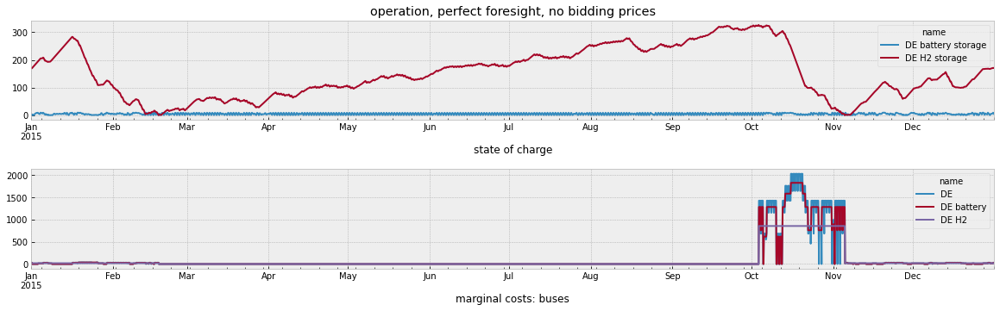

In [14]:
where='2015'

fig, (ax1,ax2) = plt.subplots(2,1, figsize=(20,5))
plt.subplots_adjust(top = 0.9, bottom=0.1, hspace=.5, wspace=0)

n_operation.stores_t.e.loc[where].plot(ax=ax1)
ax1.set_title('operation, perfect foresight, no bidding prices')
ax1.set_xlabel('state of charge')

n_operation.buses_t.marginal_price.loc[where].plot(ax=ax2)
ax2.set_xlabel('marginal costs: buses')

#fig.savefig(f'../plots/01-operation.jpeg')
plt.show()

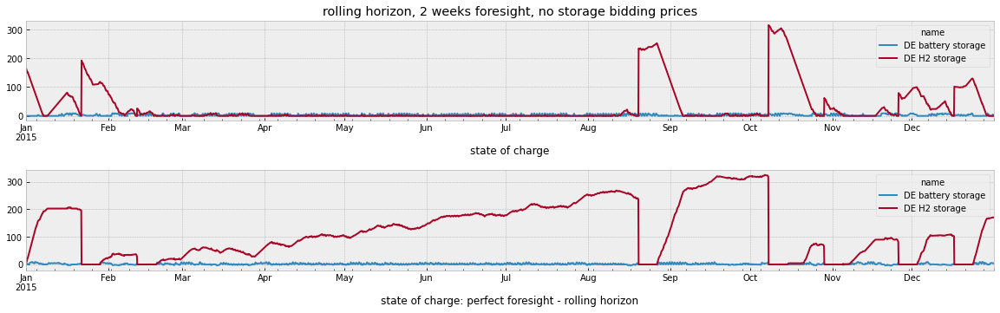

In [15]:
fig,(ax1,ax2) = plt.subplots(2,1, figsize=(20,5))
plt.subplots_adjust(top = 0.9, bottom=0.1, hspace=.5, wspace=0)

n_de_rh.stores_t.e.plot(ax=ax1)
ax1.set_title('rolling horizon, 2 weeks foresight, no storage bidding prices')
ax1.set_xlabel('state of charge')

(n_operation.stores_t.e-n_de_rh.stores_t.e).plot(ax=ax2)
ax2.set_xlabel('state of charge: perfect foresight - rolling horizon')

#fig.savefig(f'../plots/02-rh.jpeg')
plt.show()

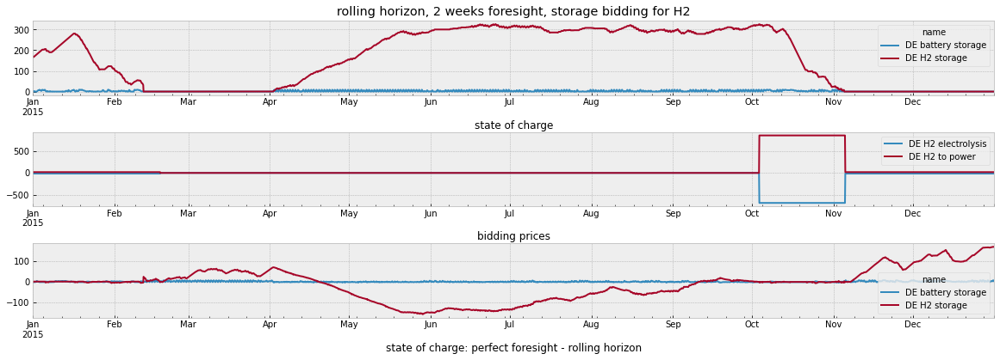

In [16]:
where='2015'

fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,6))
plt.subplots_adjust(top = 0.9, bottom=0.1, hspace=.5, wspace=0)

n_de_rh_2w_h2.stores_t.e.loc[where].plot(ax=ax1)
ax1.set_title('rolling horizon, 2 weeks foresight, storage bidding for H2')
ax1.set_xlabel('state of charge')

n_de_rh_2w_h2.links_t.marginal_cost.loc[where].plot(ax=ax2)
ax2.set_xlabel('bidding prices')

(n_operation.stores_t.e-n_de_rh_2w_h2.stores_t.e).plot(ax=ax3)
ax3.set_xlabel('state of charge: perfect foresight - rolling horizon')

#fig.savefig(f'../plots/03-rh-h2.jpeg')
plt.show()

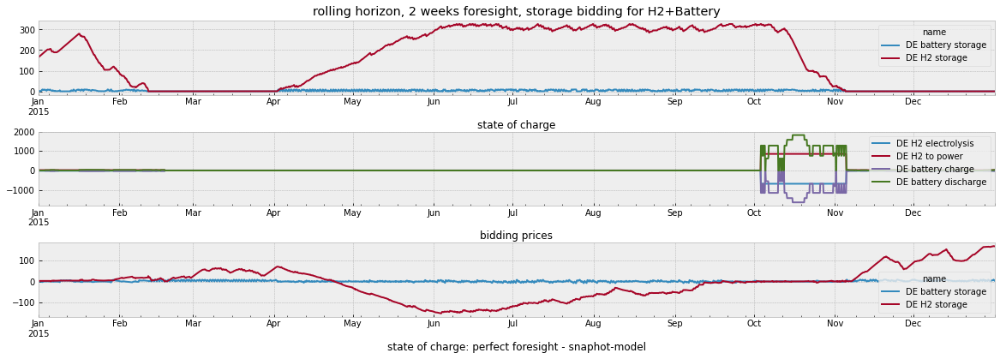

In [17]:
where='2015'

fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,6))
plt.subplots_adjust(top = 0.9, bottom=0.1, hspace=.5, wspace=0)

n_de_rh_2w_all.stores_t.e.loc[where].plot(ax=ax1)
ax1.set_title('rolling horizon, 2 weeks foresight, storage bidding for H2+Battery')
ax1.set_xlabel('state of charge')

n_de_rh_2w_all.links_t.marginal_cost.loc[where].plot(ax=ax2)
ax2.set_xlabel('bidding prices')

(n_operation.stores_t.e-n_de_rh_2w_all.stores_t.e).plot(ax=ax3)
ax3.set_xlabel('state of charge: perfect foresight - snaphot-model')

#fig.savefig(f'../plots/{version}/04-rh-h2+b.jpeg')
plt.show()

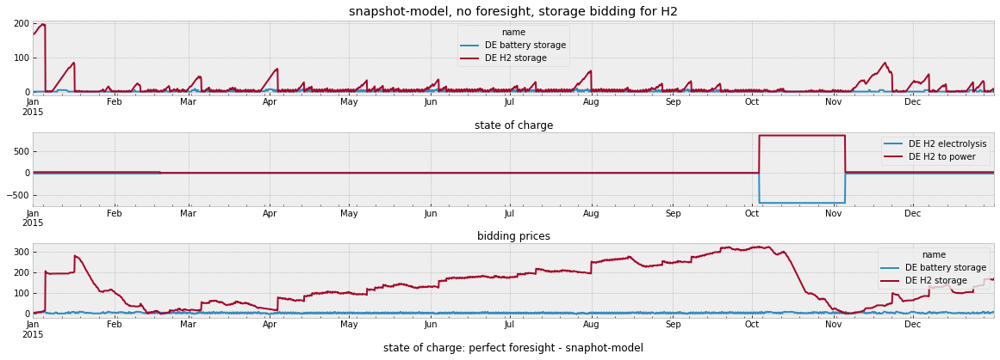

In [19]:
where='2015'

fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,6))
plt.subplots_adjust(top = 0.9, bottom=0.1, hspace=.5, wspace=0)

n_de_rh_sp_h2.stores_t.e.loc[where].plot(ax=ax1)
ax1.set_title('snapshot-model, no foresight, storage bidding for H2')
ax1.set_xlabel('state of charge')

n_de_rh_sp_h2.links_t.marginal_cost.loc[where].plot(ax=ax2)
ax2.set_xlabel('bidding prices')

(n_operation.stores_t.e-n_de_rh_sp_h2.stores_t.e).plot(ax=ax3)
ax3.set_xlabel('state of charge: perfect foresight - snaphot-model')

#fig.savefig(f'../plots/05-snapshot-h2.jpeg')
plt.show()

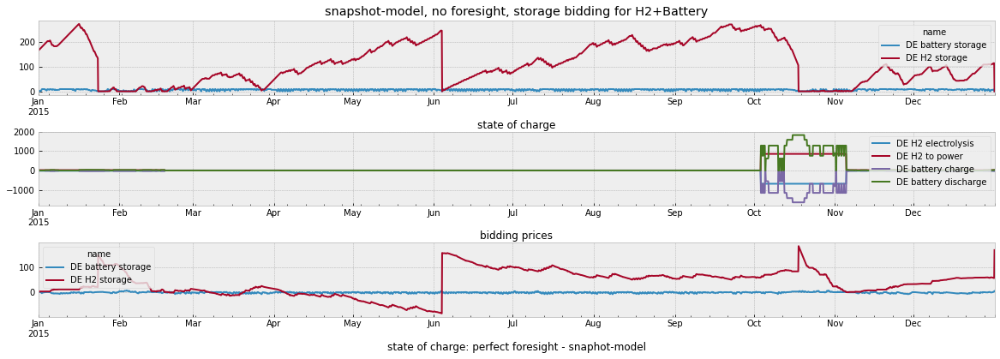

In [21]:
where='2015'

fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,6))
plt.subplots_adjust(top = 0.9, bottom=0.1, hspace=.5, wspace=0)

n_de_rh_sp_all.stores_t.e.loc[where].plot(ax=ax1)
ax1.set_title('snapshot-model, no foresight, storage bidding for H2+Battery')
ax1.set_xlabel('state of charge')

n_de_rh_sp_all.links_t.marginal_cost.loc[where].plot(ax=ax2)
ax2.set_xlabel('bidding prices')

(n_operation.stores_t.e-n_de_rh_sp_all.stores_t.e).plot(ax=ax3)
ax3.set_xlabel('state of charge: perfect foresight - snaphot-model')

#fig.savefig(f'../plots/06-snapshot-h2+b.jpeg')
plt.show()